###  Mount Google drive


In [1]:
from google.colab import drive
drive.mount._DEBUG = False
drive.mount('/content/gdrive/')
!ls /content/gdrive/'My Drive'/Deeplearning/RA_Work/NEMD_Simulations/all_data/1000_files/T293K

ModuleNotFoundError: No module named 'google.colab'

### unzip data

In [10]:
# unzip the data
'''
import zipfile
zip_ref = zipfile.ZipFile('/content/gdrive/My Drive/Deeplearning/RA_Work/NEMD_Simulations/all_data/T293K_1000_files_limit.zip', 'r')
zip_ref.extractall('/content/gdrive/My Drive/Deeplearning/RA_Work/NEMD_Simulations/all_data/1000_files/')
zip_ref.close()

'''

"\nimport zipfile\nzip_ref = zipfile.ZipFile('/content/gdrive/My Drive/Deeplearning/RA_Work/NEMD_Simulations/all_data/T293K_1000_files_limit.zip', 'r')\nzip_ref.extractall('/content/gdrive/My Drive/Deeplearning/RA_Work/NEMD_Simulations/all_data/1000_files/')\nzip_ref.close()\n\n"

In [5]:
!pwd

/cygdrive/e/archivedData/all.types


### Load all libs

In [1]:
#Lib imports
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patheffects as PathEffects
%matplotlib inline
plt.style.use('default')
import seaborn as sns
sns.set_style('darkgrid')
sns.set_palette('muted')
sns.set_context("notebook", font_scale=1.5, rc={"lines.linewidth": 2.5})
from sklearn.metrics import confusion_matrix
import sys, os, io, string, shutil, math
import glob
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.decomposition import FastICA 
from sklearn import preprocessing
import scipy.linalg as la
import re
#from tabulate import tabulate
from scipy import stats
import pickle
from sklearn.utils import shuffle
from collections import defaultdict

tf.__version__

'2.6.0'

## What is the average distance between 1-30 pair in 0.1MPa 1e7

In [2]:
def load_data_one_file(filepath):
    atoms_per_molecule = 30

    try:
        dump = np.loadtxt(filepath)
        print(filepath)
    except:
        sys.stderr.write('Can not find the dump file: ' + filepath )
        sys.exit(1)
        #print(density_profile) 

    #atomID, mol_group_id, atom_type, mass, atom_x, atom_y, atom_z
    #Sort by mol_group_id     
    dump =dump[dump[:,1].argsort()] 

    dump_org = []
    pairArray = []
    
    count_dict = defaultdict(int)
    
    for i in range(0,dump.shape[0],atoms_per_molecule):
        mol_data = dump[i:i+atoms_per_molecule,:]
        #sorting based on atom id inside the molecule
        mol_data = mol_data[mol_data[:,0].argsort()]
        #print("mol_group_id: " + str(mol_data[0,1]))
        #print("atomID: " + str(mol_data[0,0]))
        #print("atom_type: " + str(mol_data[0,2]))
        #print("atom_mass: " + str(mol_data[0,3]))
        #print("atom_x: " + str(mol_data[0,4]))
        #print("atom_y: " + str(mol_data[0,5]))
        #print("atom_z: " + str(mol_data[0,6]))
        #create pairs 
        dump_temp = []
        pairArray_temp = []
        
        for j in range(0,atoms_per_molecule,1):
            for k in range(j+1,atoms_per_molecule,1):
                #mol_group_id, atomID, atomID2, atom_type1,atom_type2, atom_x1, atom_y1, atom_z1, atom_x2, atom_y2, atom_z2
                dump_temp.append([mol_data[j,1],mol_data[j,0],mol_data[k,0],mol_data[j,2],mol_data[k,2],mol_data[j,4],mol_data[j,5],mol_data[j,6],mol_data[k,4],mol_data[k,5],mol_data[k,6]])
                pairArray_temp.append([mol_data[j,0], mol_data[k,0], mol_data[j,2], mol_data[k,2]])
                
                
                
        if i==0:
            dump_org = np.array([dump_temp])
            pairArray = np.array(pairArray_temp)
        else:
            dump_org = np.append(dump_org, np.array([dump_temp]), axis=0)

    print(dump_org.shape)
    return dump_org , pairArray

In [3]:
temp_path = '1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.100000000'
dump_org , pairArray = load_data_one_file(temp_path)

avg_dist = 0
for ind in range(dump_org.shape[0]):
    dump = dump_org[ind,28,:]
    dump_xx_dist = (dump[5] - dump[8])**2
    dump_yy_dist = (dump[6] - dump[9])**2
    dump_zz_dist = (dump[7] - dump[10])**2
    
    avg_dist += np.sqrt(dump_xx_dist + dump_yy_dist + dump_zz_dist)

print(avg_dist/dump_org.shape[0])

1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.100000000
(125, 435, 11)
18.41038399331484


### Distance vector fomulation

In [4]:
def compute_distance_tensor(dump):

    dump_xx_dist = dump[5] - dump[8]
    dump_yy_dist = dump[6] - dump[9]
    dump_zz_dist = dump[7] - dump[10]
    
    dump_xx_dist_sqd = dump_xx_dist*dump_xx_dist
    dump_yy_dist_sqd = dump_yy_dist*dump_yy_dist
    dump_zz_dist_sqd = dump_zz_dist*dump_zz_dist
    
    distance_sqrd = dump_xx_dist_sqd + dump_yy_dist_sqd + dump_zz_dist_sqd

    xx_order = (3.0/2.0)*(dump_xx_dist_sqd/distance_sqrd - 1.0/3.0)
    yy_order = (3.0/2.0)*(dump_yy_dist_sqd/distance_sqrd - 1.0/3.0)
    zz_order = (3.0/2.0)*(dump_zz_dist_sqd/distance_sqrd - 1.0/3.0)
    
    cutoffbadchain = 25000
    
    if (xx_order > cutoffbadchain or yy_order > cutoffbadchain or zz_order > cutoffbadchain):
        print (xx_order,yy_order,zz_order )
      
    dump_xy_dist_sqd = dump_xx_dist*dump_yy_dist
    dump_yz_dist_sqd = dump_yy_dist*dump_zz_dist
    dump_zx_dist_sqd = dump_zz_dist*dump_xx_dist
    
    xy_order = (3.0/2.0)*dump_xy_dist_sqd/distance_sqrd
    yz_order = (3.0/2.0)*dump_yz_dist_sqd/distance_sqrd
    zx_order = (3.0/2.0)*dump_zx_dist_sqd/distance_sqrd

    return np.array([ distance_sqrd, xx_order, yy_order, zz_order, xy_order, yz_order, zx_order])

def compute_distance_tensor2(dump):

    dump_xx_dist = dump[5] - dump[8]
    dump_yy_dist = dump[6] - dump[9]
    dump_zz_dist = dump[7] - dump[10]
    
    dump_xx_dist_sqd = dump_xx_dist*dump_xx_dist
    dump_yy_dist_sqd = dump_yy_dist*dump_yy_dist
    dump_zz_dist_sqd = dump_zz_dist*dump_zz_dist
    
    distance_sqrd = dump_xx_dist_sqd + dump_yy_dist_sqd + dump_zz_dist_sqd

    xx_order = dump_xx_dist_sqd/distance_sqrd
    yy_order = dump_yy_dist_sqd/distance_sqrd
    zz_order = dump_zz_dist_sqd/distance_sqrd
    
    dump_xy_dist_sqd = dump_xx_dist*dump_yy_dist
    dump_yz_dist_sqd = dump_yy_dist*dump_zz_dist
    dump_zx_dist_sqd = dump_zz_dist*dump_xx_dist
    
    xy_order = dump_xy_dist_sqd/distance_sqrd
    yz_order = dump_yz_dist_sqd/distance_sqrd
    zx_order = dump_zx_dist_sqd/distance_sqrd

    return np.array([ distance_sqrd, xx_order, yy_order, zz_order, xy_order, yz_order, zx_order])

### Load data from data file

In [9]:
# Function definition for reading and converting
def load_data(filepath):
    atoms_per_molecule = 30

    try:
        dump = np.loadtxt(filepath)
        print(filepath)
    except:
        sys.stderr.write('Can not find the dump file: ' + filepath )
        sys.exit(1)
        #print(density_profile) 

    #atomID, mol_group_id, atom_type, mass, atom_x, atom_y, atom_z
    #Sort by mol_group_id     
    dump =dump[dump[:,1].argsort()] 

    dump_org = []
    pairArray = []
    
    count_dict = defaultdict(int)
    
    for i in range(0,dump.shape[0],atoms_per_molecule):
        mol_data = dump[i:i+atoms_per_molecule,:]
        #sorting based on atom id inside the molecule
        mol_data = mol_data[mol_data[:,0].argsort()]
        #print("mol_group_id: " + str(mol_data[0,1]))
        #print("atomID: " + str(mol_data[0,0]))
        #print("atom_type: " + str(mol_data[0,2]))
        #print("atom_mass: " + str(mol_data[0,3]))
        #print("atom_x: " + str(mol_data[0,4]))
        #print("atom_y: " + str(mol_data[0,5]))
        #print("atom_z: " + str(mol_data[0,6]))
        #create pairs 
        dump_temp = []
        
        #atom_index_for_distance_messure = 15 # Better to use all atoms and get average?
        #distance_allowed = 11.73*2.0  #11.73 is 1/3 of the molecule length (35.19/3)
        distance_allowed = 18.41 *4.0 # This number is based on  What is the average distance between 1-30 pair in 0.1MPa 1e7
        
        if i==0:
            # This is just to get pair labels similar to previous study
            for j in range(0,atoms_per_molecule,1):
                for k in range(0,atoms_per_molecule,1):
                #mol_group_id, atomID, atomID2, atom_type1,atom_type2, atom_x1, atom_y1, atom_z1, atom_x2, atom_y2, atom_z2
                    pairArray.append([mol_data[j,0], mol_data[k,0], mol_data[j,2], mol_data[k,2]])
        
        
        for inter in range(0,dump.shape[0],atoms_per_molecule):
            
            if inter == i: # we dont need intra pair here but we will put zeros to fill in otherwise it will be hard to get averages
                continue
            
            mol_data_inter = dump[inter:inter+atoms_per_molecule,:]
            #sorting based on atom id inside the molecule
            mol_data_inter = mol_data_inter[mol_data_inter[:,0].argsort()]
            
            all_atom_avg_inter_dist = np.mean(np.sqrt(np.sum((mol_data_inter[:,4:7] - mol_data[:,4:7])**2,axis=1)), axis=0)
            
            
            if distance_allowed>=all_atom_avg_inter_dist:
                count_dict[int(mol_data[0,1])]+=1
                #print(all_atom_avg_inter_dist)
                
                dump_temp_inter = []
                
                for j in range(0,atoms_per_molecule,1):
                    for k in range(0,atoms_per_molecule,1):
                        #########mol_group_id, atomID, atomID2, atom_type1,atom_type2, 
                        #########atom_x1, atom_y1, atom_z1, atom_x2, atom_y2, atom_z2
                        dump_ = [mol_data[j,1],mol_data[j,0],mol_data_inter[k,0],mol_data[j,2],mol_data_inter[k,2],
                                 mol_data[j,4],mol_data[j,5],mol_data[j,6],
                                 mol_data_inter[k,4],mol_data_inter[k,5],mol_data_inter[k,6]]
                        
                        dump_temp_inter.append(compute_distance_tensor(dump_))
                        
                dump_temp.append(dump_temp_inter)
                  
        
        if count_dict[int(mol_data[0,1])]:
            dump_temp = np.array(dump_temp)
            #print(dump_temp.shape)
            dump_temp = np.mean(dump_temp, axis=0)
            dump_org.append(dump_temp)

            

    dump_org = np.array(dump_org)
    
    freq = np.array(list(count_dict.values()))
    freq= freq[freq != 0]  # Remove 0
    print("There were {} molecules saw {} neighbors in average: {}".format(freq.shape[0],np.mean(freq), dump_org.shape))  
    return dump_org , pairArray


In [7]:
path_ = '1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1800000000'
#path_ = '1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1700100000'

dump_org , pairArray = load_data(path_)
print(dump_org.shape)
#print(len(pairArray))

1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1800000000
There were 6 molecules saw 1.0 neighbors in average: (6, 900, 7)
(6, 900, 7)


In [8]:

temp_paths = ['1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.223000000',
             '1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.5300000000',
              '1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.4200000000',
              '1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1800000000',
              '1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.900000000',
              '1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.60000000',
              '1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.30000000',
              '1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.6000000',
             ]


temp_paths = temp_paths+ ['1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.550000000',
              '1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.6100000000',
             '1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.3100000000',
              '1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.3100000000',
              '1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.600000000',
              '1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.300000000',
              '1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.60000000',
              '1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.30000000',
              '1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.6000000',
             ]


temp_paths = temp_paths+ ['1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1318000000',
              '1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.6381000000',
              '1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.6750000000',
             '1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.3600000000',
              '1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.3570000000',
              '1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.600000000',
              '1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.300000000',
              '1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.60000000',
              '1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.30000000',
              '1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.6000000',
             ]


for path_ in temp_paths:
    
    dump_org , pairArray = load_data(path_)
    print(dump_org.shape)
    #print(len(pairArray))

1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.223000000
There were 125 molecules saw 40.864 neighbors in average: (125, 900, 7)
(125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.5300000000
There were 8 molecules saw 1.0 neighbors in average: (8, 900, 7)
(8, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.4200000000
There were 8 molecules saw 1.0 neighbors in average: (8, 900, 7)
(8, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1800000000
There were 6 molecules saw 1.0 neighbors in average: (6, 900, 7)
(6, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.900000000
There were 9 molecules saw 1.1111111111111112 neighbors in average: (9, 900, 7)
(9, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.60000000
There were 93 molecules saw 2.236559139784946 neighbors in average: (93, 900, 7)
(93, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.30000000
There were 98 molecules saw 2.1020408163265305 nei

### Load and organize input data

In [10]:
def tryint(s):
    try:
        return int(s)
    except ValueError:
        return s
     
def alphanum_key(s):
    """ Turn a string into a list of string and number chunks.
        "z23a" -> ["z", 23, "a"]
    """
    return [ tryint(c) for c in re.split('([0-9]+)', s) ]

In [11]:
def generate_input_data_with_time(dir_names, text_split_ind=None):
    sc = preprocessing.MinMaxScaler()
    #loading all data to 4D array
    array1 = []
    array1_time_series = {}
    ylabel = []
    pairlabel = []
    ylabel_text = []
    for i in range(len(dir_names)):
        array2 = []
        array2_time_series = []
        factor_ = 2
        data_list_tmp = sorted(glob.glob(dir_names[i]+"/data*"), key=alphanum_key)
        #data_list_tmp = data_list_tmp[-(len(data_list_tmp)//factor_):]
        files = [f for f in data_list_tmp]
        if len(files) > 0 :
            j_count = 0
            for j in range(len(files)):      
                dump, pairArray = load_data(files[j])
                #print(pairArray)
                #if Nans are there ignore the whole file
                if (np.any(np.isnan(dump))):
                    continue
                
                # if no molecules saw any other in the visinity for this timesample, ignore that
                if (dump.shape[0]==0):
                    continue
                
                # Averaging over Not molecules 125 items: Which ever molecules found at least one molecule in the visinity
                dump_dist_mat = np.mean(dump, axis=0)
                dump = dump_dist_mat
                # Min Max normalization
                #dump = sc.fit_transform(dump_dist_mat)
                
                if j_count==0:
                    array2 = dump
                    array2_time_series = np.array([dump])
                else:    
                    array2 = array2 + dump
                    array2_time_series = np.append(array2_time_series, np.array([dump]), axis=0)
                    
                j_count += 1
                    
                #break
            #Averaging the features for the same dir / time steps.
            array2 = array2 / len(files)
            
            dir_name_str = dir_names[i].replace("\\","/")
            if not text_split_ind:
                text_split_ind = len(dir_name_str.split('/'))-2
            if dir_name_str.split('/'):   
                ylabel_text.append(dir_name_str.split('/')[text_split_ind] +"_" + dir_name_str.split('/')[text_split_ind+1])
                
            array1_time_series[ylabel_text[i]] = array2_time_series
            
            if i==0:
                #array1 = np.array([array2])
                array1 = array2
                ylabel = np.full( array2.shape[0], i)
                pairlabel = pairArray
            else:
                #array1 = np.append(array1, np.array([array2]), axis=0)
                array1 = np.append(array1, array2, axis=0)
                ylabel = np.append(ylabel, np.full( array2.shape[0], i), axis=0)
                pairlabel = np.append(pairlabel, pairArray, axis=0)
            
            
            #break
        else:
            print("Each folder ("+dir_names[i]+") must contain atleast 1 data file")
            break
    
    return array1, array1_time_series, ylabel, ylabel_text, pairlabel  


### Create average from time series data


In [12]:
def average_from_time_series(arr_time_series, data_limit = 100):

  controlled_avg = []
  for key, value in arr_time_series.items():
    controlled_avg.append(np.mean(value[-data_limit:], axis=0))

  controlled_avg = np.reshape(np.array(controlled_avg), (-1,7))
  
  return controlled_avg

### Plot 2D data

In [13]:
def scatterPlot(x, colors, ylabel_text, pairlabel, titleText):
    # choose a color palette with seaborn.
    num_classes = len(np.unique(colors))
    palette = np.array(sns.color_palette("hls", num_classes))

    # create a scatter plot.
    f = plt.figure(figsize=(20, 20))
    
    for label in range(num_classes):
      plt.scatter(x[colors == label, 0], x[colors == label, 1], color=palette[label], label=str(ylabel_text[label]))
    
    #ax = plt.subplot(aspect='equal')
    #sc = ax.scatter(x[:,0], x[:,1], lw=0, s=40, c=palette[colors.astype(np.int)])
    #plt.xlim(-25, 25)
    #plt.ylim(-25, 25)
    plt.suptitle(titleText) 
    #plt.legend()
    plt.axis('off')
    plt.axis('tight')

    # add the labels for each digit corresponding to the label
    txts = []

    for i in range(num_classes):

        # Position of each label at median of data points.
        xtext, ytext = np.median(x[colors == i, :], axis=0)
        #txt = plt.text(xtext, ytext, str(ylabel_text[i].split('_')[1].split('sr')[1]), fontsize=20)
        txt = plt.text(xtext, ytext, str(ylabel_text[i]), fontsize=20)
        txt.set_path_effects([
            PathEffects.Stroke(linewidth=4, foreground="w"),
            PathEffects.Normal()])
        txts.append(txt)
        
        
    #Plot the pair texts
    for i in range(0,len(pairlabel),44):
        plt.text(x[i, 0], x[i, 1], str(str(int(pairlabel[i,0])) + "-" + str(int(pairlabel[i,1]))), fontsize=12)
    
    #Plot the pair texts
    for i in range(0,len(pairlabel),int(len(pairlabel)/4)):
        shift=28
        plt.text(x[i+shift, 0], x[i+shift, 1], str(str(int(pairlabel[i+shift,0]))+ "-" + str(int(pairlabel[i+shift,1]))), fontsize=12)
    
    
    return f, plt, txts
    #return f, ax, sc, txts
      

### Following two functions are for order parameter and flow angle computation

In [14]:
#function for creating 3x3 matrix from 7 dims : distance_sqrd, xx_order, yy_order, zz_order, xy_order, yz_order, zx_order
def create_3_3_matrix(input_data):
    output = []
    for i in range(input_data.shape[0]):
        temp = np.array([[input_data[i][1],input_data[i][4],input_data[i][6],input_data[i][4],input_data[i][2],input_data[i][5],input_data[i][6],input_data[i][5],input_data[i][3]]])
        temp = np.reshape(temp, (-1,3,3))
        if i==0:
            output = temp
        else:
            output = np.append(output, temp, axis=0)
    return output

def print_eignvalues_for_a_pair(input_data, ylabel_text, pair_choise = 28):
  test = input_data[[i+pair_choise for i in range(0, input_data.shape[0], int(input_data.shape[0]/len(ylabel_text)))]]
  for i in range (len(ylabel_text)):
    data_for_eigen = create_3_3_matrix(test)
    print("Data for: ", ylabel_text[i])
    print("Distance sqd matrix: ")
    print(data_for_eigen[i])
    #The normalized (unit “length”) eigenvectors, 
    #such that the column v[:,i] is the eigenvector corresponding to the eigenvalue w[i].
    u, V = la.eigh(data_for_eigen[i])
    #print(np.abs(np.dot(V,np.dot(np.diag(u), la.inv(V)))))
    print("Eigen values: ")
    print(u)
    print("Eigen vectors: ")
    print(V)
    cos_inv_vals = np.degrees(np.arccos(V))
    cos_inv_vals[cos_inv_vals > 90] = 180 - cos_inv_vals[cos_inv_vals > 90]
    print("Eigen vectors in degress: ")
    print(cos_inv_vals)
    print("------------------------------------------------")

In [0]:
!ls /content/gdrive/'My Drive'/Deeplearning/RA_Work/data_set/P0.1MPa/sr2e7


### Email notification

In [15]:
import smtplib, ssl
def send_notofication():
    port = 465  # For SSL
    smtp_server = "smtp.gmail.com"
    sender_email = "kadupitiya.mail@gmail.com"  # Enter your address
    receiver_email = "kadupitiya@kadupitiya.lk"  # Enter receiver address
    password ="kadu@123"
    #password = input("Type your password and press enter: ")
    message = """\
    Subject: Hi there
    
    This message is sent from Python notebook, work done."""
    
    context = ssl.create_default_context()
    with smtplib.SMTP_SSL(smtp_server, port, context=context) as server:
        server.login(sender_email, password)
        server.sendmail(sender_email, receiver_email, message)

In [23]:
send_notofication()

### Clean files in a folder

In [16]:
def clean_input_data(dir_names):
    p_data_list = sorted(glob.glob(dir_names+"/*"), key=alphanum_key)
    #print(p_data_list)
    for i in range(len(p_data_list)):
        sr_data_list = sorted(glob.glob(p_data_list[i]+"/*"), key=alphanum_key)
        #print(sr_data_list)
        for j in range(len(sr_data_list)):
            files_data_list = sorted(glob.glob(sr_data_list[j]+"/*"), key=alphanum_key)
            #print(files_data_list)
            for k in range(len(files_data_list)):
                file11 = files_data_list[k]
                #print(file11)
                with open(file11, 'r') as fin:
                    data = fin.read().splitlines(True)
                if data[0] == 'ITEM: TIMESTEP\n':
                    with open(file11, 'w') as fout:
                        fout.writelines(data[9:])
                    
def print_dir_sizes(dir_names):
    p_data_list = sorted(glob.glob(dir_names+"/*"), key=alphanum_key)
    #print(p_data_list)
    for i in range(len(p_data_list)):
        sr_data_list = sorted(glob.glob(p_data_list[i]+"/*"), key=alphanum_key)
        #print(sr_data_list)
        for j in range(len(sr_data_list)):
            files_data_list = sorted(glob.glob(sr_data_list[j]+"/*"), key=alphanum_key)
            if len(files_data_list) >= 1000:
                print(len(files_data_list))

In [20]:
root_path= '1000_files_zero_rates/T293K'

folder_list, files_list = get_all_dir_names(root_path)
#clean_input_data(root_path)
#print_dir_sizes(root_path)

['1000_files_zero_rates/T293K\\P0.1MPa', '1000_files_zero_rates/T293K\\P100MPa', '1000_files_zero_rates/T293K\\P400MPa', '1000_files_zero_rates/T293K\\P636MPa', '1000_files_zero_rates/T293K\\P875MPa', '1000_files_zero_rates/T293K\\P955MPa']
['1000_files_zero_rates/T293K\\P0.1MPa\\sr0', '1000_files_zero_rates/T293K\\P0.1MPa\\sr1e7', '1000_files_zero_rates/T293K\\P0.1MPa\\sr1e8', '1000_files_zero_rates/T293K\\P0.1MPa\\sr1e9', '1000_files_zero_rates/T293K\\P0.1MPa\\sr1e10', '1000_files_zero_rates/T293K\\P0.1MPa\\sr2e7', '1000_files_zero_rates/T293K\\P0.1MPa\\sr2e8', '1000_files_zero_rates/T293K\\P0.1MPa\\sr2e9']
['1000_files_zero_rates/T293K\\P100MPa\\sr0', '1000_files_zero_rates/T293K\\P100MPa\\sr1e7', '1000_files_zero_rates/T293K\\P100MPa\\sr1e8', '1000_files_zero_rates/T293K\\P100MPa\\sr1e9', '1000_files_zero_rates/T293K\\P100MPa\\sr1e10', '1000_files_zero_rates/T293K\\P100MPa\\sr2e7', '1000_files_zero_rates/T293K\\P100MPa\\sr2e8', '1000_files_zero_rates/T293K\\P100MPa\\sr2e9', '1000_f

### reduce datasize per folder

In [17]:
def reduce_input_data(dir_names):
    file_limit = 1000
    p_data_list = sorted(glob.glob(dir_names+"/*"), key=alphanum_key)
    print(p_data_list)
    for i in range(len(p_data_list)):
        sr_data_list = sorted(glob.glob(p_data_list[i]+"/*"), key=alphanum_key)
        print(sr_data_list)
        for j in range(len(sr_data_list)):
            files_data_list = sorted(glob.glob(sr_data_list[j]+"/*"), key=alphanum_key)
            #print(files_data_list)
            if file_limit < len(files_data_list):
                keep_indexes = np.linspace(0, len(files_data_list)-1, file_limit, endpoint=True).astype(int).tolist()
                print(keep_indexes)
                for k in range(len(files_data_list)):
                    if k not in keep_indexes:
                        print(files_data_list[k])
                        os.remove(files_data_list[k])
                        
def reduce_input_data_first_N_only(dir_names):
    file_limit = 1000
    p_data_list = sorted(glob.glob(dir_names+"/*"), key=alphanum_key)
    print(p_data_list)
    for i in range(len(p_data_list)):
        sr_data_list = sorted(glob.glob(p_data_list[i]+"/*"), key=alphanum_key)
        print(sr_data_list)
        for j in range(len(sr_data_list)):
            files_data_list = sorted(glob.glob(sr_data_list[j]+"/*"), key=alphanum_key)
            #print(files_data_list)
            if file_limit < len(files_data_list):
                #keep_indexes = np.linspace(0, len(files_data_list)-1, file_limit, endpoint=True).astype(int).tolist()
                keep_indexes = np.linspace(0, 999, 1000, endpoint=True).astype(int).tolist()
                print(keep_indexes)
                for k in range(len(files_data_list)):
                    if k not in keep_indexes:
                        print(files_data_list[k])
                        os.remove(files_data_list[k])

In [18]:
root_path= '1000_files_zero_rates/T293K'

#folder_list, files_list = get_all_dir_names(root_path)
#reduce_input_data_first_N_only(root_path)
#reduce_input_data(root_path)

### Load the data and save a pk file

In [21]:
def clean_input_data(dir_names):
    file_limit = 20
    p_data_list = sorted(glob.glob(dir_names+"/*"), key=alphanum_key)
    print(p_data_list)
    for i in range(len(p_data_list)):
        sr_data_list = sorted(glob.glob(p_data_list[i]+"/*"), key=alphanum_key)
        print(sr_data_list)
        for j in range(len(sr_data_list)):
            files_data_list = sorted(glob.glob(sr_data_list[j]+"/*"), key=alphanum_key)
            #print(files_data_list)
            if file_limit < len(files_data_list):
                keep_indexes = np.linspace(0, len(files_data_list)-1, file_limit, endpoint=True).astype(int).tolist()
                print(keep_indexes)
                for k in range(len(files_data_list)):
                    if k not in keep_indexes:
                        print(files_data_list[k])
                        os.remove(files_data_list[k])
                        

def get_all_dir_names(root_path):
    folder_list = []
    files_list = []
    p_data_list = sorted(glob.glob(root_path+"/*"), key=alphanum_key)
    print(p_data_list)
    for i in range(len(p_data_list)):
        sr_data_list = sorted(glob.glob(p_data_list[i]+"/*"), key=alphanum_key)
        print(sr_data_list)
        for j in range(len(sr_data_list)):
          folder_list.append(sr_data_list[j])
          files_list = files_list + sorted(glob.glob(sr_data_list[j]+"/*"), key=alphanum_key)
            
    return (folder_list, files_list)                

def get_all_dir_names_with_file_dic(root_path):
    folder_list = []
    files_list = []
    files_dic = {}
    p_data_list = sorted(glob.glob(root_path+"/*"), key=alphanum_key)
    print(p_data_list)
    for i in range(len(p_data_list)):
        sr_data_list = sorted(glob.glob(p_data_list[i]+"/*"), key=alphanum_key)
        print(sr_data_list)
        for j in range(len(sr_data_list)):
          dic_name = sr_data_list[j].split('\\')[-2] +"_"+sr_data_list[j].split('\\')[-1]
          folder_list.append(sr_data_list[j])
          file_list_temp = sorted(glob.glob(sr_data_list[j]+"/*"), key=alphanum_key)
          file_time_step_temp = []
          for k in range(len(file_list_temp)):
             file_time_step_temp.append(file_list_temp[k].split('data.rg.all.')[-1])  
          files_dic[dic_name] = file_time_step_temp
          files_list = files_list + file_list_temp
            
    return (folder_list, files_list, files_dic) 

#root_path= 'content/gdrive/My Drive/Deeplearning/RA_Work/NEMD_Simulations/all_data/1000_files/T293K'
root_path= '1000_files_zero_rates/T293K'

#folder_list, files_list = get_all_dir_names(root_path)
folder_list, files_list, files_dic = get_all_dir_names_with_file_dic(root_path)

['1000_files_zero_rates/T293K\\P0.1MPa', '1000_files_zero_rates/T293K\\P100MPa', '1000_files_zero_rates/T293K\\P400MPa', '1000_files_zero_rates/T293K\\P636MPa', '1000_files_zero_rates/T293K\\P875MPa', '1000_files_zero_rates/T293K\\P955MPa']
['1000_files_zero_rates/T293K\\P0.1MPa\\sr0', '1000_files_zero_rates/T293K\\P0.1MPa\\sr1e7', '1000_files_zero_rates/T293K\\P0.1MPa\\sr1e8', '1000_files_zero_rates/T293K\\P0.1MPa\\sr1e9', '1000_files_zero_rates/T293K\\P0.1MPa\\sr1e10', '1000_files_zero_rates/T293K\\P0.1MPa\\sr2e7', '1000_files_zero_rates/T293K\\P0.1MPa\\sr2e8', '1000_files_zero_rates/T293K\\P0.1MPa\\sr2e9']
['1000_files_zero_rates/T293K\\P100MPa\\sr0', '1000_files_zero_rates/T293K\\P100MPa\\sr1e7', '1000_files_zero_rates/T293K\\P100MPa\\sr1e8', '1000_files_zero_rates/T293K\\P100MPa\\sr1e9', '1000_files_zero_rates/T293K\\P100MPa\\sr1e10', '1000_files_zero_rates/T293K\\P100MPa\\sr2e7', '1000_files_zero_rates/T293K\\P100MPa\\sr2e8', '1000_files_zero_rates/T293K\\P100MPa\\sr2e9', '1000_f

### Saving datadump with files

In [22]:
#base_path = 'content/gdrive/My Drive/Deeplearning/RA_Work/NEMD_Simulations/all_data/1000_files/'
base_path = '1000_files_zero_rates/'
dir_names= folder_list
#dir_names = ['content/gdrive/My Drive/Deeplearning/RA_Work/NEMD_Simulations/all_data/1000_files/T293K/P6000MPa/sr1e8/','content/gdrive/My Drive/Deeplearning/RA_Work/NEMD_Simulations/all_data/1000_files/T293K/P6000MPa/sr8e10/']
data_dump =arr, arr_time_series, ylabel, ylabel_text, pairlabel = generate_input_data_with_time(dir_names)

with open(base_path+ 'data_dump_inter_molecular_18.5x4.0.pk', 'wb') as handle:
    pickle.dump(data_dump, handle, protocol=pickle.HIGHEST_PROTOCOL)
    
send_notofication()

1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.123100000
There were 125 molecules saw 64.464 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.123200000
There were 125 molecules saw 64.624 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.123300000
There were 125 molecules saw 64.464 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.123400000
There were 125 molecules saw 64.272 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.123500000
There were 125 molecules saw 64.56 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.123600000
There were 125 molecules saw 64.24 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.123700000
There were 125 molecules saw 64.224 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.123800000
Th

There were 125 molecules saw 64.32 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.129300000
There were 125 molecules saw 63.984 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.129400000
There were 125 molecules saw 64.048 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.129500000
There were 125 molecules saw 64.016 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.129600000
There were 125 molecules saw 64.208 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.129700000
There were 125 molecules saw 63.712 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.129800000
There were 125 molecules saw 63.488 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.129900000
There were 125 molecules saw 63.824 neighbors in average: (125,

1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.135400000
There were 125 molecules saw 62.384 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.135500000
There were 125 molecules saw 62.496 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.135600000
There were 125 molecules saw 62.304 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.135700000
There were 125 molecules saw 61.856 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.135800000
There were 125 molecules saw 62.016 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.135900000
There were 125 molecules saw 62.272 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.136000000
There were 125 molecules saw 62.448 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.136100000


There were 125 molecules saw 60.576 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.141600000
There were 125 molecules saw 60.384 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.141700000
There were 125 molecules saw 60.464 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.141800000
There were 125 molecules saw 60.176 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.141900000
There were 125 molecules saw 60.08 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.142000000
There were 125 molecules saw 60.384 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.142100000
There were 125 molecules saw 60.432 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.142200000
There were 125 molecules saw 60.448 neighbors in average: (125,

1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.147700000
There were 125 molecules saw 58.672 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.147800000
There were 125 molecules saw 58.944 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.147900000
There were 125 molecules saw 58.624 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.148000000
There were 125 molecules saw 58.672 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.148100000
There were 125 molecules saw 58.464 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.148200000
There were 125 molecules saw 58.768 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.148300000
There were 125 molecules saw 58.832 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.148400000


There were 125 molecules saw 56.752 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.153900000
There were 125 molecules saw 56.416 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.154000000
There were 125 molecules saw 56.432 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.154100000
There were 125 molecules saw 56.4 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.154200000
There were 125 molecules saw 56.368 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.154300000
There were 125 molecules saw 56.096 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.154400000
There were 125 molecules saw 56.112 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.154500000
There were 125 molecules saw 55.568 neighbors in average: (125, 

There were 125 molecules saw 52.384 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.160100000
There were 125 molecules saw 52.224 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.160200000
There were 125 molecules saw 52.32 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.160300000
There were 125 molecules saw 51.936 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.160400000
There were 125 molecules saw 52.096 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.160500000
There were 125 molecules saw 52.192 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.160600000
There were 125 molecules saw 52.32 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.160700000
There were 125 molecules saw 51.872 neighbors in average: (125, 

1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.166200000
There were 125 molecules saw 52.208 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.166300000
There were 125 molecules saw 52.192 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.166400000
There were 125 molecules saw 52.016 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.166500000
There were 125 molecules saw 51.984 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.166600000
There were 125 molecules saw 52.128 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.166700000
There were 125 molecules saw 51.984 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.166800000
There were 125 molecules saw 52.16 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.166900000
T

There were 125 molecules saw 51.536 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.172400000
There were 125 molecules saw 51.52 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.172500000
There were 125 molecules saw 51.12 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.172600000
There were 125 molecules saw 51.056 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.172700000
There were 125 molecules saw 50.944 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.172800000
There were 125 molecules saw 51.088 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.172900000
There were 125 molecules saw 50.896 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.173000000
There were 125 molecules saw 50.848 neighbors in average: (125, 

1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.178500000
There were 125 molecules saw 50.0 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.178600000
There were 125 molecules saw 50.096 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.178700000
There were 125 molecules saw 50.112 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.178800000
There were 125 molecules saw 50.192 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.178900000
There were 125 molecules saw 50.176 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.179000000
There were 125 molecules saw 50.112 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.179100000
There were 125 molecules saw 50.352 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.179200000
Th

There were 125 molecules saw 48.384 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.184700000
There were 125 molecules saw 48.304 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.184800000
There were 125 molecules saw 48.352 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.184900000
There were 125 molecules saw 48.432 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.185000000
There were 125 molecules saw 48.576 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.185100000
There were 125 molecules saw 48.32 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.185200000
There were 125 molecules saw 48.48 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.185300000
There were 125 molecules saw 48.56 neighbors in average: (125, 9

1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.190800000
There were 125 molecules saw 47.328 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.190900000
There were 125 molecules saw 47.616 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.191000000
There were 125 molecules saw 47.504 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.191100000
There were 125 molecules saw 47.696 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.191200000
There were 125 molecules saw 47.536 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.191300000
There were 125 molecules saw 47.184 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.191400000
There were 125 molecules saw 47.28 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.191500000
T

There were 125 molecules saw 44.384 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.197000000
There were 125 molecules saw 44.368 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.197100000
There were 125 molecules saw 44.32 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.197200000
There were 125 molecules saw 44.048 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.197300000
There were 125 molecules saw 44.304 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.197400000
There were 125 molecules saw 44.08 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.197500000
There were 125 molecules saw 44.16 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.197600000
There were 125 molecules saw 44.32 neighbors in average: (125, 90

1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.203100000
There were 125 molecules saw 44.208 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.203200000
There were 125 molecules saw 44.32 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.203300000
There were 125 molecules saw 44.32 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.203400000
There were 125 molecules saw 44.256 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.203500000
There were 125 molecules saw 44.144 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.203600000
There were 125 molecules saw 44.4 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.203700000
There were 125 molecules saw 44.48 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.203800000
There

There were 125 molecules saw 43.024 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.209300000
There were 125 molecules saw 42.576 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.209400000
There were 125 molecules saw 42.8 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.209500000
There were 125 molecules saw 42.88 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.209600000
There were 125 molecules saw 42.784 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.209700000
There were 125 molecules saw 43.056 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.209800000
There were 125 molecules saw 42.848 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.209900000
There were 125 molecules saw 42.976 neighbors in average: (125, 9

There were 125 molecules saw 42.976 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.215500000
There were 125 molecules saw 42.8 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.215600000
There were 125 molecules saw 42.896 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.215700000
There were 125 molecules saw 42.96 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.215800000
There were 125 molecules saw 42.992 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.215900000
There were 125 molecules saw 43.168 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.216000000
There were 125 molecules saw 43.232 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.216100000
There were 125 molecules saw 43.296 neighbors in average: (125, 9

1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.221600000
There were 125 molecules saw 41.744 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.221700000
There were 125 molecules saw 41.776 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.221800000
There were 125 molecules saw 41.744 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.221900000
There were 125 molecules saw 41.68 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.222000000
There were 125 molecules saw 41.616 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.222100000
There were 125 molecules saw 41.488 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.222200000
There were 125 molecules saw 41.472 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr0\data.rg.all.222300000
T

There were 106 molecules saw 4.660377358490566 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.770000000
There were 108 molecules saw 4.148148148148148 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.780000000
There were 110 molecules saw 4.054545454545455 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.800000000
There were 108 molecules saw 4.018518518518518 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.820000000
There were 105 molecules saw 3.8095238095238093 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.830000000
There were 104 molecules saw 3.6153846153846154 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.850000000
There were 102 molecules saw 3.450980392156863 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P0.1M

1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.1650000000
There were 66 molecules saw 1.7272727272727273 neighbors in average: (66, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.1660000000
There were 55 molecules saw 1.7818181818181817 neighbors in average: (55, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.1680000000
There were 54 molecules saw 1.5925925925925926 neighbors in average: (54, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.1690000000
There were 55 molecules saw 1.6363636363636365 neighbors in average: (55, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.1710000000
There were 64 molecules saw 1.59375 neighbors in average: (64, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.1730000000
There were 57 molecules saw 1.7543859649122806 neighbors in average: (57, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.1740000000
There were 53 molecules saw 1.7735849056603774 neighbors in aver

There were 33 molecules saw 1.0909090909090908 neighbors in average: (33, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.2560000000
There were 31 molecules saw 1.096774193548387 neighbors in average: (31, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.2570000000
There were 28 molecules saw 1.1428571428571428 neighbors in average: (28, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.2590000000
There were 31 molecules saw 1.1612903225806452 neighbors in average: (31, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.2600000000
There were 33 molecules saw 1.0909090909090908 neighbors in average: (33, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.2620000000
There were 30 molecules saw 1.1333333333333333 neighbors in average: (30, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.2630000000
There were 30 molecules saw 1.1333333333333333 neighbors in average: (30, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\s

There were 32 molecules saw 1.125 neighbors in average: (32, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3227000000
There were 27 molecules saw 1.037037037037037 neighbors in average: (27, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3228000000
There were 27 molecules saw 1.1111111111111112 neighbors in average: (27, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3230000000
There were 24 molecules saw 1.1666666666666667 neighbors in average: (24, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3231000000
There were 26 molecules saw 1.1538461538461537 neighbors in average: (26, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3233000000
There were 23 molecules saw 1.1304347826086956 neighbors in average: (23, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3234000000
There were 25 molecules saw 1.12 neighbors in average: (25, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3236000000

There were 21 molecules saw 1.0476190476190477 neighbors in average: (21, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3317000000
There were 21 molecules saw 1.0476190476190477 neighbors in average: (21, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3319000000
There were 21 molecules saw 1.0476190476190477 neighbors in average: (21, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3321000000
There were 19 molecules saw 1.0526315789473684 neighbors in average: (19, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3322000000
There were 22 molecules saw 1.0909090909090908 neighbors in average: (22, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3324000000
There were 26 molecules saw 1.0769230769230769 neighbors in average: (26, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3325000000
There were 24 molecules saw 1.0833333333333333 neighbors in average: (24, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\

1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3407000000
There were 19 molecules saw 1.0526315789473684 neighbors in average: (19, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3408000000
There were 19 molecules saw 1.0526315789473684 neighbors in average: (19, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3410000000
There were 13 molecules saw 1.0769230769230769 neighbors in average: (13, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3412000000
There were 13 molecules saw 1.0769230769230769 neighbors in average: (13, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3413000000
There were 11 molecules saw 1.0909090909090908 neighbors in average: (11, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3415000000
There were 9 molecules saw 1.1111111111111112 neighbors in average: (9, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3416000000
There were 9 molecules saw 1.1111111111111112 neighbors

There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3498000000
There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3499000000
There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3501000000
There were 14 molecules saw 1.0 neighbors in average: (14, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3502000000
There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3504000000
There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3506000000
There were 12 molecules saw 1.0 neighbors in average: (12, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3507000000
There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_file

1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3595000000
There were 14 molecules saw 1.0 neighbors in average: (14, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3596000000
There were 14 molecules saw 1.0 neighbors in average: (14, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3598000000
There were 14 molecules saw 1.0 neighbors in average: (14, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3600000000
There were 14 molecules saw 1.0 neighbors in average: (14, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3601000000
There were 12 molecules saw 1.0 neighbors in average: (12, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3603000000
There were 12 molecules saw 1.0 neighbors in average: (12, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3604000000
There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3606000000
There were 

There were 18 molecules saw 1.3333333333333333 neighbors in average: (18, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3689000000
There were 17 molecules saw 1.1764705882352942 neighbors in average: (17, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3691000000
There were 23 molecules saw 1.2173913043478262 neighbors in average: (23, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3692000000
There were 21 molecules saw 1.2380952380952381 neighbors in average: (21, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3694000000
There were 21 molecules saw 1.2380952380952381 neighbors in average: (21, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3695000000
There were 21 molecules saw 1.3333333333333333 neighbors in average: (21, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3697000000
There were 20 molecules saw 1.3 neighbors in average: (20, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.a

There were 14 molecules saw 1.0 neighbors in average: (14, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3781000000
There were 13 molecules saw 1.0769230769230769 neighbors in average: (13, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3783000000
There were 15 molecules saw 1.0666666666666667 neighbors in average: (15, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3785000000
There were 13 molecules saw 1.0769230769230769 neighbors in average: (13, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3786000000
There were 16 molecules saw 1.125 neighbors in average: (16, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3788000000
There were 12 molecules saw 1.0 neighbors in average: (12, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3789000000
There were 12 molecules saw 1.0 neighbors in average: (12, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3791000000
There were 12 molecules saw 1

There were 13 molecules saw 1.2307692307692308 neighbors in average: (13, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3876000000
There were 13 molecules saw 1.2307692307692308 neighbors in average: (13, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3877000000
There were 13 molecules saw 1.2307692307692308 neighbors in average: (13, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3879000000
There were 13 molecules saw 1.2307692307692308 neighbors in average: (13, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3880000000
There were 13 molecules saw 1.0769230769230769 neighbors in average: (13, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3882000000
There were 12 molecules saw 1.0 neighbors in average: (12, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3883000000
There were 12 molecules saw 1.0 neighbors in average: (12, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.3885000000
T

There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.4076000000
There were 12 molecules saw 1.0 neighbors in average: (12, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.4079000000
There were 12 molecules saw 1.0 neighbors in average: (12, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.4083000000
There were 12 molecules saw 1.0 neighbors in average: (12, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.4085000000
There were 17 molecules saw 1.0588235294117647 neighbors in average: (17, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.4090000000
There were 15 molecules saw 1.0666666666666667 neighbors in average: (15, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.4092000000
There were 14 molecules saw 1.0 neighbors in average: (14, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.4097000000
There were 14 molecules saw 1.0 neighbors in a

There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.4395000000
There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.4400000000
There were 11 molecules saw 1.0909090909090908 neighbors in average: (11, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.4402000000
There were 11 molecules saw 1.0909090909090908 neighbors in average: (11, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.4407000000
There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.4409000000
There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.4414000000
There were 8 molecules saw 1.0 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.4418000000
There were 10 molecules saw 1.0 neighbors in ave

There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.4624000000
There were 11 molecules saw 1.0909090909090908 neighbors in average: (11, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.4629000000
There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.4631000000
There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.4636000000
There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.4638000000
There were 12 molecules saw 1.0 neighbors in average: (12, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.4643000000
There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.4645000000
There were 10 molecules saw 1.0 neighbors in average: (10, 90

There were 14 molecules saw 1.0 neighbors in average: (14, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.4841000000
There were 16 molecules saw 1.0 neighbors in average: (16, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.4846000000
There were 16 molecules saw 1.0 neighbors in average: (16, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.4848000000
There were 16 molecules saw 1.0 neighbors in average: (16, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.4853000000
There were 18 molecules saw 1.1111111111111112 neighbors in average: (18, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.4855000000
There were 19 molecules saw 1.0526315789473684 neighbors in average: (19, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.4860000000
There were 17 molecules saw 1.0588235294117647 neighbors in average: (17, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.4862000000
There were 19 molecules saw 1.0

1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.5059000000
There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.5064000000
There were 11 molecules saw 1.0909090909090908 neighbors in average: (11, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.5066000000
There were 11 molecules saw 1.0909090909090908 neighbors in average: (11, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.5070000000
There were 9 molecules saw 1.1111111111111112 neighbors in average: (9, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.5073000000
There were 7 molecules saw 1.1428571428571428 neighbors in average: (7, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.5077000000
There were 8 molecules saw 1.0 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.5080000000
There were 6 molecules saw 1.0 neighbors in average: (6, 900, 7)
1000_files_zero_rates/T2

There were 8 molecules saw 1.0 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.5288000000
There were 8 molecules saw 1.0 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.5290000000
There were 8 molecules saw 1.0 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.5295000000
There were 6 molecules saw 1.0 neighbors in average: (6, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e7\data.rg.all.5300000000
There were 8 molecules saw 1.0 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1700100000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1700200000
There were 2 molecules saw 1.0 neighbors in average: (2, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1700300000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T29

There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1706100000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1706200000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1706300000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1706400000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1706500000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1706600000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1706700000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T29

There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1712500000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1712600000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1712700000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1712800000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1712900000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1713000000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1713100000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T29

There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1718900000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1719000000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1719100000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1719200000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1719300000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1719400000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1719500000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T29

There were 6 molecules saw 1.0 neighbors in average: (6, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1725300000
There were 6 molecules saw 1.0 neighbors in average: (6, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1725400000
There were 6 molecules saw 1.0 neighbors in average: (6, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1725500000
There were 6 molecules saw 1.0 neighbors in average: (6, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1725600000
There were 6 molecules saw 1.0 neighbors in average: (6, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1725700000
There were 6 molecules saw 1.0 neighbors in average: (6, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1725800000
There were 6 molecules saw 1.0 neighbors in average: (6, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1725900000
There were 6 molecules saw 1.0 neighbors in average: (6, 900, 7)
1000_files_zero_rates/T29

1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1731600000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1731700000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1731800000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1731900000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1732000000
There were 6 molecules saw 1.0 neighbors in average: (6, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1732100000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1732200000
There were 6 molecules saw 1.0 neighbors in average: (6, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1732300000
There were 6 molecules sa

There were 8 molecules saw 1.0 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1738000000
There were 8 molecules saw 1.0 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1738100000
There were 8 molecules saw 1.0 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1738200000
There were 8 molecules saw 1.0 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1738300000
There were 8 molecules saw 1.0 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1738400000
There were 8 molecules saw 1.0 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1738500000
There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1738600000
There were 8 molecules saw 1.0 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T

There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1744300000
There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1744400000
There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1744500000
There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1744600000
There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1744700000
There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1744800000
There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1744900000
There were 8 molecules saw 1.0 neighbors in average: (8, 900, 7)
1000_files_

1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1750500000
There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1750600000
There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1750700000
There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1750800000
There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1750900000
There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1751000000
There were 12 molecules saw 1.0 neighbors in average: (12, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1751100000
There were 12 molecules saw 1.0 neighbors in average: (12, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1751200000
There were 

There were 12 molecules saw 1.0 neighbors in average: (12, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1756800000
There were 12 molecules saw 1.0 neighbors in average: (12, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1756900000
There were 12 molecules saw 1.0 neighbors in average: (12, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1757000000
There were 12 molecules saw 1.0 neighbors in average: (12, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1757100000
There were 12 molecules saw 1.0 neighbors in average: (12, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1757200000
There were 12 molecules saw 1.0 neighbors in average: (12, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1757300000
There were 12 molecules saw 1.0 neighbors in average: (12, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1757400000
There were 12 molecules saw 1.0 neighbors in average: (12, 900, 7)
1000_file

There were 14 molecules saw 1.0 neighbors in average: (14, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1763100000
There were 14 molecules saw 1.0 neighbors in average: (14, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1763200000
There were 12 molecules saw 1.0 neighbors in average: (12, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1763300000
There were 14 molecules saw 1.0 neighbors in average: (14, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1763400000
There were 14 molecules saw 1.0 neighbors in average: (14, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1763500000
There were 14 molecules saw 1.0 neighbors in average: (14, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1763600000
There were 14 molecules saw 1.0 neighbors in average: (14, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1763700000
There were 12 molecules saw 1.0 neighbors in average: (12, 900, 7)
1000_file

1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1769300000
There were 8 molecules saw 1.0 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1769400000
There were 8 molecules saw 1.0 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1769500000
There were 8 molecules saw 1.0 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1769600000
There were 8 molecules saw 1.0 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1769700000
There were 8 molecules saw 1.0 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1769800000
There were 8 molecules saw 1.0 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1769900000
There were 6 molecules saw 1.0 neighbors in average: (6, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1770000000
There were 6 molecules sa

1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1775600000
There were 6 molecules saw 1.0 neighbors in average: (6, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1775700000
There were 6 molecules saw 1.0 neighbors in average: (6, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1775800000
There were 6 molecules saw 1.0 neighbors in average: (6, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1775900000
There were 6 molecules saw 1.0 neighbors in average: (6, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1776000000
There were 6 molecules saw 1.0 neighbors in average: (6, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1776100000
There were 6 molecules saw 1.0 neighbors in average: (6, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1776200000
There were 6 molecules saw 1.0 neighbors in average: (6, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1776300000
There were 6 molecules sa

There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1782000000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1782100000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1782200000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1782300000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1782400000
There were 6 molecules saw 1.0 neighbors in average: (6, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1782500000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1782600000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T29

There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1788400000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1788500000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1788600000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1788700000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1788800000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1788900000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1789000000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T29

There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1794800000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1794900000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1795000000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1795100000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1795200000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1795300000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e8\data.rg.all.1795400000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T29

1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.50100000
There were 103 molecules saw 2.1553398058252426 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.50110000
There were 104 molecules saw 2.1153846153846154 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.50120000
There were 103 molecules saw 2.1553398058252426 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.50130000
There were 102 molecules saw 2.156862745098039 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.50140000
There were 102 molecules saw 2.215686274509804 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.50150000
There were 102 molecules saw 2.196078431372549 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.50160000
There were 102 molecules saw 2.215686274509804 neighbors i

1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.50660000
There were 105 molecules saw 2.1714285714285713 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.50670000
There were 104 molecules saw 2.1538461538461537 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.50680000
There were 105 molecules saw 2.1333333333333333 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.50690000
There were 105 molecules saw 2.1523809523809523 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.50700000
There were 105 molecules saw 2.1523809523809523 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.50710000
There were 105 molecules saw 2.1333333333333333 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.50720000
There were 105 molecules saw 2.1523809523809523 neighbo

1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.51220000
There were 102 molecules saw 2.0784313725490198 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.51230000
There were 102 molecules saw 2.0588235294117645 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.51240000
There were 102 molecules saw 2.0588235294117645 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.51250000
There were 102 molecules saw 2.0588235294117645 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.51260000
There were 103 molecules saw 2.058252427184466 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.51270000
There were 103 molecules saw 2.0388349514563107 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.51280000
There were 103 molecules saw 2.0776699029126213 neighbor

There were 99 molecules saw 2.0 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.51800000
There were 99 molecules saw 2.0 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.51810000
There were 99 molecules saw 2.0 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.51820000
There were 99 molecules saw 2.0 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.51830000
There were 99 molecules saw 2.0 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.51840000
There were 98 molecules saw 2.0 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.51850000
There were 99 molecules saw 2.0 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.51860000
There were 99 molecules saw 2.0 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T

There were 95 molecules saw 2.0210526315789474 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.52400000
There were 95 molecules saw 2.042105263157895 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.52410000
There were 95 molecules saw 2.042105263157895 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.52420000
There were 95 molecules saw 2.0210526315789474 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.52430000
There were 95 molecules saw 2.042105263157895 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.52440000
There were 95 molecules saw 2.0210526315789474 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.52450000
There were 95 molecules saw 2.042105263157895 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.al

There were 94 molecules saw 1.9787234042553192 neighbors in average: (94, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.53000000
There were 94 molecules saw 1.9787234042553192 neighbors in average: (94, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.53010000
There were 94 molecules saw 1.9787234042553192 neighbors in average: (94, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.53020000
There were 94 molecules saw 1.9574468085106382 neighbors in average: (94, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.53030000
There were 93 molecules saw 1.956989247311828 neighbors in average: (93, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.53040000
There were 94 molecules saw 1.9574468085106382 neighbors in average: (94, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.53050000
There were 93 molecules saw 1.956989247311828 neighbors in average: (93, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.

There were 95 molecules saw 2.0 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.53570000
There were 95 molecules saw 2.042105263157895 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.53580000
There were 95 molecules saw 2.042105263157895 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.53590000
There were 95 molecules saw 2.0210526315789474 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.53600000
There were 95 molecules saw 2.042105263157895 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.53610000
There were 95 molecules saw 2.0631578947368423 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.53620000
There were 95 molecules saw 2.042105263157895 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.53630000
Ther

There were 96 molecules saw 2.0 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.54160000
There were 96 molecules saw 1.9583333333333333 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.54170000
There were 96 molecules saw 2.0208333333333335 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.54180000
There were 96 molecules saw 2.0 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.54190000
There were 96 molecules saw 2.0 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.54200000
There were 94 molecules saw 2.0425531914893615 neighbors in average: (94, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.54210000
There were 94 molecules saw 2.021276595744681 neighbors in average: (94, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.54220000
There were 96 molecules saw 1.9

There were 98 molecules saw 1.9387755102040816 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.54740000
There were 98 molecules saw 1.9591836734693877 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.54750000
There were 98 molecules saw 1.9387755102040816 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.54760000
There were 98 molecules saw 1.9795918367346939 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.54770000
There were 98 molecules saw 1.9387755102040816 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.54780000
There were 98 molecules saw 1.9387755102040816 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.54790000
There were 98 molecules saw 1.9183673469387754 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.r

There were 97 molecules saw 1.8762886597938144 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.55310000
There were 97 molecules saw 1.8969072164948453 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.55320000
There were 97 molecules saw 1.8969072164948453 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.55330000
There were 97 molecules saw 1.9175257731958764 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.55340000
There were 97 molecules saw 1.8969072164948453 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.55350000
There were 97 molecules saw 1.9175257731958764 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.55360000
There were 97 molecules saw 1.8969072164948453 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.r

There were 98 molecules saw 1.8979591836734695 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.55880000
There were 97 molecules saw 1.8969072164948453 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.55890000
There were 97 molecules saw 1.8969072164948453 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.55900000
There were 97 molecules saw 1.8969072164948453 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.55910000
There were 98 molecules saw 1.8979591836734695 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.55920000
There were 97 molecules saw 1.8969072164948453 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.55930000
There were 98 molecules saw 1.8979591836734695 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.r

There were 98 molecules saw 1.9183673469387754 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.56450000
There were 97 molecules saw 1.8969072164948453 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.56460000
There were 97 molecules saw 1.8969072164948453 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.56470000
There were 97 molecules saw 1.8969072164948453 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.56480000
There were 97 molecules saw 1.8969072164948453 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.56490000
There were 97 molecules saw 1.8969072164948453 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.56500000
There were 97 molecules saw 1.8762886597938144 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.r

There were 97 molecules saw 1.8969072164948453 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.57020000
There were 97 molecules saw 1.8969072164948453 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.57030000
There were 97 molecules saw 1.8969072164948453 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.57040000
There were 97 molecules saw 1.8969072164948453 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.57050000
There were 97 molecules saw 1.8969072164948453 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.57060000
There were 97 molecules saw 1.8969072164948453 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.57070000
There were 97 molecules saw 1.8969072164948453 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.r

There were 93 molecules saw 2.064516129032258 neighbors in average: (93, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.57590000
There were 95 molecules saw 2.042105263157895 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.57600000
There were 95 molecules saw 2.042105263157895 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.57610000
There were 95 molecules saw 2.0631578947368423 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.57620000
There were 93 molecules saw 2.10752688172043 neighbors in average: (93, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.57630000
There were 95 molecules saw 2.0631578947368423 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.57640000
There were 95 molecules saw 2.0631578947368423 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all

1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.58160000
There were 92 molecules saw 2.0652173913043477 neighbors in average: (92, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.58170000
There were 92 molecules saw 2.0434782608695654 neighbors in average: (92, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.58180000
There were 92 molecules saw 2.0 neighbors in average: (92, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.58190000
There were 92 molecules saw 2.0652173913043477 neighbors in average: (92, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.58200000
There were 92 molecules saw 2.0434782608695654 neighbors in average: (92, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.58210000
There were 92 molecules saw 2.0652173913043477 neighbors in average: (92, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.58220000
There were 93 molecules saw 2.064516129032258 neighbors in average: (93, 900, 7)
1

There were 91 molecules saw 2.197802197802198 neighbors in average: (91, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.58740000
There were 90 molecules saw 2.2222222222222223 neighbors in average: (90, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.58750000
There were 91 molecules saw 2.197802197802198 neighbors in average: (91, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.58760000
There were 91 molecules saw 2.197802197802198 neighbors in average: (91, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.58770000
There were 91 molecules saw 2.21978021978022 neighbors in average: (91, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.58780000
There were 91 molecules saw 2.197802197802198 neighbors in average: (91, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.58790000
There were 91 molecules saw 2.1758241758241756 neighbors in average: (91, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.

There were 91 molecules saw 2.241758241758242 neighbors in average: (91, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.59310000
There were 90 molecules saw 2.2888888888888888 neighbors in average: (90, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.59320000
There were 94 molecules saw 2.234042553191489 neighbors in average: (94, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.59330000
There were 94 molecules saw 2.234042553191489 neighbors in average: (94, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.59340000
There were 94 molecules saw 2.234042553191489 neighbors in average: (94, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.59350000
There were 94 molecules saw 2.234042553191489 neighbors in average: (94, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.59360000
There were 94 molecules saw 2.234042553191489 neighbors in average: (94, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.

There were 93 molecules saw 2.21505376344086 neighbors in average: (93, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.59880000
There were 94 molecules saw 2.2127659574468086 neighbors in average: (94, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.59890000
There were 94 molecules saw 2.1914893617021276 neighbors in average: (94, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.59900000
There were 94 molecules saw 2.2127659574468086 neighbors in average: (94, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.59910000
There were 94 molecules saw 2.2127659574468086 neighbors in average: (94, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.59920000
There were 95 molecules saw 2.210526315789474 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.all.59930000
There were 94 molecules saw 2.2127659574468086 neighbors in average: (94, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e9\data.rg.a

1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5044000
There were 109 molecules saw 2.403669724770642 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5045000
There were 109 molecules saw 2.403669724770642 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5046000
There were 109 molecules saw 2.385321100917431 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5047000
There were 109 molecules saw 2.403669724770642 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5048000
There were 109 molecules saw 2.385321100917431 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5049000
There were 109 molecules saw 2.403669724770642 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5050000
There were 109 molecules saw 2.403669724770642 neighbors in a

1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5100000
There were 107 molecules saw 2.467289719626168 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5101000
There were 107 molecules saw 2.4485981308411215 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5102000
There were 107 molecules saw 2.4485981308411215 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5103000
There were 107 molecules saw 2.4299065420560746 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5104000
There were 107 molecules saw 2.4485981308411215 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5105000
There were 107 molecules saw 2.4485981308411215 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5106000
There were 107 molecules saw 2.4299065420560746 neighbor

1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5156000
There were 106 molecules saw 2.358490566037736 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5157000
There were 106 molecules saw 2.358490566037736 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5158000
There were 106 molecules saw 2.358490566037736 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5159000
There were 106 molecules saw 2.358490566037736 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5160000
There were 106 molecules saw 2.358490566037736 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5161000
There were 106 molecules saw 2.358490566037736 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5162000
There were 106 molecules saw 2.358490566037736 neighbors in a

1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5212000
There were 105 molecules saw 2.323809523809524 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5213000
There were 105 molecules saw 2.323809523809524 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5214000
There were 105 molecules saw 2.342857142857143 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5215000
There were 105 molecules saw 2.323809523809524 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5216000
There were 105 molecules saw 2.323809523809524 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5217000
There were 105 molecules saw 2.342857142857143 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5218000
There were 105 molecules saw 2.342857142857143 neighbors in a

1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5268000
There were 103 molecules saw 2.3689320388349513 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5269000
There were 103 molecules saw 2.3689320388349513 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5270000
There were 103 molecules saw 2.349514563106796 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5271000
There were 103 molecules saw 2.349514563106796 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5272000
There were 103 molecules saw 2.3689320388349513 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5273000
There were 103 molecules saw 2.3300970873786406 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5274000
There were 103 molecules saw 2.3300970873786406 neighbors

1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5324000
There were 101 molecules saw 2.3168316831683167 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5325000
There were 101 molecules saw 2.297029702970297 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5326000
There were 101 molecules saw 2.3168316831683167 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5327000
There were 101 molecules saw 2.3168316831683167 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5328000
There were 101 molecules saw 2.297029702970297 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5329000
There were 101 molecules saw 2.297029702970297 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5330000
There were 101 molecules saw 2.297029702970297 neighbors i

1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5380000
There were 102 molecules saw 2.3137254901960786 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5381000
There were 102 molecules saw 2.3137254901960786 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5382000
There were 102 molecules saw 2.3137254901960786 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5383000
There were 102 molecules saw 2.3137254901960786 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5384000
There were 102 molecules saw 2.3137254901960786 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5385000
There were 102 molecules saw 2.2941176470588234 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5386000
There were 102 molecules saw 2.3137254901960786 neighbo

1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5436000
There were 101 molecules saw 2.3564356435643563 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5437000
There were 101 molecules saw 2.3564356435643563 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5438000
There were 101 molecules saw 2.3168316831683167 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5439000
There were 101 molecules saw 2.3168316831683167 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5440000
There were 101 molecules saw 2.3366336633663365 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5441000
There were 101 molecules saw 2.3366336633663365 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5442000
There were 101 molecules saw 2.3366336633663365 neighbo

1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5492000
There were 102 molecules saw 2.2941176470588234 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5493000
There were 102 molecules saw 2.2549019607843137 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5494000
There were 102 molecules saw 2.2549019607843137 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5495000
There were 102 molecules saw 2.2549019607843137 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5496000
There were 102 molecules saw 2.2745098039215685 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5497000
There were 102 molecules saw 2.2549019607843137 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5498000
There were 102 molecules saw 2.235294117647059 neighbor

1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5548000
There were 102 molecules saw 2.2745098039215685 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5549000
There were 102 molecules saw 2.2745098039215685 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5550000
There were 102 molecules saw 2.2941176470588234 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5551000
There were 102 molecules saw 2.2745098039215685 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5552000
There were 102 molecules saw 2.2941176470588234 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5553000
There were 102 molecules saw 2.2941176470588234 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5554000
There were 102 molecules saw 2.2941176470588234 neighbo

There were 104 molecules saw 2.230769230769231 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5605000
There were 104 molecules saw 2.230769230769231 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5606000
There were 103 molecules saw 2.2524271844660193 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5607000
There were 103 molecules saw 2.233009708737864 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5608000
There were 103 molecules saw 2.233009708737864 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5609000
There were 104 molecules saw 2.25 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5610000
There were 104 molecules saw 2.230769230769231 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.al

1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5661000
There were 101 molecules saw 2.3168316831683167 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5662000
There were 101 molecules saw 2.3366336633663365 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5663000
There were 101 molecules saw 2.3366336633663365 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5664000
There were 101 molecules saw 2.3366336633663365 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5665000
There were 101 molecules saw 2.3366336633663365 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5666000
There were 101 molecules saw 2.3366336633663365 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5667000
There were 101 molecules saw 2.3366336633663365 neighbo

There were 105 molecules saw 2.2857142857142856 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5718000
There were 105 molecules saw 2.2666666666666666 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5719000
There were 105 molecules saw 2.2666666666666666 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5720000
There were 104 molecules saw 2.25 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5721000
There were 105 molecules saw 2.2285714285714286 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5722000
There were 105 molecules saw 2.2285714285714286 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5723000
There were 104 molecules saw 2.269230769230769 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.r

There were 104 molecules saw 2.0961538461538463 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5774000
There were 105 molecules saw 2.0761904761904764 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5775000
There were 104 molecules saw 2.0961538461538463 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5776000
There were 105 molecules saw 2.0761904761904764 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5777000
There were 105 molecules saw 2.057142857142857 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5778000
There were 105 molecules saw 2.0952380952380953 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5779000
There were 105 molecules saw 2.0952380952380953 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa

There were 101 molecules saw 2.217821782178218 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5830000
There were 101 molecules saw 2.237623762376238 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5831000
There were 101 molecules saw 2.237623762376238 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5832000
There were 101 molecules saw 2.217821782178218 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5833000
There were 101 molecules saw 2.198019801980198 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5834000
There were 101 molecules saw 2.198019801980198 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5835000
There were 101 molecules saw 2.217821782178218 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e1

1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5886000
There were 101 molecules saw 2.217821782178218 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5887000
There were 101 molecules saw 2.237623762376238 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5888000
There were 101 molecules saw 2.237623762376238 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5889000
There were 101 molecules saw 2.237623762376238 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5890000
There were 102 molecules saw 2.235294117647059 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5891000
There were 103 molecules saw 2.233009708737864 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5892000
There were 102 molecules saw 2.215686274509804 neighbors in a

There were 100 molecules saw 2.22 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5943000
There were 100 molecules saw 2.22 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5944000
There were 100 molecules saw 2.2 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5945000
There were 100 molecules saw 2.22 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5946000
There were 100 molecules saw 2.2 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5947000
There were 100 molecules saw 2.2 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5948000
There were 100 molecules saw 2.2 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr1e10\data.rg.all.5949000
There were 100 molecules saw 2.2 neighbors in average: (100, 900, 7)
1000

There were 101 molecules saw 2.1782178217821784 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.100000000
There were 123 molecules saw 34.03252032520325 neighbors in average: (123, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.110000000
There were 123 molecules saw 31.951219512195124 neighbors in average: (123, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.120000000
There were 124 molecules saw 28.016129032258064 neighbors in average: (124, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.130000000
There were 124 molecules saw 26.096774193548388 neighbors in average: (124, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.140000000
There were 124 molecules saw 24.951612903225808 neighbors in average: (124, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.160000000
There were 123 molecules saw 22.552845528455286 neighbors in average: (123, 900, 7)
1000_files_zero_rates/T293K\P

There were 95 molecules saw 2.5894736842105264 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.790000000
There were 100 molecules saw 2.4 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.800000000
There were 95 molecules saw 2.3789473684210525 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.810000000
There were 95 molecules saw 2.1894736842105265 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.820000000
There were 91 molecules saw 2.10989010989011 neighbors in average: (91, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.840000000
There were 86 molecules saw 2.116279069767442 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.850000000
There were 86 molecules saw 2.046511627906977 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.86000

1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.1490000000
There were 50 molecules saw 1.56 neighbors in average: (50, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.1510000000
There were 45 molecules saw 1.5555555555555556 neighbors in average: (45, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.1520000000
There were 44 molecules saw 1.5454545454545454 neighbors in average: (44, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.1530000000
There were 41 molecules saw 1.5609756097560976 neighbors in average: (41, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.1540000000
There were 39 molecules saw 1.4871794871794872 neighbors in average: (39, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.1550000000
There were 37 molecules saw 1.4594594594594594 neighbors in average: (37, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.1570000000
There were 39 molecules saw 1.2820512820512822 neighbors in average

1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.2200000000
There were 22 molecules saw 1.0 neighbors in average: (22, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.2210000000
There were 18 molecules saw 1.0 neighbors in average: (18, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.2220000000
There were 17 molecules saw 1.0588235294117647 neighbors in average: (17, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.2240000000
There were 16 molecules saw 1.125 neighbors in average: (16, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.2250000000
There were 24 molecules saw 1.1666666666666667 neighbors in average: (24, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.2260000000
There were 19 molecules saw 1.1578947368421053 neighbors in average: (19, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.2270000000
There were 19 molecules saw 1.0526315789473684 neighbors in average: (19, 900, 7)
1000_files_zer

1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.2930000000
There were 8 molecules saw 1.0 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.2940000000
There were 14 molecules saw 1.0 neighbors in average: (14, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.2950000000
There were 12 molecules saw 1.0 neighbors in average: (12, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.2970000000
There were 6 molecules saw 1.0 neighbors in average: (6, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.2980000000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.2990000000
There were 2 molecules saw 1.0 neighbors in average: (2, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3000000000
There were 2 molecules saw 1.0 neighbors in average: (2, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3010000000
There were 4 molecule

There were 14 molecules saw 1.0 neighbors in average: (14, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3251000000
There were 14 molecules saw 1.0 neighbors in average: (14, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3252000000
There were 14 molecules saw 1.0 neighbors in average: (14, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3253000000
There were 14 molecules saw 1.0 neighbors in average: (14, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3254000000
There were 14 molecules saw 1.0 neighbors in average: (14, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3256000000
There were 14 molecules saw 1.0 neighbors in average: (14, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3257000000
There were 14 molecules saw 1.0 neighbors in average: (14, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3258000000
There were 14 molecules saw 1.0 neighbors in average: (14, 900, 7)
1000_file

1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3327000000
There were 9 molecules saw 1.1111111111111112 neighbors in average: (9, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3329000000
There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3330000000
There were 8 molecules saw 1.0 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3331000000
There were 11 molecules saw 1.0909090909090908 neighbors in average: (11, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3332000000
There were 9 molecules saw 1.1111111111111112 neighbors in average: (9, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3334000000
There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3335000000
There were 11 molecules saw 1.0909090909090908 neighbors in average: (11, 900, 7)
1000_files_zero_rates/

There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3404000000
There were 12 molecules saw 1.0 neighbors in average: (12, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3405000000
There were 12 molecules saw 1.0 neighbors in average: (12, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3407000000
There were 12 molecules saw 1.0 neighbors in average: (12, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3408000000
There were 12 molecules saw 1.0 neighbors in average: (12, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3409000000
There were 12 molecules saw 1.0 neighbors in average: (12, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3410000000
There were 12 molecules saw 1.0 neighbors in average: (12, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3412000000
There were 8 molecules saw 1.0 neighbors in average: (8, 900, 7)
1000_files_

There were 9 molecules saw 1.1111111111111112 neighbors in average: (9, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3480000000
There were 8 molecules saw 1.0 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3481000000
There were 8 molecules saw 1.0 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3482000000
There were 6 molecules saw 1.0 neighbors in average: (6, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3483000000
There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3485000000
There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3486000000
There were 12 molecules saw 1.0 neighbors in average: (12, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3487000000
There were 11 molecules saw 1.0909090909090908 neighbors in average: 

1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3551000000
There were 11 molecules saw 1.2727272727272727 neighbors in average: (11, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3553000000
There were 11 molecules saw 1.2727272727272727 neighbors in average: (11, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3554000000
There were 11 molecules saw 1.2727272727272727 neighbors in average: (11, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3555000000
There were 11 molecules saw 1.2727272727272727 neighbors in average: (11, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3556000000
There were 11 molecules saw 1.2727272727272727 neighbors in average: (11, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3558000000
There were 9 molecules saw 1.3333333333333333 neighbors in average: (9, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3559000000
There were 11 molecules saw 1.2727272727272727 neighbor

1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3626000000
There were 11 molecules saw 1.0909090909090908 neighbors in average: (11, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3627000000
There were 11 molecules saw 1.0909090909090908 neighbors in average: (11, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3628000000
There were 12 molecules saw 1.0 neighbors in average: (12, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3629000000
There were 12 molecules saw 1.0 neighbors in average: (12, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3631000000
There were 12 molecules saw 1.0 neighbors in average: (12, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3632000000
There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3633000000
There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data

There were 7 molecules saw 1.1428571428571428 neighbors in average: (7, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3700000000
There were 5 molecules saw 1.2 neighbors in average: (5, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3701000000
There were 5 molecules saw 1.2 neighbors in average: (5, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3702000000
There were 7 molecules saw 1.1428571428571428 neighbors in average: (7, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3704000000
There were 5 molecules saw 1.2 neighbors in average: (5, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3705000000
There were 5 molecules saw 1.2 neighbors in average: (5, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3706000000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3707000000
There were 5 molecules saw 1.2 neighbors in average: (5, 900

C:\Users\jc\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3372: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\jc\anaconda3\lib\site-packages\numpy\core\_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


There were 0 molecules saw nan neighbors in average: (0,)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3718000000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3720000000
There were 2 molecules saw 1.0 neighbors in average: (2, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3721000000
There were 2 molecules saw 1.0 neighbors in average: (2, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3722000000
There were 2 molecules saw 1.0 neighbors in average: (2, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3723000000
There were 2 molecules saw 1.0 neighbors in average: (2, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3725000000
There were 2 molecules saw 1.0 neighbors in average: (2, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3726000000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1

There were 8 molecules saw 1.25 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3791000000
There were 8 molecules saw 1.25 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3793000000
There were 10 molecules saw 1.2 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3794000000
There were 10 molecules saw 1.2 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3795000000
There were 10 molecules saw 1.2 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3796000000
There were 9 molecules saw 1.1111111111111112 neighbors in average: (9, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3798000000
There were 9 molecules saw 1.1111111111111112 neighbors in average: (9, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3799000000
There were 10 molecules saw 1.2 neighbors in average

1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3863000000
There were 7 molecules saw 1.1428571428571428 neighbors in average: (7, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3864000000
There were 7 molecules saw 1.1428571428571428 neighbors in average: (7, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3866000000
There were 6 molecules saw 1.0 neighbors in average: (6, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3867000000
There were 6 molecules saw 1.0 neighbors in average: (6, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3868000000
There were 6 molecules saw 1.0 neighbors in average: (6, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3869000000
There were 6 molecules saw 1.0 neighbors in average: (6, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3871000000
There were 7 molecules saw 1.1428571428571428 neighbors in average: (7, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\dat

There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3957000000
There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3958000000
There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3961000000
There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3962000000
There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3963000000
There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3965000000
There were 8 molecules saw 1.0 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.3967000000
There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_

There were 6 molecules saw 1.0 neighbors in average: (6, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.4059000000
There were 6 molecules saw 1.0 neighbors in average: (6, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.4061000000
There were 8 molecules saw 1.0 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.4063000000
There were 8 molecules saw 1.0 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.4064000000
There were 8 molecules saw 1.0 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.4066000000
There were 8 molecules saw 1.0 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.4067000000
There were 6 molecules saw 1.0 neighbors in average: (6, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.4070000000
There were 6 molecules saw 1.0 neighbors in average: (6, 900, 7)
1000_files_zero_rates/T29

There were 8 molecules saw 1.0 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.4161000000
There were 6 molecules saw 1.0 neighbors in average: (6, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.4163000000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.4165000000
There were 0 molecules saw nan neighbors in average: (0,)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.4167000000
There were 2 molecules saw 1.0 neighbors in average: (2, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.4168000000
There were 2 molecules saw 1.0 neighbors in average: (2, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.4169000000
There were 2 molecules saw 1.0 neighbors in average: (2, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e7\data.rg.all.4171000000
There were 2 molecules saw 1.0 neighbors in average: (2, 900, 7)
1000_files_zero_rates/T293K\P0.1

There were 2 molecules saw 1.0 neighbors in average: (2, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.852050000
There were 2 molecules saw 1.0 neighbors in average: (2, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.852100000
There were 2 molecules saw 1.0 neighbors in average: (2, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.852150000
There were 2 molecules saw 1.0 neighbors in average: (2, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.852200000
There were 2 molecules saw 1.0 neighbors in average: (2, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.852250000
There were 2 molecules saw 1.0 neighbors in average: (2, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.852300000
There were 2 molecules saw 1.0 neighbors in average: (2, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.852350000
There were 2 molecules saw 1.0 neighbors in average: (2, 900, 7)
1000_files_zero_rates/T293K\P0.1

1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.855200000
There were 8 molecules saw 1.0 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.855250000
There were 8 molecules saw 1.0 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.855300000
There were 6 molecules saw 1.0 neighbors in average: (6, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.855350000
There were 6 molecules saw 1.0 neighbors in average: (6, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.855400000
There were 6 molecules saw 1.0 neighbors in average: (6, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.855450000
There were 4 molecules saw 1.0 neighbors in average: (4, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.855500000
There were 6 molecules saw 1.0 neighbors in average: (6, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.855550000
There were 6 molecules saw 1.0 ne

1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.858300000
There were 3 molecules saw 1.3333333333333333 neighbors in average: (3, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.858350000
There were 3 molecules saw 1.3333333333333333 neighbors in average: (3, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.858400000
There were 3 molecules saw 1.3333333333333333 neighbors in average: (3, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.858450000
There were 3 molecules saw 1.3333333333333333 neighbors in average: (3, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.858500000
There were 3 molecules saw 1.3333333333333333 neighbors in average: (3, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.858550000
There were 3 molecules saw 1.3333333333333333 neighbors in average: (3, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.858600000
There were 7 molecules saw 1.1428571428571428 neighbors in average: (7, 

There were 5 molecules saw 1.2 neighbors in average: (5, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.861350000
There were 5 molecules saw 1.2 neighbors in average: (5, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.861400000
There were 5 molecules saw 1.2 neighbors in average: (5, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.861450000
There were 5 molecules saw 1.2 neighbors in average: (5, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.861500000
There were 7 molecules saw 1.1428571428571428 neighbors in average: (7, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.861550000
There were 7 molecules saw 1.1428571428571428 neighbors in average: (7, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.861600000
There were 7 molecules saw 1.1428571428571428 neighbors in average: (7, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.861650000
There were 7 molecules saw 1.1428571428571428 neighb

There were 7 molecules saw 1.4285714285714286 neighbors in average: (7, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.864250000
There were 7 molecules saw 1.4285714285714286 neighbors in average: (7, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.864300000
There were 7 molecules saw 1.4285714285714286 neighbors in average: (7, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.864350000
There were 7 molecules saw 1.4285714285714286 neighbors in average: (7, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.864400000
There were 7 molecules saw 1.4285714285714286 neighbors in average: (7, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.864450000
There were 7 molecules saw 1.4285714285714286 neighbors in average: (7, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.864500000
There were 7 molecules saw 1.4285714285714286 neighbors in average: (7, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.86

1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.867100000
There were 8 molecules saw 1.0 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.867150000
There were 8 molecules saw 1.0 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.867200000
There were 8 molecules saw 1.0 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.867250000
There were 8 molecules saw 1.0 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.867300000
There were 8 molecules saw 1.0 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.867350000
There were 8 molecules saw 1.0 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.867400000
There were 8 molecules saw 1.0 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.867450000
There were 8 molecules saw 1.0 ne

1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.870250000
There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.870300000
There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.870350000
There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.870400000
There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.870450000
There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.870500000
There were 12 molecules saw 1.0 neighbors in average: (12, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.870550000
There were 12 molecules saw 1.0 neighbors in average: (12, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.870600000
There were 12 molec

1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.873400000
There were 14 molecules saw 1.0 neighbors in average: (14, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.873450000
There were 14 molecules saw 1.0 neighbors in average: (14, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.873500000
There were 14 molecules saw 1.0 neighbors in average: (14, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.873550000
There were 14 molecules saw 1.0 neighbors in average: (14, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.873600000
There were 12 molecules saw 1.0 neighbors in average: (12, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.873650000
There were 14 molecules saw 1.0 neighbors in average: (14, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.873700000
There were 14 molecules saw 1.0 neighbors in average: (14, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.873750000
There were 14 molec

1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.876550000
There were 14 molecules saw 1.0 neighbors in average: (14, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.876600000
There were 14 molecules saw 1.0 neighbors in average: (14, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.876650000
There were 14 molecules saw 1.0 neighbors in average: (14, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.876700000
There were 14 molecules saw 1.0 neighbors in average: (14, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.876750000
There were 14 molecules saw 1.0 neighbors in average: (14, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.876800000
There were 14 molecules saw 1.0 neighbors in average: (14, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.876850000
There were 14 molecules saw 1.0 neighbors in average: (14, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.876900000
There were 14 molec

1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.879700000
There were 16 molecules saw 1.0 neighbors in average: (16, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.879750000
There were 16 molecules saw 1.0 neighbors in average: (16, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.879800000
There were 16 molecules saw 1.0 neighbors in average: (16, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.879850000
There were 16 molecules saw 1.0 neighbors in average: (16, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.879900000
There were 16 molecules saw 1.0 neighbors in average: (16, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.879950000
There were 16 molecules saw 1.0 neighbors in average: (16, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.880000000
There were 16 molecules saw 1.0 neighbors in average: (16, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.880050000
There were 18 molec

1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.882850000
There were 18 molecules saw 1.0 neighbors in average: (18, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.882900000
There were 18 molecules saw 1.0 neighbors in average: (18, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.882950000
There were 18 molecules saw 1.0 neighbors in average: (18, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.883000000
There were 18 molecules saw 1.0 neighbors in average: (18, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.883050000
There were 18 molecules saw 1.0 neighbors in average: (18, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.883100000
There were 18 molecules saw 1.0 neighbors in average: (18, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.883150000
There were 18 molecules saw 1.0 neighbors in average: (18, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.883200000
There were 18 molec

1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.885950000
There were 15 molecules saw 1.0666666666666667 neighbors in average: (15, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.886000000
There were 15 molecules saw 1.0666666666666667 neighbors in average: (15, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.886050000
There were 15 molecules saw 1.0666666666666667 neighbors in average: (15, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.886100000
There were 15 molecules saw 1.0666666666666667 neighbors in average: (15, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.886150000
There were 15 molecules saw 1.0666666666666667 neighbors in average: (15, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.886200000
There were 15 molecules saw 1.0666666666666667 neighbors in average: (15, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.886250000
There were 15 molecules saw 1.0666666666666667 neighbors in 

There were 13 molecules saw 1.0769230769230769 neighbors in average: (13, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.888800000
There were 13 molecules saw 1.0769230769230769 neighbors in average: (13, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.888850000
There were 13 molecules saw 1.0769230769230769 neighbors in average: (13, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.888900000
There were 13 molecules saw 1.0769230769230769 neighbors in average: (13, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.888950000
There were 13 molecules saw 1.0769230769230769 neighbors in average: (13, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.889000000
There were 13 molecules saw 1.0769230769230769 neighbors in average: (13, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.889050000
There were 13 molecules saw 1.0769230769230769 neighbors in average: (13, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\

1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.891650000
There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.891700000
There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.891750000
There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.891800000
There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.891850000
There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.891900000
There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.891950000
There were 10 molecules saw 1.0 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.892000000
There were 10 molec

There were 6 molecules saw 1.0 neighbors in average: (6, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.894850000
There were 6 molecules saw 1.0 neighbors in average: (6, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.894900000
There were 6 molecules saw 1.0 neighbors in average: (6, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.894950000
There were 6 molecules saw 1.0 neighbors in average: (6, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.895000000
There were 6 molecules saw 1.0 neighbors in average: (6, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.895050000
There were 6 molecules saw 1.0 neighbors in average: (6, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.895100000
There were 6 molecules saw 1.0 neighbors in average: (6, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.895150000
There were 6 molecules saw 1.0 neighbors in average: (6, 900, 7)
1000_files_zero_rates/T293K\P0.1

There were 8 molecules saw 1.0 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.898050000
There were 8 molecules saw 1.0 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.898100000
There were 8 molecules saw 1.0 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.898150000
There were 8 molecules saw 1.0 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.898200000
There were 8 molecules saw 1.0 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.898250000
There were 9 molecules saw 1.1111111111111112 neighbors in average: (9, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.898300000
There were 9 molecules saw 1.1111111111111112 neighbors in average: (9, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e8\data.rg.all.898350000
There were 9 molecules saw 1.1111111111111112 neighbors in average:

1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.25090000
There were 107 molecules saw 2.392523364485981 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.25095000
There were 107 molecules saw 2.3738317757009346 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.25100000
There were 107 molecules saw 2.392523364485981 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.25105000
There were 107 molecules saw 2.411214953271028 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.25110000
There were 107 molecules saw 2.3738317757009346 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.25115000
There were 107 molecules saw 2.411214953271028 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.25120000
There were 107 molecules saw 2.3738317757009346 neighbors i

1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.25370000
There were 106 molecules saw 2.358490566037736 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.25375000
There were 106 molecules saw 2.339622641509434 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.25380000
There were 105 molecules saw 2.361904761904762 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.25385000
There were 106 molecules saw 2.358490566037736 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.25390000
There were 108 molecules saw 2.2962962962962963 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.25395000
There were 106 molecules saw 2.358490566037736 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.25400000
There were 108 molecules saw 2.314814814814815 neighbors in 

1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.25650000
There were 108 molecules saw 2.2037037037037037 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.25655000
There were 108 molecules saw 2.2037037037037037 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.25660000
There were 108 molecules saw 2.2037037037037037 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.25665000
There were 106 molecules saw 2.2264150943396226 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.25670000
There were 108 molecules saw 2.2037037037037037 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.25675000
There were 108 molecules saw 2.2037037037037037 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.25680000
There were 108 molecules saw 2.2222222222222223 neighbo

1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.25930000
There were 105 molecules saw 2.2476190476190476 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.25935000
There were 105 molecules saw 2.2476190476190476 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.25940000
There were 105 molecules saw 2.2666666666666666 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.25945000
There were 105 molecules saw 2.2285714285714286 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.25950000
There were 105 molecules saw 2.2095238095238097 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.25955000
There were 106 molecules saw 2.207547169811321 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.25960000
There were 105 molecules saw 2.2095238095238097 neighbor

1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.26210000
There were 105 molecules saw 2.1904761904761907 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.26215000
There were 105 molecules saw 2.1714285714285713 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.26220000
There were 105 molecules saw 2.1904761904761907 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.26225000
There were 105 molecules saw 2.1714285714285713 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.26230000
There were 105 molecules saw 2.1523809523809523 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.26235000
There were 105 molecules saw 2.1523809523809523 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.26240000
There were 105 molecules saw 2.1523809523809523 neighbo

1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.26490000
There were 104 molecules saw 2.2115384615384617 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.26495000
There were 104 molecules saw 2.1923076923076925 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.26500000
There were 104 molecules saw 2.173076923076923 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.26505000
There were 104 molecules saw 2.173076923076923 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.26510000
There were 104 molecules saw 2.2115384615384617 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.26515000
There were 104 molecules saw 2.2115384615384617 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.26520000
There were 104 molecules saw 2.2115384615384617 neighbors

There were 102 molecules saw 2.235294117647059 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.26775000
There were 101 molecules saw 2.237623762376238 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.26780000
There were 102 molecules saw 2.2549019607843137 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.26785000
There were 102 molecules saw 2.196078431372549 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.26790000
There were 102 molecules saw 2.215686274509804 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.26795000
There were 102 molecules saw 2.176470588235294 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.26800000
There were 102 molecules saw 2.176470588235294 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e

There were 102 molecules saw 2.2745098039215685 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.27055000
There were 102 molecules saw 2.2941176470588234 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.27060000
There were 102 molecules saw 2.2941176470588234 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.27065000
There were 102 molecules saw 2.2745098039215685 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.27070000
There were 102 molecules saw 2.2941176470588234 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.27075000
There were 101 molecules saw 2.297029702970297 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.27080000
There were 102 molecules saw 2.2941176470588234 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa

1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.27335000
There were 101 molecules saw 2.237623762376238 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.27340000
There were 101 molecules saw 2.237623762376238 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.27345000
There were 101 molecules saw 2.237623762376238 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.27350000
There were 101 molecules saw 2.237623762376238 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.27355000
There were 101 molecules saw 2.237623762376238 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.27360000
There were 101 molecules saw 2.237623762376238 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.27365000
There were 98 molecules saw 2.2448979591836733 neighbors in a

There were 98 molecules saw 2.2448979591836733 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.27625000
There were 97 molecules saw 2.247422680412371 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.27630000
There were 96 molecules saw 2.25 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.27635000
There were 98 molecules saw 2.2448979591836733 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.27640000
There were 97 molecules saw 2.247422680412371 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.27645000
There were 98 molecules saw 2.2448979591836733 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.27650000
There were 97 molecules saw 2.247422680412371 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.27655000
Th

1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.27915000
There were 98 molecules saw 2.204081632653061 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.27920000
There were 99 molecules saw 2.202020202020202 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.27925000
There were 98 molecules saw 2.183673469387755 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.27930000
There were 100 molecules saw 2.2 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.27935000
There were 99 molecules saw 2.1818181818181817 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.27940000
There were 99 molecules saw 2.1818181818181817 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.27945000
There were 99 molecules saw 2.1818181818181817 neighbors in average: (99, 900, 7)
1

1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.28200000
There were 98 molecules saw 2.0816326530612246 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.28205000
There were 99 molecules saw 2.080808080808081 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.28210000
There were 100 molecules saw 2.06 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.28215000
There were 99 molecules saw 2.0606060606060606 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.28220000
There were 99 molecules saw 2.080808080808081 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.28225000
There were 99 molecules saw 2.101010101010101 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.28230000
There were 100 molecules saw 2.1 neighbors in average: (100, 900, 7)
1000_files_ze

There were 102 molecules saw 2.0980392156862746 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.28490000
There were 102 molecules saw 2.0784313725490198 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.28495000
There were 102 molecules saw 2.0980392156862746 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.28500000
There were 102 molecules saw 2.0784313725490198 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.28505000
There were 102 molecules saw 2.1176470588235294 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.28510000
There were 102 molecules saw 2.0980392156862746 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.28515000
There were 102 molecules saw 2.0980392156862746 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P0.1MP

There were 100 molecules saw 2.1 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.28775000
There were 100 molecules saw 2.16 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.28780000
There were 100 molecules saw 2.16 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.28785000
There were 100 molecules saw 2.14 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.28790000
There were 100 molecules saw 2.1 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.28795000
There were 100 molecules saw 2.12 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.28800000
There were 100 molecules saw 2.1 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.28805000
There were 100 molecules saw 2.12 neighbors in average: (100, 900, 7)
10

1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.29070000
There were 100 molecules saw 2.08 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.29075000
There were 100 molecules saw 2.08 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.29080000
There were 100 molecules saw 2.08 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.29085000
There were 100 molecules saw 2.1 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.29090000
There were 101 molecules saw 2.099009900990099 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.29095000
There were 101 molecules saw 2.099009900990099 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.29100000
There were 101 molecules saw 2.0792079207920793 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P0

1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.29355000
There were 102 molecules saw 2.019607843137255 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.29360000
There were 102 molecules saw 2.0392156862745097 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.29365000
There were 101 molecules saw 2.01980198019802 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.29370000
There were 101 molecules saw 2.0396039603960396 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.29375000
There were 102 molecules saw 2.0392156862745097 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.29380000
There were 101 molecules saw 2.0396039603960396 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.29385000
There were 101 molecules saw 2.01980198019802 neighbors in

1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.29650000
There were 100 molecules saw 2.04 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.29655000
There were 100 molecules saw 2.04 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.29660000
There were 100 molecules saw 2.02 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.29665000
There were 99 molecules saw 2.04040404040404 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.29670000
There were 100 molecules saw 2.04 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.29675000
There were 100 molecules saw 2.04 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.29680000
There were 99 molecules saw 2.04040404040404 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg

1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.29945000
There were 99 molecules saw 2.0606060606060606 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.29950000
There were 99 molecules saw 2.0606060606060606 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.29955000
There were 99 molecules saw 2.0606060606060606 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.29960000
There were 99 molecules saw 2.0606060606060606 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.29965000
There were 97 molecules saw 2.1030927835051547 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.29970000
There were 97 molecules saw 2.082474226804124 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P0.1MPa\sr2e9\data.rg.all.29975000
There were 97 molecules saw 2.0618556701030926 neighbors in average:

There were 125 molecules saw 63.248 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.289000000
There were 125 molecules saw 63.136 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.289100000
There were 125 molecules saw 63.264 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.289200000
There were 125 molecules saw 62.96 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.289300000
There were 125 molecules saw 63.376 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.289400000
There were 125 molecules saw 63.44 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.289500000
There were 125 molecules saw 63.344 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.289600000
There were 125 molecules saw 63.504 neighbors in average: (125, 

1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.295100000
There were 125 molecules saw 62.944 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.295200000
There were 125 molecules saw 63.008 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.295300000
There were 125 molecules saw 62.992 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.295400000
There were 125 molecules saw 62.912 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.295500000
There were 125 molecules saw 63.04 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.295600000
There were 125 molecules saw 63.168 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.295700000
There were 125 molecules saw 62.928 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.295800000
T

There were 125 molecules saw 63.056 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.301300000
There were 125 molecules saw 62.816 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.301400000
There were 125 molecules saw 62.88 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.301500000
There were 125 molecules saw 62.72 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.301600000
There were 125 molecules saw 62.704 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.301700000
There were 125 molecules saw 62.608 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.301800000
There were 125 molecules saw 62.32 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.301900000
There were 125 molecules saw 62.848 neighbors in average: (125, 9

1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.307400000
There were 125 molecules saw 62.448 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.307500000
There were 125 molecules saw 62.048 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.307600000
There were 125 molecules saw 62.224 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.307700000
There were 125 molecules saw 62.464 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.307800000
There were 125 molecules saw 62.4 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.307900000
There were 125 molecules saw 62.464 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.308000000
There were 125 molecules saw 62.4 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.308100000
Ther

There were 125 molecules saw 62.352 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.313600000
There were 125 molecules saw 62.304 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.313700000
There were 125 molecules saw 62.096 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.313800000
There were 125 molecules saw 62.192 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.313900000
There were 125 molecules saw 61.984 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.314000000
There were 125 molecules saw 62.08 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.314100000
There were 125 molecules saw 62.064 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.314200000
There were 125 molecules saw 62.208 neighbors in average: (125,

1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.319700000
There were 125 molecules saw 61.888 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.319800000
There were 125 molecules saw 61.952 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.319900000
There were 125 molecules saw 61.696 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.320000000
There were 125 molecules saw 61.888 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.320100000
There were 125 molecules saw 61.856 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.320200000
There were 125 molecules saw 61.584 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.320300000
There were 125 molecules saw 61.808 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.320400000


There were 125 molecules saw 61.104 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.325900000
There were 125 molecules saw 60.944 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.326000000
There were 125 molecules saw 61.056 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.326100000
There were 125 molecules saw 60.992 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.326200000
There were 125 molecules saw 60.848 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.326300000
There were 125 molecules saw 60.816 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.326400000
There were 125 molecules saw 60.656 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.326500000
There were 125 molecules saw 60.656 neighbors in average: (125

There were 125 molecules saw 60.848 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.332100000
There were 125 molecules saw 61.04 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.332200000
There were 125 molecules saw 60.832 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.332300000
There were 125 molecules saw 60.992 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.332400000
There were 125 molecules saw 61.072 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.332500000
There were 125 molecules saw 61.04 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.332600000
There were 125 molecules saw 61.072 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.332700000
There were 125 molecules saw 60.832 neighbors in average: (125, 

There were 125 molecules saw 60.224 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.338300000
There were 125 molecules saw 60.288 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.338400000
There were 125 molecules saw 60.224 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.338500000
There were 125 molecules saw 60.224 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.338600000
There were 125 molecules saw 60.384 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.338700000
There were 125 molecules saw 60.32 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.338800000
There were 125 molecules saw 60.496 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.338900000
There were 125 molecules saw 60.32 neighbors in average: (125, 

There were 125 molecules saw 59.664 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.344500000
There were 125 molecules saw 59.76 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.344600000
There were 125 molecules saw 59.92 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.344700000
There were 125 molecules saw 60.0 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.344800000
There were 125 molecules saw 60.0 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.344900000
There were 125 molecules saw 59.84 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.345000000
There were 125 molecules saw 59.76 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.345100000
There were 125 molecules saw 59.808 neighbors in average: (125, 900, 7

There were 125 molecules saw 59.168 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.350700000
There were 125 molecules saw 59.024 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.350800000
There were 125 molecules saw 59.2 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.350900000
There were 125 molecules saw 59.104 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.351000000
There were 125 molecules saw 58.848 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.351100000
There were 125 molecules saw 59.168 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.351200000
There were 125 molecules saw 59.232 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.351300000
There were 125 molecules saw 59.312 neighbors in average: (125, 

There were 125 molecules saw 59.856 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.356900000
There were 125 molecules saw 59.792 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.357000000
There were 125 molecules saw 59.68 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.357100000
There were 125 molecules saw 59.632 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.357200000
There were 125 molecules saw 59.712 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.357300000
There were 125 molecules saw 59.664 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.357400000
There were 125 molecules saw 59.712 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.357500000
There were 125 molecules saw 59.664 neighbors in average: (125,

There were 125 molecules saw 59.584 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.363100000
There were 125 molecules saw 59.84 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.363200000
There were 125 molecules saw 59.792 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.363300000
There were 125 molecules saw 59.616 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.363400000
There were 125 molecules saw 59.696 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.363500000
There were 125 molecules saw 59.456 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.363600000
There were 125 molecules saw 59.664 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.363700000
There were 125 molecules saw 59.632 neighbors in average: (125,

1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.369200000
There were 125 molecules saw 60.048 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.369300000
There were 125 molecules saw 60.224 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.369400000
There were 125 molecules saw 60.0 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.369500000
There were 125 molecules saw 60.336 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.369600000
There were 125 molecules saw 60.016 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.369700000
There were 125 molecules saw 60.064 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.369800000
There were 125 molecules saw 60.272 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.369900000
Th

There were 125 molecules saw 59.84 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.375400000
There were 125 molecules saw 59.776 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.375500000
There were 125 molecules saw 59.984 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.375600000
There were 125 molecules saw 59.792 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.375700000
There were 125 molecules saw 59.776 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.375800000
There were 125 molecules saw 59.712 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.375900000
There were 125 molecules saw 59.584 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.376000000
There were 125 molecules saw 59.632 neighbors in average: (125,

There were 125 molecules saw 59.216 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.381600000
There were 125 molecules saw 59.04 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.381700000
There were 125 molecules saw 59.328 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.381800000
There were 125 molecules saw 59.36 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.381900000
There were 125 molecules saw 59.424 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.382000000
There were 125 molecules saw 59.328 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.382100000
There were 125 molecules saw 59.232 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr0\data.rg.all.382200000
There were 125 molecules saw 59.52 neighbors in average: (125, 9

There were 28 molecules saw 1.5 neighbors in average: (28, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.3500000000
There were 27 molecules saw 1.4074074074074074 neighbors in average: (27, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.3520000000
There were 29 molecules saw 1.3793103448275863 neighbors in average: (29, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.3530000000
There were 29 molecules saw 1.4482758620689655 neighbors in average: (29, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.3550000000
There were 27 molecules saw 1.4074074074074074 neighbors in average: (27, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.3560000000
There were 25 molecules saw 1.44 neighbors in average: (25, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.3580000000
There were 27 molecules saw 1.4814814814814814 neighbors in average: (27, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.3590000000


There were 27 molecules saw 1.3333333333333333 neighbors in average: (27, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.4380000000
There were 29 molecules saw 1.2413793103448276 neighbors in average: (29, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.4390000000
There were 31 molecules saw 1.2258064516129032 neighbors in average: (31, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.4410000000
There were 25 molecules saw 1.2 neighbors in average: (25, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.4420000000
There were 27 molecules saw 1.1851851851851851 neighbors in average: (27, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.4440000000
There were 28 molecules saw 1.2142857142857142 neighbors in average: (28, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.4460000000
There were 26 molecules saw 1.2307692307692308 neighbors in average: (26, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.a

There were 23 molecules saw 1.565217391304348 neighbors in average: (23, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.4667000000
There were 23 molecules saw 1.565217391304348 neighbors in average: (23, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.4669000000
There were 23 molecules saw 1.565217391304348 neighbors in average: (23, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.4670000000
There were 23 molecules saw 1.565217391304348 neighbors in average: (23, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.4672000000
There were 23 molecules saw 1.565217391304348 neighbors in average: (23, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.4673000000
There were 23 molecules saw 1.565217391304348 neighbors in average: (23, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.4675000000
There were 23 molecules saw 1.565217391304348 neighbors in average: (23, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\d

There were 15 molecules saw 1.7333333333333334 neighbors in average: (15, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.4753000000
There were 15 molecules saw 1.7333333333333334 neighbors in average: (15, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.4755000000
There were 15 molecules saw 1.7333333333333334 neighbors in average: (15, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.4756000000
There were 15 molecules saw 1.7333333333333334 neighbors in average: (15, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.4758000000
There were 15 molecules saw 1.7333333333333334 neighbors in average: (15, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.4759000000
There were 15 molecules saw 1.7333333333333334 neighbors in average: (15, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.4761000000
There were 15 molecules saw 1.7333333333333334 neighbors in average: (15, 900, 7)
1000_files_zero_rates/T293K\P100MPa\

There were 13 molecules saw 1.6923076923076923 neighbors in average: (13, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.4841000000
There were 15 molecules saw 1.6 neighbors in average: (15, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.4842000000
There were 17 molecules saw 1.5294117647058822 neighbors in average: (17, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.4844000000
There were 15 molecules saw 1.4666666666666666 neighbors in average: (15, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.4845000000
There were 15 molecules saw 1.4666666666666666 neighbors in average: (15, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.4847000000
There were 18 molecules saw 1.4444444444444444 neighbors in average: (18, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.4848000000
There were 16 molecules saw 1.5 neighbors in average: (16, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.4850000000
T

There were 19 molecules saw 1.1578947368421053 neighbors in average: (19, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.4932000000
There were 19 molecules saw 1.368421052631579 neighbors in average: (19, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.4933000000
There were 19 molecules saw 1.263157894736842 neighbors in average: (19, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.4935000000
There were 21 molecules saw 1.3333333333333333 neighbors in average: (21, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.4936000000
There were 22 molecules saw 1.3636363636363635 neighbors in average: (22, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.4938000000
There were 22 molecules saw 1.3636363636363635 neighbors in average: (22, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.4939000000
There were 22 molecules saw 1.3636363636363635 neighbors in average: (22, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr

There were 30 molecules saw 1.2666666666666666 neighbors in average: (30, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5019000000
There were 30 molecules saw 1.2666666666666666 neighbors in average: (30, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5021000000
There were 30 molecules saw 1.2666666666666666 neighbors in average: (30, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5022000000
There were 30 molecules saw 1.2666666666666666 neighbors in average: (30, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5024000000
There were 30 molecules saw 1.2666666666666666 neighbors in average: (30, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5025000000
There were 30 molecules saw 1.2666666666666666 neighbors in average: (30, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5027000000
There were 29 molecules saw 1.1724137931034482 neighbors in average: (29, 900, 7)
1000_files_zero_rates/T293K\P100MPa\

There were 23 molecules saw 1.1304347826086956 neighbors in average: (23, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5107000000
There were 23 molecules saw 1.1304347826086956 neighbors in average: (23, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5108000000
There were 23 molecules saw 1.1304347826086956 neighbors in average: (23, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5110000000
There were 21 molecules saw 1.1428571428571428 neighbors in average: (21, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5111000000
There were 21 molecules saw 1.1428571428571428 neighbors in average: (21, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5113000000
There were 20 molecules saw 1.1 neighbors in average: (20, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5114000000
There were 20 molecules saw 1.1 neighbors in average: (20, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5116000000
T

There were 20 molecules saw 1.1 neighbors in average: (20, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5196000000
There were 20 molecules saw 1.1 neighbors in average: (20, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5198000000
There were 20 molecules saw 1.1 neighbors in average: (20, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5199000000
There were 20 molecules saw 1.1 neighbors in average: (20, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5201000000
There were 20 molecules saw 1.1 neighbors in average: (20, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5202000000
There were 20 molecules saw 1.1 neighbors in average: (20, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5204000000
There were 15 molecules saw 1.0666666666666667 neighbors in average: (15, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5205000000
There were 17 molecules saw 1.0588235294117647 neighbors in a

There were 15 molecules saw 1.0666666666666667 neighbors in average: (15, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5285000000
There were 15 molecules saw 1.0666666666666667 neighbors in average: (15, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5287000000
There were 15 molecules saw 1.0666666666666667 neighbors in average: (15, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5288000000
There were 15 molecules saw 1.0666666666666667 neighbors in average: (15, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5290000000
There were 15 molecules saw 1.0666666666666667 neighbors in average: (15, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5291000000
There were 15 molecules saw 1.0666666666666667 neighbors in average: (15, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5293000000
There were 15 molecules saw 1.0666666666666667 neighbors in average: (15, 900, 7)
1000_files_zero_rates/T293K\P100MPa\

There were 18 molecules saw 1.0 neighbors in average: (18, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5374000000
There were 18 molecules saw 1.0 neighbors in average: (18, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5376000000
There were 18 molecules saw 1.0 neighbors in average: (18, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5377000000
There were 18 molecules saw 1.0 neighbors in average: (18, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5379000000
There were 18 molecules saw 1.0 neighbors in average: (18, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5380000000
There were 18 molecules saw 1.0 neighbors in average: (18, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5382000000
There were 18 molecules saw 1.0 neighbors in average: (18, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5384000000
There were 20 molecules saw 1.0 neighbors in average: (20, 900, 7)
1000_file

There were 21 molecules saw 1.0476190476190477 neighbors in average: (21, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5505000000
There were 19 molecules saw 1.0526315789473684 neighbors in average: (19, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5508000000
There were 17 molecules saw 1.0588235294117647 neighbors in average: (17, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5512000000
There were 19 molecules saw 1.0526315789473684 neighbors in average: (19, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5514000000
There were 21 molecules saw 1.0476190476190477 neighbors in average: (21, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5518000000
There were 21 molecules saw 1.0476190476190477 neighbors in average: (21, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5521000000
There were 21 molecules saw 1.0476190476190477 neighbors in average: (21, 900, 7)
1000_files_zero_rates/T293K\P100MPa\

There were 16 molecules saw 1.125 neighbors in average: (16, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5698000000
There were 16 molecules saw 1.125 neighbors in average: (16, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5700000000
There were 16 molecules saw 1.125 neighbors in average: (16, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5704000000
There were 15 molecules saw 1.0666666666666667 neighbors in average: (15, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5707000000
There were 16 molecules saw 1.125 neighbors in average: (16, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5711000000
There were 18 molecules saw 1.1111111111111112 neighbors in average: (18, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5715000000
There were 15 molecules saw 1.0666666666666667 neighbors in average: (15, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5717000000
There were 15 molecules

There were 11 molecules saw 1.2727272727272727 neighbors in average: (11, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5895000000
There were 10 molecules saw 1.2 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5897000000
There were 8 molecules saw 1.25 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5901000000
There were 10 molecules saw 1.2 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5903000000
There were 10 molecules saw 1.2 neighbors in average: (10, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5908000000
There were 8 molecules saw 1.25 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5910000000
There were 8 molecules saw 1.25 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.5914000000
There were 7 molecules saw 1.1428571428571428 neighbors in avera

There were 12 molecules saw 1.1666666666666667 neighbors in average: (12, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.6087000000
There were 12 molecules saw 1.3333333333333333 neighbors in average: (12, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.6089000000
There were 12 molecules saw 1.3333333333333333 neighbors in average: (12, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.6094000000
There were 12 molecules saw 1.3333333333333333 neighbors in average: (12, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.6096000000
There were 12 molecules saw 1.3333333333333333 neighbors in average: (12, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.6100000000
There were 12 molecules saw 1.3333333333333333 neighbors in average: (12, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.6102000000
There were 12 molecules saw 1.3333333333333333 neighbors in average: (12, 900, 7)
1000_files_zero_rates/T293K\P100MPa\

There were 17 molecules saw 1.1764705882352942 neighbors in average: (17, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.6280000000
There were 15 molecules saw 1.2 neighbors in average: (15, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.6282000000
There were 15 molecules saw 1.2 neighbors in average: (15, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.6286000000
There were 15 molecules saw 1.2 neighbors in average: (15, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.6290000000
There were 15 molecules saw 1.2 neighbors in average: (15, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.6292000000
There were 15 molecules saw 1.2 neighbors in average: (15, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.6297000000
There were 15 molecules saw 1.2 neighbors in average: (15, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.6299000000
There were 15 molecules saw 1.2 neighbors in average: (15, 90

There were 7 molecules saw 1.1428571428571428 neighbors in average: (7, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.6476000000
There were 8 molecules saw 1.5 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.6478000000
There were 8 molecules saw 1.5 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.6483000000
There were 8 molecules saw 1.5 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.6485000000
There were 8 molecules saw 1.25 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.6489000000
There were 8 molecules saw 1.5 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.6491000000
There were 8 molecules saw 1.5 neighbors in average: (8, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e7\data.rg.all.6496000000
There were 8 molecules saw 1.5 neighbors in average: (8, 900, 7)
1000_file

There were 108 molecules saw 2.388888888888889 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.502200000
There were 108 molecules saw 2.388888888888889 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.502300000
There were 108 molecules saw 2.3333333333333335 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.502400000
There were 108 molecules saw 2.4074074074074074 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.502500000
There were 108 molecules saw 2.388888888888889 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.502600000
There were 108 molecules saw 2.3703703703703702 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.502700000
There were 108 molecules saw 2.3518518518518516 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P10

There were 111 molecules saw 2.3063063063063063 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.507800000
There were 111 molecules saw 2.2882882882882885 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.507900000
There were 110 molecules saw 2.309090909090909 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.508000000
There were 109 molecules saw 2.311926605504587 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.508100000
There were 108 molecules saw 2.314814814814815 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.508200000
There were 109 molecules saw 2.293577981651376 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.508300000
There were 109 molecules saw 2.293577981651376 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P100M

There were 107 molecules saw 2.317757009345794 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.513400000
There were 110 molecules saw 2.290909090909091 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.513500000
There were 110 molecules saw 2.309090909090909 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.513600000
There were 108 molecules saw 2.2962962962962963 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.513700000
There were 108 molecules saw 2.2962962962962963 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.513800000
There were 108 molecules saw 2.2777777777777777 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.513900000
There were 108 molecules saw 2.2962962962962963 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P10

There were 105 molecules saw 2.380952380952381 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.519000000
There were 105 molecules saw 2.361904761904762 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.519100000
There were 106 molecules saw 2.3773584905660377 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.519200000
There were 106 molecules saw 2.3773584905660377 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.519300000
There were 106 molecules saw 2.339622641509434 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.519400000
There were 106 molecules saw 2.339622641509434 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.519500000
There were 105 molecules saw 2.342857142857143 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P100M

There were 101 molecules saw 2.4158415841584158 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.524600000
There were 101 molecules saw 2.396039603960396 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.524700000
There were 101 molecules saw 2.376237623762376 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.524800000
There were 101 molecules saw 2.396039603960396 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.524900000
There were 101 molecules saw 2.396039603960396 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.525000000
There were 101 molecules saw 2.376237623762376 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.525100000
There were 101 molecules saw 2.3564356435643563 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P100M

There were 100 molecules saw 2.34 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.530200000
There were 100 molecules saw 2.34 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.530300000
There were 101 molecules saw 2.3366336633663365 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.530400000
There were 103 molecules saw 2.3300970873786406 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.530500000
There were 101 molecules saw 2.3564356435643563 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.530600000
There were 100 molecules saw 2.36 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.530700000
There were 101 molecules saw 2.3564356435643563 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.530800000
There 

There were 99 molecules saw 2.404040404040404 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.536000000
There were 99 molecules saw 2.404040404040404 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.536100000
There were 99 molecules saw 2.404040404040404 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.536200000
There were 99 molecules saw 2.4242424242424243 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.536300000
There were 99 molecules saw 2.4242424242424243 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.536400000
There were 99 molecules saw 2.3838383838383836 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.536500000
There were 99 molecules saw 2.404040404040404 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data

There were 96 molecules saw 2.3333333333333335 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.541700000
There were 96 molecules saw 2.3333333333333335 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.541800000
There were 96 molecules saw 2.3541666666666665 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.541900000
There were 96 molecules saw 2.3541666666666665 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.542000000
There were 97 molecules saw 2.3711340206185567 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.542100000
There were 96 molecules saw 2.375 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.542200000
There were 96 molecules saw 2.375 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.542300000
Ther

There were 94 molecules saw 2.3191489361702127 neighbors in average: (94, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.547500000
There were 94 molecules saw 2.3191489361702127 neighbors in average: (94, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.547600000
There were 95 molecules saw 2.3157894736842106 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.547700000
There were 95 molecules saw 2.336842105263158 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.547800000
There were 95 molecules saw 2.3157894736842106 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.547900000
There were 94 molecules saw 2.3617021276595747 neighbors in average: (94, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.548000000
There were 95 molecules saw 2.336842105263158 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\da

There were 96 molecules saw 2.3125 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.553200000
There were 96 molecules saw 2.2708333333333335 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.553300000
There were 96 molecules saw 2.2916666666666665 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.553400000
There were 96 molecules saw 2.2708333333333335 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.553500000
There were 95 molecules saw 2.2736842105263158 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.553600000
There were 95 molecules saw 2.294736842105263 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.553700000
There were 96 molecules saw 2.3125 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.553800000
The

There were 98 molecules saw 2.326530612244898 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.559000000
There were 98 molecules saw 2.306122448979592 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.559100000
There were 98 molecules saw 2.326530612244898 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.559200000
There were 98 molecules saw 2.2857142857142856 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.559300000
There were 98 molecules saw 2.306122448979592 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.559400000
There were 98 molecules saw 2.2857142857142856 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.559500000
There were 98 molecules saw 2.306122448979592 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.

There were 98 molecules saw 2.142857142857143 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.564700000
There were 97 molecules saw 2.1443298969072164 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.564800000
There were 98 molecules saw 2.163265306122449 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.564900000
There were 97 molecules saw 2.1443298969072164 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.565000000
There were 98 molecules saw 2.142857142857143 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.565100000
There were 98 molecules saw 2.122448979591837 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.565200000
There were 98 molecules saw 2.163265306122449 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.

There were 101 molecules saw 2.0792079207920793 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.570400000
There were 102 molecules saw 2.1176470588235294 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.570500000
There were 102 molecules saw 2.0784313725490198 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.570600000
There were 101 molecules saw 2.099009900990099 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.570700000
There were 102 molecules saw 2.0588235294117645 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.570800000
There were 101 molecules saw 2.118811881188119 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.570900000
There were 101 molecules saw 2.099009900990099 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P10

There were 102 molecules saw 2.0784313725490198 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.576000000
There were 99 molecules saw 2.121212121212121 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.576100000
There were 99 molecules saw 2.1616161616161618 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.576200000
There were 100 molecules saw 2.14 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.576300000
There were 100 molecules saw 2.12 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.576400000
There were 100 molecules saw 2.1 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.576500000
There were 97 molecules saw 2.1030927835051547 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.576600000
There were 95 

There were 95 molecules saw 2.1052631578947367 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.581700000
There were 95 molecules saw 2.1052631578947367 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.581800000
There were 95 molecules saw 2.0842105263157893 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.581900000
There were 96 molecules saw 2.1041666666666665 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.582000000
There were 95 molecules saw 2.1052631578947367 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.582100000
There were 95 molecules saw 2.1052631578947367 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.582200000
There were 93 molecules saw 2.129032258064516 neighbors in average: (93, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\d

There were 93 molecules saw 2.086021505376344 neighbors in average: (93, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.587400000
There were 94 molecules saw 2.0851063829787235 neighbors in average: (94, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.587500000
There were 93 molecules saw 2.086021505376344 neighbors in average: (93, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.587600000
There were 94 molecules saw 2.0851063829787235 neighbors in average: (94, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.587700000
There were 94 molecules saw 2.0638297872340425 neighbors in average: (94, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.587800000
There were 93 molecules saw 2.086021505376344 neighbors in average: (93, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.587900000
There were 94 molecules saw 2.106382978723404 neighbors in average: (94, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data

There were 94 molecules saw 2.0851063829787235 neighbors in average: (94, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.593200000
There were 94 molecules saw 2.0851063829787235 neighbors in average: (94, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.593300000
There were 94 molecules saw 2.0851063829787235 neighbors in average: (94, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.593400000
There were 94 molecules saw 2.0851063829787235 neighbors in average: (94, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.593500000
There were 94 molecules saw 2.0851063829787235 neighbors in average: (94, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.593600000
There were 94 molecules saw 2.0851063829787235 neighbors in average: (94, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.593700000
There were 95 molecules saw 2.0842105263157893 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\

There were 97 molecules saw 2.0618556701030926 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.598900000
There were 97 molecules saw 2.0618556701030926 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.599000000
There were 97 molecules saw 2.1030927835051547 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.599100000
There were 97 molecules saw 2.082474226804124 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.599200000
There were 97 molecules saw 2.082474226804124 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.599300000
There were 97 molecules saw 2.082474226804124 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\data.rg.all.599400000
There were 97 molecules saw 2.1030927835051547 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e8\dat

There were 109 molecules saw 2.7889908256880735 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.50460000
There were 109 molecules saw 2.7889908256880735 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.50470000
There were 109 molecules saw 2.8073394495412844 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.50480000
There were 108 molecules saw 2.8703703703703702 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.50490000
There were 108 molecules saw 2.8333333333333335 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.50500000
There were 108 molecules saw 2.8333333333333335 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.50510000
There were 109 molecules saw 2.7889908256880735 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P100MP

There were 109 molecules saw 2.697247706422018 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.51020000
There were 109 molecules saw 2.697247706422018 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.51030000
There were 109 molecules saw 2.7339449541284404 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.51040000
There were 109 molecules saw 2.697247706422018 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.51050000
There were 109 molecules saw 2.697247706422018 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.51060000
There were 109 molecules saw 2.7155963302752295 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.51070000
There were 109 molecules saw 2.697247706422018 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1

There were 109 molecules saw 2.6055045871559632 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.51580000
There were 109 molecules saw 2.623853211009174 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.51590000
There were 106 molecules saw 2.6792452830188678 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.51600000
There were 107 molecules saw 2.6728971962616823 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.51610000
There were 108 molecules saw 2.6666666666666665 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.51620000
There were 107 molecules saw 2.710280373831776 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.51630000
There were 107 molecules saw 2.710280373831776 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P100MPa\s

There were 107 molecules saw 2.7663551401869158 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.52140000
There were 108 molecules saw 2.740740740740741 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.52150000
There were 106 molecules saw 2.792452830188679 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.52160000
There were 105 molecules saw 2.761904761904762 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.52170000
There were 105 molecules saw 2.742857142857143 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.52180000
There were 106 molecules saw 2.7547169811320753 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.52190000
There were 106 molecules saw 2.7735849056603774 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr

There were 106 molecules saw 2.792452830188679 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.52700000
There were 106 molecules saw 2.7735849056603774 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.52710000
There were 106 molecules saw 2.792452830188679 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.52720000
There were 106 molecules saw 2.7735849056603774 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.52730000
There were 106 molecules saw 2.811320754716981 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.52740000
There were 106 molecules saw 2.792452830188679 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.52750000
There were 106 molecules saw 2.7735849056603774 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr

There were 106 molecules saw 2.6792452830188678 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.53260000
There were 106 molecules saw 2.6792452830188678 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.53270000
There were 106 molecules saw 2.7169811320754715 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.53280000
There were 106 molecules saw 2.6792452830188678 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.53290000
There were 106 molecules saw 2.660377358490566 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.53300000
There were 106 molecules saw 2.69811320754717 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.53310000
There were 106 molecules saw 2.69811320754717 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1

There were 105 molecules saw 2.6666666666666665 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.53830000
There were 105 molecules saw 2.6666666666666665 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.53840000
There were 103 molecules saw 2.6601941747572817 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.53850000
There were 103 molecules saw 2.6601941747572817 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.53860000
There were 104 molecules saw 2.6923076923076925 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.53870000
There were 104 molecules saw 2.6538461538461537 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.53880000
There were 104 molecules saw 2.6538461538461537 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P100MP

There were 104 molecules saw 2.5576923076923075 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.54390000
There were 104 molecules saw 2.5576923076923075 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.54400000
There were 104 molecules saw 2.5576923076923075 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.54410000
There were 104 molecules saw 2.5576923076923075 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.54420000
There were 105 molecules saw 2.533333333333333 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.54430000
There were 104 molecules saw 2.5576923076923075 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.54440000
There were 104 molecules saw 2.5384615384615383 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P100MPa

There were 101 molecules saw 2.633663366336634 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.54960000
There were 102 molecules saw 2.627450980392157 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.54970000
There were 103 molecules saw 2.6407766990291264 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.54980000
There were 101 molecules saw 2.6534653465346536 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.54990000
There were 103 molecules saw 2.621359223300971 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.55000000
There were 102 molecules saw 2.627450980392157 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.55010000
There were 101 molecules saw 2.633663366336634 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1

There were 102 molecules saw 2.6470588235294117 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.55530000
There were 104 molecules saw 2.5961538461538463 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.55540000
There were 102 molecules saw 2.627450980392157 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.55550000
There were 104 molecules saw 2.6153846153846154 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.55560000
There were 104 molecules saw 2.5961538461538463 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.55570000
There were 103 molecules saw 2.621359223300971 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.55580000
There were 104 molecules saw 2.5961538461538463 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P100MPa\

There were 104 molecules saw 2.6538461538461537 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.56090000
There were 104 molecules saw 2.6538461538461537 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.56100000
There were 102 molecules saw 2.6666666666666665 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.56110000
There were 104 molecules saw 2.6346153846153846 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.56120000
There were 102 molecules saw 2.6666666666666665 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.56130000
There were 102 molecules saw 2.6666666666666665 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.56140000
There were 102 molecules saw 2.6862745098039214 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P100MP

There were 102 molecules saw 2.6666666666666665 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.56660000
There were 102 molecules saw 2.627450980392157 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.56670000
There were 102 molecules saw 2.627450980392157 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.56680000
There were 102 molecules saw 2.627450980392157 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.56690000
There were 102 molecules saw 2.6470588235294117 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.56700000
There were 102 molecules saw 2.627450980392157 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.56710000
There were 102 molecules saw 2.627450980392157 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1

There were 105 molecules saw 2.704761904761905 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.57220000
There were 105 molecules saw 2.6666666666666665 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.57230000
There were 106 molecules saw 2.641509433962264 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.57240000
There were 105 molecules saw 2.6476190476190475 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.57250000
There were 106 molecules saw 2.641509433962264 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.57260000
There were 106 molecules saw 2.6792452830188678 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.57270000
There were 105 molecules saw 2.6476190476190475 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P100MPa\s

There were 109 molecules saw 2.6055045871559632 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.57780000
There were 109 molecules saw 2.5871559633027523 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.57790000
There were 109 molecules saw 2.5871559633027523 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.57800000
There were 109 molecules saw 2.6055045871559632 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.57810000
There were 109 molecules saw 2.6055045871559632 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.57820000
There were 109 molecules saw 2.6055045871559632 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.57830000
There were 109 molecules saw 2.6055045871559632 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P100MP

There were 110 molecules saw 2.5090909090909093 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.58340000
There were 110 molecules saw 2.5272727272727273 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.58350000
There were 110 molecules saw 2.5272727272727273 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.58360000
There were 110 molecules saw 2.5272727272727273 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.58370000
There were 110 molecules saw 2.5090909090909093 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.58380000
There were 110 molecules saw 2.5454545454545454 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.58390000
There were 110 molecules saw 2.5272727272727273 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P100MP

There were 110 molecules saw 2.4363636363636365 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.58900000
There were 110 molecules saw 2.4545454545454546 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.58910000
There were 110 molecules saw 2.4545454545454546 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.58920000
There were 109 molecules saw 2.477064220183486 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.58930000
There were 109 molecules saw 2.477064220183486 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.58940000
There were 109 molecules saw 2.458715596330275 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.58950000
There were 109 molecules saw 2.4403669724770642 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P100MPa\s

There were 108 molecules saw 2.4074074074074074 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.59460000
There were 108 molecules saw 2.4074074074074074 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.59470000
There were 108 molecules saw 2.462962962962963 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.59480000
There were 108 molecules saw 2.4074074074074074 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.59490000
There were 108 molecules saw 2.4074074074074074 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.59500000
There were 108 molecules saw 2.425925925925926 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e9\data.rg.all.59510000
There were 108 molecules saw 2.4444444444444446 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P100MPa\

There were 111 molecules saw 2.2162162162162162 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5002000
There were 111 molecules saw 2.234234234234234 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5003000
There were 111 molecules saw 2.2522522522522523 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5004000
There were 110 molecules saw 2.2545454545454544 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5005000
There were 111 molecules saw 2.2162162162162162 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5006000
There were 111 molecules saw 2.234234234234234 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5007000
There were 111 molecules saw 2.2162162162162162 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P100MPa\

There were 109 molecules saw 2.238532110091743 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5058000
There were 109 molecules saw 2.220183486238532 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5059000
There were 109 molecules saw 2.238532110091743 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5060000
There were 109 molecules saw 2.238532110091743 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5061000
There were 109 molecules saw 2.238532110091743 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5062000
There were 109 molecules saw 2.238532110091743 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5063000
There were 109 molecules saw 2.238532110091743 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e1

There were 108 molecules saw 2.2222222222222223 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5115000
There were 108 molecules saw 2.2037037037037037 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5116000
There were 109 molecules saw 2.238532110091743 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5117000
There were 108 molecules saw 2.2037037037037037 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5118000
There were 108 molecules saw 2.2222222222222223 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5119000
There were 108 molecules saw 2.2222222222222223 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5120000
There were 108 molecules saw 2.240740740740741 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P100MPa\

There were 108 molecules saw 2.2222222222222223 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5171000
There were 107 molecules saw 2.2242990654205608 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5172000
There were 107 molecules saw 2.2242990654205608 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5173000
There were 106 molecules saw 2.2452830188679247 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5174000
There were 107 molecules saw 2.2242990654205608 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5175000
There were 106 molecules saw 2.2264150943396226 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5176000
There were 106 molecules saw 2.2452830188679247 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P100MP

There were 106 molecules saw 2.2452830188679247 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5228000
There were 106 molecules saw 2.2264150943396226 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5229000
There were 106 molecules saw 2.207547169811321 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5230000
There were 105 molecules saw 2.1714285714285713 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5231000
There were 105 molecules saw 2.1714285714285713 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5232000
There were 105 molecules saw 2.1714285714285713 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5233000
There were 105 molecules saw 2.1714285714285713 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P100MPa

There were 104 molecules saw 2.1923076923076925 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5284000
There were 101 molecules saw 2.237623762376238 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5285000
There were 101 molecules saw 2.217821782178218 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5286000
There were 101 molecules saw 2.237623762376238 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5287000
There were 103 molecules saw 2.1941747572815533 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5288000
There were 103 molecules saw 2.2135922330097086 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5289000
There were 103 molecules saw 2.2135922330097086 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P100MPa\s

There were 103 molecules saw 2.2135922330097086 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5340000
There were 102 molecules saw 2.2549019607843137 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5341000
There were 102 molecules saw 2.196078431372549 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5342000
There were 103 molecules saw 2.1941747572815533 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5343000
There were 102 molecules saw 2.215686274509804 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5344000
There were 102 molecules saw 2.196078431372549 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5345000
There were 102 molecules saw 2.215686274509804 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr

There were 102 molecules saw 2.2549019607843137 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5396000
There were 102 molecules saw 2.2549019607843137 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5397000
There were 102 molecules saw 2.2549019607843137 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5398000
There were 102 molecules saw 2.215686274509804 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5399000
There were 103 molecules saw 2.233009708737864 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5400000
There were 102 molecules saw 2.2549019607843137 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5401000
There were 102 molecules saw 2.2549019607843137 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P100MPa\

There were 104 molecules saw 2.269230769230769 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5452000
There were 104 molecules saw 2.2884615384615383 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5453000
There were 105 molecules saw 2.2857142857142856 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5454000
There were 105 molecules saw 2.3047619047619046 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5455000
There were 105 molecules saw 2.323809523809524 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5456000
There were 105 molecules saw 2.323809523809524 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5457000
There were 104 molecules saw 2.326923076923077 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr

There were 105 molecules saw 2.2476190476190476 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5508000
There were 104 molecules saw 2.25 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5509000
There were 104 molecules saw 2.25 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5510000
There were 104 molecules saw 2.25 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5511000
There were 104 molecules saw 2.25 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5512000
There were 104 molecules saw 2.25 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5513000
There were 105 molecules saw 2.2476190476190476 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5514000
There were 105 molecules saw 2.2476190476

There were 105 molecules saw 2.2857142857142856 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5566000
There were 105 molecules saw 2.2666666666666666 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5567000
There were 106 molecules saw 2.2830188679245285 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5568000
There were 107 molecules saw 2.2616822429906542 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5569000
There were 106 molecules saw 2.2830188679245285 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5570000
There were 107 molecules saw 2.2803738317757007 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5571000
There were 107 molecules saw 2.2616822429906542 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P100MP

There were 100 molecules saw 2.24 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5623000
There were 103 molecules saw 2.1941747572815533 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5624000
There were 100 molecules saw 2.22 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5625000
There were 100 molecules saw 2.24 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5626000
There were 101 molecules saw 2.237623762376238 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5627000
There were 99 molecules saw 2.2222222222222223 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5628000
There were 101 molecules saw 2.217821782178218 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5629000
There were 102 mo

There were 102 molecules saw 2.196078431372549 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5680000
There were 102 molecules saw 2.196078431372549 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5681000
There were 102 molecules saw 2.196078431372549 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5682000
There were 102 molecules saw 2.196078431372549 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5683000
There were 102 molecules saw 2.196078431372549 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5684000
There were 102 molecules saw 2.196078431372549 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5685000
There were 102 molecules saw 2.196078431372549 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e1

There were 101 molecules saw 2.1584158415841586 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5736000
There were 102 molecules saw 2.1176470588235294 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5737000
There were 101 molecules saw 2.118811881188119 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5738000
There were 101 molecules saw 2.118811881188119 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5739000
There were 102 molecules saw 2.1372549019607843 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5740000
There were 101 molecules saw 2.118811881188119 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5741000
There were 101 molecules saw 2.118811881188119 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr

There were 100 molecules saw 2.12 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5793000
There were 100 molecules saw 2.14 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5794000
There were 100 molecules saw 2.14 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5795000
There were 101 molecules saw 2.1386138613861387 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5796000
There were 100 molecules saw 2.14 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5797000
There were 101 molecules saw 2.1386138613861387 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5798000
There were 101 molecules saw 2.118811881188119 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5799000
There were 99 molecules saw 

There were 104 molecules saw 2.1538461538461537 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5852000
There were 103 molecules saw 2.1359223300970873 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5853000
There were 104 molecules saw 2.1538461538461537 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5854000
There were 103 molecules saw 2.1553398058252426 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5855000
There were 104 molecules saw 2.173076923076923 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5856000
There were 104 molecules saw 2.173076923076923 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5857000
There were 102 molecules saw 2.156862745098039 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P100MPa\s

There were 100 molecules saw 2.18 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5910000
There were 98 molecules saw 2.183673469387755 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5911000
There were 98 molecules saw 2.204081632653061 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5912000
There were 100 molecules saw 2.18 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5913000
There were 98 molecules saw 2.204081632653061 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5914000
There were 98 molecules saw 2.204081632653061 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5915000
There were 98 molecules saw 2.204081632653061 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5916000
There were 98 

There were 100 molecules saw 2.18 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5969000
There were 101 molecules saw 2.1782178217821784 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5970000
There were 100 molecules saw 2.16 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5971000
There were 100 molecules saw 2.16 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5972000
There were 100 molecules saw 2.18 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5973000
There were 100 molecules saw 2.14 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5974000
There were 100 molecules saw 2.14 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr1e10\data.rg.all.5975000
There were 100 molecules saw 2.14 neighbors in average:

There were 50 molecules saw 1.44 neighbors in average: (50, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.2310000000
There were 50 molecules saw 1.36 neighbors in average: (50, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.2320000000
There were 52 molecules saw 1.3846153846153846 neighbors in average: (52, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.2330000000
There were 53 molecules saw 1.4339622641509433 neighbors in average: (53, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.2340000000
There were 52 molecules saw 1.5 neighbors in average: (52, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.2350000000
There were 49 molecules saw 1.5510204081632653 neighbors in average: (49, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.2370000000
There were 54 molecules saw 1.5185185185185186 neighbors in average: (54, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.2380000000
There were 51 

There were 50 molecules saw 1.28 neighbors in average: (50, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.2970000000
There were 51 molecules saw 1.2549019607843137 neighbors in average: (51, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.2980000000
There were 53 molecules saw 1.2452830188679245 neighbors in average: (53, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.2990000000
There were 54 molecules saw 1.2592592592592593 neighbors in average: (54, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.3000000000
There were 52 molecules saw 1.2692307692307692 neighbors in average: (52, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.3020000000
There were 52 molecules saw 1.2692307692307692 neighbors in average: (52, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.3030000000
There were 48 molecules saw 1.25 neighbors in average: (48, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.3040000000

There were 46 molecules saw 1.2173913043478262 neighbors in average: (46, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.3630000000
There were 45 molecules saw 1.1555555555555554 neighbors in average: (45, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.3640000000
There were 39 molecules saw 1.1282051282051282 neighbors in average: (39, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.3650000000
There were 45 molecules saw 1.2444444444444445 neighbors in average: (45, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.3670000000
There were 39 molecules saw 1.1794871794871795 neighbors in average: (39, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.3680000000
There were 45 molecules saw 1.1555555555555554 neighbors in average: (45, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.3690000000
There were 46 molecules saw 1.1304347826086956 neighbors in average: (46, 900, 7)
1000_files_zero_rates/T293K\P100MPa\

There were 38 molecules saw 1.1578947368421053 neighbors in average: (38, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.3939000000
There were 38 molecules saw 1.1578947368421053 neighbors in average: (38, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.3940000000
There were 35 molecules saw 1.1428571428571428 neighbors in average: (35, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.3942000000
There were 35 molecules saw 1.1428571428571428 neighbors in average: (35, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.3943000000
There were 37 molecules saw 1.135135135135135 neighbors in average: (37, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.3944000000
There were 35 molecules saw 1.1428571428571428 neighbors in average: (35, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.3945000000
There were 35 molecules saw 1.1428571428571428 neighbors in average: (35, 900, 7)
1000_files_zero_rates/T293K\P100MPa\s

There were 31 molecules saw 1.2258064516129032 neighbors in average: (31, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4005000000
There were 31 molecules saw 1.1612903225806452 neighbors in average: (31, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4007000000
There were 29 molecules saw 1.2413793103448276 neighbors in average: (29, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4008000000
There were 31 molecules saw 1.2903225806451613 neighbors in average: (31, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4009000000
There were 29 molecules saw 1.3793103448275863 neighbors in average: (29, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4010000000
There were 29 molecules saw 1.3103448275862069 neighbors in average: (29, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4011000000
There were 27 molecules saw 1.3333333333333333 neighbors in average: (27, 900, 7)
1000_files_zero_rates/T293K\P100MPa\

There were 20 molecules saw 1.6 neighbors in average: (20, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4071000000
There were 23 molecules saw 1.565217391304348 neighbors in average: (23, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4073000000
There were 23 molecules saw 1.6521739130434783 neighbors in average: (23, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4074000000
There were 22 molecules saw 1.6363636363636365 neighbors in average: (22, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4075000000
There were 20 molecules saw 1.7 neighbors in average: (20, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4076000000
There were 22 molecules saw 1.6363636363636365 neighbors in average: (22, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4077000000
There were 22 molecules saw 1.6363636363636365 neighbors in average: (22, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4078000000
Th

There were 22 molecules saw 1.2727272727272727 neighbors in average: (22, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4138000000
There were 25 molecules saw 1.28 neighbors in average: (25, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4139000000
There were 25 molecules saw 1.28 neighbors in average: (25, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4140000000
There were 27 molecules saw 1.2592592592592593 neighbors in average: (27, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4141000000
There were 29 molecules saw 1.2413793103448276 neighbors in average: (29, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4142000000
There were 29 molecules saw 1.2413793103448276 neighbors in average: (29, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4143000000
There were 31 molecules saw 1.2258064516129032 neighbors in average: (31, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4145000000

There were 36 molecules saw 1.2222222222222223 neighbors in average: (36, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4204000000
There were 36 molecules saw 1.2222222222222223 neighbors in average: (36, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4205000000
There were 38 molecules saw 1.2105263157894737 neighbors in average: (38, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4206000000
There were 38 molecules saw 1.2105263157894737 neighbors in average: (38, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4207000000
There were 38 molecules saw 1.2105263157894737 neighbors in average: (38, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4208000000
There were 38 molecules saw 1.2105263157894737 neighbors in average: (38, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4210000000
There were 38 molecules saw 1.2105263157894737 neighbors in average: (38, 900, 7)
1000_files_zero_rates/T293K\P100MPa\

There were 39 molecules saw 1.2307692307692308 neighbors in average: (39, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4270000000
There were 37 molecules saw 1.2432432432432432 neighbors in average: (37, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4271000000
There were 37 molecules saw 1.2432432432432432 neighbors in average: (37, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4272000000
There were 35 molecules saw 1.2571428571428571 neighbors in average: (35, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4273000000
There were 38 molecules saw 1.263157894736842 neighbors in average: (38, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4274000000
There were 38 molecules saw 1.263157894736842 neighbors in average: (38, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4276000000
There were 38 molecules saw 1.263157894736842 neighbors in average: (38, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2

There were 32 molecules saw 1.125 neighbors in average: (32, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4336000000
There were 32 molecules saw 1.1875 neighbors in average: (32, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4337000000
There were 30 molecules saw 1.1333333333333333 neighbors in average: (30, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4338000000
There were 30 molecules saw 1.1333333333333333 neighbors in average: (30, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4339000000
There were 30 molecules saw 1.2 neighbors in average: (30, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4341000000
There were 32 molecules saw 1.1875 neighbors in average: (32, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4342000000
There were 30 molecules saw 1.2 neighbors in average: (30, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4343000000
There were 31 molecules saw 1.22580645

There were 25 molecules saw 1.04 neighbors in average: (25, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4402000000
There were 25 molecules saw 1.04 neighbors in average: (25, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4403000000
There were 25 molecules saw 1.04 neighbors in average: (25, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4404000000
There were 21 molecules saw 1.0476190476190477 neighbors in average: (21, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4406000000
There were 23 molecules saw 1.0434782608695652 neighbors in average: (23, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4407000000
There were 23 molecules saw 1.0434782608695652 neighbors in average: (23, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4408000000
There were 21 molecules saw 1.0476190476190477 neighbors in average: (21, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4409000000
There were 19

There were 26 molecules saw 1.0769230769230769 neighbors in average: (26, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4471000000
There were 25 molecules saw 1.04 neighbors in average: (25, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4472000000
There were 25 molecules saw 1.04 neighbors in average: (25, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4473000000
There were 25 molecules saw 1.04 neighbors in average: (25, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4474000000
There were 25 molecules saw 1.04 neighbors in average: (25, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4475000000
There were 25 molecules saw 1.04 neighbors in average: (25, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4476000000
There were 26 molecules saw 1.0769230769230769 neighbors in average: (26, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4478000000
There were 26 molecules saw 1.07692307692

There were 30 molecules saw 1.1333333333333333 neighbors in average: (30, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4539000000
There were 30 molecules saw 1.1333333333333333 neighbors in average: (30, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4540000000
There were 30 molecules saw 1.1333333333333333 neighbors in average: (30, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4541000000
There were 30 molecules saw 1.1333333333333333 neighbors in average: (30, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4542000000
There were 31 molecules saw 1.1612903225806452 neighbors in average: (31, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4544000000
There were 31 molecules saw 1.1612903225806452 neighbors in average: (31, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4545000000
There were 29 molecules saw 1.1724137931034482 neighbors in average: (29, 900, 7)
1000_files_zero_rates/T293K\P100MPa\

There were 33 molecules saw 1.0909090909090908 neighbors in average: (33, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4604000000
There were 33 molecules saw 1.0909090909090908 neighbors in average: (33, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4605000000
There were 33 molecules saw 1.0909090909090908 neighbors in average: (33, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4606000000
There were 33 molecules saw 1.0909090909090908 neighbors in average: (33, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4607000000
There were 31 molecules saw 1.096774193548387 neighbors in average: (31, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4609000000
There were 33 molecules saw 1.0909090909090908 neighbors in average: (33, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4610000000
There were 33 molecules saw 1.0909090909090908 neighbors in average: (33, 900, 7)
1000_files_zero_rates/T293K\P100MPa\s

There were 37 molecules saw 1.135135135135135 neighbors in average: (37, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4671000000
There were 38 molecules saw 1.2105263157894737 neighbors in average: (38, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4672000000
There were 36 molecules saw 1.1666666666666667 neighbors in average: (36, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4674000000
There were 36 molecules saw 1.2222222222222223 neighbors in average: (36, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4675000000
There were 38 molecules saw 1.2105263157894737 neighbors in average: (38, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4676000000
There were 36 molecules saw 1.2222222222222223 neighbors in average: (36, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4677000000
There were 37 molecules saw 1.2972972972972974 neighbors in average: (37, 900, 7)
1000_files_zero_rates/T293K\P100MPa\s

There were 43 molecules saw 1.1162790697674418 neighbors in average: (43, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4741000000
There were 45 molecules saw 1.1111111111111112 neighbors in average: (45, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4742000000
There were 45 molecules saw 1.1111111111111112 neighbors in average: (45, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4745000000
There were 43 molecules saw 1.1162790697674418 neighbors in average: (43, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4746000000
There were 44 molecules saw 1.0909090909090908 neighbors in average: (44, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4747000000
There were 42 molecules saw 1.0952380952380953 neighbors in average: (42, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4748000000
There were 43 molecules saw 1.069767441860465 neighbors in average: (43, 900, 7)
1000_files_zero_rates/T293K\P100MPa\s

There were 30 molecules saw 1.2666666666666666 neighbors in average: (30, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4822000000
There were 30 molecules saw 1.2666666666666666 neighbors in average: (30, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4823000000
There were 31 molecules saw 1.2903225806451613 neighbors in average: (31, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4824000000
There were 29 molecules saw 1.2413793103448276 neighbors in average: (29, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4826000000
There were 31 molecules saw 1.2258064516129032 neighbors in average: (31, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4827000000
There were 27 molecules saw 1.2592592592592593 neighbors in average: (27, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e7\data.rg.all.4828000000
There were 29 molecules saw 1.2413793103448276 neighbors in average: (29, 900, 7)
1000_files_zero_rates/T293K\P100MPa\

There were 23 molecules saw 1.3043478260869565 neighbors in average: (23, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.250050000
There were 95 molecules saw 2.610526315789474 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.250100000
There were 95 molecules saw 2.610526315789474 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.250150000
There were 95 molecules saw 2.610526315789474 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.250200000
There were 95 molecules saw 2.610526315789474 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.250250000
There were 95 molecules saw 2.610526315789474 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.250300000
There were 95 molecules saw 2.610526315789474 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.r

There were 97 molecules saw 2.597938144329897 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.252900000
There were 97 molecules saw 2.577319587628866 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.252950000
There were 96 molecules saw 2.6041666666666665 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.253000000
There were 96 molecules saw 2.5625 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.253050000
There were 96 molecules saw 2.5833333333333335 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.253100000
There were 96 molecules saw 2.5416666666666665 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.253150000
There were 97 molecules saw 2.577319587628866 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.253

There were 99 molecules saw 2.6262626262626263 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.255800000
There were 97 molecules saw 2.597938144329897 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.255850000
There were 99 molecules saw 2.525252525252525 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.255900000
There were 99 molecules saw 2.585858585858586 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.255950000
There were 99 molecules saw 2.585858585858586 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.256000000
There were 99 molecules saw 2.606060606060606 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.256050000
There were 99 molecules saw 2.5656565656565657 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.

There were 97 molecules saw 2.536082474226804 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.258650000
There were 98 molecules saw 2.5510204081632653 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.258700000
There were 97 molecules saw 2.536082474226804 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.258750000
There were 97 molecules saw 2.536082474226804 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.258800000
There were 97 molecules saw 2.536082474226804 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.258850000
There were 97 molecules saw 2.515463917525773 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.258900000
There were 97 molecules saw 2.515463917525773 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.r

There were 96 molecules saw 2.5625 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.261600000
There were 96 molecules saw 2.5208333333333335 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.261650000
There were 96 molecules saw 2.5416666666666665 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.261700000
There were 96 molecules saw 2.5208333333333335 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.261750000
There were 96 molecules saw 2.5416666666666665 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.261800000
There were 96 molecules saw 2.5833333333333335 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.261850000
There were 96 molecules saw 2.5833333333333335 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.

There were 94 molecules saw 2.5531914893617023 neighbors in average: (94, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.264450000
There were 93 molecules saw 2.5591397849462365 neighbors in average: (93, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.264500000
There were 93 molecules saw 2.5806451612903225 neighbors in average: (93, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.264550000
There were 94 molecules saw 2.5319148936170213 neighbors in average: (94, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.264600000
There were 93 molecules saw 2.5591397849462365 neighbors in average: (93, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.264650000
There were 94 molecules saw 2.5531914893617023 neighbors in average: (94, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.264700000
There were 94 molecules saw 2.5531914893617023 neighbors in average: (94, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\

There were 93 molecules saw 2.6021505376344085 neighbors in average: (93, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.267300000
There were 93 molecules saw 2.6021505376344085 neighbors in average: (93, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.267350000
There were 93 molecules saw 2.5806451612903225 neighbors in average: (93, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.267400000
There were 93 molecules saw 2.5591397849462365 neighbors in average: (93, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.267450000
There were 93 molecules saw 2.5376344086021505 neighbors in average: (93, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.267500000
There were 90 molecules saw 2.5555555555555554 neighbors in average: (90, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.267550000
There were 91 molecules saw 2.6153846153846154 neighbors in average: (91, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\

There were 91 molecules saw 2.5274725274725274 neighbors in average: (91, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.270150000
There were 92 molecules saw 2.4782608695652173 neighbors in average: (92, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.270200000
There were 94 molecules saw 2.5319148936170213 neighbors in average: (94, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.270250000
There were 93 molecules saw 2.5376344086021505 neighbors in average: (93, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.270300000
There were 91 molecules saw 2.5714285714285716 neighbors in average: (91, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.270350000
There were 94 molecules saw 2.5319148936170213 neighbors in average: (94, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.270400000
There were 92 molecules saw 2.5869565217391304 neighbors in average: (92, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\

There were 95 molecules saw 2.442105263157895 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.273000000
There were 95 molecules saw 2.4210526315789473 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.273050000
There were 96 molecules saw 2.4166666666666665 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.273100000
There were 96 molecules saw 2.4166666666666665 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.273150000
There were 95 molecules saw 2.4210526315789473 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.273200000
There were 96 molecules saw 2.4166666666666665 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.273250000
There were 96 molecules saw 2.4166666666666665 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\d

There were 93 molecules saw 2.3225806451612905 neighbors in average: (93, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.275850000
There were 95 molecules saw 2.2736842105263158 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.275900000
There were 95 molecules saw 2.294736842105263 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.275950000
There were 95 molecules saw 2.294736842105263 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.276000000
There were 95 molecules saw 2.3157894736842106 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.276050000
There were 95 molecules saw 2.3157894736842106 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.276100000
There were 95 molecules saw 2.336842105263158 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\dat

There were 94 molecules saw 2.297872340425532 neighbors in average: (94, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.278700000
There were 93 molecules saw 2.3225806451612905 neighbors in average: (93, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.278750000
There were 93 molecules saw 2.3010752688172045 neighbors in average: (93, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.278800000
There were 93 molecules saw 2.2795698924731185 neighbors in average: (93, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.278850000
There were 93 molecules saw 2.2795698924731185 neighbors in average: (93, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.278900000
There were 93 molecules saw 2.2580645161290325 neighbors in average: (93, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.278950000
There were 93 molecules saw 2.2580645161290325 neighbors in average: (93, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\d

There were 93 molecules saw 2.2795698924731185 neighbors in average: (93, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.281550000
There were 93 molecules saw 2.2795698924731185 neighbors in average: (93, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.281600000
There were 91 molecules saw 2.3516483516483517 neighbors in average: (91, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.281650000
There were 91 molecules saw 2.3516483516483517 neighbors in average: (91, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.281700000
There were 93 molecules saw 2.3225806451612905 neighbors in average: (93, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.281750000
There were 93 molecules saw 2.3225806451612905 neighbors in average: (93, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.281800000
There were 93 molecules saw 2.3010752688172045 neighbors in average: (93, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\

There were 89 molecules saw 2.269662921348315 neighbors in average: (89, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.284400000
There were 88 molecules saw 2.2954545454545454 neighbors in average: (88, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.284450000
There were 89 molecules saw 2.269662921348315 neighbors in average: (89, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.284500000
There were 89 molecules saw 2.292134831460674 neighbors in average: (89, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.284550000
There were 90 molecules saw 2.2888888888888888 neighbors in average: (90, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.284600000
There were 89 molecules saw 2.292134831460674 neighbors in average: (89, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.284650000
There were 91 molecules saw 2.2857142857142856 neighbors in average: (91, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data

There were 89 molecules saw 2.3146067415730336 neighbors in average: (89, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.287250000
There were 91 molecules saw 2.32967032967033 neighbors in average: (91, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.287300000
There were 89 molecules saw 2.337078651685393 neighbors in average: (89, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.287350000
There were 89 molecules saw 2.337078651685393 neighbors in average: (89, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.287400000
There were 89 molecules saw 2.337078651685393 neighbors in average: (89, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.287450000
There were 90 molecules saw 2.3333333333333335 neighbors in average: (90, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.287500000
There were 90 molecules saw 2.3777777777777778 neighbors in average: (90, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.

There were 92 molecules saw 2.3043478260869565 neighbors in average: (92, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.290100000
There were 92 molecules saw 2.3260869565217392 neighbors in average: (92, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.290150000
There were 92 molecules saw 2.3043478260869565 neighbors in average: (92, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.290200000
There were 92 molecules saw 2.3260869565217392 neighbors in average: (92, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.290250000
There were 92 molecules saw 2.3260869565217392 neighbors in average: (92, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.290300000
There were 92 molecules saw 2.3260869565217392 neighbors in average: (92, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.290350000
There were 92 molecules saw 2.3260869565217392 neighbors in average: (92, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\

There were 93 molecules saw 2.3225806451612905 neighbors in average: (93, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.292950000
There were 93 molecules saw 2.3440860215053765 neighbors in average: (93, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.293000000
There were 94 molecules saw 2.3191489361702127 neighbors in average: (94, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.293050000
There were 93 molecules saw 2.3225806451612905 neighbors in average: (93, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.293100000
There were 93 molecules saw 2.3225806451612905 neighbors in average: (93, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.293150000
There were 93 molecules saw 2.3225806451612905 neighbors in average: (93, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.293200000
There were 93 molecules saw 2.3010752688172045 neighbors in average: (93, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\

There were 91 molecules saw 2.2857142857142856 neighbors in average: (91, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.295800000
There were 93 molecules saw 2.2795698924731185 neighbors in average: (93, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.295850000
There were 93 molecules saw 2.2580645161290325 neighbors in average: (93, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.295900000
There were 93 molecules saw 2.236559139784946 neighbors in average: (93, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.295950000
There were 93 molecules saw 2.236559139784946 neighbors in average: (93, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.296000000
There were 93 molecules saw 2.236559139784946 neighbors in average: (93, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.296050000
There were 93 molecules saw 2.236559139784946 neighbors in average: (93, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data

There were 93 molecules saw 2.236559139784946 neighbors in average: (93, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.298650000
There were 93 molecules saw 2.2795698924731185 neighbors in average: (93, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.298700000
There were 93 molecules saw 2.236559139784946 neighbors in average: (93, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.298750000
There were 93 molecules saw 2.2795698924731185 neighbors in average: (93, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.298800000
There were 93 molecules saw 2.236559139784946 neighbors in average: (93, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.298850000
There were 93 molecules saw 2.236559139784946 neighbors in average: (93, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data.rg.all.298900000
There were 93 molecules saw 2.2795698924731185 neighbors in average: (93, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e8\data

There were 99 molecules saw 2.6464646464646466 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.25150000
There were 99 molecules saw 2.6666666666666665 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.25155000
There were 99 molecules saw 2.6464646464646466 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.25160000
There were 99 molecules saw 2.606060606060606 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.25165000
There were 99 molecules saw 2.6464646464646466 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.25170000
There were 99 molecules saw 2.606060606060606 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.25175000
There were 99 molecules saw 2.606060606060606 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.a

There were 100 molecules saw 2.54 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.25450000
There were 100 molecules saw 2.52 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.25455000
There were 100 molecules saw 2.54 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.25460000
There were 100 molecules saw 2.54 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.25465000
There were 99 molecules saw 2.5454545454545454 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.25470000
There were 99 molecules saw 2.5454545454545454 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.25475000
There were 99 molecules saw 2.5656565656565657 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.25480000
There were 99 molecules saw 2.525

There were 99 molecules saw 2.4444444444444446 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.25740000
There were 99 molecules saw 2.4646464646464645 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.25745000
There were 99 molecules saw 2.4444444444444446 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.25750000
There were 99 molecules saw 2.4444444444444446 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.25755000
There were 99 molecules saw 2.4444444444444446 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.25760000
There were 99 molecules saw 2.4444444444444446 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.25765000
There were 99 molecules saw 2.4646464646464645 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.r

There were 98 molecules saw 2.510204081632653 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.26040000
There were 98 molecules saw 2.510204081632653 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.26045000
There were 99 molecules saw 2.505050505050505 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.26050000
There were 98 molecules saw 2.510204081632653 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.26055000
There were 98 molecules saw 2.510204081632653 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.26060000
There were 97 molecules saw 2.515463917525773 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.26065000
There were 97 molecules saw 2.515463917525773 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.2

There were 96 molecules saw 2.5416666666666665 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.26330000
There were 96 molecules saw 2.5416666666666665 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.26335000
There were 96 molecules saw 2.5416666666666665 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.26340000
There were 96 molecules saw 2.5625 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.26345000
There were 96 molecules saw 2.5625 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.26350000
There were 96 molecules saw 2.5416666666666665 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.26355000
There were 96 molecules saw 2.5416666666666665 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.26360000
There wer

There were 97 molecules saw 2.556701030927835 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.26620000
There were 97 molecules saw 2.556701030927835 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.26625000
There were 97 molecules saw 2.577319587628866 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.26630000
There were 97 molecules saw 2.536082474226804 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.26635000
There were 97 molecules saw 2.536082474226804 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.26640000
There were 97 molecules saw 2.556701030927835 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.26645000
There were 97 molecules saw 2.556701030927835 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.2

There were 97 molecules saw 2.4948453608247423 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.26915000
There were 96 molecules saw 2.5 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.26920000
There were 96 molecules saw 2.5 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.26925000
There were 97 molecules saw 2.4742268041237114 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.26930000
There were 97 molecules saw 2.4948453608247423 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.26935000
There were 97 molecules saw 2.4742268041237114 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.26940000
There were 97 molecules saw 2.4742268041237114 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.26945000
There were 97 m

There were 96 molecules saw 2.4791666666666665 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.27200000
There were 96 molecules saw 2.4791666666666665 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.27205000
There were 97 molecules saw 2.4742268041237114 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.27210000
There were 96 molecules saw 2.5 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.27215000
There were 96 molecules saw 2.4791666666666665 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.27220000
There were 96 molecules saw 2.4791666666666665 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.27225000
There were 97 molecules saw 2.4742268041237114 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.27230000


There were 99 molecules saw 2.505050505050505 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.27490000
There were 99 molecules saw 2.525252525252525 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.27495000
There were 99 molecules saw 2.525252525252525 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.27500000
There were 99 molecules saw 2.505050505050505 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.27505000
There were 99 molecules saw 2.505050505050505 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.27510000
There were 99 molecules saw 2.484848484848485 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.27515000
There were 99 molecules saw 2.505050505050505 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.2

There were 98 molecules saw 2.5714285714285716 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.27785000
There were 97 molecules saw 2.597938144329897 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.27790000
There were 98 molecules saw 2.6122448979591835 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.27795000
There were 98 molecules saw 2.63265306122449 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.27800000
There were 98 molecules saw 2.6122448979591835 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.27805000
There were 98 molecules saw 2.6122448979591835 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.27810000
There were 98 molecules saw 2.6122448979591835 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.a

There were 99 molecules saw 2.686868686868687 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.28070000
There were 98 molecules saw 2.693877551020408 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.28075000
There were 99 molecules saw 2.6666666666666665 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.28080000
There were 98 molecules saw 2.6530612244897958 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.28085000
There were 98 molecules saw 2.693877551020408 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.28090000
There were 98 molecules saw 2.673469387755102 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.28095000
There were 98 molecules saw 2.673469387755102 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all

There were 102 molecules saw 2.627450980392157 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.28360000
There were 102 molecules saw 2.627450980392157 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.28365000
There were 103 molecules saw 2.621359223300971 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.28370000
There were 102 molecules saw 2.627450980392157 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.28375000
There were 103 molecules saw 2.6019417475728157 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.28380000
There were 102 molecules saw 2.5686274509803924 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.28385000
There were 103 molecules saw 2.5825242718446604 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr

There were 103 molecules saw 2.6407766990291264 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.28640000
There were 103 molecules saw 2.621359223300971 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.28645000
There were 103 molecules saw 2.6407766990291264 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.28650000
There were 104 molecules saw 2.6346153846153846 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.28655000
There were 102 molecules saw 2.6666666666666665 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.28660000
There were 103 molecules saw 2.6407766990291264 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.28665000
There were 103 molecules saw 2.6601941747572817 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P100MPa

There were 103 molecules saw 2.5242718446601944 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.28920000
There were 103 molecules saw 2.5436893203883497 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.28925000
There were 103 molecules saw 2.5242718446601944 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.28930000
There were 103 molecules saw 2.5436893203883497 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.28935000
There were 103 molecules saw 2.5436893203883497 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.28940000
There were 103 molecules saw 2.5436893203883497 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.28945000
There were 103 molecules saw 2.5436893203883497 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P100MP

There were 103 molecules saw 2.504854368932039 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.29200000
There were 103 molecules saw 2.5436893203883497 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.29205000
There were 103 molecules saw 2.5242718446601944 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.29210000
There were 103 molecules saw 2.4854368932038833 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.29215000
There were 103 molecules saw 2.5436893203883497 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.29220000
There were 103 molecules saw 2.466019417475728 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.29225000
There were 103 molecules saw 2.504854368932039 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P100MPa\s

There were 98 molecules saw 2.489795918367347 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.29490000
There were 98 molecules saw 2.510204081632653 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.29495000
There were 98 molecules saw 2.510204081632653 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.29500000
There were 98 molecules saw 2.489795918367347 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.29505000
There were 98 molecules saw 2.510204081632653 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.29510000
There were 98 molecules saw 2.4693877551020407 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.29515000
There were 98 molecules saw 2.4693877551020407 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all

There were 97 molecules saw 2.4329896907216493 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.29775000
There were 97 molecules saw 2.4742268041237114 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.29780000
There were 97 molecules saw 2.4742268041237114 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.29785000
There were 97 molecules saw 2.4536082474226806 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.29790000
There were 98 molecules saw 2.4489795918367347 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.29795000
There were 97 molecules saw 2.4536082474226806 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.rg.all.29800000
There were 97 molecules saw 2.4742268041237114 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr2e9\data.r

There were 121 molecules saw 11.322314049586776 neighbors in average: (121, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr5e7\data.rg.all.210000000
There were 121 molecules saw 10.809917355371901 neighbors in average: (121, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr5e7\data.rg.all.220000000
There were 121 molecules saw 10.214876033057852 neighbors in average: (121, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr5e7\data.rg.all.230000000
There were 121 molecules saw 9.619834710743802 neighbors in average: (121, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr5e7\data.rg.all.240000000
There were 121 molecules saw 9.272727272727273 neighbors in average: (121, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr5e7\data.rg.all.250000000
There were 121 molecules saw 8.892561983471074 neighbors in average: (121, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr5e7\data.rg.all.260000000
There were 121 molecules saw 8.62809917355372 neighbors in average: (121, 900, 7)
1000_files_zero_rates/T293K\P100M

There were 97 molecules saw 3.2989690721649483 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr5e7\data.rg.all.770000000
There were 95 molecules saw 3.2421052631578946 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr5e7\data.rg.all.780000000
There were 96 molecules saw 3.1458333333333335 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr5e7\data.rg.all.790000000
There were 96 molecules saw 3.0833333333333335 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr5e7\data.rg.all.800000000
There were 99 molecules saw 2.98989898989899 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr5e7\data.rg.all.810000000
There were 102 molecules saw 2.823529411764706 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr5e7\data.rg.all.820000000
There were 106 molecules saw 2.792452830188679 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr5e7\

There were 81 molecules saw 1.8024691358024691 neighbors in average: (81, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr5e7\data.rg.all.1340000000
There were 87 molecules saw 1.6551724137931034 neighbors in average: (87, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr5e7\data.rg.all.1350000000
There were 88 molecules saw 1.6363636363636365 neighbors in average: (88, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr5e7\data.rg.all.1360000000
There were 86 molecules saw 1.6511627906976745 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr5e7\data.rg.all.1370000000
There were 84 molecules saw 1.7857142857142858 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr5e7\data.rg.all.1380000000
There were 78 molecules saw 1.7692307692307692 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr5e7\data.rg.all.1390000000
There were 75 molecules saw 1.84 neighbors in average: (75, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr5e7\data.rg.

There were 62 molecules saw 1.4516129032258065 neighbors in average: (62, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr5e7\data.rg.all.1910000000
There were 58 molecules saw 1.4137931034482758 neighbors in average: (58, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr5e7\data.rg.all.1920000000
There were 56 molecules saw 1.4285714285714286 neighbors in average: (56, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr5e7\data.rg.all.1930000000
There were 59 molecules saw 1.4576271186440677 neighbors in average: (59, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr5e7\data.rg.all.1940000000
There were 51 molecules saw 1.4509803921568627 neighbors in average: (51, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr5e7\data.rg.all.1950000000
There were 52 molecules saw 1.5 neighbors in average: (52, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr5e7\data.rg.all.1960000000
There were 48 molecules saw 1.4166666666666667 neighbors in average: (48, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr5e7\data.rg.a

There were 46 molecules saw 1.2173913043478262 neighbors in average: (46, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr5e7\data.rg.all.2480000000
There were 48 molecules saw 1.2916666666666667 neighbors in average: (48, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr5e7\data.rg.all.2490000000
There were 47 molecules saw 1.3191489361702127 neighbors in average: (47, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr5e7\data.rg.all.2500000000
There were 51 molecules saw 1.3725490196078431 neighbors in average: (51, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr5e7\data.rg.all.2510000000
There were 52 molecules saw 1.3461538461538463 neighbors in average: (52, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr5e7\data.rg.all.2520000000
There were 50 molecules saw 1.4 neighbors in average: (50, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr5e7\data.rg.all.2530000000
There were 54 molecules saw 1.2592592592592593 neighbors in average: (54, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr5e7\data.rg.a

There were 39 molecules saw 1.0769230769230769 neighbors in average: (39, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr5e7\data.rg.all.3050000000
There were 40 molecules saw 1.1 neighbors in average: (40, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr5e7\data.rg.all.3060000000
There were 34 molecules saw 1.1764705882352942 neighbors in average: (34, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr5e7\data.rg.all.3070000000
There were 32 molecules saw 1.1875 neighbors in average: (32, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr5e7\data.rg.all.3080000000
There were 33 molecules saw 1.2121212121212122 neighbors in average: (33, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr5e7\data.rg.all.3090000000
There were 31 molecules saw 1.2903225806451613 neighbors in average: (31, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr5e7\data.rg.all.3100000000
There were 37 molecules saw 1.2972972972972974 neighbors in average: (37, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr5e7\data.rg.all.311000000

There were 17 molecules saw 1.2941176470588236 neighbors in average: (17, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr5e7\data.rg.all.3620000000
There were 20 molecules saw 1.3 neighbors in average: (20, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr5e7\data.rg.all.3630000000
There were 21 molecules saw 1.2380952380952381 neighbors in average: (21, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr5e7\data.rg.all.3640000000
There were 21 molecules saw 1.2380952380952381 neighbors in average: (21, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr5e7\data.rg.all.3650000000
There were 25 molecules saw 1.2 neighbors in average: (25, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr5e7\data.rg.all.3660000000
There were 22 molecules saw 1.1818181818181819 neighbors in average: (22, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr5e7\data.rg.all.3670000000
There were 26 molecules saw 1.2307692307692308 neighbors in average: (26, 900, 7)
1000_files_zero_rates/T293K\P100MPa\sr5e7\data.rg.all.3680000000
T

1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.455200000
There were 125 molecules saw 66.672 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.455300000
There were 125 molecules saw 66.8 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.455400000
There were 125 molecules saw 66.864 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.455500000
There were 125 molecules saw 66.64 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.455600000
There were 125 molecules saw 66.608 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.455700000
There were 125 molecules saw 66.624 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.455800000
There were 125 molecules saw 66.704 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.455900000
The

There were 125 molecules saw 66.464 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.461400000
There were 125 molecules saw 66.48 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.461500000
There were 125 molecules saw 66.4 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.461600000
There were 125 molecules saw 66.432 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.461700000
There were 125 molecules saw 66.448 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.461800000
There were 125 molecules saw 66.496 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.461900000
There were 125 molecules saw 66.464 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.462000000
There were 125 molecules saw 66.56 neighbors in average: (125, 90

1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.467500000
There were 125 molecules saw 66.592 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.467600000
There were 125 molecules saw 66.576 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.467700000
There were 125 molecules saw 66.576 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.467800000
There were 125 molecules saw 66.416 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.467900000
There were 125 molecules saw 66.384 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.468000000
There were 125 molecules saw 66.464 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.468100000
There were 125 molecules saw 66.576 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.468200000


There were 125 molecules saw 66.64 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.473700000
There were 125 molecules saw 66.384 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.473800000
There were 125 molecules saw 66.48 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.473900000
There were 125 molecules saw 66.528 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.474000000
There were 125 molecules saw 66.432 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.474100000
There were 125 molecules saw 66.464 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.474200000
There were 125 molecules saw 66.464 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.474300000
There were 125 molecules saw 66.352 neighbors in average: (125, 

1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.479800000
There were 125 molecules saw 66.704 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.479900000
There were 125 molecules saw 66.624 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.480000000
There were 125 molecules saw 66.736 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.480100000
There were 125 molecules saw 66.544 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.480200000
There were 125 molecules saw 66.704 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.480300000
There were 125 molecules saw 66.64 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.480400000
There were 125 molecules saw 66.656 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.480500000
T

There were 125 molecules saw 66.528 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.486000000
There were 125 molecules saw 66.608 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.486100000
There were 125 molecules saw 66.48 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.486200000
There were 125 molecules saw 66.608 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.486300000
There were 125 molecules saw 66.544 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.486400000
There were 125 molecules saw 66.416 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.486500000
There were 125 molecules saw 66.592 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.486600000
There were 125 molecules saw 66.624 neighbors in average: (125,

1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.492100000
There were 125 molecules saw 66.544 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.492200000
There were 125 molecules saw 66.624 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.492300000
There were 125 molecules saw 66.528 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.492400000
There were 125 molecules saw 66.528 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.492500000
There were 125 molecules saw 66.608 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.492600000
There were 125 molecules saw 66.608 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.492700000
There were 125 molecules saw 66.576 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.492800000


There were 125 molecules saw 66.576 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.498300000
There were 125 molecules saw 66.56 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.498400000
There were 125 molecules saw 66.608 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.498500000
There were 125 molecules saw 66.608 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.498600000
There were 125 molecules saw 66.64 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.498700000
There were 125 molecules saw 66.512 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.498800000
There were 125 molecules saw 66.576 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.498900000
There were 125 molecules saw 66.528 neighbors in average: (125, 

There were 125 molecules saw 66.624 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.504500000
There were 125 molecules saw 66.72 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.504600000
There were 125 molecules saw 66.608 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.504700000
There were 125 molecules saw 66.64 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.504800000
There were 125 molecules saw 66.672 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.504900000
There were 125 molecules saw 66.672 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.505000000
There were 125 molecules saw 66.768 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.505100000
There were 125 molecules saw 66.656 neighbors in average: (125, 

1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.510600000
There were 125 molecules saw 66.72 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.510700000
There were 125 molecules saw 66.672 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.510800000
There were 125 molecules saw 66.544 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.510900000
There were 125 molecules saw 66.544 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.511000000
There were 125 molecules saw 66.48 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.511100000
There were 125 molecules saw 66.64 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.511200000
There were 125 molecules saw 66.592 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.511300000
The

There were 125 molecules saw 66.704 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.516800000
There were 125 molecules saw 66.656 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.516900000
There were 125 molecules saw 66.656 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.517000000
There were 125 molecules saw 66.736 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.517100000
There were 125 molecules saw 66.624 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.517200000
There were 125 molecules saw 66.704 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.517300000
There were 125 molecules saw 66.56 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.517400000
There were 125 molecules saw 66.656 neighbors in average: (125,

There were 125 molecules saw 66.72 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.523000000
There were 125 molecules saw 66.816 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.523100000
There were 125 molecules saw 66.752 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.523200000
There were 125 molecules saw 66.784 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.523300000
There were 125 molecules saw 66.704 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.523400000
There were 125 molecules saw 66.752 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.523500000
There were 125 molecules saw 66.688 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.523600000
There were 125 molecules saw 66.848 neighbors in average: (125,

There were 125 molecules saw 66.816 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.529200000
There were 125 molecules saw 66.656 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.529300000
There were 125 molecules saw 66.768 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.529400000
There were 125 molecules saw 66.688 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.529500000
There were 125 molecules saw 66.672 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.529600000
There were 125 molecules saw 66.688 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.529700000
There were 125 molecules saw 66.56 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.529800000
There were 125 molecules saw 66.528 neighbors in average: (125,

1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.535300000
There were 125 molecules saw 66.48 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.535400000
There were 125 molecules saw 66.56 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.535500000
There were 125 molecules saw 66.496 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.535600000
There were 125 molecules saw 66.352 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.535700000
There were 125 molecules saw 66.384 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.535800000
There were 125 molecules saw 66.496 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.535900000
There were 125 molecules saw 66.32 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.536000000
The

There were 125 molecules saw 66.112 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.541500000
There were 125 molecules saw 66.24 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.541600000
There were 125 molecules saw 66.24 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.541700000
There were 125 molecules saw 66.224 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.541800000
There were 125 molecules saw 66.32 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.541900000
There were 125 molecules saw 66.464 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.542000000
There were 125 molecules saw 66.432 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.542100000
There were 125 molecules saw 66.464 neighbors in average: (125, 9

There were 125 molecules saw 66.416 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.547700000
There were 125 molecules saw 66.464 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.547800000
There were 125 molecules saw 66.352 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.547900000
There were 125 molecules saw 66.464 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.548000000
There were 125 molecules saw 66.208 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.548100000
There were 125 molecules saw 66.368 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.548200000
There were 125 molecules saw 66.464 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr0\data.rg.all.548300000
There were 125 molecules saw 66.272 neighbors in average: (125

There were 72 molecules saw 1.6111111111111112 neighbors in average: (72, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3156000000
There were 72 molecules saw 1.6111111111111112 neighbors in average: (72, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3158000000
There were 72 molecules saw 1.6388888888888888 neighbors in average: (72, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3160000000
There were 72 molecules saw 1.6388888888888888 neighbors in average: (72, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3161000000
There were 72 molecules saw 1.6111111111111112 neighbors in average: (72, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3163000000
There were 72 molecules saw 1.6111111111111112 neighbors in average: (72, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3165000000
There were 72 molecules saw 1.6111111111111112 neighbors in average: (72, 900, 7)
1000_files_zero_rates/T293K\P400MPa\

There were 72 molecules saw 1.6111111111111112 neighbors in average: (72, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3250000000
There were 72 molecules saw 1.6111111111111112 neighbors in average: (72, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3251000000
There were 73 molecules saw 1.643835616438356 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3253000000
There were 73 molecules saw 1.6164383561643836 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3255000000
There were 73 molecules saw 1.6164383561643836 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3256000000
There were 73 molecules saw 1.6164383561643836 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3258000000
There were 73 molecules saw 1.6164383561643836 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P400MPa\s

There were 72 molecules saw 1.6388888888888888 neighbors in average: (72, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3343000000
There were 72 molecules saw 1.6388888888888888 neighbors in average: (72, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3345000000
There were 72 molecules saw 1.6666666666666667 neighbors in average: (72, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3346000000
There were 72 molecules saw 1.6666666666666667 neighbors in average: (72, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3348000000
There were 72 molecules saw 1.6666666666666667 neighbors in average: (72, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3350000000
There were 72 molecules saw 1.6388888888888888 neighbors in average: (72, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3351000000
There were 72 molecules saw 1.6666666666666667 neighbors in average: (72, 900, 7)
1000_files_zero_rates/T293K\P400MPa\

There were 74 molecules saw 1.7027027027027026 neighbors in average: (74, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3436000000
There were 73 molecules saw 1.6712328767123288 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3438000000
There were 73 molecules saw 1.6986301369863013 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3440000000
There were 73 molecules saw 1.6986301369863013 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3441000000
There were 72 molecules saw 1.6944444444444444 neighbors in average: (72, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3443000000
There were 73 molecules saw 1.6986301369863013 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3445000000
There were 72 molecules saw 1.6944444444444444 neighbors in average: (72, 900, 7)
1000_files_zero_rates/T293K\P400MPa\

There were 73 molecules saw 1.7534246575342465 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3530000000
There were 73 molecules saw 1.726027397260274 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3531000000
There were 73 molecules saw 1.7534246575342465 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3533000000
There were 73 molecules saw 1.7534246575342465 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3535000000
There were 73 molecules saw 1.7534246575342465 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3536000000
There were 73 molecules saw 1.7534246575342465 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3538000000
There were 73 molecules saw 1.7534246575342465 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P400MPa\s

There were 73 molecules saw 1.6986301369863013 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3623000000
There were 70 molecules saw 1.7142857142857142 neighbors in average: (70, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3625000000
There were 73 molecules saw 1.726027397260274 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3626000000
There were 71 molecules saw 1.7183098591549295 neighbors in average: (71, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3628000000
There were 70 molecules saw 1.7714285714285714 neighbors in average: (70, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3630000000
There were 71 molecules saw 1.7464788732394365 neighbors in average: (71, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3631000000
There were 70 molecules saw 1.7714285714285714 neighbors in average: (70, 900, 7)
1000_files_zero_rates/T293K\P400MPa\s

There were 68 molecules saw 1.7352941176470589 neighbors in average: (68, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3716000000
There were 68 molecules saw 1.7058823529411764 neighbors in average: (68, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3718000000
There were 68 molecules saw 1.7058823529411764 neighbors in average: (68, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3720000000
There were 69 molecules saw 1.7391304347826086 neighbors in average: (69, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3721000000
There were 67 molecules saw 1.7014925373134329 neighbors in average: (67, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3723000000
There were 68 molecules saw 1.7352941176470589 neighbors in average: (68, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3725000000
There were 67 molecules saw 1.7611940298507462 neighbors in average: (67, 900, 7)
1000_files_zero_rates/T293K\P400MPa\

There were 69 molecules saw 1.710144927536232 neighbors in average: (69, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3810000000
There were 69 molecules saw 1.681159420289855 neighbors in average: (69, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3811000000
There were 69 molecules saw 1.7391304347826086 neighbors in average: (69, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3813000000
There were 70 molecules saw 1.7714285714285714 neighbors in average: (70, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3815000000
There were 69 molecules saw 1.7391304347826086 neighbors in average: (69, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3816000000
There were 69 molecules saw 1.7391304347826086 neighbors in average: (69, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3818000000
There were 70 molecules saw 1.7428571428571429 neighbors in average: (70, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr

There were 70 molecules saw 1.7142857142857142 neighbors in average: (70, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3903000000
There were 70 molecules saw 1.7428571428571429 neighbors in average: (70, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3905000000
There were 70 molecules saw 1.7142857142857142 neighbors in average: (70, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3906000000
There were 70 molecules saw 1.7428571428571429 neighbors in average: (70, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3908000000
There were 70 molecules saw 1.7142857142857142 neighbors in average: (70, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3910000000
There were 70 molecules saw 1.7142857142857142 neighbors in average: (70, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3911000000
There were 69 molecules saw 1.710144927536232 neighbors in average: (69, 900, 7)
1000_files_zero_rates/T293K\P400MPa\s

There were 70 molecules saw 1.7142857142857142 neighbors in average: (70, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3996000000
There were 69 molecules saw 1.710144927536232 neighbors in average: (69, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.3998000000
There were 69 molecules saw 1.710144927536232 neighbors in average: (69, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.4000000000
There were 68 molecules saw 1.7058823529411764 neighbors in average: (68, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.4001000000
There were 67 molecules saw 1.7014925373134329 neighbors in average: (67, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.4003000000
There were 69 molecules saw 1.710144927536232 neighbors in average: (69, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.4005000000
There were 69 molecules saw 1.710144927536232 neighbors in average: (69, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e

There were 69 molecules saw 1.710144927536232 neighbors in average: (69, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.4090000000
There were 70 molecules saw 1.7142857142857142 neighbors in average: (70, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.4091000000
There were 69 molecules saw 1.710144927536232 neighbors in average: (69, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.4093000000
There were 69 molecules saw 1.710144927536232 neighbors in average: (69, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.4095000000
There were 69 molecules saw 1.7391304347826086 neighbors in average: (69, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.4096000000
There were 69 molecules saw 1.7391304347826086 neighbors in average: (69, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.4098000000
There were 69 molecules saw 1.710144927536232 neighbors in average: (69, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e

There were 69 molecules saw 1.7391304347826086 neighbors in average: (69, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.4352000000
There were 69 molecules saw 1.7391304347826086 neighbors in average: (69, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.4358000000
There were 69 molecules saw 1.7391304347826086 neighbors in average: (69, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.4361000000
There were 69 molecules saw 1.7391304347826086 neighbors in average: (69, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.4367000000
There were 69 molecules saw 1.7391304347826086 neighbors in average: (69, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.4373000000
There were 69 molecules saw 1.7391304347826086 neighbors in average: (69, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.4376000000
There were 69 molecules saw 1.7681159420289856 neighbors in average: (69, 900, 7)
1000_files_zero_rates/T293K\P400MPa\

There were 69 molecules saw 1.7681159420289856 neighbors in average: (69, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.4637000000
There were 70 molecules saw 1.7714285714285714 neighbors in average: (70, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.4643000000
There were 70 molecules saw 1.7714285714285714 neighbors in average: (70, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.4646000000
There were 70 molecules saw 1.7714285714285714 neighbors in average: (70, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.4652000000
There were 70 molecules saw 1.7714285714285714 neighbors in average: (70, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.4658000000
There were 70 molecules saw 1.7714285714285714 neighbors in average: (70, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.4661000000
There were 71 molecules saw 1.7746478873239437 neighbors in average: (71, 900, 7)
1000_files_zero_rates/T293K\P400MPa\

There were 68 molecules saw 1.7941176470588236 neighbors in average: (68, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.4922000000
There were 68 molecules saw 1.7941176470588236 neighbors in average: (68, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.4928000000
There were 68 molecules saw 1.7941176470588236 neighbors in average: (68, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.4931000000
There were 68 molecules saw 1.7941176470588236 neighbors in average: (68, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.4937000000
There were 68 molecules saw 1.7941176470588236 neighbors in average: (68, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.4943000000
There were 68 molecules saw 1.7941176470588236 neighbors in average: (68, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.4946000000
There were 67 molecules saw 1.791044776119403 neighbors in average: (67, 900, 7)
1000_files_zero_rates/T293K\P400MPa\s

There were 64 molecules saw 1.78125 neighbors in average: (64, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.5202000000
There were 67 molecules saw 1.7611940298507462 neighbors in average: (67, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.5208000000
There were 67 molecules saw 1.7611940298507462 neighbors in average: (67, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.5214000000
There were 67 molecules saw 1.7611940298507462 neighbors in average: (67, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.5217000000
There were 67 molecules saw 1.7611940298507462 neighbors in average: (67, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.5223000000
There were 69 molecules saw 1.7391304347826086 neighbors in average: (69, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.5229000000
There were 69 molecules saw 1.7391304347826086 neighbors in average: (69, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.

There were 67 molecules saw 1.8208955223880596 neighbors in average: (67, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.5493000000
There were 67 molecules saw 1.8208955223880596 neighbors in average: (67, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.5499000000
There were 67 molecules saw 1.8208955223880596 neighbors in average: (67, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.5502000000
There were 67 molecules saw 1.8208955223880596 neighbors in average: (67, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.5508000000
There were 67 molecules saw 1.8208955223880596 neighbors in average: (67, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.5514000000
There were 67 molecules saw 1.791044776119403 neighbors in average: (67, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.5517000000
There were 67 molecules saw 1.8208955223880596 neighbors in average: (67, 900, 7)
1000_files_zero_rates/T293K\P400MPa\s

There were 67 molecules saw 1.8805970149253732 neighbors in average: (67, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.5778000000
There were 67 molecules saw 1.8805970149253732 neighbors in average: (67, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.5784000000
There were 67 molecules saw 1.8805970149253732 neighbors in average: (67, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.5787000000
There were 68 molecules saw 1.8823529411764706 neighbors in average: (68, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.5793000000
There were 68 molecules saw 1.8823529411764706 neighbors in average: (68, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.5799000000
There were 68 molecules saw 1.8823529411764706 neighbors in average: (68, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.5802000000
There were 68 molecules saw 1.8823529411764706 neighbors in average: (68, 900, 7)
1000_files_zero_rates/T293K\P400MPa\

There were 68 molecules saw 1.7941176470588236 neighbors in average: (68, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.6057000000
There were 68 molecules saw 1.8235294117647058 neighbors in average: (68, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.6063000000
There were 68 molecules saw 1.7941176470588236 neighbors in average: (68, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.6069000000
There were 68 molecules saw 1.7941176470588236 neighbors in average: (68, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.6072000000
There were 68 molecules saw 1.8235294117647058 neighbors in average: (68, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.6078000000
There were 68 molecules saw 1.7647058823529411 neighbors in average: (68, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e6\data.rg.all.6084000000
There were 68 molecules saw 1.8235294117647058 neighbors in average: (68, 900, 7)
1000_files_zero_rates/T293K\P400MPa\

There were 123 molecules saw 20.69918699186992 neighbors in average: (123, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.660000000
There were 123 molecules saw 20.11382113821138 neighbors in average: (123, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.670000000
There were 123 molecules saw 19.821138211382113 neighbors in average: (123, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.680000000
There were 123 molecules saw 19.463414634146343 neighbors in average: (123, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.690000000
There were 123 molecules saw 19.1869918699187 neighbors in average: (123, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.700000000
There were 123 molecules saw 19.008130081300813 neighbors in average: (123, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.710000000
There were 123 molecules saw 18.84552845528455 neighbors in average: (123, 900, 7)
1000_files_zero_rates/T293K\P400M

There were 120 molecules saw 10.283333333333333 neighbors in average: (120, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.1310000000
There were 120 molecules saw 10.3 neighbors in average: (120, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.1320000000
There were 120 molecules saw 10.166666666666666 neighbors in average: (120, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.1330000000
There were 120 molecules saw 10.066666666666666 neighbors in average: (120, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.1340000000
There were 120 molecules saw 10.1 neighbors in average: (120, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.1360000000
There were 120 molecules saw 9.85 neighbors in average: (120, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.1370000000
There were 120 molecules saw 9.666666666666666 neighbors in average: (120, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.1380000000


There were 116 molecules saw 7.189655172413793 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.1970000000
There were 116 molecules saw 7.172413793103448 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.1990000000
There were 116 molecules saw 7.137931034482759 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2000000000
There were 116 molecules saw 7.017241379310345 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2010000000
There were 116 molecules saw 7.068965517241379 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2020000000
There were 116 molecules saw 7.0 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2030000000
There were 116 molecules saw 7.051724137931035 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\d

There were 116 molecules saw 6.758620689655173 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2153000000
There were 116 molecules saw 6.793103448275862 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2154000000
There were 116 molecules saw 6.775862068965517 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2155000000
There were 116 molecules saw 6.758620689655173 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2156000000
There were 116 molecules saw 6.758620689655173 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2157000000
There were 116 molecules saw 6.775862068965517 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2159000000
There were 116 molecules saw 6.793103448275862 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P

There were 116 molecules saw 6.431034482758621 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2218000000
There were 116 molecules saw 6.431034482758621 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2219000000
There were 116 molecules saw 6.431034482758621 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2220000000
There were 116 molecules saw 6.431034482758621 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2222000000
There were 116 molecules saw 6.448275862068965 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2223000000
There were 116 molecules saw 6.4655172413793105 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2224000000
There were 116 molecules saw 6.482758620689655 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\

There were 116 molecules saw 6.379310344827586 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2283000000
There were 116 molecules saw 6.327586206896552 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2285000000
There were 116 molecules saw 6.396551724137931 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2286000000
There were 116 molecules saw 6.379310344827586 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2287000000
There were 116 molecules saw 6.379310344827586 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2288000000
There were 116 molecules saw 6.362068965517241 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2289000000
There were 116 molecules saw 6.396551724137931 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P

There were 116 molecules saw 6.327586206896552 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2349000000
There were 116 molecules saw 6.327586206896552 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2350000000
There were 116 molecules saw 6.293103448275862 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2351000000
There were 116 molecules saw 6.344827586206897 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2352000000
There were 116 molecules saw 6.310344827586207 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2354000000
There were 116 molecules saw 6.258620689655173 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2355000000
There were 116 molecules saw 6.310344827586207 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P

There were 116 molecules saw 6.206896551724138 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2414000000
There were 116 molecules saw 6.206896551724138 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2415000000
There were 116 molecules saw 6.206896551724138 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2417000000
There were 116 molecules saw 6.241379310344827 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2418000000
There were 116 molecules saw 6.189655172413793 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2419000000
There were 116 molecules saw 6.206896551724138 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2420000000
There were 116 molecules saw 6.172413793103448 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P

There were 116 molecules saw 5.931034482758621 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2480000000
There were 116 molecules saw 5.948275862068965 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2481000000
There were 115 molecules saw 6.0 neighbors in average: (115, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2482000000
There were 115 molecules saw 5.965217391304348 neighbors in average: (115, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2483000000
There were 115 molecules saw 5.930434782608696 neighbors in average: (115, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2484000000
There were 115 molecules saw 5.965217391304348 neighbors in average: (115, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2485000000
There were 115 molecules saw 5.930434782608696 neighbors in average: (115, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\d

There were 116 molecules saw 5.689655172413793 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2545000000
There were 116 molecules saw 5.724137931034483 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2546000000
There were 116 molecules saw 5.706896551724138 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2547000000
There were 116 molecules saw 5.689655172413793 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2548000000
There were 116 molecules saw 5.724137931034483 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2550000000
There were 116 molecules saw 5.672413793103448 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2551000000
There were 116 molecules saw 5.689655172413793 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P

There were 116 molecules saw 5.5344827586206895 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2610000000
There were 116 molecules saw 5.5 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2611000000
There were 116 molecules saw 5.517241379310345 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2613000000
There were 116 molecules saw 5.431034482758621 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2614000000
There were 116 molecules saw 5.4655172413793105 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2615000000
There were 116 molecules saw 5.448275862068965 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2616000000
There were 116 molecules saw 5.448275862068965 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7

There were 116 molecules saw 5.362068965517241 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2676000000
There were 116 molecules saw 5.396551724137931 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2677000000
There were 116 molecules saw 5.379310344827586 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2678000000
There were 116 molecules saw 5.379310344827586 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2679000000
There were 116 molecules saw 5.327586206896552 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2680000000
There were 116 molecules saw 5.344827586206897 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2682000000
There were 116 molecules saw 5.327586206896552 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P

There were 116 molecules saw 5.155172413793103 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2741000000
There were 116 molecules saw 5.189655172413793 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2742000000
There were 116 molecules saw 5.120689655172414 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2743000000
There were 116 molecules saw 5.120689655172414 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2745000000
There were 116 molecules saw 5.137931034482759 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2746000000
There were 116 molecules saw 5.172413793103448 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2747000000
There were 116 molecules saw 5.189655172413793 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P

There were 116 molecules saw 5.086206896551724 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2806000000
There were 116 molecules saw 5.103448275862069 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2808000000
There were 116 molecules saw 5.103448275862069 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2809000000
There were 116 molecules saw 5.120689655172414 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2810000000
There were 116 molecules saw 5.120689655172414 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2811000000
There were 116 molecules saw 5.103448275862069 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2812000000
There were 116 molecules saw 5.086206896551724 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P

There were 116 molecules saw 4.844827586206897 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2872000000
There were 116 molecules saw 4.879310344827586 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2873000000
There were 116 molecules saw 4.896551724137931 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2874000000
There were 116 molecules saw 4.862068965517241 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2875000000
There were 116 molecules saw 4.862068965517241 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2876000000
There were 116 molecules saw 4.810344827586207 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2878000000
There were 116 molecules saw 4.844827586206897 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P

There were 116 molecules saw 4.741379310344827 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2945000000
There were 116 molecules saw 4.758620689655173 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2946000000
There were 116 molecules saw 4.741379310344827 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2947000000
There were 115 molecules saw 4.71304347826087 neighbors in average: (115, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2949000000
There were 115 molecules saw 4.71304347826087 neighbors in average: (115, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2951000000
There were 115 molecules saw 4.8 neighbors in average: (115, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.2952000000
There were 115 molecules saw 4.765217391304348 neighbors in average: (115, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\dat

There were 116 molecules saw 4.724137931034483 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.3023000000
There were 115 molecules saw 4.71304347826087 neighbors in average: (115, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.3025000000
There were 116 molecules saw 4.724137931034483 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.3026000000
There were 116 molecules saw 4.689655172413793 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.3027000000
There were 116 molecules saw 4.706896551724138 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.3029000000
There were 116 molecules saw 4.689655172413793 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e7\data.rg.all.3030000000
There were 116 molecules saw 4.655172413793103 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P4

1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.500100000
There were 106 molecules saw 2.5660377358490565 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.500200000
There were 106 molecules saw 2.547169811320755 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.500300000
There were 106 molecules saw 2.5660377358490565 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.500400000
There were 106 molecules saw 2.5283018867924527 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.500500000
There were 106 molecules saw 2.509433962264151 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.500600000
There were 106 molecules saw 2.5283018867924527 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.500700000
There were 106 molecules saw 2.5283018867924527 ne

There were 106 molecules saw 2.6037735849056602 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.505800000
There were 106 molecules saw 2.6037735849056602 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.505900000
There were 106 molecules saw 2.5849056603773586 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.506000000
There were 106 molecules saw 2.6037735849056602 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.506100000
There were 106 molecules saw 2.5849056603773586 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.506200000
There were 106 molecules saw 2.5849056603773586 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.506300000
There were 106 molecules saw 2.6037735849056602 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\

There were 106 molecules saw 2.547169811320755 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.511400000
There were 106 molecules saw 2.547169811320755 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.511500000
There were 105 molecules saw 2.552380952380952 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.511600000
There were 105 molecules saw 2.552380952380952 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.511700000
There were 105 molecules saw 2.552380952380952 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.511800000
There were 105 molecules saw 2.552380952380952 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.511900000
There were 106 molecules saw 2.547169811320755 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa

There were 105 molecules saw 2.6095238095238096 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.517000000
There were 105 molecules saw 2.5904761904761906 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.517100000
There were 105 molecules saw 2.6095238095238096 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.517200000
There were 105 molecules saw 2.6285714285714286 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.517300000
There were 105 molecules saw 2.6285714285714286 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.517400000
There were 105 molecules saw 2.6285714285714286 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.517500000
There were 105 molecules saw 2.6285714285714286 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\

There were 106 molecules saw 2.6037735849056602 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.522600000
There were 106 molecules saw 2.6037735849056602 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.522700000
There were 106 molecules saw 2.5849056603773586 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.522800000
There were 106 molecules saw 2.6226415094339623 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.522900000
There were 106 molecules saw 2.6037735849056602 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.523000000
There were 105 molecules saw 2.6285714285714286 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.523100000
There were 105 molecules saw 2.6285714285714286 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\

There were 106 molecules saw 2.5660377358490565 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.528200000
There were 106 molecules saw 2.5660377358490565 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.528300000
There were 106 molecules saw 2.5660377358490565 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.528400000
There were 105 molecules saw 2.5714285714285716 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.528500000
There were 106 molecules saw 2.5660377358490565 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.528600000
There were 106 molecules saw 2.5660377358490565 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.528700000
There were 105 molecules saw 2.5714285714285716 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\

There were 106 molecules saw 2.4150943396226414 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.533800000
There were 106 molecules saw 2.3962264150943398 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.533900000
There were 106 molecules saw 2.3962264150943398 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.534000000
There were 106 molecules saw 2.3962264150943398 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.534100000
There were 106 molecules saw 2.3962264150943398 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.534200000
There were 106 molecules saw 2.3962264150943398 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.534300000
There were 106 molecules saw 2.4150943396226414 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\

There were 101 molecules saw 2.4554455445544554 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.539400000
There were 101 molecules saw 2.4752475247524752 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.539500000
There were 101 molecules saw 2.4554455445544554 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.539600000
There were 101 molecules saw 2.4554455445544554 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.539700000
There were 101 molecules saw 2.4554455445544554 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.539800000
There were 101 molecules saw 2.4752475247524752 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.539900000
There were 101 molecules saw 2.4554455445544554 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\

There were 101 molecules saw 2.5544554455445545 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.545100000
There were 101 molecules saw 2.5544554455445545 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.545200000
There were 101 molecules saw 2.5742574257425743 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.545300000
There were 101 molecules saw 2.5544554455445545 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.545400000
There were 101 molecules saw 2.5544554455445545 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.545500000
There were 101 molecules saw 2.5346534653465347 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.545600000
There were 101 molecules saw 2.5544554455445545 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\

There were 100 molecules saw 2.54 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.550900000
There were 101 molecules saw 2.5346534653465347 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.551000000
There were 101 molecules saw 2.5544554455445545 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.551100000
There were 100 molecules saw 2.56 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.551200000
There were 100 molecules saw 2.54 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.551300000
There were 100 molecules saw 2.54 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.551400000
There were 101 molecules saw 2.514851485148515 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.551500000
There were 100 molecu

There were 101 molecules saw 2.514851485148515 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.556500000
There were 101 molecules saw 2.5346534653465347 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.556600000
There were 101 molecules saw 2.495049504950495 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.556700000
There were 101 molecules saw 2.495049504950495 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.556800000
There were 101 molecules saw 2.495049504950495 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.556900000
There were 101 molecules saw 2.495049504950495 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.557000000
There were 101 molecules saw 2.495049504950495 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MP

There were 102 molecules saw 2.4313725490196076 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.562100000
There were 101 molecules saw 2.495049504950495 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.562200000
There were 101 molecules saw 2.4554455445544554 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.562300000
There were 101 molecules saw 2.4752475247524752 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.562400000
There were 101 molecules saw 2.4752475247524752 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.562500000
There were 101 molecules saw 2.4752475247524752 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.562600000
There were 101 molecules saw 2.4356435643564356 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P

There were 100 molecules saw 2.42 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.567900000
There were 100 molecules saw 2.42 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.568000000
There were 100 molecules saw 2.42 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.568100000
There were 100 molecules saw 2.42 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.568200000
There were 100 molecules saw 2.42 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.568300000
There were 100 molecules saw 2.4 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.568400000
There were 100 molecules saw 2.38 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.568500000
There were 100 molecules saw 2.4 neighbors in average: (100, 90

There were 100 molecules saw 2.38 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.574100000
There were 100 molecules saw 2.38 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.574200000
There were 100 molecules saw 2.36 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.574300000
There were 100 molecules saw 2.36 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.574400000
There were 100 molecules saw 2.36 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.574500000
There were 100 molecules saw 2.38 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.574600000
There were 100 molecules saw 2.36 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.574700000
There were 100 molecules saw 2.36 neighbors in average: (100, 

There were 99 molecules saw 2.282828282828283 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.579900000
There were 99 molecules saw 2.2626262626262625 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.580000000
There were 99 molecules saw 2.303030303030303 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.580100000
There were 99 molecules saw 2.303030303030303 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.580200000
There were 99 molecules saw 2.282828282828283 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.580300000
There were 99 molecules saw 2.303030303030303 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.580400000
There were 99 molecules saw 2.282828282828283 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.r

There were 99 molecules saw 2.282828282828283 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.585600000
There were 99 molecules saw 2.282828282828283 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.585700000
There were 99 molecules saw 2.282828282828283 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.585800000
There were 99 molecules saw 2.282828282828283 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.585900000
There were 99 molecules saw 2.282828282828283 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.586000000
There were 99 molecules saw 2.282828282828283 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.586100000
There were 99 molecules saw 2.282828282828283 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg

There were 102 molecules saw 2.2549019607843137 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.591400000
There were 102 molecules saw 2.2549019607843137 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.591500000
There were 102 molecules saw 2.2549019607843137 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.591600000
There were 102 molecules saw 2.235294117647059 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.591700000
There were 102 molecules saw 2.235294117647059 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.591800000
There were 102 molecules saw 2.215686274509804 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.591900000
There were 102 molecules saw 2.215686274509804 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P400

There were 102 molecules saw 2.156862745098039 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.597000000
There were 102 molecules saw 2.1372549019607843 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.597100000
There were 102 molecules saw 2.1372549019607843 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.597200000
There were 102 molecules saw 2.1372549019607843 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.597300000
There were 102 molecules saw 2.1372549019607843 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.597400000
There were 102 molecules saw 2.1372549019607843 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e8\data.rg.all.597500000
There were 102 molecules saw 2.1372549019607843 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P

There were 99 molecules saw 3.0707070707070705 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.50260000
There were 100 molecules saw 3.08 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.50270000
There were 99 molecules saw 3.090909090909091 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.50280000
There were 97 molecules saw 3.0927835051546393 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.50290000
There were 98 molecules saw 3.1020408163265305 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.50300000
There were 100 molecules saw 3.06 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.50310000
There were 100 molecules saw 3.06 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.50320000
There were 98 molecule

There were 98 molecules saw 3.020408163265306 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.50840000
There were 98 molecules saw 3.020408163265306 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.50850000
There were 99 molecules saw 2.98989898989899 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.50860000
There were 99 molecules saw 3.01010101010101 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.50870000
There were 100 molecules saw 3.0 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.50880000
There were 98 molecules saw 3.020408163265306 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.50890000
There were 100 molecules saw 3.04 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.50900000
There were 100 mo

There were 98 molecules saw 3.0 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.51420000
There were 98 molecules saw 3.0 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.51430000
There were 98 molecules saw 3.020408163265306 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.51440000
There were 98 molecules saw 3.020408163265306 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.51450000
There were 98 molecules saw 3.020408163265306 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.51460000
There were 98 molecules saw 3.0408163265306123 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.51470000
There were 98 molecules saw 3.061224489795918 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.51480000
There were 98 molec

There were 96 molecules saw 3.1041666666666665 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.52000000
There were 96 molecules saw 3.1041666666666665 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.52010000
There were 96 molecules saw 3.1041666666666665 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.52020000
There were 96 molecules saw 3.0833333333333335 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.52030000
There were 96 molecules saw 3.1041666666666665 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.52040000
There were 96 molecules saw 3.1041666666666665 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.52050000
There were 96 molecules saw 3.1041666666666665 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.r

There were 100 molecules saw 2.9 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.52600000
There were 100 molecules saw 2.88 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.52610000
There were 100 molecules saw 2.86 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.52620000
There were 100 molecules saw 2.9 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.52630000
There were 100 molecules saw 2.9 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.52640000
There were 100 molecules saw 2.9 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.52650000
There were 100 molecules saw 2.86 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.52660000
There were 100 molecules saw 2.92 neighbors in average: (100, 900, 7)
100

There were 100 molecules saw 2.86 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.53220000
There were 100 molecules saw 2.88 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.53230000
There were 100 molecules saw 2.86 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.53240000
There were 100 molecules saw 2.84 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.53250000
There were 100 molecules saw 2.88 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.53260000
There were 98 molecules saw 2.8979591836734695 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.53270000
There were 100 molecules saw 2.88 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.53280000
There were 100 molecules saw 2.86 neighbors in average: (

There were 98 molecules saw 2.9183673469387754 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.53800000
There were 101 molecules saw 2.871287128712871 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.53810000
There were 100 molecules saw 2.88 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.53820000
There were 100 molecules saw 2.88 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.53830000
There were 100 molecules saw 2.88 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.53840000
There were 100 molecules saw 2.86 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.53850000
There were 100 molecules saw 2.88 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.53860000
There were 100 molecules saw 2.88 neighbors 

There were 100 molecules saw 2.72 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.54400000
There were 101 molecules saw 2.732673267326733 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.54410000
There were 100 molecules saw 2.78 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.54420000
There were 101 molecules saw 2.7524752475247523 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.54430000
There were 101 molecules saw 2.7524752475247523 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.54440000
There were 101 molecules saw 2.7524752475247523 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.54450000
There were 101 molecules saw 2.7524752475247523 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.54460000


There were 104 molecules saw 2.6346153846153846 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.54970000
There were 103 molecules saw 2.6407766990291264 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.54980000
There were 102 molecules saw 2.6470588235294117 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.54990000
There were 102 molecules saw 2.6862745098039214 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.55000000
There were 104 molecules saw 2.673076923076923 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.55010000
There were 102 molecules saw 2.7058823529411766 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.55020000
There were 103 molecules saw 2.679611650485437 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P400MPa\

There were 104 molecules saw 2.6923076923076925 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.55530000
There were 105 molecules saw 2.6857142857142855 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.55540000
There were 105 molecules saw 2.6857142857142855 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.55550000
There were 105 molecules saw 2.6857142857142855 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.55560000
There were 105 molecules saw 2.6857142857142855 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.55570000
There were 105 molecules saw 2.6857142857142855 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.55580000
There were 105 molecules saw 2.6857142857142855 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P400MP

There were 105 molecules saw 2.704761904761905 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.56090000
There were 105 molecules saw 2.6857142857142855 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.56100000
There were 105 molecules saw 2.704761904761905 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.56110000
There were 105 molecules saw 2.6857142857142855 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.56120000
There were 105 molecules saw 2.704761904761905 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.56130000
There were 105 molecules saw 2.6857142857142855 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.56140000
There were 105 molecules saw 2.6857142857142855 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P400MPa\s

There were 106 molecules saw 2.660377358490566 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.56650000
There were 106 molecules saw 2.641509433962264 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.56660000
There were 106 molecules saw 2.660377358490566 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.56670000
There were 106 molecules saw 2.641509433962264 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.56680000
There were 106 molecules saw 2.660377358490566 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.56690000
There were 106 molecules saw 2.660377358490566 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.56700000
There were 106 molecules saw 2.641509433962264 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9

There were 106 molecules saw 2.6792452830188678 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.57210000
There were 106 molecules saw 2.69811320754717 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.57220000
There were 106 molecules saw 2.69811320754717 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.57230000
There were 106 molecules saw 2.69811320754717 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.57240000
There were 106 molecules saw 2.6792452830188678 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.57250000
There were 106 molecules saw 2.6792452830188678 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.57260000
There were 106 molecules saw 2.660377358490566 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9

There were 107 molecules saw 2.6542056074766354 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.57770000
There were 107 molecules saw 2.6728971962616823 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.57780000
There were 107 molecules saw 2.6542056074766354 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.57790000
There were 107 molecules saw 2.635514018691589 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.57800000
There were 107 molecules saw 2.635514018691589 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.57810000
There were 107 molecules saw 2.6542056074766354 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.57820000
There were 109 molecules saw 2.6055045871559632 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P400MPa\

There were 109 molecules saw 2.5688073394495414 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.58330000
There were 108 molecules saw 2.574074074074074 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.58340000
There were 108 molecules saw 2.574074074074074 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.58350000
There were 109 molecules saw 2.5688073394495414 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.58360000
There were 108 molecules saw 2.574074074074074 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.58370000
There were 108 molecules saw 2.574074074074074 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.58380000
There were 107 molecules saw 2.5981308411214954 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr

There were 108 molecules saw 2.5185185185185186 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.58890000
There were 108 molecules saw 2.5185185185185186 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.58900000
There were 108 molecules saw 2.5185185185185186 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.58910000
There were 108 molecules saw 2.5 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.58920000
There were 108 molecules saw 2.5 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.58930000
There were 108 molecules saw 2.5 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.58940000
There were 107 molecules saw 2.5046728971962615 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.58950000
There were 108 m

There were 109 molecules saw 2.55045871559633 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.59470000
There were 109 molecules saw 2.55045871559633 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.59480000
There were 109 molecules saw 2.5871559633027523 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.59490000
There were 109 molecules saw 2.5871559633027523 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.59500000
There were 109 molecules saw 2.55045871559633 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.59510000
There were 109 molecules saw 2.5688073394495414 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e9\data.rg.all.59520000
There were 109 molecules saw 2.5688073394495414 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e

There were 106 molecules saw 3.3962264150943398 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5003000
There were 106 molecules saw 3.3773584905660377 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5004000
There were 106 molecules saw 3.339622641509434 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5005000
There were 106 molecules saw 3.339622641509434 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5006000
There were 106 molecules saw 3.358490566037736 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5007000
There were 107 molecules saw 3.3271028037383177 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5008000
There were 107 molecules saw 3.3457943925233646 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P400MPa\s

There were 106 molecules saw 3.3207547169811322 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5059000
There were 106 molecules saw 3.3207547169811322 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5060000
There were 106 molecules saw 3.358490566037736 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5061000
There were 106 molecules saw 3.339622641509434 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5062000
There were 106 molecules saw 3.339622641509434 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5063000
There were 106 molecules saw 3.3207547169811322 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5064000
There were 106 molecules saw 3.339622641509434 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr

There were 106 molecules saw 3.2830188679245285 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5116000
There were 106 molecules saw 3.2830188679245285 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5117000
There were 106 molecules saw 3.2830188679245285 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5118000
There were 106 molecules saw 3.2830188679245285 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5119000
There were 106 molecules saw 3.2830188679245285 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5120000
There were 106 molecules saw 3.2830188679245285 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5121000
There were 106 molecules saw 3.2830188679245285 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MP

There were 105 molecules saw 3.238095238095238 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5172000
There were 105 molecules saw 3.1809523809523808 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5173000
There were 105 molecules saw 3.1809523809523808 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5174000
There were 105 molecules saw 3.219047619047619 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5175000
There were 105 molecules saw 3.2 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5176000
There were 105 molecules saw 3.1809523809523808 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5177000
There were 105 molecules saw 3.1809523809523808 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.

There were 104 molecules saw 3.1538461538461537 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5229000
There were 104 molecules saw 3.173076923076923 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5230000
There were 104 molecules saw 3.1538461538461537 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5231000
There were 104 molecules saw 3.1923076923076925 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5232000
There were 104 molecules saw 3.173076923076923 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5233000
There were 104 molecules saw 3.173076923076923 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5234000
There were 104 molecules saw 3.1538461538461537 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P400MPa\s

There were 104 molecules saw 3.0961538461538463 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5285000
There were 104 molecules saw 3.1346153846153846 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5286000
There were 104 molecules saw 3.0961538461538463 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5287000
There were 104 molecules saw 3.0961538461538463 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5288000
There were 104 molecules saw 3.076923076923077 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5289000
There were 104 molecules saw 3.1153846153846154 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5290000
There were 104 molecules saw 3.1153846153846154 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P400MPa

There were 104 molecules saw 3.0576923076923075 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5341000
There were 106 molecules saw 3.0377358490566038 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5342000
There were 104 molecules saw 3.0576923076923075 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5343000
There were 104 molecules saw 3.0576923076923075 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5344000
There were 104 molecules saw 3.0576923076923075 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5345000
There were 104 molecules saw 3.0576923076923075 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5346000
There were 104 molecules saw 3.0576923076923075 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P400MP

There were 101 molecules saw 2.9702970297029703 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5397000
There were 102 molecules saw 2.9607843137254903 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5398000
There were 101 molecules saw 2.9504950495049505 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5399000
There were 101 molecules saw 2.9702970297029703 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5400000
There were 101 molecules saw 2.9504950495049505 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5401000
There were 101 molecules saw 2.9504950495049505 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5402000
There were 101 molecules saw 2.9702970297029703 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MP

There were 101 molecules saw 2.910891089108911 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5453000
There were 101 molecules saw 2.871287128712871 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5454000
There were 101 molecules saw 2.871287128712871 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5455000
There were 101 molecules saw 2.891089108910891 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5456000
There were 101 molecules saw 2.8514851485148514 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5457000
There were 101 molecules saw 2.871287128712871 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5458000
There were 101 molecules saw 2.8514851485148514 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1

There were 99 molecules saw 2.8686868686868685 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5510000
There were 99 molecules saw 2.8484848484848486 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5511000
There were 99 molecules saw 2.8686868686868685 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5512000
There were 99 molecules saw 2.8686868686868685 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5513000
There were 99 molecules saw 2.8282828282828283 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5514000
There were 100 molecules saw 2.82 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5515000
There were 99 molecules saw 2.8484848484848486 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.55160

There were 99 molecules saw 2.787878787878788 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5567000
There were 99 molecules saw 2.787878787878788 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5568000
There were 99 molecules saw 2.808080808080808 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5569000
There were 99 molecules saw 2.787878787878788 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5570000
There were 99 molecules saw 2.787878787878788 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5571000
There were 99 molecules saw 2.787878787878788 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5572000
There were 99 molecules saw 2.7676767676767677 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all

There were 99 molecules saw 2.7474747474747474 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5624000
There were 99 molecules saw 2.7474747474747474 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5625000
There were 99 molecules saw 2.727272727272727 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5626000
There were 99 molecules saw 2.7474747474747474 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5627000
There were 99 molecules saw 2.727272727272727 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5628000
There were 99 molecules saw 2.7474747474747474 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5629000
There were 99 molecules saw 2.727272727272727 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.

There were 95 molecules saw 2.6736842105263157 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5681000
There were 95 molecules saw 2.6736842105263157 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5682000
There were 95 molecules saw 2.6736842105263157 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5683000
There were 95 molecules saw 2.6736842105263157 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5684000
There were 95 molecules saw 2.6736842105263157 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5685000
There were 95 molecules saw 2.694736842105263 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5686000
There were 95 molecules saw 2.694736842105263 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg

There were 95 molecules saw 2.610526315789474 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5738000
There were 95 molecules saw 2.610526315789474 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5739000
There were 95 molecules saw 2.610526315789474 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5740000
There were 95 molecules saw 2.610526315789474 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5741000
There were 95 molecules saw 2.610526315789474 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5742000
There were 95 molecules saw 2.610526315789474 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5743000
There were 95 molecules saw 2.610526315789474 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.

There were 95 molecules saw 2.5894736842105264 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5795000
There were 95 molecules saw 2.5894736842105264 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5796000
There were 95 molecules saw 2.5894736842105264 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5797000
There were 95 molecules saw 2.5894736842105264 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5798000
There were 95 molecules saw 2.5894736842105264 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5799000
There were 95 molecules saw 2.5894736842105264 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5800000
There were 95 molecules saw 2.5894736842105264 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.

There were 98 molecules saw 2.4693877551020407 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5853000
There were 96 molecules saw 2.5 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5854000
There were 98 molecules saw 2.4693877551020407 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5855000
There were 98 molecules saw 2.4693877551020407 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5856000
There were 98 molecules saw 2.4693877551020407 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5857000
There were 98 molecules saw 2.4693877551020407 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5858000
There were 98 molecules saw 2.4693877551020407 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5859000


There were 98 molecules saw 2.4489795918367347 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5910000
There were 98 molecules saw 2.4489795918367347 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5911000
There were 98 molecules saw 2.4489795918367347 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5912000
There were 98 molecules saw 2.4489795918367347 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5913000
There were 98 molecules saw 2.4489795918367347 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5914000
There were 98 molecules saw 2.4489795918367347 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5915000
There were 98 molecules saw 2.4489795918367347 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.

There were 100 molecules saw 2.4 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5969000
There were 100 molecules saw 2.4 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5970000
There were 100 molecules saw 2.4 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5971000
There were 98 molecules saw 2.4285714285714284 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5972000
There were 98 molecules saw 2.4285714285714284 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5973000
There were 98 molecules saw 2.4285714285714284 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5974000
There were 98 molecules saw 2.4285714285714284 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr1e10\data.rg.all.5975000
There were 98 molecules 

There were 122 molecules saw 17.39344262295082 neighbors in average: (122, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.390000000
There were 122 molecules saw 17.0327868852459 neighbors in average: (122, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.400000000
There were 122 molecules saw 16.65573770491803 neighbors in average: (122, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.410000000
There were 122 molecules saw 16.21311475409836 neighbors in average: (122, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.420000000
There were 122 molecules saw 15.901639344262295 neighbors in average: (122, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.430000000
There were 122 molecules saw 15.360655737704919 neighbors in average: (122, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.450000000
There were 122 molecules saw 14.672131147540984 neighbors in average: (122, 900, 7)
1000_files_zero_rates/T293K\P400M

There were 117 molecules saw 6.683760683760684 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.1050000000
There were 117 molecules saw 6.598290598290598 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.1060000000
There were 118 molecules saw 6.47457627118644 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.1080000000
There were 116 molecules saw 6.551724137931035 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.1090000000
There were 116 molecules saw 6.482758620689655 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.1100000000
There were 116 molecules saw 6.4655172413793105 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.1110000000
There were 116 molecules saw 6.362068965517241 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P

There were 112 molecules saw 4.053571428571429 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.1710000000
There were 113 molecules saw 4.1415929203539825 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.1720000000
There were 114 molecules saw 4.0701754385964914 neighbors in average: (114, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.1730000000
There were 113 molecules saw 4.15929203539823 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.1740000000
There were 113 molecules saw 4.070796460176991 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.1750000000
There were 113 molecules saw 4.123893805309734 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.1760000000
There were 115 molecules saw 4.034782608695652 neighbors in average: (115, 900, 7)
1000_files_zero_rates/T293K\

There were 111 molecules saw 3.4774774774774775 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2126000000
There were 111 molecules saw 3.4414414414414414 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2127000000
There were 110 molecules saw 3.4727272727272727 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2128000000
There were 111 molecules saw 3.4594594594594597 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2129000000
There were 111 molecules saw 3.4594594594594597 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2131000000
There were 111 molecules saw 3.4594594594594597 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2132000000
There were 110 molecules saw 3.4727272727272727 neighbors in average: (110, 900, 7)
1000_files_zero_rates/

There were 108 molecules saw 3.2962962962962963 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2191000000
There were 108 molecules saw 3.2777777777777777 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2192000000
There were 108 molecules saw 3.259259259259259 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2194000000
There were 108 molecules saw 3.314814814814815 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2195000000
There were 108 molecules saw 3.2962962962962963 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2196000000
There were 109 molecules saw 3.2844036697247705 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2197000000
There were 109 molecules saw 3.2844036697247705 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T2

There were 105 molecules saw 3.257142857142857 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2257000000
There were 106 molecules saw 3.2452830188679247 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2258000000
There were 105 molecules saw 3.257142857142857 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2259000000
There were 106 molecules saw 3.2641509433962264 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2260000000
There were 106 molecules saw 3.2641509433962264 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2261000000
There were 106 molecules saw 3.2641509433962264 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2262000000
There were 105 molecules saw 3.276190476190476 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T29

There were 104 molecules saw 3.173076923076923 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2323000000
There were 105 molecules saw 3.219047619047619 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2324000000
There were 105 molecules saw 3.1619047619047618 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2326000000
There were 104 molecules saw 3.173076923076923 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2327000000
There were 105 molecules saw 3.1619047619047618 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2328000000
There were 105 molecules saw 3.142857142857143 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2329000000
There were 105 molecules saw 3.123809523809524 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K

There were 105 molecules saw 3.0285714285714285 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2389000000
There were 105 molecules saw 3.0095238095238095 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2390000000
There were 103 molecules saw 3.029126213592233 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2391000000
There were 104 molecules saw 3.019230769230769 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2392000000
There were 104 molecules saw 3.0 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2393000000
There were 104 molecules saw 3.0 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2394000000
There were 104 molecules saw 3.0 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2396000000
Ther

There were 105 molecules saw 2.895238095238095 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2454000000
There were 105 molecules saw 2.895238095238095 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2455000000
There were 105 molecules saw 2.876190476190476 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2456000000
There were 105 molecules saw 2.895238095238095 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2457000000
There were 105 molecules saw 2.895238095238095 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2459000000
There were 105 molecules saw 2.895238095238095 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2460000000
There were 103 molecules saw 2.9514563106796117 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\

There were 104 molecules saw 2.7884615384615383 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2519000000
There were 104 molecules saw 2.8076923076923075 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2520000000
There were 104 molecules saw 2.8076923076923075 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2522000000
There were 104 molecules saw 2.7884615384615383 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2523000000
There were 103 molecules saw 2.796116504854369 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2524000000
There were 104 molecules saw 2.769230769230769 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2525000000
There were 103 molecules saw 2.7766990291262137 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T2

There were 103 molecules saw 2.621359223300971 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2585000000
There were 103 molecules saw 2.621359223300971 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2586000000
There were 103 molecules saw 2.621359223300971 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2587000000
There were 103 molecules saw 2.6407766990291264 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2588000000
There were 103 molecules saw 2.621359223300971 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2589000000
There were 103 molecules saw 2.621359223300971 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2590000000
There were 103 molecules saw 2.6019417475728157 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K

There were 104 molecules saw 2.423076923076923 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2650000000
There were 104 molecules saw 2.4038461538461537 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2651000000
There were 104 molecules saw 2.4423076923076925 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2652000000
There were 104 molecules saw 2.4423076923076925 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2653000000
There were 104 molecules saw 2.4423076923076925 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2655000000
There were 104 molecules saw 2.423076923076923 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2656000000
There were 104 molecules saw 2.423076923076923 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T29

There were 102 molecules saw 2.2745098039215685 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2715000000
There were 101 molecules saw 2.277227722772277 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2717000000
There were 101 molecules saw 2.297029702970297 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2718000000
There were 103 molecules saw 2.2524271844660193 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2719000000
There were 103 molecules saw 2.2718446601941746 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2720000000
There were 103 molecules saw 2.2524271844660193 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2721000000
There were 103 molecules saw 2.233009708737864 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T29

There were 103 molecules saw 2.1553398058252426 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2781000000
There were 103 molecules saw 2.1359223300970873 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2782000000
There were 103 molecules saw 2.1359223300970873 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2783000000
There were 103 molecules saw 2.1359223300970873 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2784000000
There were 103 molecules saw 2.1553398058252426 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2785000000
There were 103 molecules saw 2.1359223300970873 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2787000000
There were 103 molecules saw 2.174757281553398 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T

There were 103 molecules saw 2.0194174757281553 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2846000000
There were 101 molecules saw 2.0594059405940595 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2847000000
There were 103 molecules saw 2.0194174757281553 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2848000000
There were 103 molecules saw 2.0194174757281553 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2850000000
There were 103 molecules saw 2.0194174757281553 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2851000000
There were 103 molecules saw 2.0194174757281553 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2852000000
There were 103 molecules saw 2.0 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P400MPa\s

There were 99 molecules saw 2.242424242424242 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2916000000
There were 99 molecules saw 2.1616161616161618 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2917000000
There were 100 molecules saw 2.16 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2918000000
There were 100 molecules saw 2.18 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2919000000
There were 99 molecules saw 2.1616161616161618 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2921000000
There were 99 molecules saw 2.1616161616161618 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2922000000
There were 100 molecules saw 2.18 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2924000000
There we

There were 98 molecules saw 2.4285714285714284 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.2997000000
There were 98 molecules saw 2.4081632653061225 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.3000000000
There were 98 molecules saw 2.4489795918367347 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.3001000000
There were 98 molecules saw 2.4489795918367347 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.3002000000
There were 98 molecules saw 2.4489795918367347 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.3003000000
There were 98 molecules saw 2.4489795918367347 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.3005000000
There were 98 molecules saw 2.4489795918367347 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\

There were 101 molecules saw 2.4554455445544554 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.3078000000
There were 101 molecules saw 2.4554455445544554 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.3079000000
There were 101 molecules saw 2.4356435643564356 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.3080000000
There were 101 molecules saw 2.4554455445544554 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.3081000000
There were 101 molecules saw 2.4158415841584158 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.3084000000
There were 101 molecules saw 2.4356435643564356 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e7\data.rg.all.3085000000
There were 100 molecules saw 2.44 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\

There were 106 molecules saw 2.849056603773585 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.252100000
There were 106 molecules saw 2.9056603773584904 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.252150000
There were 107 molecules saw 2.878504672897196 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.252200000
There were 106 molecules saw 2.8867924528301887 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.252250000
There were 106 molecules saw 2.9056603773584904 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.252300000
There were 106 molecules saw 2.830188679245283 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.252350000
There were 107 molecules saw 2.8411214953271027 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P40

There were 106 molecules saw 3.0 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.254950000
There were 106 molecules saw 3.018867924528302 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.255000000
There were 106 molecules saw 3.0 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.255050000
There were 106 molecules saw 2.981132075471698 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.255100000
There were 106 molecules saw 2.981132075471698 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.255150000
There were 106 molecules saw 2.981132075471698 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.255200000
There were 106 molecules saw 3.0 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.255250000
There were 10

There were 103 molecules saw 2.9902912621359223 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.257800000
There were 103 molecules saw 2.9902912621359223 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.257850000
There were 103 molecules saw 2.970873786407767 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.257900000
There were 103 molecules saw 2.970873786407767 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.257950000
There were 103 molecules saw 2.970873786407767 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.258000000
There were 103 molecules saw 2.9514563106796117 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.258050000
There were 103 molecules saw 2.9514563106796117 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P40

There were 101 molecules saw 2.9702970297029703 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.260600000
There were 101 molecules saw 2.99009900990099 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.260650000
There were 101 molecules saw 3.00990099009901 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.260700000
There were 101 molecules saw 3.00990099009901 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.260750000
There were 100 molecules saw 3.0 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.260800000
There were 102 molecules saw 2.9607843137254903 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.260850000
There were 102 molecules saw 2.980392156862745 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.

There were 101 molecules saw 2.99009900990099 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.263400000
There were 101 molecules saw 3.0297029702970297 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.263450000
There were 101 molecules saw 3.00990099009901 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.263500000
There were 101 molecules saw 3.00990099009901 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.263550000
There were 101 molecules saw 3.00990099009901 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.263600000
There were 101 molecules saw 3.00990099009901 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.263650000
There were 101 molecules saw 2.99009900990099 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e

There were 102 molecules saw 2.9607843137254903 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.266250000
There were 102 molecules saw 2.980392156862745 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.266300000
There were 102 molecules saw 2.980392156862745 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.266350000
There were 102 molecules saw 2.980392156862745 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.266400000
There were 102 molecules saw 3.019607843137255 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.266450000
There were 102 molecules saw 3.0392156862745097 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.266500000
There were 102 molecules saw 2.980392156862745 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P400M

There were 102 molecules saw 2.980392156862745 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.269100000
There were 103 molecules saw 2.970873786407767 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.269150000
There were 103 molecules saw 2.9514563106796117 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.269200000
There were 103 molecules saw 2.9320388349514563 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.269250000
There were 102 molecules saw 2.9607843137254903 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.269300000
There were 102 molecules saw 2.9607843137254903 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.269350000
There were 102 molecules saw 2.980392156862745 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P40

There were 102 molecules saw 3.0392156862745097 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.272000000
There were 102 molecules saw 3.0392156862745097 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.272050000
There were 102 molecules saw 3.0 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.272100000
There were 102 molecules saw 3.0392156862745097 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.272150000
There were 102 molecules saw 3.0588235294117645 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.272200000
There were 102 molecules saw 3.0588235294117645 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.272250000
There were 101 molecules saw 3.0495049504950495 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\d

There were 100 molecules saw 2.94 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.274900000
There were 99 molecules saw 2.9494949494949494 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.274950000
There were 99 molecules saw 2.9494949494949494 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.275000000
There were 100 molecules saw 2.94 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.275050000
There were 99 molecules saw 2.9494949494949494 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.275100000
There were 99 molecules saw 2.9494949494949494 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.275150000
There were 99 molecules saw 2.9494949494949494 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.275200000
Th

There were 98 molecules saw 2.8979591836734695 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.277800000
There were 98 molecules saw 2.8979591836734695 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.277850000
There were 98 molecules saw 2.9183673469387754 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.277900000
There were 98 molecules saw 2.8979591836734695 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.277950000
There were 98 molecules saw 2.9183673469387754 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.278000000
There were 97 molecules saw 2.9072164948453607 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.278050000
There were 97 molecules saw 2.948453608247423 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\d

There were 97 molecules saw 2.865979381443299 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.280650000
There were 97 molecules saw 2.865979381443299 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.280700000
There were 97 molecules saw 2.865979381443299 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.280750000
There were 97 molecules saw 2.865979381443299 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.280800000
There were 96 molecules saw 2.8958333333333335 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.280850000
There were 97 molecules saw 2.865979381443299 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.280900000
There were 97 molecules saw 2.865979381443299 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.r

There were 96 molecules saw 2.8333333333333335 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.283500000
There were 95 molecules saw 2.8421052631578947 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.283550000
There were 98 molecules saw 2.7755102040816326 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.283600000
There were 96 molecules saw 2.7916666666666665 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.283650000
There were 96 molecules saw 2.7916666666666665 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.283700000
There were 96 molecules saw 2.8125 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.283750000
There were 96 molecules saw 2.8125 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.283800000
Th

There were 99 molecules saw 2.727272727272727 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.286400000
There were 99 molecules saw 2.7474747474747474 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.286450000
There were 99 molecules saw 2.727272727272727 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.286500000
There were 99 molecules saw 2.7676767676767677 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.286550000
There were 99 molecules saw 2.7676767676767677 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.286600000
There were 99 molecules saw 2.727272727272727 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.286650000
There were 99 molecules saw 2.7474747474747474 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\dat

There were 98 molecules saw 2.7142857142857144 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.289250000
There were 98 molecules saw 2.7142857142857144 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.289300000
There were 98 molecules saw 2.7346938775510203 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.289350000
There were 98 molecules saw 2.7346938775510203 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.289400000
There were 98 molecules saw 2.7346938775510203 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.289450000
There were 98 molecules saw 2.7346938775510203 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.289500000
There were 98 molecules saw 2.7142857142857144 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\

There were 98 molecules saw 2.7346938775510203 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.292100000
There were 98 molecules saw 2.7346938775510203 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.292150000
There were 98 molecules saw 2.7142857142857144 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.292200000
There were 98 molecules saw 2.7346938775510203 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.292250000
There were 98 molecules saw 2.7346938775510203 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.292300000
There were 98 molecules saw 2.693877551020408 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.292350000
There were 98 molecules saw 2.693877551020408 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\da

There were 99 molecules saw 2.6666666666666665 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.294950000
There were 99 molecules saw 2.6666666666666665 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.295000000
There were 99 molecules saw 2.6464646464646466 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.295050000
There were 99 molecules saw 2.6464646464646466 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.295100000
There were 99 molecules saw 2.6666666666666665 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.295150000
There were 99 molecules saw 2.6464646464646466 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.295200000
There were 99 molecules saw 2.6464646464646466 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\

There were 99 molecules saw 2.5656565656565657 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.297800000
There were 100 molecules saw 2.56 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.297850000
There were 101 molecules saw 2.5742574257425743 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.297900000
There were 101 molecules saw 2.5544554455445545 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.297950000
There were 100 molecules saw 2.54 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.298000000
There were 99 molecules saw 2.5656565656565657 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.298050000
There were 100 molecules saw 2.56 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e8\data.rg.all.298100000
There were

There were 109 molecules saw 2.5871559633027523 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.25080000
There were 109 molecules saw 2.5871559633027523 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.25085000
There were 109 molecules saw 2.5871559633027523 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.25090000
There were 109 molecules saw 2.5871559633027523 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.25095000
There were 109 molecules saw 2.6055045871559632 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.25100000
There were 109 molecules saw 2.5871559633027523 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.25105000
There were 109 molecules saw 2.5871559633027523 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P400MP

There were 110 molecules saw 2.6363636363636362 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.25365000
There were 110 molecules saw 2.6363636363636362 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.25370000
There were 110 molecules saw 2.6363636363636362 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.25375000
There were 110 molecules saw 2.6363636363636362 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.25380000
There were 110 molecules saw 2.6363636363636362 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.25385000
There were 110 molecules saw 2.618181818181818 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.25390000
There were 110 molecules saw 2.6 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.

There were 109 molecules saw 2.6605504587155964 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.25650000
There were 109 molecules saw 2.6422018348623855 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.25655000
There were 110 molecules saw 2.6363636363636362 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.25660000
There were 110 molecules saw 2.6545454545454548 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.25665000
There were 110 molecules saw 2.6363636363636362 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.25670000
There were 110 molecules saw 2.6545454545454548 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.25675000
There were 110 molecules saw 2.6545454545454548 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P400MP

There were 110 molecules saw 2.672727272727273 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.25930000
There were 110 molecules saw 2.672727272727273 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.25935000
There were 110 molecules saw 2.672727272727273 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.25940000
There were 110 molecules saw 2.672727272727273 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.25945000
There were 110 molecules saw 2.672727272727273 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.25950000
There were 110 molecules saw 2.672727272727273 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.25955000
There were 110 molecules saw 2.6545454545454548 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e

There were 110 molecules saw 2.5636363636363635 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.26215000
There were 108 molecules saw 2.611111111111111 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.26220000
There were 108 molecules saw 2.574074074074074 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.26225000
There were 108 molecules saw 2.5925925925925926 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.26230000
There were 108 molecules saw 2.611111111111111 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.26235000
There were 108 molecules saw 2.5925925925925926 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.26240000
There were 108 molecules saw 2.5555555555555554 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P400MPa\s

There were 108 molecules saw 2.5925925925925926 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.26495000
There were 108 molecules saw 2.5925925925925926 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.26500000
There were 108 molecules saw 2.5925925925925926 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.26505000
There were 108 molecules saw 2.5925925925925926 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.26510000
There were 108 molecules saw 2.574074074074074 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.26515000
There were 108 molecules saw 2.574074074074074 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.26520000
There were 108 molecules saw 2.574074074074074 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P400MPa\s

There were 109 molecules saw 2.55045871559633 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.26775000
There were 108 molecules saw 2.5925925925925926 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.26780000
There were 109 molecules saw 2.55045871559633 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.26785000
There were 109 molecules saw 2.55045871559633 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.26790000
There were 108 molecules saw 2.5555555555555554 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.26795000
There were 109 molecules saw 2.55045871559633 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.26800000
There were 108 molecules saw 2.5555555555555554 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\

There were 110 molecules saw 2.581818181818182 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.27060000
There were 109 molecules saw 2.5871559633027523 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.27065000
There were 110 molecules saw 2.581818181818182 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.27070000
There were 110 molecules saw 2.5636363636363635 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.27075000
There were 110 molecules saw 2.5636363636363635 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.27080000
There were 109 molecules saw 2.5688073394495414 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.27085000
There were 110 molecules saw 2.581818181818182 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P400MPa\s

There were 111 molecules saw 2.5585585585585586 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.27345000
There were 111 molecules saw 2.5585585585585586 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.27350000
There were 111 molecules saw 2.5405405405405403 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.27355000
There were 111 molecules saw 2.5405405405405403 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.27360000
There were 111 molecules saw 2.5585585585585586 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.27365000
There were 111 molecules saw 2.5405405405405403 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.27370000
There were 111 molecules saw 2.5405405405405403 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P400MP

There were 109 molecules saw 2.5871559633027523 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.27625000
There were 109 molecules saw 2.55045871559633 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.27630000
There were 109 molecules saw 2.5688073394495414 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.27635000
There were 109 molecules saw 2.5871559633027523 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.27640000
There were 108 molecules saw 2.574074074074074 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.27645000
There were 108 molecules saw 2.574074074074074 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.27650000
There were 109 molecules saw 2.5688073394495414 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr

There were 110 molecules saw 2.672727272727273 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.27910000
There were 110 molecules saw 2.6363636363636362 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.27915000
There were 110 molecules saw 2.618181818181818 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.27920000
There were 110 molecules saw 2.6 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.27925000
There were 110 molecules saw 2.6363636363636362 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.27930000
There were 110 molecules saw 2.618181818181818 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.27935000
There were 110 molecules saw 2.6 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.27940000
Ther

There were 108 molecules saw 2.537037037037037 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.28195000
There were 107 molecules saw 2.5794392523364484 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.28200000
There were 106 molecules saw 2.6037735849056602 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.28205000
There were 106 molecules saw 2.6037735849056602 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.28210000
There were 106 molecules saw 2.6037735849056602 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.28215000
There were 106 molecules saw 2.660377358490566 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.28220000
There were 106 molecules saw 2.6226415094339623 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P400MPa\

There were 103 molecules saw 2.6407766990291264 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.28475000
There were 103 molecules saw 2.6407766990291264 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.28480000
There were 103 molecules saw 2.6407766990291264 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.28485000
There were 103 molecules saw 2.6407766990291264 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.28490000
There were 104 molecules saw 2.6346153846153846 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.28495000
There were 103 molecules saw 2.6407766990291264 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.28500000
There were 103 molecules saw 2.6407766990291264 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P400MP

There were 102 molecules saw 2.6666666666666665 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.28755000
There were 102 molecules saw 2.6666666666666665 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.28760000
There were 102 molecules saw 2.6470588235294117 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.28765000
There were 102 molecules saw 2.6470588235294117 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.28770000
There were 102 molecules saw 2.6862745098039214 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.28775000
There were 102 molecules saw 2.6862745098039214 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.28780000
There were 102 molecules saw 2.6862745098039214 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P400MP

There were 100 molecules saw 2.64 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.29040000
There were 100 molecules saw 2.64 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.29045000
There were 100 molecules saw 2.64 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.29050000
There were 100 molecules saw 2.64 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.29055000
There were 102 molecules saw 2.607843137254902 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.29060000
There were 100 molecules saw 2.64 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.29065000
There were 100 molecules saw 2.62 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.29070000
There were 102 molecules saw 2.607843137254902 neighbors

There were 99 molecules saw 2.5656565656565657 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.29330000
There were 98 molecules saw 2.6122448979591835 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.29335000
There were 98 molecules saw 2.6122448979591835 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.29340000
There were 98 molecules saw 2.5714285714285716 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.29345000
There were 98 molecules saw 2.5918367346938775 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.29350000
There were 98 molecules saw 2.6122448979591835 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.29355000
There were 98 molecules saw 2.63265306122449 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.

There were 98 molecules saw 2.5918367346938775 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.29615000
There were 99 molecules saw 2.5656565656565657 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.29620000
There were 98 molecules saw 2.5714285714285716 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.29625000
There were 98 molecules saw 2.5714285714285716 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.29630000
There were 98 molecules saw 2.5510204081632653 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.29635000
There were 98 molecules saw 2.5306122448979593 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.29640000
There were 98 molecules saw 2.5510204081632653 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.r

There were 101 molecules saw 2.4158415841584158 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.29900000
There were 101 molecules saw 2.4158415841584158 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.29905000
There were 101 molecules saw 2.4158415841584158 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.29910000
There were 101 molecules saw 2.4356435643564356 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.29915000
There were 101 molecules saw 2.4356435643564356 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.29920000
There were 101 molecules saw 2.4356435643564356 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P400MPa\sr2e9\data.rg.all.29925000
There were 102 molecules saw 2.4313725490196076 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P400MP

1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.709900000
There were 125 molecules saw 67.904 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.710000000
There were 125 molecules saw 67.84 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.710100000
There were 125 molecules saw 67.952 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.710200000
There were 125 molecules saw 67.808 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.710300000
There were 125 molecules saw 67.824 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.710400000
There were 125 molecules saw 67.792 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.710500000
There were 125 molecules saw 67.84 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.710600000
Th

There were 125 molecules saw 68.016 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.716100000
There were 125 molecules saw 67.984 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.716200000
There were 125 molecules saw 67.856 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.716300000
There were 125 molecules saw 67.824 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.716400000
There were 125 molecules saw 67.936 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.716500000
There were 125 molecules saw 67.84 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.716600000
There were 125 molecules saw 67.792 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.716700000
There were 125 molecules saw 67.744 neighbors in average: (125,

1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.722200000
There were 125 molecules saw 68.0 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.722300000
There were 125 molecules saw 68.016 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.722400000
There were 125 molecules saw 68.048 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.722500000
There were 125 molecules saw 68.096 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.722600000
There were 125 molecules saw 68.016 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.722700000
There were 125 molecules saw 68.0 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.722800000
There were 125 molecules saw 67.952 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.722900000
Ther

There were 125 molecules saw 67.952 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.728400000
There were 125 molecules saw 67.952 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.728500000
There were 125 molecules saw 68.064 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.728600000
There were 125 molecules saw 68.032 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.728700000
There were 125 molecules saw 67.968 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.728800000
There were 125 molecules saw 67.904 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.728900000
There were 125 molecules saw 67.888 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.729000000
There were 125 molecules saw 67.904 neighbors in average: (125

1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.734500000
There were 125 molecules saw 68.016 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.734600000
There were 125 molecules saw 68.016 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.734700000
There were 125 molecules saw 68.128 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.734800000
There were 125 molecules saw 67.984 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.734900000
There were 125 molecules saw 68.0 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.735000000
There were 125 molecules saw 68.0 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.735100000
There were 125 molecules saw 67.952 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.735200000
Ther

There were 125 molecules saw 68.064 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.740700000
There were 125 molecules saw 68.08 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.740800000
There were 125 molecules saw 68.144 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.740900000
There were 125 molecules saw 68.144 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.741000000
There were 125 molecules saw 68.016 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.741100000
There were 125 molecules saw 67.904 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.741200000
There were 125 molecules saw 68.208 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.741300000
There were 125 molecules saw 67.968 neighbors in average: (125,

There were 125 molecules saw 67.984 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.746900000
There were 125 molecules saw 67.952 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.747000000
There were 125 molecules saw 67.824 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.747100000
There were 125 molecules saw 67.92 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.747200000
There were 125 molecules saw 67.92 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.747300000
There were 125 molecules saw 68.048 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.747400000
There were 125 molecules saw 67.856 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.747500000
There were 125 molecules saw 67.936 neighbors in average: (125, 

1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.753000000
There were 125 molecules saw 68.112 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.753100000
There were 125 molecules saw 67.952 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.753200000
There were 125 molecules saw 68.032 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.753300000
There were 125 molecules saw 68.032 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.753400000
There were 125 molecules saw 68.032 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.753500000
There were 125 molecules saw 67.952 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.753600000
There were 125 molecules saw 67.84 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.753700000
T

There were 125 molecules saw 67.936 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.759200000
There were 125 molecules saw 68.112 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.759300000
There were 125 molecules saw 68.16 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.759400000
There were 125 molecules saw 67.888 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.759500000
There were 125 molecules saw 68.16 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.759600000
There were 125 molecules saw 68.016 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.759700000
There were 125 molecules saw 68.128 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.759800000
There were 125 molecules saw 68.096 neighbors in average: (125, 

1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.765300000
There were 125 molecules saw 68.16 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.765400000
There were 125 molecules saw 68.064 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.765500000
There were 125 molecules saw 68.096 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.765600000
There were 125 molecules saw 68.112 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.765700000
There were 125 molecules saw 68.144 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.765800000
There were 125 molecules saw 68.096 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.765900000
There were 125 molecules saw 68.048 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.766000000
T

There were 125 molecules saw 67.92 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.771500000
There were 125 molecules saw 67.92 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.771600000
There were 125 molecules saw 67.888 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.771700000
There were 125 molecules saw 67.936 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.771800000
There were 125 molecules saw 67.936 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.771900000
There were 125 molecules saw 67.872 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.772000000
There were 125 molecules saw 67.984 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.772100000
There were 125 molecules saw 67.84 neighbors in average: (125, 9

There were 125 molecules saw 68.048 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.777700000
There were 125 molecules saw 67.936 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.777800000
There were 125 molecules saw 68.0 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.777900000
There were 125 molecules saw 68.096 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.778000000
There were 125 molecules saw 68.0 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.778100000
There were 125 molecules saw 68.032 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.778200000
There were 125 molecules saw 68.016 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.778300000
There were 125 molecules saw 68.0 neighbors in average: (125, 900,

1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.783800000
There were 125 molecules saw 68.16 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.783900000
There were 125 molecules saw 68.16 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.784000000
There were 125 molecules saw 68.096 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.784100000
There were 125 molecules saw 68.256 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.784200000
There were 125 molecules saw 68.192 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.784300000
There were 125 molecules saw 68.208 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.784400000
There were 125 molecules saw 68.272 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.784500000
Th

There were 125 molecules saw 68.064 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.790000000
There were 125 molecules saw 68.0 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.790100000
There were 125 molecules saw 68.128 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.790200000
There were 125 molecules saw 68.144 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.790300000
There were 125 molecules saw 68.128 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.790400000
There were 125 molecules saw 68.032 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.790500000
There were 125 molecules saw 68.128 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.790600000
There were 125 molecules saw 68.0 neighbors in average: (125, 90

1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.796100000
There were 125 molecules saw 67.968 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.796200000
There were 125 molecules saw 68.064 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.796300000
There were 125 molecules saw 67.76 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.796400000
There were 125 molecules saw 67.904 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.796500000
There were 125 molecules saw 67.936 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.796600000
There were 125 molecules saw 67.984 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.796700000
There were 125 molecules saw 67.856 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.796800000
T

There were 125 molecules saw 67.92 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.802300000
There were 125 molecules saw 67.856 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.802400000
There were 125 molecules saw 67.808 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.802500000
There were 125 molecules saw 67.984 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.802600000
There were 125 molecules saw 67.872 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.802700000
There were 125 molecules saw 67.936 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.802800000
There were 125 molecules saw 67.856 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr0\data.rg.all.802900000
There were 125 molecules saw 67.92 neighbors in average: (125, 

There were 73 molecules saw 1.6986301369863013 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.3837000000
There were 73 molecules saw 1.6986301369863013 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.3839000000
There were 72 molecules saw 1.6944444444444444 neighbors in average: (72, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.3840000000
There were 73 molecules saw 1.6986301369863013 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.3842000000
There were 73 molecules saw 1.6986301369863013 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.3844000000
There were 73 molecules saw 1.6986301369863013 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.3846000000
There were 73 molecules saw 1.6986301369863013 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P636MPa\

There were 73 molecules saw 1.726027397260274 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.3933000000
There were 73 molecules saw 1.726027397260274 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.3934000000
There were 73 molecules saw 1.726027397260274 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.3936000000
There were 73 molecules saw 1.726027397260274 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.3938000000
There were 73 molecules saw 1.726027397260274 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.3939000000
There were 75 molecules saw 1.7066666666666668 neighbors in average: (75, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.3941000000
There were 73 molecules saw 1.726027397260274 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\

There were 74 molecules saw 1.7297297297297298 neighbors in average: (74, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4030000000
There were 74 molecules saw 1.7297297297297298 neighbors in average: (74, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4031000000
There were 74 molecules saw 1.7297297297297298 neighbors in average: (74, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4033000000
There were 74 molecules saw 1.7567567567567568 neighbors in average: (74, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4035000000
There were 74 molecules saw 1.7567567567567568 neighbors in average: (74, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4037000000
There were 73 molecules saw 1.7534246575342465 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4038000000
There were 73 molecules saw 1.7534246575342465 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P636MPa\

There were 73 molecules saw 1.7534246575342465 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4125000000
There were 73 molecules saw 1.7534246575342465 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4127000000
There were 73 molecules saw 1.7534246575342465 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4129000000
There were 73 molecules saw 1.7534246575342465 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4130000000
There were 73 molecules saw 1.7534246575342465 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4132000000
There were 73 molecules saw 1.7534246575342465 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4134000000
There were 73 molecules saw 1.7534246575342465 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P636MPa\

There were 74 molecules saw 1.7297297297297298 neighbors in average: (74, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4223000000
There were 75 molecules saw 1.7066666666666668 neighbors in average: (75, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4224000000
There were 75 molecules saw 1.7333333333333334 neighbors in average: (75, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4226000000
There were 75 molecules saw 1.7066666666666668 neighbors in average: (75, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4228000000
There were 75 molecules saw 1.7066666666666668 neighbors in average: (75, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4229000000
There were 74 molecules saw 1.7297297297297298 neighbors in average: (74, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4231000000
There were 74 molecules saw 1.7027027027027026 neighbors in average: (74, 900, 7)
1000_files_zero_rates/T293K\P636MPa\

There were 74 molecules saw 1.7297297297297298 neighbors in average: (74, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4320000000
There were 73 molecules saw 1.6712328767123288 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4321000000
There were 73 molecules saw 1.6986301369863013 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4323000000
There were 73 molecules saw 1.6986301369863013 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4325000000
There were 75 molecules saw 1.68 neighbors in average: (75, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4327000000
There were 74 molecules saw 1.7027027027027026 neighbors in average: (74, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4328000000
There were 75 molecules saw 1.6533333333333333 neighbors in average: (75, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.

There were 75 molecules saw 1.6266666666666667 neighbors in average: (75, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4417000000
There were 73 molecules saw 1.643835616438356 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4419000000
There were 73 molecules saw 1.643835616438356 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4420000000
There were 75 molecules saw 1.6266666666666667 neighbors in average: (75, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4422000000
There were 75 molecules saw 1.6266666666666667 neighbors in average: (75, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4424000000
There were 73 molecules saw 1.643835616438356 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4425000000
There were 73 molecules saw 1.643835616438356 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e

There were 76 molecules saw 1.631578947368421 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4512000000
There were 76 molecules saw 1.631578947368421 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4514000000
There were 76 molecules saw 1.631578947368421 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4516000000
There were 76 molecules saw 1.631578947368421 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4518000000
There were 76 molecules saw 1.631578947368421 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4519000000
There were 76 molecules saw 1.631578947368421 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4521000000
There were 76 molecules saw 1.631578947368421 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\d

There were 76 molecules saw 1.631578947368421 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4610000000
There were 76 molecules saw 1.631578947368421 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4611000000
There were 76 molecules saw 1.631578947368421 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4613000000
There were 76 molecules saw 1.631578947368421 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4615000000
There were 76 molecules saw 1.631578947368421 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4617000000
There were 76 molecules saw 1.631578947368421 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4618000000
There were 76 molecules saw 1.631578947368421 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\d

There were 76 molecules saw 1.631578947368421 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4707000000
There were 76 molecules saw 1.631578947368421 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4709000000
There were 76 molecules saw 1.631578947368421 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4710000000
There were 76 molecules saw 1.631578947368421 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4712000000
There were 76 molecules saw 1.631578947368421 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4714000000
There were 76 molecules saw 1.631578947368421 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4715000000
There were 76 molecules saw 1.631578947368421 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\d

There were 76 molecules saw 1.605263157894737 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4815000000
There were 76 molecules saw 1.631578947368421 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4822000000
There were 76 molecules saw 1.631578947368421 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4829000000
There were 76 molecules saw 1.631578947368421 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4832000000
There were 76 molecules saw 1.631578947368421 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4839000000
There were 76 molecules saw 1.631578947368421 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.4846000000
There were 76 molecules saw 1.631578947368421 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\d

There were 78 molecules saw 1.6153846153846154 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.5141000000
There were 78 molecules saw 1.6153846153846154 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.5144000000
There were 78 molecules saw 1.6153846153846154 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.5151000000
There were 78 molecules saw 1.6153846153846154 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.5158000000
There were 78 molecules saw 1.6153846153846154 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.5165000000
There were 78 molecules saw 1.6153846153846154 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.5168000000
There were 78 molecules saw 1.6153846153846154 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P636MPa\

There were 78 molecules saw 1.6153846153846154 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.5464000000
There were 78 molecules saw 1.6153846153846154 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.5471000000
There were 78 molecules saw 1.5897435897435896 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.5477000000
There were 78 molecules saw 1.6153846153846154 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.5481000000
There were 78 molecules saw 1.5897435897435896 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.5488000000
There were 78 molecules saw 1.6153846153846154 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.5494000000
There were 78 molecules saw 1.6153846153846154 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P636MPa\

There were 77 molecules saw 1.6883116883116882 neighbors in average: (77, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.5790000000
There were 77 molecules saw 1.6623376623376624 neighbors in average: (77, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.5793000000
There were 77 molecules saw 1.6883116883116882 neighbors in average: (77, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.5800000000
There were 77 molecules saw 1.6623376623376624 neighbors in average: (77, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.5807000000
There were 76 molecules saw 1.631578947368421 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.5814000000
There were 76 molecules saw 1.6578947368421053 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.5817000000
There were 76 molecules saw 1.6578947368421053 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\s

There were 78 molecules saw 1.7435897435897436 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.6112000000
There were 78 molecules saw 1.7435897435897436 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.6119000000
There were 78 molecules saw 1.7435897435897436 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.6126000000
There were 78 molecules saw 1.7179487179487178 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.6129000000
There were 78 molecules saw 1.6923076923076923 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.6136000000
There were 78 molecules saw 1.6923076923076923 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.6143000000
There were 78 molecules saw 1.6923076923076923 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P636MPa\

There were 78 molecules saw 1.7692307692307692 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.6439000000
There were 77 molecules saw 1.7142857142857142 neighbors in average: (77, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.6442000000
There were 77 molecules saw 1.7142857142857142 neighbors in average: (77, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.6449000000
There were 77 molecules saw 1.7402597402597402 neighbors in average: (77, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.6455000000
There were 77 molecules saw 1.7662337662337662 neighbors in average: (77, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.6462000000
There were 77 molecules saw 1.7662337662337662 neighbors in average: (77, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.6466000000
There were 77 molecules saw 1.7662337662337662 neighbors in average: (77, 900, 7)
1000_files_zero_rates/T293K\P636MPa\

There were 78 molecules saw 1.8461538461538463 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.6761000000
There were 78 molecules saw 1.8461538461538463 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.6768000000
There were 78 molecules saw 1.8461538461538463 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.6775000000
There were 78 molecules saw 1.8461538461538463 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.6778000000
There were 78 molecules saw 1.8461538461538463 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.6785000000
There were 78 molecules saw 1.8461538461538463 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.6792000000
There were 78 molecules saw 1.8461538461538463 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P636MPa\

There were 79 molecules saw 1.8227848101265822 neighbors in average: (79, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.7087000000
There were 79 molecules saw 1.8481012658227849 neighbors in average: (79, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.7094000000
There were 79 molecules saw 1.8227848101265822 neighbors in average: (79, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.7097000000
There were 79 molecules saw 1.8227848101265822 neighbors in average: (79, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.7104000000
There were 79 molecules saw 1.8481012658227849 neighbors in average: (79, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.7111000000
There were 79 molecules saw 1.8481012658227849 neighbors in average: (79, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e6\data.rg.all.7114000000
There were 78 molecules saw 1.8461538461538463 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P636MPa\

There were 123 molecules saw 24.504065040650406 neighbors in average: (123, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.580000000
There were 123 molecules saw 24.0 neighbors in average: (123, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.590000000
There were 123 molecules saw 23.577235772357724 neighbors in average: (123, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.600000000
There were 123 molecules saw 23.203252032520325 neighbors in average: (123, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.620000000
There were 123 molecules saw 22.585365853658537 neighbors in average: (123, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.630000000
There were 123 molecules saw 22.29268292682927 neighbors in average: (123, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.640000000
There were 122 molecules saw 21.983606557377048 neighbors in average: (122, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\d

There were 119 molecules saw 10.840336134453782 neighbors in average: (119, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.1290000000
There were 119 molecules saw 10.77310924369748 neighbors in average: (119, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.1300000000
There were 119 molecules saw 10.739495798319327 neighbors in average: (119, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.1310000000
There were 119 molecules saw 10.621848739495798 neighbors in average: (119, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.1330000000
There were 119 molecules saw 10.521008403361344 neighbors in average: (119, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.1340000000
There were 119 molecules saw 10.436974789915967 neighbors in average: (119, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.1350000000
There were 119 molecules saw 10.38655462184874 neighbors in average: (119, 900, 7)
1000_files_zero_rates/T2

There were 118 molecules saw 6.694915254237288 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.2000000000
There were 118 molecules saw 6.6440677966101696 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.2010000000
There were 116 molecules saw 6.603448275862069 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.2030000000
There were 118 molecules saw 6.5423728813559325 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.2040000000
There were 118 molecules saw 6.491525423728813 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.2050000000
There were 118 molecules saw 6.440677966101695 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.2060000000
There were 117 molecules saw 6.461538461538462 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K

There were 116 molecules saw 5.155172413793103 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.2710000000
There were 116 molecules saw 5.155172413793103 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.2720000000
There were 116 molecules saw 5.137931034482759 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.2740000000
There were 116 molecules saw 5.068965517241379 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.2750000000
There were 116 molecules saw 5.0344827586206895 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.2760000000
There were 116 molecules saw 5.051724137931035 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.2780000000
There were 113 molecules saw 4.672566371681416 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\

There were 114 molecules saw 3.9298245614035086 neighbors in average: (114, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.3420000000
There were 114 molecules saw 3.9298245614035086 neighbors in average: (114, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.3440000000
There were 114 molecules saw 3.8947368421052633 neighbors in average: (114, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.3450000000
There were 114 molecules saw 3.9649122807017543 neighbors in average: (114, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.3460000000
There were 114 molecules saw 3.9298245614035086 neighbors in average: (114, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.3470000000
There were 116 molecules saw 3.8275862068965516 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.3490000000
There were 116 molecules saw 3.793103448275862 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T

There were 113 molecules saw 3.433628318584071 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.3833000000
There were 112 molecules saw 3.4285714285714284 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.3835000000
There were 112 molecules saw 3.4642857142857144 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.3836000000
There were 112 molecules saw 3.4642857142857144 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.3837000000
There were 112 molecules saw 3.4642857142857144 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.3839000000
There were 112 molecules saw 3.4285714285714284 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.3840000000
There were 112 molecules saw 3.4464285714285716 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T

There were 111 molecules saw 3.4774774774774775 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.3903000000
There were 111 molecules saw 3.4594594594594597 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.3905000000
There were 111 molecules saw 3.4954954954954953 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.3906000000
There were 111 molecules saw 3.4954954954954953 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.3907000000
There were 111 molecules saw 3.4954954954954953 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.3908000000
There were 111 molecules saw 3.4954954954954953 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.3910000000
There were 111 molecules saw 3.4774774774774775 neighbors in average: (111, 900, 7)
1000_files_zero_rates/

There were 112 molecules saw 3.482142857142857 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.3974000000
There were 112 molecules saw 3.517857142857143 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.3976000000
There were 113 molecules saw 3.4513274336283186 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.3977000000
There were 113 molecules saw 3.504424778761062 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.3978000000
There were 112 molecules saw 3.5357142857142856 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.3980000000
There were 112 molecules saw 3.482142857142857 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.3981000000
There were 112 molecules saw 3.5 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7

There were 111 molecules saw 3.5135135135135136 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4046000000
There were 110 molecules saw 3.5090909090909093 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4047000000
There were 110 molecules saw 3.4909090909090907 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4048000000
There were 110 molecules saw 3.5090909090909093 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4049000000
There were 110 molecules saw 3.4909090909090907 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4051000000
There were 110 molecules saw 3.4909090909090907 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4052000000
There were 110 molecules saw 3.5090909090909093 neighbors in average: (110, 900, 7)
1000_files_zero_rates/

There were 113 molecules saw 3.4690265486725664 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4117000000
There were 113 molecules saw 3.4867256637168142 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4118000000
There were 113 molecules saw 3.4690265486725664 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4119000000
There were 113 molecules saw 3.4513274336283186 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4121000000
There were 113 molecules saw 3.4690265486725664 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4122000000
There were 113 molecules saw 3.4513274336283186 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4123000000
There were 113 molecules saw 3.4513274336283186 neighbors in average: (113, 900, 7)
1000_files_zero_rates/

There were 113 molecules saw 3.3628318584070795 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4188000000
There were 112 molecules saw 3.3392857142857144 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4189000000
There were 114 molecules saw 3.280701754385965 neighbors in average: (114, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4190000000
There were 112 molecules saw 3.2142857142857144 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4192000000
There were 113 molecules saw 3.3451327433628317 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4193000000
There were 113 molecules saw 3.3451327433628317 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4194000000
There were 114 molecules saw 3.3333333333333335 neighbors in average: (114, 900, 7)
1000_files_zero_rates/T

There were 113 molecules saw 3.3628318584070795 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4259000000
There were 113 molecules saw 3.3451327433628317 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4260000000
There were 113 molecules saw 3.327433628318584 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4262000000
There were 113 molecules saw 3.327433628318584 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4263000000
There were 113 molecules saw 3.3451327433628317 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4264000000
There were 113 molecules saw 3.309734513274336 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4265000000
There were 113 molecules saw 3.327433628318584 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293

There were 115 molecules saw 3.252173913043478 neighbors in average: (115, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4330000000
There were 115 molecules saw 3.252173913043478 neighbors in average: (115, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4331000000
There were 115 molecules saw 3.2695652173913046 neighbors in average: (115, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4333000000
There were 115 molecules saw 3.252173913043478 neighbors in average: (115, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4334000000
There were 115 molecules saw 3.2695652173913046 neighbors in average: (115, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4335000000
There were 115 molecules saw 3.2695652173913046 neighbors in average: (115, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4336000000
There were 115 molecules saw 3.252173913043478 neighbors in average: (115, 900, 7)
1000_files_zero_rates/T293

There were 113 molecules saw 3.2212389380530975 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4401000000
There were 115 molecules saw 3.2 neighbors in average: (115, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4403000000
There were 114 molecules saw 3.175438596491228 neighbors in average: (114, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4404000000
There were 114 molecules saw 3.175438596491228 neighbors in average: (114, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4405000000
There were 114 molecules saw 3.175438596491228 neighbors in average: (114, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4406000000
There were 114 molecules saw 3.175438596491228 neighbors in average: (114, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4408000000
There were 114 molecules saw 3.175438596491228 neighbors in average: (114, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\

There were 114 molecules saw 3.017543859649123 neighbors in average: (114, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4488000000
There were 114 molecules saw 3.017543859649123 neighbors in average: (114, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4491000000
There were 114 molecules saw 3.0350877192982457 neighbors in average: (114, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4492000000
There were 114 molecules saw 3.017543859649123 neighbors in average: (114, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4494000000
There were 114 molecules saw 3.0 neighbors in average: (114, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4495000000
There were 114 molecules saw 3.017543859649123 neighbors in average: (114, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4498000000
There were 114 molecules saw 2.982456140350877 neighbors in average: (114, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\

There were 112 molecules saw 2.9285714285714284 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4587000000
There were 112 molecules saw 2.9464285714285716 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4588000000
There were 110 molecules saw 2.963636363636364 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4590000000
There were 112 molecules saw 2.9464285714285716 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4591000000
There were 112 molecules saw 2.9285714285714284 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4594000000
There were 110 molecules saw 2.981818181818182 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4595000000
There were 112 molecules saw 2.9464285714285716 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T2

There were 110 molecules saw 2.8363636363636364 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4684000000
There were 110 molecules saw 2.8545454545454545 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4686000000
There were 110 molecules saw 2.8727272727272726 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4687000000
There were 110 molecules saw 2.8727272727272726 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4688000000
There were 110 molecules saw 2.890909090909091 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4691000000
There were 110 molecules saw 2.890909090909091 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4693000000
There were 110 molecules saw 2.8545454545454545 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T2

There were 109 molecules saw 2.8073394495412844 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4782000000
There were 109 molecules saw 2.8256880733944953 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4783000000
There were 109 molecules saw 2.8256880733944953 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4784000000
There were 109 molecules saw 2.8440366972477062 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4787000000
There were 109 molecules saw 2.8440366972477062 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4789000000
There were 109 molecules saw 2.8256880733944953 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e7\data.rg.all.4790000000
There were 109 molecules saw 2.8256880733944953 neighbors in average: (109, 900, 7)
1000_files_zero_rates/

There were 108 molecules saw 2.7222222222222223 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.504600000
There were 108 molecules saw 2.7037037037037037 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.504700000
There were 108 molecules saw 2.7222222222222223 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.504800000
There were 108 molecules saw 2.7037037037037037 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.504900000
There were 108 molecules saw 2.685185185185185 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.505000000
There were 107 molecules saw 2.691588785046729 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.505100000
There were 107 molecules saw 2.710280373831776 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P63

There were 106 molecules saw 2.69811320754717 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.510200000
There were 106 molecules saw 2.6792452830188678 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.510300000
There were 106 molecules saw 2.6792452830188678 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.510400000
There were 106 molecules saw 2.69811320754717 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.510500000
There were 106 molecules saw 2.69811320754717 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.510600000
There were 107 molecules saw 2.691588785046729 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.510700000
There were 106 molecules saw 2.69811320754717 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\s

There were 106 molecules saw 2.7547169811320753 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.515800000
There were 106 molecules saw 2.7358490566037736 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.515900000
There were 106 molecules saw 2.7358490566037736 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.516000000
There were 106 molecules saw 2.7358490566037736 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.516100000
There were 106 molecules saw 2.7169811320754715 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.516200000
There were 106 molecules saw 2.7358490566037736 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.516300000
There were 106 molecules saw 2.7358490566037736 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\

There were 105 molecules saw 2.742857142857143 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.521400000
There were 104 molecules saw 2.75 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.521500000
There were 106 molecules saw 2.7547169811320753 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.521600000
There were 105 molecules saw 2.761904761904762 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.521700000
There were 105 molecules saw 2.780952380952381 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.521800000
There were 105 molecules saw 2.761904761904762 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.521900000
There were 105 molecules saw 2.780952380952381 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.

There were 101 molecules saw 2.6930693069306932 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.527000000
There were 103 molecules saw 2.6407766990291264 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.527100000
There were 100 molecules saw 2.66 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.527200000
There were 102 molecules saw 2.607843137254902 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.527300000
There were 102 molecules saw 2.627450980392157 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.527400000
There were 102 molecules saw 2.627450980392157 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.527500000
There were 102 molecules saw 2.627450980392157 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data

There were 101 molecules saw 2.5742574257425743 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.532600000
There were 100 molecules saw 2.6 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.532700000
There were 101 molecules saw 2.5742574257425743 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.532800000
There were 100 molecules saw 2.58 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.532900000
There were 101 molecules saw 2.5742574257425743 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.533000000
There were 100 molecules saw 2.58 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.533100000
There were 101 molecules saw 2.5742574257425743 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.533200000
There w

There were 102 molecules saw 2.4705882352941178 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.538300000
There were 102 molecules saw 2.4313725490196076 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.538400000
There were 102 molecules saw 2.450980392156863 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.538500000
There were 103 molecules saw 2.4271844660194173 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.538600000
There were 103 molecules saw 2.4466019417475726 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.538700000
There were 103 molecules saw 2.4271844660194173 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.538800000
There were 103 molecules saw 2.4271844660194173 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P

There were 102 molecules saw 2.4705882352941178 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.543900000
There were 102 molecules saw 2.4705882352941178 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.544000000
There were 103 molecules saw 2.466019417475728 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.544100000
There were 105 molecules saw 2.4380952380952383 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.544200000
There were 103 molecules saw 2.466019417475728 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.544300000
There were 105 molecules saw 2.4380952380952383 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.544400000
There were 105 molecules saw 2.419047619047619 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P63

There were 102 molecules saw 2.450980392156863 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.549500000
There were 101 molecules saw 2.4752475247524752 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.549600000
There were 101 molecules saw 2.4752475247524752 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.549700000
There were 103 molecules saw 2.4854368932038833 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.549800000
There were 102 molecules saw 2.4901960784313726 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.549900000
There were 102 molecules saw 2.4705882352941178 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.550000000
There were 102 molecules saw 2.4901960784313726 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P

There were 104 molecules saw 2.4615384615384617 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.555100000
There were 104 molecules saw 2.4423076923076925 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.555200000
There were 104 molecules saw 2.4423076923076925 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.555300000
There were 104 molecules saw 2.4423076923076925 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.555400000
There were 104 molecules saw 2.4423076923076925 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.555500000
There were 104 molecules saw 2.423076923076923 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.555600000
There were 103 molecules saw 2.4466019417475726 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P

There were 105 molecules saw 2.4952380952380953 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.560700000
There were 105 molecules saw 2.4952380952380953 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.560800000
There were 105 molecules saw 2.4761904761904763 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.560900000
There were 105 molecules saw 2.4761904761904763 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.561000000
There were 105 molecules saw 2.4952380952380953 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.561100000
There were 105 molecules saw 2.4952380952380953 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.561200000
There were 104 molecules saw 2.5 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\d

There were 102 molecules saw 2.549019607843137 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.566300000
There were 102 molecules saw 2.549019607843137 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.566400000
There were 102 molecules saw 2.5294117647058822 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.566500000
There were 102 molecules saw 2.549019607843137 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.566600000
There were 102 molecules saw 2.5686274509803924 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.566700000
There were 102 molecules saw 2.5294117647058822 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.566800000
There were 102 molecules saw 2.5686274509803924 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P63

There were 103 molecules saw 2.5242718446601944 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.571900000
There were 103 molecules saw 2.5242718446601944 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.572000000
There were 103 molecules saw 2.5242718446601944 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.572100000
There were 103 molecules saw 2.504854368932039 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.572200000
There were 103 molecules saw 2.504854368932039 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.572300000
There were 103 molecules saw 2.5436893203883497 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.572400000
There were 102 molecules saw 2.5294117647058822 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P6

There were 103 molecules saw 2.6407766990291264 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.577500000
There were 103 molecules saw 2.621359223300971 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.577600000
There were 103 molecules saw 2.621359223300971 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.577700000
There were 103 molecules saw 2.621359223300971 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.577800000
There were 103 molecules saw 2.621359223300971 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.577900000
There were 103 molecules saw 2.5825242718446604 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.578000000
There were 103 molecules saw 2.621359223300971 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636M

There were 101 molecules saw 2.613861386138614 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.583100000
There were 101 molecules saw 2.633663366336634 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.583200000
There were 101 molecules saw 2.594059405940594 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.583300000
There were 101 molecules saw 2.613861386138614 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.583400000
There were 101 molecules saw 2.5742574257425743 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.583500000
There were 101 molecules saw 2.594059405940594 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.583600000
There were 101 molecules saw 2.5742574257425743 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P636M

There were 99 molecules saw 2.525252525252525 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.588700000
There were 99 molecules saw 2.505050505050505 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.588800000
There were 99 molecules saw 2.525252525252525 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.588900000
There were 99 molecules saw 2.484848484848485 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.589000000
There were 99 molecules saw 2.484848484848485 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.589100000
There were 99 molecules saw 2.505050505050505 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.589200000
There were 99 molecules saw 2.484848484848485 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg

There were 98 molecules saw 2.5510204081632653 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.594400000
There were 98 molecules saw 2.5510204081632653 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.594500000
There were 100 molecules saw 2.52 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.594600000
There were 98 molecules saw 2.5510204081632653 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.594700000
There were 98 molecules saw 2.5510204081632653 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.594800000
There were 98 molecules saw 2.5714285714285716 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.594900000
There were 98 molecules saw 2.5510204081632653 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e8\data.rg.all.

There were 98 molecules saw 2.5510204081632653 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.50010000
There were 108 molecules saw 2.4074074074074074 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.50020000
There were 108 molecules saw 2.425925925925926 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.50030000
There were 108 molecules saw 2.388888888888889 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.50040000
There were 108 molecules saw 2.388888888888889 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.50050000
There were 108 molecules saw 2.388888888888889 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.50060000
There were 108 molecules saw 2.388888888888889 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9

There were 109 molecules saw 2.385321100917431 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.50570000
There were 109 molecules saw 2.385321100917431 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.50580000
There were 109 molecules saw 2.36697247706422 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.50590000
There were 109 molecules saw 2.385321100917431 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.50600000
There were 109 molecules saw 2.385321100917431 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.50610000
There were 109 molecules saw 2.36697247706422 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.50620000
There were 109 molecules saw 2.36697247706422 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\da

There were 110 molecules saw 2.4363636363636365 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.51140000
There were 110 molecules saw 2.418181818181818 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.51150000
There were 110 molecules saw 2.4363636363636365 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.51160000
There were 110 molecules saw 2.4363636363636365 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.51170000
There were 111 molecules saw 2.3963963963963963 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.51180000
There were 111 molecules saw 2.4144144144144146 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.51190000
There were 111 molecules saw 2.4144144144144146 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P636MPa

There were 110 molecules saw 2.381818181818182 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.51700000
There were 110 molecules saw 2.4 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.51710000
There were 110 molecules saw 2.418181818181818 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.51720000
There were 110 molecules saw 2.4 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.51730000
There were 110 molecules saw 2.4 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.51740000
There were 110 molecules saw 2.381818181818182 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.51750000
There were 110 molecules saw 2.4 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.51760000
There were 110 molecules saw 2.4 n

There were 107 molecules saw 2.4299065420560746 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.52270000
There were 107 molecules saw 2.4299065420560746 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.52280000
There were 109 molecules saw 2.403669724770642 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.52290000
There were 109 molecules saw 2.403669724770642 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.52300000
There were 109 molecules saw 2.403669724770642 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.52310000
There were 109 molecules saw 2.403669724770642 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.52320000
There were 109 molecules saw 2.4220183486238533 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr

There were 107 molecules saw 2.411214953271028 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.52830000
There were 108 molecules saw 2.4074074074074074 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.52840000
There were 109 molecules saw 2.403669724770642 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.52850000
There were 108 molecules saw 2.4074074074074074 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.52860000
There were 107 molecules saw 2.4299065420560746 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.52870000
There were 107 molecules saw 2.3738317757009346 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.52880000
There were 108 molecules saw 2.388888888888889 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\s

There were 108 molecules saw 2.4074074074074074 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.53390000
There were 108 molecules saw 2.4074074074074074 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.53400000
There were 108 molecules saw 2.4074074074074074 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.53410000
There were 108 molecules saw 2.4074074074074074 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.53420000
There were 108 molecules saw 2.425925925925926 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.53430000
There were 108 molecules saw 2.425925925925926 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.53440000
There were 108 molecules saw 2.4074074074074074 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\

There were 108 molecules saw 2.425925925925926 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.53960000
There were 108 molecules saw 2.425925925925926 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.53970000
There were 108 molecules saw 2.425925925925926 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.53980000
There were 108 molecules saw 2.4444444444444446 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.53990000
There were 108 molecules saw 2.4074074074074074 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.54000000
There were 108 molecules saw 2.425925925925926 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.54010000
There were 108 molecules saw 2.4444444444444446 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr

There were 105 molecules saw 2.4952380952380953 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.54520000
There were 105 molecules saw 2.5142857142857142 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.54530000
There were 105 molecules saw 2.5142857142857142 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.54540000
There were 105 molecules saw 2.5142857142857142 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.54550000
There were 105 molecules saw 2.5142857142857142 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.54560000
There were 105 molecules saw 2.5142857142857142 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.54570000
There were 105 molecules saw 2.5142857142857142 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MP

There were 102 molecules saw 2.450980392156863 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.55090000
There were 104 molecules saw 2.423076923076923 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.55100000
There were 102 molecules saw 2.450980392156863 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.55110000
There were 102 molecules saw 2.4313725490196076 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.55120000
There were 102 molecules saw 2.450980392156863 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.55130000
There were 102 molecules saw 2.4313725490196076 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.55140000
There were 102 molecules saw 2.4313725490196076 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr

There were 101 molecules saw 2.4554455445544554 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.55650000
There were 101 molecules saw 2.4554455445544554 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.55660000
There were 101 molecules saw 2.4356435643564356 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.55670000
There were 100 molecules saw 2.46 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.55680000
There were 100 molecules saw 2.44 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.55690000
There were 100 molecules saw 2.44 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.55700000
There were 101 molecules saw 2.4554455445544554 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.55710000
There were 10

There were 100 molecules saw 2.42 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.56230000
There were 100 molecules saw 2.42 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.56240000
There were 100 molecules saw 2.42 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.56250000
There were 100 molecules saw 2.46 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.56260000
There were 100 molecules saw 2.46 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.56270000
There were 99 molecules saw 2.4242424242424243 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.56280000
There were 100 molecules saw 2.46 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.56290000
There were 100 molecules saw 2.42 neighbors in average: (

There were 101 molecules saw 2.5346534653465347 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.56820000
There were 100 molecules saw 2.52 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.56830000
There were 101 molecules saw 2.5346534653465347 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.56840000
There were 101 molecules saw 2.5346534653465347 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.56850000
There were 103 molecules saw 2.5242718446601944 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.56860000
There were 102 molecules saw 2.5294117647058822 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.56870000
There were 103 molecules saw 2.504854368932039 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg

There were 102 molecules saw 2.4901960784313726 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.57380000
There were 103 molecules saw 2.4854368932038833 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.57390000
There were 103 molecules saw 2.4854368932038833 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.57400000
There were 103 molecules saw 2.466019417475728 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.57410000
There were 103 molecules saw 2.407766990291262 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.57420000
There were 102 molecules saw 2.450980392156863 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.57430000
There were 101 molecules saw 2.4752475247524752 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P636MPa\s

There were 99 molecules saw 2.3838383838383836 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.57950000
There were 99 molecules saw 2.3838383838383836 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.57960000
There were 96 molecules saw 2.4166666666666665 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.57970000
There were 97 molecules saw 2.4123711340206184 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.57980000
There were 97 molecules saw 2.4123711340206184 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.57990000
There were 99 molecules saw 2.4242424242424243 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.58000000
There were 98 molecules saw 2.4081632653061225 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.r

There were 97 molecules saw 2.3711340206185567 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.58520000
There were 97 molecules saw 2.350515463917526 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.58530000
There were 97 molecules saw 2.3917525773195876 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.58540000
There were 97 molecules saw 2.3711340206185567 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.58550000
There were 97 molecules saw 2.3711340206185567 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.58560000
There were 97 molecules saw 2.329896907216495 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.58570000
There were 97 molecules saw 2.350515463917526 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.a

There were 98 molecules saw 2.3469387755102042 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.59090000
There were 98 molecules saw 2.3469387755102042 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.59100000
There were 97 molecules saw 2.329896907216495 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.59110000
There were 97 molecules saw 2.3711340206185567 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.59120000
There were 98 molecules saw 2.3469387755102042 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.59130000
There were 97 molecules saw 2.350515463917526 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.59140000
There were 97 molecules saw 2.350515463917526 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.a

There were 97 molecules saw 2.4123711340206184 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.59660000
There were 97 molecules saw 2.3917525773195876 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.59670000
There were 97 molecules saw 2.3917525773195876 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.59680000
There were 97 molecules saw 2.3917525773195876 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.59690000
There were 97 molecules saw 2.3917525773195876 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.59700000
There were 99 molecules saw 2.3636363636363638 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.rg.all.59710000
There were 99 molecules saw 2.3434343434343434 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e9\data.r

There were 108 molecules saw 3.3333333333333335 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5023000
There were 108 molecules saw 3.3333333333333335 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5024000
There were 108 molecules saw 3.314814814814815 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5025000
There were 108 molecules saw 3.3518518518518516 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5026000
There were 108 molecules saw 3.3518518518518516 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5027000
There were 108 molecules saw 3.3518518518518516 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5028000
There were 108 molecules saw 3.314814814814815 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\

There were 101 molecules saw 3.4257425742574257 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5080000
There were 102 molecules saw 3.392156862745098 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5081000
There were 100 molecules saw 3.44 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5082000
There were 100 molecules saw 3.44 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5083000
There were 100 molecules saw 3.44 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5084000
There were 100 molecules saw 3.44 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5085000
There were 100 molecules saw 3.44 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5086000
There were 100 molecules saw 3.44 neighbor

There were 102 molecules saw 3.3137254901960786 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5139000
There were 100 molecules saw 3.38 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5140000
There were 100 molecules saw 3.38 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5141000
There were 100 molecules saw 3.38 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5142000
There were 100 molecules saw 3.38 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5143000
There were 100 molecules saw 3.34 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5144000
There were 100 molecules saw 3.36 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5145000
There were 101 molecules saw 3.386138613861386 neighbor

There were 102 molecules saw 3.2941176470588234 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5196000
There were 102 molecules saw 3.2941176470588234 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5197000
There were 102 molecules saw 3.2941176470588234 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5198000
There were 102 molecules saw 3.2941176470588234 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5199000
There were 102 molecules saw 3.2941176470588234 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5200000
There were 102 molecules saw 3.2941176470588234 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5201000
There were 102 molecules saw 3.2941176470588234 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MP

There were 102 molecules saw 3.196078431372549 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5252000
There were 102 molecules saw 3.235294117647059 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5253000
There were 102 molecules saw 3.235294117647059 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5254000
There were 102 molecules saw 3.235294117647059 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5255000
There were 102 molecules saw 3.215686274509804 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5256000
There were 102 molecules saw 3.215686274509804 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5257000
There were 102 molecules saw 3.215686274509804 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e1

There were 101 molecules saw 3.227722772277228 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5309000
There were 101 molecules saw 3.227722772277228 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5310000
There were 101 molecules saw 3.207920792079208 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5311000
There were 100 molecules saw 3.22 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5312000
There were 101 molecules saw 3.207920792079208 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5313000
There were 101 molecules saw 3.207920792079208 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5314000
There were 101 molecules saw 3.1881188118811883 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.al

There were 103 molecules saw 3.1650485436893203 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5366000
There were 103 molecules saw 3.1650485436893203 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5367000
There were 102 molecules saw 3.176470588235294 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5368000
There were 102 molecules saw 3.176470588235294 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5369000
There were 103 molecules saw 3.1650485436893203 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5370000
There were 103 molecules saw 3.145631067961165 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5371000
There were 103 molecules saw 3.1650485436893203 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\s

There were 103 molecules saw 3.029126213592233 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5422000
There were 103 molecules saw 3.0485436893203883 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5423000
There were 102 molecules saw 3.0588235294117645 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5424000
There were 103 molecules saw 3.0485436893203883 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5425000
There were 102 molecules saw 3.0588235294117645 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5426000
There were 102 molecules saw 3.0588235294117645 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5427000
There were 102 molecules saw 3.0392156862745097 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa

There were 101 molecules saw 2.910891089108911 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5479000
There were 101 molecules saw 2.910891089108911 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5480000
There were 101 molecules saw 2.910891089108911 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5481000
There were 101 molecules saw 2.910891089108911 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5482000
There were 101 molecules saw 2.891089108910891 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5483000
There were 101 molecules saw 2.891089108910891 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5484000
There were 101 molecules saw 2.910891089108911 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e1

There were 102 molecules saw 2.803921568627451 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5536000
There were 102 molecules saw 2.803921568627451 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5537000
There were 102 molecules saw 2.784313725490196 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5538000
There were 102 molecules saw 2.803921568627451 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5539000
There were 102 molecules saw 2.784313725490196 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5540000
There were 102 molecules saw 2.803921568627451 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5541000
There were 102 molecules saw 2.784313725490196 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e1

There were 102 molecules saw 2.764705882352941 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5593000
There were 102 molecules saw 2.764705882352941 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5594000
There were 102 molecules saw 2.7450980392156863 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5595000
There were 102 molecules saw 2.7450980392156863 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5596000
There were 102 molecules saw 2.7450980392156863 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5597000
There were 102 molecules saw 2.7450980392156863 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5598000
There were 102 molecules saw 2.764705882352941 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\s

There were 101 molecules saw 2.772277227722772 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5650000
There were 101 molecules saw 2.792079207920792 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5651000
There were 101 molecules saw 2.772277227722772 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5652000
There were 101 molecules saw 2.792079207920792 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5653000
There were 101 molecules saw 2.792079207920792 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5654000
There were 101 molecules saw 2.792079207920792 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5655000
There were 101 molecules saw 2.772277227722772 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e1

There were 99 molecules saw 2.707070707070707 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5708000
There were 99 molecules saw 2.686868686868687 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5709000
There were 99 molecules saw 2.707070707070707 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5710000
There were 99 molecules saw 2.707070707070707 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5711000
There were 99 molecules saw 2.707070707070707 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5712000
There were 99 molecules saw 2.686868686868687 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5713000
There were 99 molecules saw 2.707070707070707 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.

There were 102 molecules saw 2.627450980392157 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5765000
There were 102 molecules saw 2.627450980392157 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5766000
There were 102 molecules saw 2.607843137254902 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5767000
There were 102 molecules saw 2.607843137254902 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5768000
There were 102 molecules saw 2.627450980392157 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5769000
There were 102 molecules saw 2.627450980392157 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5770000
There were 102 molecules saw 2.607843137254902 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e1

There were 102 molecules saw 2.627450980392157 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5822000
There were 102 molecules saw 2.627450980392157 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5823000
There were 102 molecules saw 2.627450980392157 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5824000
There were 102 molecules saw 2.607843137254902 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5825000
There were 102 molecules saw 2.607843137254902 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5826000
There were 102 molecules saw 2.607843137254902 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5827000
There were 102 molecules saw 2.607843137254902 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e1

There were 104 molecules saw 2.5576923076923075 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5878000
There were 104 molecules saw 2.5384615384615383 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5879000
There were 104 molecules saw 2.5384615384615383 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5880000
There were 104 molecules saw 2.5384615384615383 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5881000
There were 104 molecules saw 2.5384615384615383 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5882000
There were 104 molecules saw 2.5576923076923075 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5883000
There were 104 molecules saw 2.5576923076923075 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P636MP

There were 104 molecules saw 2.480769230769231 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5936000
There were 104 molecules saw 2.5 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5937000
There were 104 molecules saw 2.480769230769231 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5938000
There were 104 molecules saw 2.480769230769231 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5939000
There were 104 molecules saw 2.480769230769231 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5940000
There were 104 molecules saw 2.480769230769231 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5941000
There were 104 molecules saw 2.480769230769231 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.

There were 102 molecules saw 2.4705882352941178 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5993000
There were 102 molecules saw 2.4705882352941178 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5994000
There were 102 molecules saw 2.4705882352941178 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5995000
There were 102 molecules saw 2.4705882352941178 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5996000
There were 102 molecules saw 2.4705882352941178 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5997000
There were 102 molecules saw 2.4705882352941178 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr1e10\data.rg.all.5998000
There were 102 molecules saw 2.4705882352941178 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MP

There were 72 molecules saw 1.6944444444444444 neighbors in average: (72, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.3881000000
There were 72 molecules saw 1.6944444444444444 neighbors in average: (72, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.3883000000
There were 72 molecules saw 1.6666666666666667 neighbors in average: (72, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.3885000000
There were 72 molecules saw 1.6944444444444444 neighbors in average: (72, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.3886000000
There were 72 molecules saw 1.6666666666666667 neighbors in average: (72, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.3888000000
There were 72 molecules saw 1.6944444444444444 neighbors in average: (72, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.3890000000
There were 72 molecules saw 1.6944444444444444 neighbors in average: (72, 900, 7)
1000_files_zero_rates/T293K\P636MPa\

There were 73 molecules saw 1.6164383561643836 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.3977000000
There were 73 molecules saw 1.643835616438356 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.3979000000
There were 73 molecules saw 1.643835616438356 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.3980000000
There were 73 molecules saw 1.643835616438356 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.3982000000
There were 73 molecules saw 1.643835616438356 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.3984000000
There were 73 molecules saw 1.6164383561643836 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.3985000000
There were 73 molecules saw 1.6164383561643836 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e

There were 73 molecules saw 1.6986301369863013 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4072000000
There were 73 molecules saw 1.6712328767123288 neighbors in average: (73, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4074000000
There were 74 molecules saw 1.6756756756756757 neighbors in average: (74, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4076000000
There were 74 molecules saw 1.6756756756756757 neighbors in average: (74, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4078000000
There were 74 molecules saw 1.6756756756756757 neighbors in average: (74, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4079000000
There were 74 molecules saw 1.6756756756756757 neighbors in average: (74, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4081000000
There were 74 molecules saw 1.6756756756756757 neighbors in average: (74, 900, 7)
1000_files_zero_rates/T293K\P636MPa\

There were 74 molecules saw 1.6216216216216217 neighbors in average: (74, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4168000000
There were 74 molecules saw 1.6216216216216217 neighbors in average: (74, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4170000000
There were 74 molecules saw 1.6216216216216217 neighbors in average: (74, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4171000000
There were 74 molecules saw 1.6216216216216217 neighbors in average: (74, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4173000000
There were 74 molecules saw 1.6216216216216217 neighbors in average: (74, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4175000000
There were 74 molecules saw 1.5945945945945945 neighbors in average: (74, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4176000000
There were 74 molecules saw 1.6216216216216217 neighbors in average: (74, 900, 7)
1000_files_zero_rates/T293K\P636MPa\

There were 76 molecules saw 1.605263157894737 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4263000000
There were 76 molecules saw 1.5789473684210527 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4265000000
There were 76 molecules saw 1.5789473684210527 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4267000000
There were 76 molecules saw 1.5789473684210527 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4269000000
There were 76 molecules saw 1.5789473684210527 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4270000000
There were 76 molecules saw 1.5789473684210527 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4272000000
There were 76 molecules saw 1.5789473684210527 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\s

There were 77 molecules saw 1.6103896103896105 neighbors in average: (77, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4359000000
There were 77 molecules saw 1.6103896103896105 neighbors in average: (77, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4361000000
There were 77 molecules saw 1.6103896103896105 neighbors in average: (77, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4362000000
There were 77 molecules saw 1.6103896103896105 neighbors in average: (77, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4364000000
There were 76 molecules saw 1.605263157894737 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4366000000
There were 76 molecules saw 1.605263157894737 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4368000000
There were 77 molecules saw 1.6363636363636365 neighbors in average: (77, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr

There were 74 molecules saw 1.6756756756756757 neighbors in average: (74, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4454000000
There were 76 molecules saw 1.6578947368421053 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4456000000
There were 76 molecules saw 1.631578947368421 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4458000000
There were 76 molecules saw 1.631578947368421 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4460000000
There were 74 molecules saw 1.6756756756756757 neighbors in average: (74, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4461000000
There were 75 molecules saw 1.68 neighbors in average: (75, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4463000000
There were 76 molecules saw 1.631578947368421 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all

There were 76 molecules saw 1.6842105263157894 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4552000000
There were 76 molecules saw 1.6842105263157894 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4553000000
There were 75 molecules saw 1.68 neighbors in average: (75, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4555000000
There were 75 molecules saw 1.68 neighbors in average: (75, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4557000000
There were 75 molecules saw 1.68 neighbors in average: (75, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4559000000
There were 76 molecules saw 1.6842105263157894 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4560000000
There were 75 molecules saw 1.68 neighbors in average: (75, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4562000000
There were 75 molecules saw

There were 75 molecules saw 1.68 neighbors in average: (75, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4654000000
There were 75 molecules saw 1.68 neighbors in average: (75, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4656000000
There were 75 molecules saw 1.68 neighbors in average: (75, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4657000000
There were 75 molecules saw 1.68 neighbors in average: (75, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4659000000
There were 76 molecules saw 1.6842105263157894 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4661000000
There were 76 molecules saw 1.6842105263157894 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4663000000
There were 76 molecules saw 1.6842105263157894 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4664000000
There were 76 molecules saw

There were 76 molecules saw 1.6842105263157894 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4751000000
There were 76 molecules saw 1.6842105263157894 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4753000000
There were 76 molecules saw 1.6842105263157894 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4755000000
There were 76 molecules saw 1.6842105263157894 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4756000000
There were 76 molecules saw 1.6842105263157894 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4758000000
There were 76 molecules saw 1.6842105263157894 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4760000000
There were 76 molecules saw 1.6842105263157894 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\

There were 75 molecules saw 1.7066666666666668 neighbors in average: (75, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4968000000
There were 75 molecules saw 1.68 neighbors in average: (75, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4972000000
There were 75 molecules saw 1.7333333333333334 neighbors in average: (75, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4978000000
There were 75 molecules saw 1.7066666666666668 neighbors in average: (75, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4985000000
There were 75 molecules saw 1.7066666666666668 neighbors in average: (75, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4989000000
There were 75 molecules saw 1.7066666666666668 neighbors in average: (75, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.4995000000
There were 75 molecules saw 1.7333333333333334 neighbors in average: (75, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.

There were 75 molecules saw 1.7866666666666666 neighbors in average: (75, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.5315000000
There were 75 molecules saw 1.7866666666666666 neighbors in average: (75, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.5322000000
There were 75 molecules saw 1.7866666666666666 neighbors in average: (75, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.5325000000
There were 75 molecules saw 1.7866666666666666 neighbors in average: (75, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.5332000000
There were 75 molecules saw 1.7866666666666666 neighbors in average: (75, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.5339000000
There were 75 molecules saw 1.76 neighbors in average: (75, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.5342000000
There were 75 molecules saw 1.7866666666666666 neighbors in average: (75, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.

There were 75 molecules saw 1.7333333333333334 neighbors in average: (75, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.5651000000
There were 75 molecules saw 1.7333333333333334 neighbors in average: (75, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.5654000000
There were 75 molecules saw 1.7333333333333334 neighbors in average: (75, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.5661000000
There were 75 molecules saw 1.7333333333333334 neighbors in average: (75, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.5668000000
There were 75 molecules saw 1.7333333333333334 neighbors in average: (75, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.5675000000
There were 75 molecules saw 1.7333333333333334 neighbors in average: (75, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.5678000000
There were 75 molecules saw 1.7333333333333334 neighbors in average: (75, 900, 7)
1000_files_zero_rates/T293K\P636MPa\

There were 77 molecules saw 1.8181818181818181 neighbors in average: (77, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.5974000000
There were 77 molecules saw 1.8181818181818181 neighbors in average: (77, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.5981000000
There were 77 molecules saw 1.8181818181818181 neighbors in average: (77, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.5987000000
There were 77 molecules saw 1.844155844155844 neighbors in average: (77, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.5991000000
There were 77 molecules saw 1.8181818181818181 neighbors in average: (77, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.5998000000
There were 77 molecules saw 1.844155844155844 neighbors in average: (77, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.6004000000
There were 77 molecules saw 1.844155844155844 neighbors in average: (77, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2

There were 76 molecules saw 1.8157894736842106 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.6300000000
There were 76 molecules saw 1.868421052631579 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.6307000000
There were 76 molecules saw 1.894736842105263 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.6310000000
There were 76 molecules saw 1.868421052631579 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.6317000000
There were 76 molecules saw 1.8421052631578947 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.6324000000
There were 76 molecules saw 1.8421052631578947 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.6327000000
There were 76 molecules saw 1.8157894736842106 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2

There were 77 molecules saw 1.7922077922077921 neighbors in average: (77, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.6630000000
There were 78 molecules saw 1.794871794871795 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.6636000000
There were 77 molecules saw 1.7922077922077921 neighbors in average: (77, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.6640000000
There were 78 molecules saw 1.794871794871795 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.6647000000
There were 78 molecules saw 1.794871794871795 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.6653000000
There were 78 molecules saw 1.794871794871795 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.6660000000
There were 78 molecules saw 1.794871794871795 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6

There were 74 molecules saw 1.7837837837837838 neighbors in average: (74, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.6956000000
There were 74 molecules saw 1.8108108108108107 neighbors in average: (74, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.6959000000
There were 74 molecules saw 1.8108108108108107 neighbors in average: (74, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.6966000000
There were 74 molecules saw 1.8108108108108107 neighbors in average: (74, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.6973000000
There were 74 molecules saw 1.8108108108108107 neighbors in average: (74, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.6976000000
There were 75 molecules saw 1.8133333333333332 neighbors in average: (75, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e6\data.rg.all.6983000000
There were 76 molecules saw 1.7894736842105263 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P636MPa\

There were 123 molecules saw 23.642276422764226 neighbors in average: (123, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.290000000
There were 123 molecules saw 23.121951219512194 neighbors in average: (123, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.300000000
There were 123 molecules saw 22.422764227642276 neighbors in average: (123, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.310000000
There were 123 molecules saw 21.88617886178862 neighbors in average: (123, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.330000000
There were 123 molecules saw 20.56910569105691 neighbors in average: (123, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.340000000
There were 123 molecules saw 19.772357723577237 neighbors in average: (123, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.350000000
There were 123 molecules saw 19.398373983739837 neighbors in average: (123, 900, 7)
1000_files_zero_rates/T293K\P6

There were 118 molecules saw 6.932203389830509 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.980000000
There were 118 molecules saw 6.9491525423728815 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.990000000
There were 120 molecules saw 6.75 neighbors in average: (120, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.1000000000
There were 118 molecules saw 6.694915254237288 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.1020000000
There were 118 molecules saw 6.491525423728813 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.1030000000
There were 118 molecules saw 6.440677966101695 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.1040000000
There were 118 molecules saw 6.406779661016949 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\d

There were 113 molecules saw 4.584070796460177 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.1660000000
There were 113 molecules saw 4.566371681415929 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.1670000000
There were 113 molecules saw 4.601769911504425 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.1680000000
There were 113 molecules saw 4.530973451327434 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.1700000000
There were 113 molecules saw 4.460176991150442 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.1710000000
There were 113 molecules saw 4.371681415929204 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.1720000000
There were 112 molecules saw 4.267857142857143 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P

There were 110 molecules saw 3.1636363636363636 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.2340000000
There were 111 molecules saw 3.135135135135135 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.2350000000
There were 111 molecules saw 3.135135135135135 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.2360000000
There were 111 molecules saw 3.099099099099099 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.2380000000
There were 113 molecules saw 3.079646017699115 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.2390000000
There were 113 molecules saw 3.079646017699115 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.2400000000
There were 113 molecules saw 2.9557522123893807 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K

There were 110 molecules saw 2.5454545454545454 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.2822000000
There were 112 molecules saw 2.5535714285714284 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.2823000000
There were 111 molecules saw 2.5765765765765765 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.2824000000
There were 111 molecules saw 2.5585585585585586 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.2826000000
There were 111 molecules saw 2.5765765765765765 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.2827000000
There were 111 molecules saw 2.5765765765765765 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.2828000000
There were 109 molecules saw 2.55045871559633 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T2

There were 111 molecules saw 2.5225225225225225 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.2890000000
There were 111 molecules saw 2.5405405405405403 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.2891000000
There were 111 molecules saw 2.5405405405405403 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.2892000000
There were 111 molecules saw 2.5405405405405403 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.2893000000
There were 111 molecules saw 2.5225225225225225 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.2895000000
There were 111 molecules saw 2.5045045045045047 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.2896000000
There were 111 molecules saw 2.5045045045045047 neighbors in average: (111, 900, 7)
1000_files_zero_rates/

There were 111 molecules saw 2.4324324324324325 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.2957000000
There were 111 molecules saw 2.4684684684684686 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.2958000000
There were 110 molecules saw 2.4545454545454546 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.2959000000
There were 111 molecules saw 2.4684684684684686 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.2960000000
There were 111 molecules saw 2.4504504504504503 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.2961000000
There were 111 molecules saw 2.4504504504504503 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.2963000000
There were 111 molecules saw 2.4684684684684686 neighbors in average: (111, 900, 7)
1000_files_zero_rates/

There were 112 molecules saw 2.4107142857142856 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3024000000
There were 112 molecules saw 2.375 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3026000000
There were 111 molecules saw 2.3783783783783785 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3027000000
There were 111 molecules saw 2.3963963963963963 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3028000000
There were 112 molecules saw 2.375 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3029000000
There were 111 molecules saw 2.3603603603603602 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3031000000
There were 111 molecules saw 2.3603603603603602 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.r

There were 110 molecules saw 2.290909090909091 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3092000000
There were 110 molecules saw 2.272727272727273 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3094000000
There were 110 molecules saw 2.290909090909091 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3095000000
There were 110 molecules saw 2.272727272727273 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3096000000
There were 110 molecules saw 2.272727272727273 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3097000000
There were 110 molecules saw 2.290909090909091 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3098000000
There were 110 molecules saw 2.272727272727273 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P

There were 110 molecules saw 2.309090909090909 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3160000000
There were 112 molecules saw 2.3035714285714284 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3162000000
There were 112 molecules saw 2.3035714285714284 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3163000000
There were 111 molecules saw 2.3063063063063063 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3164000000
There were 111 molecules saw 2.324324324324324 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3165000000
There were 111 molecules saw 2.324324324324324 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3166000000
There were 111 molecules saw 2.3063063063063063 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T29

1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3227000000
There were 108 molecules saw 2.3703703703703702 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3228000000
There were 108 molecules saw 2.3518518518518516 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3230000000
There were 108 molecules saw 2.314814814814815 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3231000000
There were 108 molecules saw 2.3333333333333335 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3232000000
There were 108 molecules saw 2.3333333333333335 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3233000000
There were 108 molecules saw 2.3518518518518516 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3234000000
There were 108 molecules saw 2.35185185185

There were 110 molecules saw 2.2545454545454544 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3295000000
There were 110 molecules saw 2.2545454545454544 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3296000000
There were 110 molecules saw 2.272727272727273 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3297000000
There were 110 molecules saw 2.290909090909091 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3299000000
There were 110 molecules saw 2.309090909090909 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3300000000
There were 110 molecules saw 2.309090909090909 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3301000000
There were 110 molecules saw 2.309090909090909 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K

There were 105 molecules saw 2.2857142857142856 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3363000000
There were 106 molecules saw 2.30188679245283 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3364000000
There were 106 molecules saw 2.2641509433962264 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3365000000
There were 106 molecules saw 2.2641509433962264 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3367000000
There were 106 molecules saw 2.2452830188679247 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3368000000
There were 106 molecules saw 2.2452830188679247 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3369000000
There were 106 molecules saw 2.2264150943396226 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T2

There were 106 molecules saw 2.2830188679245285 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3431000000
There were 105 molecules saw 2.323809523809524 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3432000000
There were 105 molecules saw 2.3047619047619046 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3433000000
There were 104 molecules saw 2.2884615384615383 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3435000000
There were 102 molecules saw 2.2941176470588234 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3436000000
There were 104 molecules saw 2.2884615384615383 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3437000000
There were 102 molecules saw 2.2941176470588234 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T

There were 102 molecules saw 2.2941176470588234 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3499000000
There were 102 molecules saw 2.2745098039215685 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3500000000
There were 102 molecules saw 2.2745098039215685 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3501000000
There were 102 molecules saw 2.2745098039215685 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3502000000
There were 102 molecules saw 2.2941176470588234 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3504000000
There were 102 molecules saw 2.2941176470588234 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3505000000
There were 102 molecules saw 2.2941176470588234 neighbors in average: (102, 900, 7)
1000_files_zero_rates/

There were 102 molecules saw 2.176470588235294 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3577000000
There were 102 molecules saw 2.176470588235294 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3578000000
There were 102 molecules saw 2.176470588235294 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3580000000
There were 102 molecules saw 2.176470588235294 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3581000000
There were 102 molecules saw 2.176470588235294 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3583000000
There were 103 molecules saw 2.1941747572815533 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3585000000
There were 103 molecules saw 2.174757281553398 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\

There were 104 molecules saw 2.1153846153846154 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3663000000
There were 104 molecules saw 2.0961538461538463 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3665000000
There were 104 molecules saw 2.1153846153846154 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3666000000
There were 104 molecules saw 2.1153846153846154 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3667000000
There were 104 molecules saw 2.0961538461538463 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3670000000
There were 104 molecules saw 2.1153846153846154 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3671000000
There were 104 molecules saw 2.1346153846153846 neighbors in average: (104, 900, 7)
1000_files_zero_rates/

There were 103 molecules saw 2.0388349514563107 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3750000000
There were 103 molecules saw 2.0 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3751000000
There were 103 molecules saw 2.0194174757281553 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3752000000
There were 103 molecules saw 2.0 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3754000000
There were 103 molecules saw 2.0194174757281553 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3756000000
There were 102 molecules saw 2.0588235294117645 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.all.3758000000
There were 101 molecules saw 2.0396039603960396 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e7\data.rg.al

There were 106 molecules saw 2.981132075471698 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.251300000
There were 106 molecules saw 2.981132075471698 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.251350000
There were 106 molecules saw 3.0 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.251400000
There were 106 molecules saw 2.981132075471698 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.251450000
There were 106 molecules saw 2.981132075471698 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.251500000
There were 106 molecules saw 2.981132075471698 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.251550000
There were 106 molecules saw 2.981132075471698 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg

There were 107 molecules saw 2.9158878504672896 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.254100000
There were 106 molecules saw 2.943396226415094 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.254150000
There were 106 molecules saw 2.9245283018867925 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.254200000
There were 106 molecules saw 2.9245283018867925 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.254250000
There were 106 molecules saw 2.943396226415094 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.254300000
There were 107 molecules saw 2.9158878504672896 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.254350000
There were 106 molecules saw 2.943396226415094 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P63

There were 107 molecules saw 2.8411214953271027 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.256900000
There were 107 molecules saw 2.822429906542056 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.256950000
There were 107 molecules saw 2.8411214953271027 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.257000000
There were 107 molecules saw 2.8411214953271027 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.257050000
There were 107 molecules saw 2.822429906542056 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.257100000
There were 107 molecules saw 2.8411214953271027 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.257150000
There were 107 molecules saw 2.8411214953271027 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P6

There were 107 molecules saw 2.822429906542056 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.259700000
There were 108 molecules saw 2.814814814814815 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.259750000
There were 107 molecules saw 2.822429906542056 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.259800000
There were 107 molecules saw 2.822429906542056 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.259850000
There were 107 molecules saw 2.803738317757009 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.259900000
There were 107 molecules saw 2.822429906542056 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.259950000
There were 107 molecules saw 2.822429906542056 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P636MPa

There were 107 molecules saw 2.7663551401869158 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.262500000
There were 108 molecules saw 2.740740740740741 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.262550000
There were 108 molecules saw 2.759259259259259 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.262600000
There were 108 molecules saw 2.7222222222222223 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.262650000
There were 107 molecules saw 2.710280373831776 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.262700000
There were 108 molecules saw 2.7037037037037037 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.262750000
There were 108 molecules saw 2.7037037037037037 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P63

There were 109 molecules saw 2.7522935779816513 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.265300000
There were 109 molecules saw 2.770642201834862 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.265350000
There were 108 molecules saw 2.759259259259259 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.265400000
There were 109 molecules saw 2.7522935779816513 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.265450000
There were 109 molecules saw 2.7339449541284404 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.265500000
There were 109 molecules saw 2.7339449541284404 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.265550000
There were 109 molecules saw 2.7522935779816513 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P6

There were 108 molecules saw 2.7777777777777777 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.268100000
There were 108 molecules saw 2.759259259259259 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.268150000
There were 109 molecules saw 2.770642201834862 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.268200000
There were 108 molecules saw 2.7962962962962963 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.268250000
There were 108 molecules saw 2.7962962962962963 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.268300000
There were 108 molecules saw 2.7777777777777777 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.268350000
There were 108 molecules saw 2.7777777777777777 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P6

There were 107 molecules saw 2.6728971962616823 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.270900000
There were 107 molecules saw 2.6542056074766354 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.270950000
There were 107 molecules saw 2.6542056074766354 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.271000000
There were 107 molecules saw 2.635514018691589 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.271050000
There were 107 molecules saw 2.635514018691589 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.271100000
There were 107 molecules saw 2.616822429906542 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.271150000
There were 107 molecules saw 2.6542056074766354 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P63

There were 105 molecules saw 2.5904761904761906 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.273700000
There were 105 molecules saw 2.5714285714285716 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.273750000
There were 105 molecules saw 2.5714285714285716 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.273800000
There were 105 molecules saw 2.5904761904761906 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.273850000
There were 106 molecules saw 2.5849056603773586 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.273900000
There were 105 molecules saw 2.5714285714285716 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.273950000
There were 105 molecules saw 2.5904761904761906 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\

There were 105 molecules saw 2.5904761904761906 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.276500000
There were 105 molecules saw 2.6095238095238096 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.276550000
There were 105 molecules saw 2.5904761904761906 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.276600000
There were 106 molecules saw 2.6037735849056602 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.276650000
There were 106 molecules saw 2.6037735849056602 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.276700000
There were 105 molecules saw 2.5714285714285716 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.276750000
There were 105 molecules saw 2.6095238095238096 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\

There were 106 molecules saw 2.6226415094339623 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.279300000
There were 106 molecules saw 2.6226415094339623 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.279350000
There were 106 molecules saw 2.6037735849056602 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.279400000
There were 106 molecules saw 2.6037735849056602 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.279450000
There were 106 molecules saw 2.6037735849056602 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.279500000
There were 106 molecules saw 2.6037735849056602 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.279550000
There were 106 molecules saw 2.6226415094339623 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\

There were 106 molecules saw 2.641509433962264 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.282100000
There were 106 molecules saw 2.6792452830188678 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.282150000
There were 106 molecules saw 2.660377358490566 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.282200000
There were 105 molecules saw 2.6666666666666665 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.282250000
There were 105 molecules saw 2.6476190476190475 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.282300000
There were 103 molecules saw 2.679611650485437 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.282350000
There were 105 molecules saw 2.6476190476190475 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P63

There were 102 molecules saw 2.6862745098039214 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.284900000
There were 102 molecules saw 2.6862745098039214 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.284950000
There were 102 molecules saw 2.7058823529411766 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.285000000
There were 102 molecules saw 2.7058823529411766 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.285050000
There were 102 molecules saw 2.6862745098039214 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.285100000
There were 102 molecules saw 2.6666666666666665 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.285150000
There were 102 molecules saw 2.7058823529411766 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\

There were 102 molecules saw 2.607843137254902 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.287700000
There were 102 molecules saw 2.627450980392157 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.287750000
There were 102 molecules saw 2.607843137254902 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.287800000
There were 102 molecules saw 2.607843137254902 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.287850000
There were 102 molecules saw 2.607843137254902 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.287900000
There were 102 molecules saw 2.607843137254902 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.287950000
There were 102 molecules saw 2.607843137254902 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa

There were 102 molecules saw 2.4901960784313726 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.290500000
There were 102 molecules saw 2.4901960784313726 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.290550000
There were 102 molecules saw 2.4705882352941178 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.290600000
There were 102 molecules saw 2.4901960784313726 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.290650000
There were 102 molecules saw 2.4901960784313726 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.290700000
There were 102 molecules saw 2.4901960784313726 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.290750000
There were 102 molecules saw 2.450980392156863 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P

There were 103 molecules saw 2.4466019417475726 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.293300000
There were 103 molecules saw 2.4271844660194173 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.293350000
There were 103 molecules saw 2.4466019417475726 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.293400000
There were 103 molecules saw 2.4466019417475726 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.293450000
There were 103 molecules saw 2.4466019417475726 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.293500000
There were 103 molecules saw 2.4271844660194173 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.293550000
There were 103 molecules saw 2.4271844660194173 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\

There were 103 molecules saw 2.407766990291262 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.296100000
There were 104 molecules saw 2.4038461538461537 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.296150000
There were 103 molecules saw 2.3883495145631066 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.296200000
There were 104 molecules saw 2.4038461538461537 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.296250000
There were 104 molecules saw 2.4038461538461537 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.296300000
There were 103 molecules saw 2.407766990291262 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.296350000
There were 104 molecules saw 2.3846153846153846 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P6

There were 101 molecules saw 2.376237623762376 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.298900000
There were 101 molecules saw 2.376237623762376 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.298950000
There were 101 molecules saw 2.3564356435643563 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.299000000
There were 101 molecules saw 2.396039603960396 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.299050000
There were 101 molecules saw 2.3564356435643563 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.299100000
There were 101 molecules saw 2.376237623762376 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e8\data.rg.all.299150000
There were 101 molecules saw 2.376237623762376 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P636M

There were 108 molecules saw 2.611111111111111 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.25170000
There were 108 molecules saw 2.6296296296296298 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.25175000
There were 107 molecules saw 2.635514018691589 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.25180000
There were 108 molecules saw 2.611111111111111 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.25185000
There were 108 molecules saw 2.611111111111111 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.25190000
There were 108 molecules saw 2.6296296296296298 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.25195000
There were 108 molecules saw 2.611111111111111 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2

There were 109 molecules saw 2.623853211009174 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.25450000
There were 109 molecules saw 2.623853211009174 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.25455000
There were 109 molecules saw 2.623853211009174 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.25460000
There were 109 molecules saw 2.623853211009174 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.25465000
There were 109 molecules saw 2.6422018348623855 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.25470000
There were 109 molecules saw 2.6422018348623855 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.25475000
There were 109 molecules saw 2.6422018348623855 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr

There were 109 molecules saw 2.6055045871559632 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.25740000
There were 109 molecules saw 2.6055045871559632 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.25745000
There were 109 molecules saw 2.5871559633027523 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.25750000
There were 110 molecules saw 2.581818181818182 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.25755000
There were 110 molecules saw 2.581818181818182 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.25760000
There were 110 molecules saw 2.581818181818182 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.25765000
There were 110 molecules saw 2.581818181818182 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr

There were 106 molecules saw 2.6037735849056602 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.26020000
There were 106 molecules saw 2.6037735849056602 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.26025000
There were 107 molecules saw 2.5794392523364484 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.26030000
There were 106 molecules saw 2.5849056603773586 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.26035000
There were 107 molecules saw 2.560747663551402 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.26040000
There were 106 molecules saw 2.5660377358490565 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.26045000
There were 106 molecules saw 2.547169811320755 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\

There were 107 molecules saw 2.5794392523364484 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.26300000
There were 107 molecules saw 2.560747663551402 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.26305000
There were 107 molecules saw 2.5794392523364484 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.26310000
There were 107 molecules saw 2.5794392523364484 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.26315000
There were 107 molecules saw 2.560747663551402 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.26320000
There were 107 molecules saw 2.560747663551402 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.26325000
There were 107 molecules saw 2.5233644859813085 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P636MPa\s

There were 106 molecules saw 2.547169811320755 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.26580000
There were 106 molecules saw 2.547169811320755 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.26585000
There were 106 molecules saw 2.547169811320755 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.26590000
There were 106 molecules saw 2.5283018867924527 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.26595000
There were 106 molecules saw 2.547169811320755 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.26600000
There were 106 molecules saw 2.5283018867924527 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.26605000
There were 106 molecules saw 2.5283018867924527 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr

There were 107 molecules saw 2.5794392523364484 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.26865000
There were 106 molecules saw 2.5660377358490565 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.26870000
There were 107 molecules saw 2.560747663551402 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.26875000
There were 106 molecules saw 2.5660377358490565 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.26880000
There were 107 molecules saw 2.560747663551402 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.26885000
There were 106 molecules saw 2.5849056603773586 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.26890000
There were 107 molecules saw 2.5233644859813085 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P636MPa\

There were 104 molecules saw 2.5576923076923075 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.27145000
There were 105 molecules saw 2.552380952380952 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.27150000
There were 105 molecules saw 2.552380952380952 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.27155000
There were 105 molecules saw 2.5714285714285716 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.27160000
There were 105 molecules saw 2.533333333333333 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.27165000
There were 105 molecules saw 2.552380952380952 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.27170000
There were 105 molecules saw 2.533333333333333 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2

There were 103 molecules saw 2.6019417475728157 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.27425000
There were 103 molecules saw 2.6019417475728157 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.27430000
There were 103 molecules saw 2.6019417475728157 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.27435000
There were 103 molecules saw 2.5825242718446604 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.27440000
There were 104 molecules saw 2.576923076923077 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.27445000
There were 104 molecules saw 2.5961538461538463 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.27450000
There were 105 molecules saw 2.5904761904761906 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa

There were 105 molecules saw 2.552380952380952 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.27705000
There were 105 molecules saw 2.533333333333333 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.27710000
There were 105 molecules saw 2.552380952380952 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.27715000
There were 105 molecules saw 2.552380952380952 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.27720000
There were 105 molecules saw 2.552380952380952 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.27725000
There were 105 molecules saw 2.552380952380952 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.27730000
There were 105 molecules saw 2.552380952380952 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9

There were 107 molecules saw 2.485981308411215 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.27985000
There were 107 molecules saw 2.5233644859813085 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.27990000
There were 106 molecules saw 2.5283018867924527 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.27995000
There were 107 molecules saw 2.5233644859813085 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.28000000
There were 106 molecules saw 2.547169811320755 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.28005000
There were 106 molecules saw 2.547169811320755 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.28010000
There were 106 molecules saw 2.5283018867924527 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P636MPa\s

There were 105 molecules saw 2.533333333333333 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.28265000
There were 105 molecules saw 2.5904761904761906 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.28270000
There were 105 molecules saw 2.552380952380952 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.28275000
There were 105 molecules saw 2.5714285714285716 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.28280000
There were 105 molecules saw 2.5904761904761906 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.28285000
There were 105 molecules saw 2.5904761904761906 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.28290000
There were 105 molecules saw 2.5714285714285716 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\

There were 105 molecules saw 2.552380952380952 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.28545000
There were 105 molecules saw 2.5142857142857142 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.28550000
There were 105 molecules saw 2.4952380952380953 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.28555000
There were 105 molecules saw 2.5142857142857142 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.28560000
There were 105 molecules saw 2.5142857142857142 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.28565000
There were 105 molecules saw 2.533333333333333 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.28570000
There were 105 molecules saw 2.552380952380952 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P636MPa\s

There were 103 molecules saw 2.621359223300971 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.28825000
There were 103 molecules saw 2.621359223300971 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.28830000
There were 103 molecules saw 2.621359223300971 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.28835000
There were 103 molecules saw 2.621359223300971 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.28840000
There were 103 molecules saw 2.621359223300971 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.28845000
There were 103 molecules saw 2.6407766990291264 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.28850000
There were 103 molecules saw 2.6407766990291264 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2

There were 103 molecules saw 2.6019417475728157 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.29105000
There were 103 molecules saw 2.6019417475728157 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.29110000
There were 103 molecules saw 2.6019417475728157 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.29115000
There were 103 molecules saw 2.6019417475728157 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.29120000
There were 103 molecules saw 2.621359223300971 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.29125000
There were 103 molecules saw 2.6019417475728157 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.29130000
There were 103 molecules saw 2.621359223300971 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\

There were 104 molecules saw 2.6923076923076925 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.29385000
There were 103 molecules saw 2.679611650485437 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.29390000
There were 103 molecules saw 2.6990291262135924 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.29395000
There were 103 molecules saw 2.6990291262135924 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.29400000
There were 103 molecules saw 2.6601941747572817 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.29405000
There were 103 molecules saw 2.6990291262135924 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.29410000
There were 103 molecules saw 2.679611650485437 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\

There were 104 molecules saw 2.7115384615384617 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.29665000
There were 104 molecules saw 2.673076923076923 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.29670000
There were 103 molecules saw 2.6601941747572817 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.29675000
There were 103 molecules saw 2.679611650485437 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.29680000
There were 104 molecules saw 2.6923076923076925 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.29685000
There were 104 molecules saw 2.6923076923076925 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.29690000
There were 104 molecules saw 2.673076923076923 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P636MPa\s

There were 104 molecules saw 2.6153846153846154 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.29945000
There were 104 molecules saw 2.6153846153846154 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.29950000
There were 104 molecules saw 2.5961538461538463 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.29955000
There were 104 molecules saw 2.6153846153846154 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.29960000
There were 104 molecules saw 2.6153846153846154 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.29965000
There were 104 molecules saw 2.5961538461538463 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P636MPa\sr2e9\data.rg.all.29970000
There were 104 molecules saw 2.5961538461538463 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P636MP

There were 125 molecules saw 68.848 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.966900000
There were 125 molecules saw 68.912 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.967000000
There were 125 molecules saw 68.88 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.967100000
There were 125 molecules saw 68.912 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.967200000
There were 125 molecules saw 68.976 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.967300000
There were 125 molecules saw 68.88 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.967400000
There were 125 molecules saw 68.8 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.967500000
There were 125 molecules saw 68.848 neighbors in average: (125, 90

1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.973000000
There were 125 molecules saw 68.928 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.973100000
There were 125 molecules saw 68.864 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.973200000
There were 125 molecules saw 68.88 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.973300000
There were 125 molecules saw 68.992 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.973400000
There were 125 molecules saw 68.864 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.973500000
There were 125 molecules saw 68.88 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.973600000
There were 125 molecules saw 68.864 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.973700000
Th

There were 125 molecules saw 68.976 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.979200000
There were 125 molecules saw 68.944 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.979300000
There were 125 molecules saw 68.816 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.979400000
There were 125 molecules saw 68.944 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.979500000
There were 125 molecules saw 68.96 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.979600000
There were 125 molecules saw 68.912 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.979700000
There were 125 molecules saw 68.896 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.979800000
There were 125 molecules saw 68.976 neighbors in average: (125,

1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.985300000
There were 125 molecules saw 68.848 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.985400000
There were 125 molecules saw 68.912 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.985500000
There were 125 molecules saw 68.912 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.985600000
There were 125 molecules saw 68.976 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.985700000
There were 125 molecules saw 68.848 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.985800000
There were 125 molecules saw 68.944 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.985900000
There were 125 molecules saw 68.944 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.986000000


There were 125 molecules saw 68.944 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.991500000
There were 125 molecules saw 69.008 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.991600000
There were 125 molecules saw 69.024 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.991700000
There were 125 molecules saw 68.992 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.991800000
There were 125 molecules saw 68.928 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.991900000
There were 125 molecules saw 69.008 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.992000000
There were 125 molecules saw 68.944 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.992100000
There were 125 molecules saw 69.024 neighbors in average: (125

There were 125 molecules saw 68.96 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.997700000
There were 125 molecules saw 68.928 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.997800000
There were 125 molecules saw 68.8 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.997900000
There were 125 molecules saw 68.992 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.998000000
There were 125 molecules saw 68.864 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.998100000
There were 125 molecules saw 68.88 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.998200000
There were 125 molecules saw 68.912 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.998300000
There were 125 molecules saw 68.816 neighbors in average: (125, 90

There were 125 molecules saw 68.992 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1003800000
There were 125 molecules saw 68.896 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1003900000
There were 125 molecules saw 68.928 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1004000000
There were 125 molecules saw 68.944 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1004100000
There were 125 molecules saw 68.944 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1004200000
There were 125 molecules saw 68.976 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1004300000
There were 125 molecules saw 68.976 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1004400000
There were 125 molecules saw 68.784 neighbors in averag

There were 125 molecules saw 68.912 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1009900000
There were 125 molecules saw 68.992 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1010000000
There were 125 molecules saw 69.056 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1010100000
There were 125 molecules saw 68.848 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1010200000
There were 125 molecules saw 68.896 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1010300000
There were 125 molecules saw 68.848 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1010400000
There were 125 molecules saw 68.912 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1010500000
There were 125 molecules saw 68.864 neighbors in averag

There were 125 molecules saw 68.912 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1016000000
There were 125 molecules saw 68.912 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1016100000
There were 125 molecules saw 68.736 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1016200000
There were 125 molecules saw 68.96 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1016300000
There were 125 molecules saw 68.912 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1016400000
There were 125 molecules saw 68.928 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1016500000
There were 125 molecules saw 68.88 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1016600000
There were 125 molecules saw 68.896 neighbors in average:

There were 125 molecules saw 68.992 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1022100000
There were 125 molecules saw 68.896 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1022200000
There were 125 molecules saw 68.832 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1022300000
There were 125 molecules saw 68.848 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1022400000
There were 125 molecules saw 68.752 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1022500000
There were 125 molecules saw 68.896 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1022600000
There were 125 molecules saw 68.768 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1022700000
There were 125 molecules saw 68.896 neighbors in averag

There were 125 molecules saw 69.056 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1028200000
There were 125 molecules saw 68.88 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1028300000
There were 125 molecules saw 68.944 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1028400000
There were 125 molecules saw 68.896 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1028500000
There were 125 molecules saw 68.832 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1028600000
There were 125 molecules saw 68.992 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1028700000
There were 125 molecules saw 68.96 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1028800000
There were 125 molecules saw 68.832 neighbors in average:

There were 125 molecules saw 68.88 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1034300000
There were 125 molecules saw 68.944 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1034400000
There were 125 molecules saw 68.896 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1034500000
There were 125 molecules saw 68.88 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1034600000
There were 125 molecules saw 68.912 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1034700000
There were 125 molecules saw 68.784 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1034800000
There were 125 molecules saw 68.848 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1034900000
There were 125 molecules saw 68.912 neighbors in average:

There were 125 molecules saw 68.992 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1040400000
There were 125 molecules saw 68.96 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1040500000
There were 125 molecules saw 68.992 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1040600000
There were 125 molecules saw 68.864 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1040700000
There were 125 molecules saw 68.992 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1040800000
There were 125 molecules saw 68.944 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1040900000
There were 125 molecules saw 68.928 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1041000000
There were 125 molecules saw 69.04 neighbors in average:

There were 125 molecules saw 68.864 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1046500000
There were 125 molecules saw 69.024 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1046600000
There were 125 molecules saw 68.912 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1046700000
There were 125 molecules saw 68.944 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1046800000
There were 125 molecules saw 68.88 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1046900000
There were 125 molecules saw 69.008 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1047000000
There were 125 molecules saw 68.88 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1047100000
There were 125 molecules saw 68.88 neighbors in average: 

There were 125 molecules saw 68.864 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1052600000
There were 125 molecules saw 68.976 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1052700000
There were 125 molecules saw 68.768 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1052800000
There were 125 molecules saw 68.976 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1052900000
There were 125 molecules saw 68.944 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1053000000
There were 125 molecules saw 68.928 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1053100000
There were 125 molecules saw 68.944 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1053200000
There were 125 molecules saw 68.896 neighbors in averag

There were 125 molecules saw 69.024 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1058700000
There were 125 molecules saw 68.944 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1058800000
There were 125 molecules saw 68.848 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1058900000
There were 125 molecules saw 69.008 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1059000000
There were 125 molecules saw 68.944 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1059100000
There were 125 molecules saw 68.992 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1059200000
There were 125 molecules saw 68.992 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr0\data.rg.all.1059300000
There were 125 molecules saw 68.992 neighbors in averag

There were 84 molecules saw 1.9761904761904763 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.3840000000
There were 84 molecules saw 1.9761904761904763 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.3841000000
There were 84 molecules saw 1.9761904761904763 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.3843000000
There were 84 molecules saw 1.9761904761904763 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.3845000000
There were 84 molecules saw 1.9523809523809523 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.3846000000
There were 84 molecules saw 1.9523809523809523 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.3848000000
There were 84 molecules saw 1.9761904761904763 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\

There were 84 molecules saw 1.9523809523809523 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.3930000000
There were 84 molecules saw 1.9523809523809523 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.3932000000
There were 84 molecules saw 1.9523809523809523 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.3933000000
There were 84 molecules saw 1.9523809523809523 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.3935000000
There were 84 molecules saw 1.9523809523809523 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.3937000000
There were 84 molecules saw 1.9523809523809523 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.3938000000
There were 86 molecules saw 1.930232558139535 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\s

There were 86 molecules saw 1.9534883720930232 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4020000000
There were 86 molecules saw 1.9534883720930232 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4022000000
There were 86 molecules saw 1.9534883720930232 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4024000000
There were 86 molecules saw 1.9534883720930232 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4025000000
There were 86 molecules saw 1.9534883720930232 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4027000000
There were 86 molecules saw 1.9534883720930232 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4028000000
There were 86 molecules saw 1.9534883720930232 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\

There were 86 molecules saw 1.9534883720930232 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4111000000
There were 86 molecules saw 1.9534883720930232 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4112000000
There were 86 molecules saw 1.9534883720930232 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4114000000
There were 86 molecules saw 1.9534883720930232 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4116000000
There were 86 molecules saw 1.930232558139535 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4117000000
There were 86 molecules saw 1.9534883720930232 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4119000000
There were 86 molecules saw 1.9534883720930232 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\s

There were 88 molecules saw 1.9545454545454546 neighbors in average: (88, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4201000000
There were 86 molecules saw 1.9534883720930232 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4203000000
There were 88 molecules saw 1.9318181818181819 neighbors in average: (88, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4204000000
There were 88 molecules saw 1.9318181818181819 neighbors in average: (88, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4206000000
There were 88 molecules saw 1.9545454545454546 neighbors in average: (88, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4207000000
There were 88 molecules saw 1.9545454545454546 neighbors in average: (88, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4209000000
There were 88 molecules saw 1.9545454545454546 neighbors in average: (88, 900, 7)
1000_files_zero_rates/T293K\P875MPa\

There were 88 molecules saw 1.9318181818181819 neighbors in average: (88, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4291000000
There were 88 molecules saw 1.9318181818181819 neighbors in average: (88, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4293000000
There were 88 molecules saw 1.9318181818181819 neighbors in average: (88, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4295000000
There were 88 molecules saw 1.9318181818181819 neighbors in average: (88, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4296000000
There were 88 molecules saw 1.9318181818181819 neighbors in average: (88, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4298000000
There were 88 molecules saw 1.9318181818181819 neighbors in average: (88, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4299000000
There were 88 molecules saw 1.9545454545454546 neighbors in average: (88, 900, 7)
1000_files_zero_rates/T293K\P875MPa\

There were 88 molecules saw 1.9090909090909092 neighbors in average: (88, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4382000000
There were 88 molecules saw 1.8863636363636365 neighbors in average: (88, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4383000000
There were 88 molecules saw 1.9090909090909092 neighbors in average: (88, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4385000000
There were 88 molecules saw 1.9090909090909092 neighbors in average: (88, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4386000000
There were 88 molecules saw 1.9090909090909092 neighbors in average: (88, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4388000000
There were 88 molecules saw 1.9090909090909092 neighbors in average: (88, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4390000000
There were 88 molecules saw 1.8863636363636365 neighbors in average: (88, 900, 7)
1000_files_zero_rates/T293K\P875MPa\

There were 88 molecules saw 1.9318181818181819 neighbors in average: (88, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4472000000
There were 88 molecules saw 1.9090909090909092 neighbors in average: (88, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4474000000
There were 88 molecules saw 1.9318181818181819 neighbors in average: (88, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4475000000
There were 88 molecules saw 1.9090909090909092 neighbors in average: (88, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4477000000
There were 88 molecules saw 1.9545454545454546 neighbors in average: (88, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4478000000
There were 88 molecules saw 1.9318181818181819 neighbors in average: (88, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4480000000
There were 88 molecules saw 1.9318181818181819 neighbors in average: (88, 900, 7)
1000_files_zero_rates/T293K\P875MPa\

There were 87 molecules saw 1.9310344827586208 neighbors in average: (87, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4562000000
There were 89 molecules saw 1.9101123595505618 neighbors in average: (89, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4564000000
There were 89 molecules saw 1.9101123595505618 neighbors in average: (89, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4565000000
There were 87 molecules saw 1.9310344827586208 neighbors in average: (87, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4567000000
There were 87 molecules saw 1.8850574712643677 neighbors in average: (87, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4569000000
There were 87 molecules saw 1.9080459770114941 neighbors in average: (87, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4570000000
There were 90 molecules saw 1.8888888888888888 neighbors in average: (90, 900, 7)
1000_files_zero_rates/T293K\P875MPa\

There were 89 molecules saw 1.8426966292134832 neighbors in average: (89, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4653000000
There were 89 molecules saw 1.8426966292134832 neighbors in average: (89, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4654000000
There were 89 molecules saw 1.8426966292134832 neighbors in average: (89, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4656000000
There were 89 molecules saw 1.8426966292134832 neighbors in average: (89, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4657000000
There were 89 molecules saw 1.8426966292134832 neighbors in average: (89, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4659000000
There were 89 molecules saw 1.8426966292134832 neighbors in average: (89, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4661000000
There were 89 molecules saw 1.8426966292134832 neighbors in average: (89, 900, 7)
1000_files_zero_rates/T293K\P875MPa\

There were 89 molecules saw 1.8651685393258426 neighbors in average: (89, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4743000000
There were 89 molecules saw 1.8651685393258426 neighbors in average: (89, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4744000000
There were 89 molecules saw 1.8651685393258426 neighbors in average: (89, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4746000000
There were 89 molecules saw 1.8651685393258426 neighbors in average: (89, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4748000000
There were 89 molecules saw 1.8651685393258426 neighbors in average: (89, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4749000000
There were 89 molecules saw 1.8651685393258426 neighbors in average: (89, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4751000000
There were 89 molecules saw 1.8651685393258426 neighbors in average: (89, 900, 7)
1000_files_zero_rates/T293K\P875MPa\

There were 89 molecules saw 1.8876404494382022 neighbors in average: (89, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4887000000
There were 89 molecules saw 1.8876404494382022 neighbors in average: (89, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4892000000
There were 90 molecules saw 1.8888888888888888 neighbors in average: (90, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4895000000
There were 89 molecules saw 1.8876404494382022 neighbors in average: (89, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4900000000
There were 89 molecules saw 1.8651685393258426 neighbors in average: (89, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4905000000
There were 89 molecules saw 1.8876404494382022 neighbors in average: (89, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.4907000000
There were 89 molecules saw 1.8651685393258426 neighbors in average: (89, 900, 7)
1000_files_zero_rates/T293K\P875MPa\

There were 88 molecules saw 1.9545454545454546 neighbors in average: (88, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.5119000000
There were 88 molecules saw 1.9545454545454546 neighbors in average: (88, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.5124000000
There were 88 molecules saw 1.9318181818181819 neighbors in average: (88, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.5130000000
There were 87 molecules saw 1.9540229885057472 neighbors in average: (87, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.5132000000
There were 87 molecules saw 1.9540229885057472 neighbors in average: (87, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.5137000000
There were 85 molecules saw 1.9529411764705882 neighbors in average: (85, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.5142000000
There were 88 molecules saw 1.9545454545454546 neighbors in average: (88, 900, 7)
1000_files_zero_rates/T293K\P875MPa\

There were 86 molecules saw 1.8837209302325582 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.5354000000
There were 84 molecules saw 1.9047619047619047 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.5357000000
There were 86 molecules saw 1.8837209302325582 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.5362000000
There were 84 molecules saw 1.9047619047619047 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.5367000000
There were 86 molecules saw 1.8837209302325582 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.5370000000
There were 84 molecules saw 1.9047619047619047 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.5375000000
There were 86 molecules saw 1.8837209302325582 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\

There were 86 molecules saw 1.9069767441860466 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.5587000000
There were 86 molecules saw 1.9069767441860466 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.5592000000
There were 86 molecules saw 1.9069767441860466 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.5594000000
There were 86 molecules saw 1.9069767441860466 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.5600000000
There were 86 molecules saw 1.9069767441860466 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.5605000000
There were 86 molecules saw 1.9069767441860466 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.5607000000
There were 86 molecules saw 1.9069767441860466 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\

There were 84 molecules saw 1.9523809523809523 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.5819000000
There were 84 molecules saw 1.9523809523809523 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.5824000000
There were 84 molecules saw 1.9761904761904763 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.5829000000
There were 84 molecules saw 1.9523809523809523 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.5832000000
There were 84 molecules saw 1.9761904761904763 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.5837000000
There were 84 molecules saw 1.9761904761904763 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.5840000000
There were 84 molecules saw 1.9761904761904763 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\

There were 84 molecules saw 1.9761904761904763 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.6054000000
There were 84 molecules saw 1.9761904761904763 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.6057000000
There were 84 molecules saw 1.9761904761904763 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.6062000000
There were 84 molecules saw 1.9761904761904763 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.6067000000
There were 84 molecules saw 1.9761904761904763 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.6070000000
There were 84 molecules saw 1.9761904761904763 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.6075000000
There were 84 molecules saw 1.9761904761904763 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\

There were 87 molecules saw 1.9310344827586208 neighbors in average: (87, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.6287000000
There were 86 molecules saw 1.930232558139535 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.6292000000
There were 86 molecules saw 1.930232558139535 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.6294000000
There were 87 molecules saw 1.9310344827586208 neighbors in average: (87, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.6299000000
There were 87 molecules saw 1.9310344827586208 neighbors in average: (87, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.6302000000
There were 87 molecules saw 1.9310344827586208 neighbors in average: (87, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e6\data.rg.all.6307000000
There were 87 molecules saw 1.9310344827586208 neighbors in average: (87, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr

There were 123 molecules saw 27.91869918699187 neighbors in average: (123, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.500000000
There were 123 molecules saw 27.1869918699187 neighbors in average: (123, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.520000000
There were 123 molecules saw 26.308943089430894 neighbors in average: (123, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.530000000
There were 107 molecules saw 12.672897196261681 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.540000000
There were 123 molecules saw 25.414634146341463 neighbors in average: (123, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.550000000
There were 123 molecules saw 24.959349593495936 neighbors in average: (123, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.560000000
There were 123 molecules saw 24.390243902439025 neighbors in average: (123, 900, 7)
1000_files_zero_rates/T293K\P87

There were 122 molecules saw 11.950819672131148 neighbors in average: (122, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.1180000000
There were 122 molecules saw 11.737704918032787 neighbors in average: (122, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.1190000000
There were 122 molecules saw 11.704918032786885 neighbors in average: (122, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.1200000000
There were 122 molecules saw 11.540983606557377 neighbors in average: (122, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.1210000000
There were 120 molecules saw 11.15 neighbors in average: (120, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.1220000000
There were 122 molecules saw 11.40983606557377 neighbors in average: (122, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.1240000000
There were 122 molecules saw 11.229508196721312 neighbors in average: (122, 900, 7)
1000_files_zero_rates/T293K\P875MPa\

There were 117 molecules saw 7.572649572649572 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.1850000000
There were 120 molecules saw 7.9 neighbors in average: (120, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.1860000000
There were 120 molecules saw 7.85 neighbors in average: (120, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.1870000000
There were 120 molecules saw 7.816666666666666 neighbors in average: (120, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.1880000000
There were 120 molecules saw 7.783333333333333 neighbors in average: (120, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.1900000000
There were 119 molecules saw 7.428571428571429 neighbors in average: (119, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.1910000000
There were 120 molecules saw 7.716666666666667 neighbors in average: (120, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.19

There were 120 molecules saw 5.716666666666667 neighbors in average: (120, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.2530000000
There were 120 molecules saw 5.7 neighbors in average: (120, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.2540000000
There were 119 molecules saw 5.714285714285714 neighbors in average: (119, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.2560000000
There were 119 molecules saw 5.61344537815126 neighbors in average: (119, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.2570000000
There were 116 molecules saw 5.586206896551724 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.2580000000
There were 118 molecules saw 5.423728813559322 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.2590000000
There were 118 molecules saw 5.627118644067797 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\da

There were 118 molecules saw 5.4576271186440675 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.2660000000
There were 118 molecules saw 5.491525423728813 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.2662000000
There were 118 molecules saw 5.440677966101695 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.2663000000
There were 118 molecules saw 5.423728813559322 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.2664000000
There were 118 molecules saw 5.423728813559322 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.2665000000
There were 118 molecules saw 5.423728813559322 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.2666000000
There were 118 molecules saw 5.406779661016949 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\

There were 118 molecules saw 5.1525423728813555 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.2728000000
There were 117 molecules saw 5.17948717948718 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.2729000000
There were 118 molecules saw 5.186440677966102 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.2730000000
There were 116 molecules saw 5.224137931034483 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.2731000000
There were 118 molecules saw 5.203389830508475 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.2732000000
There were 117 molecules saw 5.213675213675214 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.2734000000
There were 117 molecules saw 5.162393162393163 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P

There were 118 molecules saw 5.0508474576271185 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.2795000000
There were 118 molecules saw 5.016949152542373 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.2796000000
There were 118 molecules saw 5.0 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.2797000000
There were 118 molecules saw 5.033898305084746 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.2798000000
There were 118 molecules saw 5.033898305084746 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.2800000000
There were 118 molecules saw 5.033898305084746 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.2801000000
There were 118 molecules saw 5.016949152542373 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\

There were 118 molecules saw 4.9491525423728815 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.2863000000
There were 118 molecules saw 4.9491525423728815 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.2864000000
There were 118 molecules saw 4.915254237288136 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.2866000000
There were 118 molecules saw 4.88135593220339 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.2867000000
There were 118 molecules saw 4.88135593220339 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.2868000000
There were 118 molecules saw 4.864406779661017 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.2869000000
There were 118 molecules saw 4.88135593220339 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P8

There were 118 molecules saw 4.745762711864407 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.2930000000
There were 118 molecules saw 4.762711864406779 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.2932000000
There were 118 molecules saw 4.745762711864407 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.2933000000
There were 118 molecules saw 4.677966101694915 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.2934000000
There were 118 molecules saw 4.694915254237288 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.2935000000
There were 118 molecules saw 4.745762711864407 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.2936000000
There were 118 molecules saw 4.728813559322034 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P

There were 118 molecules saw 4.491525423728813 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.2998000000
There were 118 molecules saw 4.47457627118644 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.2999000000
There were 118 molecules saw 4.47457627118644 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3000000000
There were 118 molecules saw 4.47457627118644 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3001000000
There were 118 molecules saw 4.4576271186440675 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3002000000
There were 118 molecules saw 4.440677966101695 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3004000000
There were 118 molecules saw 4.440677966101695 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P87

There were 117 molecules saw 4.410256410256411 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3065000000
There were 117 molecules saw 4.427350427350428 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3066000000
There were 117 molecules saw 4.427350427350428 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3067000000
There were 117 molecules saw 4.427350427350428 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3068000000
There were 117 molecules saw 4.444444444444445 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3070000000
There were 117 molecules saw 4.427350427350428 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3071000000
There were 117 molecules saw 4.427350427350428 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P

There were 117 molecules saw 4.3760683760683765 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3132000000
There were 117 molecules saw 4.3076923076923075 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3133000000
There were 117 molecules saw 4.3247863247863245 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3134000000
There were 117 molecules saw 4.3247863247863245 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3136000000
There were 117 molecules saw 4.3247863247863245 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3137000000
There were 117 molecules saw 4.3076923076923075 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3138000000
There were 117 molecules saw 4.256410256410256 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T

There were 117 molecules saw 4.205128205128205 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3199000000
There were 117 molecules saw 4.188034188034188 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3200000000
There were 117 molecules saw 4.119658119658119 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3202000000
There were 116 molecules saw 4.155172413793103 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3203000000
There were 117 molecules saw 4.188034188034188 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3204000000
There were 117 molecules saw 4.188034188034188 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3205000000
There were 117 molecules saw 4.153846153846154 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P

There were 116 molecules saw 4.086206896551724 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3266000000
There were 116 molecules saw 4.086206896551724 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3268000000
There were 116 molecules saw 4.086206896551724 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3269000000
There were 116 molecules saw 4.086206896551724 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3270000000
There were 116 molecules saw 4.068965517241379 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3271000000
There were 116 molecules saw 4.086206896551724 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3272000000
There were 116 molecules saw 4.103448275862069 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P

There were 115 molecules saw 4.121739130434783 neighbors in average: (115, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3334000000
There were 115 molecules saw 4.104347826086957 neighbors in average: (115, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3335000000
There were 115 molecules saw 4.121739130434783 neighbors in average: (115, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3336000000
There were 115 molecules saw 4.139130434782609 neighbors in average: (115, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3337000000
There were 115 molecules saw 4.139130434782609 neighbors in average: (115, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3338000000
There were 115 molecules saw 4.139130434782609 neighbors in average: (115, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3340000000
There were 115 molecules saw 4.104347826086957 neighbors in average: (115, 900, 7)
1000_files_zero_rates/T293K\P

There were 114 molecules saw 4.0701754385964914 neighbors in average: (114, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3414000000
There were 114 molecules saw 4.12280701754386 neighbors in average: (114, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3416000000
There were 113 molecules saw 4.106194690265487 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3417000000
There were 113 molecules saw 4.106194690265487 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3418000000
There were 113 molecules saw 4.088495575221239 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3421000000
There were 113 molecules saw 4.106194690265487 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3422000000
There were 113 molecules saw 4.106194690265487 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P

There were 113 molecules saw 4.035398230088496 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3498000000
There were 113 molecules saw 4.035398230088496 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3499000000
There were 113 molecules saw 4.053097345132743 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3501000000
There were 113 molecules saw 4.017699115044247 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3503000000
There were 113 molecules saw 4.017699115044247 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3504000000
There were 113 molecules saw 4.035398230088496 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3506000000
There were 113 molecules saw 4.035398230088496 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P

There were 113 molecules saw 3.8761061946902653 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3583000000
There were 113 molecules saw 3.893805309734513 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3586000000
There were 113 molecules saw 3.893805309734513 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3587000000
There were 113 molecules saw 3.8761061946902653 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3588000000
There were 113 molecules saw 3.8761061946902653 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3589000000
There were 112 molecules saw 3.892857142857143 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e7\data.rg.all.3591000000
There were 112 molecules saw 3.892857142857143 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293

There were 107 molecules saw 2.822429906542056 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.504600000
There were 107 molecules saw 2.822429906542056 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.504700000
There were 107 molecules saw 2.8411214953271027 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.504800000
There were 107 molecules saw 2.8411214953271027 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.504900000
There were 107 molecules saw 2.822429906542056 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.505000000
There were 107 molecules saw 2.8411214953271027 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.505100000
There were 107 molecules saw 2.803738317757009 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875

There were 107 molecules saw 2.7663551401869158 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.510200000
There were 107 molecules saw 2.7850467289719627 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.510300000
There were 106 molecules saw 2.7547169811320753 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.510400000
There were 106 molecules saw 2.7735849056603774 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.510500000
There were 106 molecules saw 2.792452830188679 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.510600000
There were 107 molecules saw 2.7663551401869158 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.510700000
There were 106 molecules saw 2.792452830188679 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P8

There were 103 molecules saw 2.737864077669903 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.515800000
There were 103 molecules saw 2.737864077669903 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.515900000
There were 103 molecules saw 2.7184466019417477 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.516000000
There were 103 molecules saw 2.737864077669903 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.516100000
There were 103 molecules saw 2.737864077669903 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.516200000
There were 103 molecules saw 2.737864077669903 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.516300000
There were 103 molecules saw 2.737864077669903 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P875MP

There were 103 molecules saw 2.6990291262135924 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.521400000
There were 101 molecules saw 2.6930693069306932 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.521500000
There were 103 molecules saw 2.6601941747572817 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.521600000
There were 101 molecules saw 2.712871287128713 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.521700000
There were 103 molecules saw 2.6407766990291264 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.521800000
There were 103 molecules saw 2.679611650485437 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.521900000
There were 103 molecules saw 2.679611650485437 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P87

There were 100 molecules saw 2.78 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.527100000
There were 100 molecules saw 2.78 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.527200000
There were 100 molecules saw 2.76 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.527300000
There were 100 molecules saw 2.76 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.527400000
There were 100 molecules saw 2.74 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.527500000
There were 100 molecules saw 2.74 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.527600000
There were 100 molecules saw 2.76 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.527700000
There were 100 molecules saw 2.76 neighbors in average: (100, 

There were 103 molecules saw 2.6990291262135924 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.533000000
There were 102 molecules saw 2.6862745098039214 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.533100000
There were 102 molecules saw 2.7058823529411766 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.533200000
There were 102 molecules saw 2.7254901960784315 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.533300000
There were 102 molecules saw 2.6862745098039214 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.533400000
There were 102 molecules saw 2.6862745098039214 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.533500000
There were 102 molecules saw 2.6666666666666665 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\

There were 107 molecules saw 2.710280373831776 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.538600000
There were 107 molecules saw 2.710280373831776 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.538700000
There were 107 molecules saw 2.7289719626168223 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.538800000
There were 106 molecules saw 2.7358490566037736 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.538900000
There were 106 molecules saw 2.7169811320754715 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.539000000
There were 107 molecules saw 2.710280373831776 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.539100000
There were 107 molecules saw 2.7289719626168223 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P87

There were 108 molecules saw 2.6666666666666665 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.544200000
There were 108 molecules saw 2.6296296296296298 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.544300000
There were 108 molecules saw 2.6481481481481484 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.544400000
There were 108 molecules saw 2.6481481481481484 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.544500000
There were 108 molecules saw 2.6481481481481484 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.544600000
There were 108 molecules saw 2.6296296296296298 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.544700000
There were 108 molecules saw 2.6296296296296298 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\

1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.549700000
There were 107 molecules saw 2.560747663551402 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.549800000
There were 107 molecules saw 2.542056074766355 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.549900000
There were 107 molecules saw 2.542056074766355 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.550000000
There were 107 molecules saw 2.560747663551402 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.550100000
There were 107 molecules saw 2.542056074766355 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.550200000
There were 107 molecules saw 2.542056074766355 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.550300000
There were 107 molecules saw 2.560747663551402 neighbo

There were 106 molecules saw 2.6226415094339623 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.555300000
There were 106 molecules saw 2.641509433962264 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.555400000
There were 106 molecules saw 2.641509433962264 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.555500000
There were 106 molecules saw 2.641509433962264 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.555600000
There were 106 molecules saw 2.641509433962264 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.555700000
There were 106 molecules saw 2.641509433962264 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.555800000
There were 106 molecules saw 2.641509433962264 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MP

There were 110 molecules saw 2.581818181818182 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.560900000
There were 110 molecules saw 2.581818181818182 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.561000000
There were 110 molecules saw 2.6 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.561100000
There were 110 molecules saw 2.6 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.561200000
There were 110 molecules saw 2.581818181818182 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.561300000
There were 110 molecules saw 2.581818181818182 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.561400000
There were 110 molecules saw 2.581818181818182 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.561500000

There were 110 molecules saw 2.6 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.566700000
There were 110 molecules saw 2.581818181818182 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.566800000
There were 110 molecules saw 2.6 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.566900000
There were 110 molecules saw 2.618181818181818 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.567000000
There were 110 molecules saw 2.618181818181818 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.567100000
There were 110 molecules saw 2.618181818181818 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.567200000
There were 110 molecules saw 2.618181818181818 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.567300000

There were 108 molecules saw 2.5925925925925926 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.572400000
There were 108 molecules saw 2.611111111111111 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.572500000
There were 108 molecules saw 2.611111111111111 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.572600000
There were 108 molecules saw 2.6296296296296298 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.572700000
There were 108 molecules saw 2.6296296296296298 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.572800000
There were 108 molecules saw 2.611111111111111 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.572900000
There were 108 molecules saw 2.6481481481481484 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P87

There were 109 molecules saw 2.6605504587155964 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.578000000
There were 109 molecules saw 2.6788990825688073 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.578100000
There were 109 molecules saw 2.6788990825688073 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.578200000
There were 109 molecules saw 2.6788990825688073 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.578300000
There were 109 molecules saw 2.6788990825688073 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.578400000
There were 109 molecules saw 2.6788990825688073 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.578500000
There were 109 molecules saw 2.6605504587155964 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\

There were 108 molecules saw 2.6481481481481484 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.583600000
There were 108 molecules saw 2.6481481481481484 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.583700000
There were 108 molecules saw 2.6481481481481484 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.583800000
There were 108 molecules saw 2.6666666666666665 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.583900000
There were 108 molecules saw 2.6481481481481484 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.584000000
There were 108 molecules saw 2.6666666666666665 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.584100000
There were 108 molecules saw 2.6296296296296298 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\

There were 109 molecules saw 2.6605504587155964 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.589200000
There were 109 molecules saw 2.6422018348623855 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.589300000
There were 109 molecules saw 2.6422018348623855 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.589400000
There were 109 molecules saw 2.623853211009174 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.589500000
There were 110 molecules saw 2.6 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.589600000
There were 109 molecules saw 2.6055045871559632 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.589700000
There were 110 molecules saw 2.618181818181818 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\dat

There were 110 molecules saw 2.618181818181818 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.594900000
There were 110 molecules saw 2.6 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.595000000
There were 110 molecules saw 2.6 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.595100000
There were 110 molecules saw 2.618181818181818 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.595200000
There were 110 molecules saw 2.618181818181818 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.595300000
There were 110 molecules saw 2.6363636363636362 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.595400000
There were 110 molecules saw 2.6363636363636362 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e8\data.rg.all.5955000

There were 108 molecules saw 3.2222222222222223 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.50050000
There were 108 molecules saw 3.2222222222222223 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.50060000
There were 108 molecules saw 3.2222222222222223 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.50070000
There were 108 molecules saw 3.2222222222222223 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.50080000
There were 108 molecules saw 3.2222222222222223 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.50090000
There were 108 molecules saw 3.2222222222222223 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.50100000
There were 108 molecules saw 3.2037037037037037 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MP

There were 109 molecules saw 3.1009174311926606 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.50610000
There were 108 molecules saw 3.1296296296296298 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.50620000
There were 110 molecules saw 3.0727272727272728 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.50630000
There were 110 molecules saw 3.090909090909091 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.50640000
There were 110 molecules saw 3.0545454545454547 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.50650000
There were 109 molecules saw 3.1009174311926606 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.50660000
There were 109 molecules saw 3.0825688073394497 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P875MPa

There were 108 molecules saw 3.0925925925925926 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.51170000
There were 108 molecules saw 3.074074074074074 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.51180000
There were 108 molecules saw 3.111111111111111 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.51190000
There were 108 molecules saw 3.1296296296296298 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.51200000
There were 108 molecules saw 3.0925925925925926 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.51210000
There were 108 molecules saw 3.0555555555555554 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.51220000
There were 108 molecules saw 3.074074074074074 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\s

There were 106 molecules saw 3.0754716981132075 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.51730000
There were 106 molecules saw 3.0754716981132075 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.51740000
There were 106 molecules saw 3.0943396226415096 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.51750000
There were 106 molecules saw 3.0754716981132075 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.51760000
There were 106 molecules saw 3.056603773584906 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.51770000
There were 106 molecules saw 3.056603773584906 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.51780000
There were 106 molecules saw 3.0943396226415096 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\

There were 105 molecules saw 3.066666666666667 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.52290000
There were 105 molecules saw 3.066666666666667 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.52300000
There were 105 molecules saw 3.0476190476190474 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.52310000
There were 105 molecules saw 3.066666666666667 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.52320000
There were 105 molecules saw 3.066666666666667 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.52330000
There were 105 molecules saw 3.0476190476190474 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.52340000
There were 105 molecules saw 3.0476190476190474 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr

There were 107 molecules saw 3.046728971962617 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.52850000
There were 107 molecules saw 3.046728971962617 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.52860000
There were 106 molecules saw 3.056603773584906 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.52870000
There were 106 molecules saw 3.056603773584906 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.52880000
There were 106 molecules saw 3.056603773584906 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.52890000
There were 107 molecules saw 3.046728971962617 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.52900000
There were 106 molecules saw 3.0754716981132075 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e

There were 106 molecules saw 3.018867924528302 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.53420000
There were 106 molecules saw 3.018867924528302 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.53430000
There were 106 molecules saw 3.0 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.53440000
There were 106 molecules saw 3.018867924528302 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.53450000
There were 106 molecules saw 3.018867924528302 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.53460000
There were 106 molecules saw 3.018867924528302 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.53470000
There were 106 molecules saw 3.0 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.53480000
There 

There were 106 molecules saw 2.9056603773584904 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.53990000
There were 106 molecules saw 2.8867924528301887 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.54000000
There were 106 molecules saw 2.849056603773585 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.54010000
There were 106 molecules saw 2.830188679245283 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.54020000
There were 106 molecules saw 2.8679245283018866 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.54030000
There were 106 molecules saw 2.8679245283018866 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.54040000
There were 106 molecules saw 2.8867924528301887 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\

There were 107 molecules saw 2.8598130841121496 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.54550000
There were 107 molecules saw 2.8411214953271027 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.54560000
There were 107 molecules saw 2.8411214953271027 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.54570000
There were 107 molecules saw 2.8598130841121496 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.54580000
There were 107 molecules saw 2.8598130841121496 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.54590000
There were 107 molecules saw 2.897196261682243 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.54600000
There were 107 molecules saw 2.878504672897196 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\

There were 107 molecules saw 2.897196261682243 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.55110000
There were 107 molecules saw 2.9158878504672896 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.55120000
There were 107 molecules saw 2.9158878504672896 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.55130000
There were 107 molecules saw 2.9158878504672896 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.55140000
There were 107 molecules saw 2.897196261682243 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.55150000
There were 107 molecules saw 2.878504672897196 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.55160000
There were 107 molecules saw 2.897196261682243 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr

There were 108 molecules saw 2.9814814814814814 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.55680000
There were 108 molecules saw 2.9814814814814814 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.55690000
There were 108 molecules saw 2.9814814814814814 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.55700000
There were 108 molecules saw 2.962962962962963 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.55710000
There were 108 molecules saw 2.962962962962963 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.55720000
There were 108 molecules saw 3.0 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.55730000
There were 108 molecules saw 2.962962962962963 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.al

There were 109 molecules saw 2.8990825688073394 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.56240000
There were 109 molecules saw 2.8990825688073394 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.56250000
There were 109 molecules saw 2.8807339449541285 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.56260000
There were 109 molecules saw 2.8990825688073394 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.56270000
There were 109 molecules saw 2.8990825688073394 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.56280000
There were 109 molecules saw 2.8990825688073394 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.56290000
There were 108 molecules saw 2.888888888888889 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa

1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.56800000
There were 106 molecules saw 2.830188679245283 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.56810000
There were 106 molecules saw 2.849056603773585 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.56820000
There were 106 molecules saw 2.830188679245283 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.56830000
There were 106 molecules saw 2.792452830188679 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.56840000
There were 106 molecules saw 2.811320754716981 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.56850000
There were 106 molecules saw 2.811320754716981 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.56860000
There were 105 molecules saw 2.8190476190476192 neighbors in 

There were 105 molecules saw 2.933333333333333 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.57370000
There were 105 molecules saw 2.914285714285714 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.57380000
There were 106 molecules saw 2.9056603773584904 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.57390000
There were 105 molecules saw 2.933333333333333 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.57400000
There were 105 molecules saw 2.933333333333333 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.57410000
There were 105 molecules saw 2.914285714285714 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.57420000
There were 104 molecules saw 2.923076923076923 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e

There were 104 molecules saw 2.8076923076923075 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.57940000
There were 104 molecules saw 2.8076923076923075 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.57950000
There were 104 molecules saw 2.8076923076923075 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.57960000
There were 104 molecules saw 2.8076923076923075 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.57970000
There were 104 molecules saw 2.7884615384615383 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.57980000
There were 104 molecules saw 2.769230769230769 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.57990000
There were 104 molecules saw 2.8076923076923075 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P875MPa

There were 104 molecules saw 2.769230769230769 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.58510000
There were 104 molecules saw 2.769230769230769 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.58520000
There were 104 molecules saw 2.769230769230769 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.58530000
There were 103 molecules saw 2.7572815533980584 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.58540000
There were 103 molecules saw 2.7572815533980584 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.58550000
There were 103 molecules saw 2.7766990291262137 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.58560000
There were 104 molecules saw 2.730769230769231 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr

There were 103 molecules saw 2.737864077669903 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.59080000
There were 103 molecules saw 2.7184466019417477 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.59090000
There were 103 molecules saw 2.6990291262135924 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.59100000
There were 103 molecules saw 2.6990291262135924 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.59110000
There were 103 molecules saw 2.7184466019417477 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.59120000
There were 103 molecules saw 2.7184466019417477 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.59130000
There were 103 molecules saw 2.737864077669903 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P875MPa\

There were 103 molecules saw 2.6990291262135924 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.59640000
There were 103 molecules saw 2.679611650485437 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.59650000
There were 102 molecules saw 2.7058823529411766 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.59660000
There were 102 molecules saw 2.7254901960784315 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.59670000
There were 103 molecules saw 2.7184466019417477 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.59680000
There were 103 molecules saw 2.7184466019417477 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e9\data.rg.all.59690000
There were 103 molecules saw 2.7184466019417477 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P875MPa

There were 109 molecules saw 2.9724770642201834 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5020000
There were 109 molecules saw 2.9541284403669725 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5021000
There were 109 molecules saw 2.9357798165137616 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5022000
There were 109 molecules saw 2.9541284403669725 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5023000
There were 109 molecules saw 2.9541284403669725 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5024000
There were 109 molecules saw 2.9541284403669725 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5025000
There were 109 molecules saw 2.9541284403669725 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P875MP

There were 110 molecules saw 2.8545454545454545 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5076000
There were 110 molecules saw 2.8727272727272726 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5077000
There were 110 molecules saw 2.8727272727272726 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5078000
There were 110 molecules saw 2.8545454545454545 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5079000
There were 110 molecules saw 2.8727272727272726 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5080000
There were 110 molecules saw 2.8727272727272726 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5081000
There were 110 molecules saw 2.8545454545454545 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P875MP

There were 109 molecules saw 2.8623853211009176 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5132000
There were 109 molecules saw 2.8623853211009176 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5133000
There were 109 molecules saw 2.8807339449541285 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5134000
There were 109 molecules saw 2.8623853211009176 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5135000
There were 109 molecules saw 2.8807339449541285 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5136000
There were 109 molecules saw 2.8623853211009176 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5137000
There were 109 molecules saw 2.8807339449541285 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P875MP

There were 109 molecules saw 2.8440366972477062 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5188000
There were 109 molecules saw 2.8440366972477062 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5189000
There were 109 molecules saw 2.8440366972477062 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5190000
There were 109 molecules saw 2.8440366972477062 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5191000
There were 109 molecules saw 2.8440366972477062 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5192000
There were 109 molecules saw 2.8623853211009176 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5193000
There were 109 molecules saw 2.8623853211009176 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P875MP

There were 111 molecules saw 2.810810810810811 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5245000
There were 111 molecules saw 2.7927927927927927 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5246000
There were 111 molecules saw 2.810810810810811 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5247000
There were 111 molecules saw 2.810810810810811 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5248000
There were 111 molecules saw 2.7927927927927927 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5249000
There were 112 molecules saw 2.8035714285714284 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5250000
There were 111 molecules saw 2.810810810810811 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr

There were 112 molecules saw 2.8035714285714284 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5302000
There were 112 molecules saw 2.8035714285714284 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5303000
There were 112 molecules saw 2.767857142857143 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5304000
There were 112 molecules saw 2.7857142857142856 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5305000
There were 112 molecules saw 2.7857142857142856 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5306000
There were 112 molecules saw 2.7857142857142856 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5307000
There were 112 molecules saw 2.767857142857143 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P875MPa\

There were 109 molecules saw 2.8440366972477062 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5359000
There were 109 molecules saw 2.8256880733944953 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5360000
There were 109 molecules saw 2.8073394495412844 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5361000
There were 109 molecules saw 2.8073394495412844 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5362000
There were 109 molecules saw 2.8073394495412844 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5363000
There were 109 molecules saw 2.8073394495412844 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5364000
There were 109 molecules saw 2.8073394495412844 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P875MP

There were 108 molecules saw 2.8518518518518516 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5415000
There were 108 molecules saw 2.8333333333333335 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5416000
There were 108 molecules saw 2.8518518518518516 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5417000
There were 108 molecules saw 2.814814814814815 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5418000
There were 108 molecules saw 2.814814814814815 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5419000
There were 108 molecules saw 2.7962962962962963 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5420000
There were 108 molecules saw 2.7962962962962963 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\

There were 106 molecules saw 2.830188679245283 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5472000
There were 106 molecules saw 2.811320754716981 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5473000
There were 106 molecules saw 2.811320754716981 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5474000
There were 106 molecules saw 2.811320754716981 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5475000
There were 106 molecules saw 2.811320754716981 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5476000
There were 106 molecules saw 2.811320754716981 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5477000
There were 106 molecules saw 2.811320754716981 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e1

There were 107 molecules saw 2.7476635514018692 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5528000
There were 107 molecules saw 2.7476635514018692 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5529000
There were 107 molecules saw 2.7663551401869158 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5530000
There were 107 molecules saw 2.822429906542056 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5531000
There were 107 molecules saw 2.7663551401869158 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5532000
There were 107 molecules saw 2.7850467289719627 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5533000
There were 107 molecules saw 2.803738317757009 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\

There were 106 molecules saw 2.7735849056603774 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5584000
There were 107 molecules saw 2.7663551401869158 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5585000
There were 107 molecules saw 2.7663551401869158 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5586000
There were 107 molecules saw 2.7476635514018692 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5587000
There were 107 molecules saw 2.7663551401869158 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5588000
There were 107 molecules saw 2.7663551401869158 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5589000
There were 107 molecules saw 2.7663551401869158 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MP

There were 107 molecules saw 2.7850467289719627 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5640000
There were 107 molecules saw 2.7850467289719627 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5641000
There were 107 molecules saw 2.803738317757009 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5642000
There were 107 molecules saw 2.803738317757009 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5643000
There were 107 molecules saw 2.7663551401869158 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5644000
There were 107 molecules saw 2.7663551401869158 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5645000
There were 107 molecules saw 2.7850467289719627 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\

There were 107 molecules saw 2.7289719626168223 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5696000
There were 107 molecules saw 2.710280373831776 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5697000
There were 107 molecules saw 2.7476635514018692 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5698000
There were 107 molecules saw 2.7476635514018692 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5699000
There were 107 molecules saw 2.710280373831776 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5700000
There were 107 molecules saw 2.710280373831776 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5701000
There were 107 molecules saw 2.7289719626168223 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\s

There were 107 molecules saw 2.710280373831776 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5752000
There were 107 molecules saw 2.710280373831776 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5753000
There were 107 molecules saw 2.710280373831776 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5754000
There were 107 molecules saw 2.710280373831776 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5755000
There were 107 molecules saw 2.710280373831776 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5756000
There were 107 molecules saw 2.710280373831776 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5757000
There were 107 molecules saw 2.710280373831776 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e1

There were 107 molecules saw 2.6542056074766354 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5808000
There were 107 molecules saw 2.691588785046729 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5809000
There were 107 molecules saw 2.6542056074766354 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5810000
There were 107 molecules saw 2.6728971962616823 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5811000
There were 107 molecules saw 2.691588785046729 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5812000
There were 107 molecules saw 2.6728971962616823 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5813000
There were 107 molecules saw 2.691588785046729 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\s

There were 107 molecules saw 2.560747663551402 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5864000
There were 106 molecules saw 2.547169811320755 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5865000
There were 106 molecules saw 2.547169811320755 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5866000
There were 106 molecules saw 2.5660377358490565 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5867000
There were 106 molecules saw 2.5660377358490565 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5868000
There were 106 molecules saw 2.547169811320755 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5869000
There were 106 molecules saw 2.5660377358490565 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr

There were 106 molecules saw 2.490566037735849 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5920000
There were 106 molecules saw 2.4716981132075473 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5921000
There were 106 molecules saw 2.4716981132075473 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5922000
There were 106 molecules saw 2.490566037735849 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5923000
There were 107 molecules saw 2.485981308411215 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5924000
There were 106 molecules saw 2.4716981132075473 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5925000
There were 106 molecules saw 2.490566037735849 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr

There were 104 molecules saw 2.519230769230769 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5977000
There were 104 molecules saw 2.5384615384615383 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5978000
There were 104 molecules saw 2.5576923076923075 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5979000
There were 104 molecules saw 2.5576923076923075 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5980000
There were 104 molecules saw 2.5576923076923075 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5981000
There were 104 molecules saw 2.5576923076923075 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr1e10\data.rg.all.5982000
There were 104 molecules saw 2.5384615384615383 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P875MPa

There were 84 molecules saw 2.0 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.3853000000
There were 84 molecules saw 1.9523809523809523 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.3854000000
There were 82 molecules saw 2.024390243902439 neighbors in average: (82, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.3856000000
There were 84 molecules saw 1.9761904761904763 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.3858000000
There were 86 molecules saw 1.9534883720930232 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.3859000000
There were 84 molecules saw 1.9761904761904763 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.3861000000
There were 84 molecules saw 1.9761904761904763 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.al

There were 84 molecules saw 1.9523809523809523 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.3951000000
There were 84 molecules saw 1.9761904761904763 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.3952000000
There were 84 molecules saw 1.9761904761904763 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.3954000000
There were 84 molecules saw 1.9761904761904763 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.3956000000
There were 84 molecules saw 1.9761904761904763 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.3957000000
There were 84 molecules saw 1.9761904761904763 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.3959000000
There were 84 molecules saw 1.9761904761904763 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\

There were 84 molecules saw 1.9761904761904763 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4044000000
There were 84 molecules saw 1.9761904761904763 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4046000000
There were 84 molecules saw 1.9761904761904763 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4047000000
There were 84 molecules saw 1.9761904761904763 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4049000000
There were 84 molecules saw 1.9761904761904763 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4051000000
There were 84 molecules saw 1.9761904761904763 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4052000000
There were 84 molecules saw 1.9761904761904763 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\

There were 84 molecules saw 2.0 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4139000000
There were 86 molecules saw 1.9767441860465116 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4140000000
There were 86 molecules saw 1.9767441860465116 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4142000000
There were 86 molecules saw 1.9767441860465116 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4144000000
There were 86 molecules saw 1.9767441860465116 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4145000000
There were 86 molecules saw 1.9767441860465116 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4147000000
There were 86 molecules saw 1.9767441860465116 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.a

There were 86 molecules saw 1.9767441860465116 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4232000000
There were 86 molecules saw 1.9767441860465116 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4233000000
There were 86 molecules saw 1.9767441860465116 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4235000000
There were 86 molecules saw 1.9767441860465116 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4237000000
There were 86 molecules saw 1.9767441860465116 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4238000000
There were 86 molecules saw 2.0 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4240000000
There were 86 molecules saw 2.0 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4242000000
T

There were 86 molecules saw 1.9767441860465116 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4327000000
There were 85 molecules saw 1.9764705882352942 neighbors in average: (85, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4328000000
There were 86 molecules saw 1.9767441860465116 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4330000000
There were 86 molecules saw 1.9767441860465116 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4332000000
There were 86 molecules saw 1.9767441860465116 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4333000000
There were 86 molecules saw 1.9767441860465116 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4335000000
There were 86 molecules saw 1.9767441860465116 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\

There were 85 molecules saw 2.0 neighbors in average: (85, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4425000000
There were 83 molecules saw 2.0240963855421685 neighbors in average: (83, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4426000000
There were 85 molecules saw 2.0 neighbors in average: (85, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4428000000
There were 85 molecules saw 2.0 neighbors in average: (85, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4430000000
There were 85 molecules saw 2.0 neighbors in average: (85, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4431000000
There were 85 molecules saw 2.0 neighbors in average: (85, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4433000000
There were 85 molecules saw 2.0 neighbors in average: (85, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4435000000
There were 87 molecules saw 1.9770114942528736 neighbors in a

There were 85 molecules saw 1.9764705882352942 neighbors in average: (85, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4526000000
There were 85 molecules saw 1.9764705882352942 neighbors in average: (85, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4528000000
There were 86 molecules saw 2.0 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4529000000
There were 85 molecules saw 1.9764705882352942 neighbors in average: (85, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4531000000
There were 85 molecules saw 2.0 neighbors in average: (85, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4533000000
There were 85 molecules saw 2.0 neighbors in average: (85, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4534000000
There were 85 molecules saw 1.9764705882352942 neighbors in average: (85, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4536000000
There were 85 mo

There were 84 molecules saw 2.0 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4621000000
There were 86 molecules saw 1.9767441860465116 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4623000000
There were 84 molecules saw 2.0 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4624000000
There were 84 molecules saw 2.0 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4626000000
There were 86 molecules saw 1.9767441860465116 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4628000000
There were 84 molecules saw 2.0 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4629000000
There were 84 molecules saw 2.0 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4631000000
There were 84 molecules saw 2.0 neighbors in a

There were 87 molecules saw 1.9770114942528736 neighbors in average: (87, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4716000000
There were 86 molecules saw 1.9767441860465116 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4717000000
There were 86 molecules saw 1.9767441860465116 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4719000000
There were 86 molecules saw 1.9767441860465116 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4721000000
There were 87 molecules saw 1.9770114942528736 neighbors in average: (87, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4722000000
There were 87 molecules saw 1.9770114942528736 neighbors in average: (87, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4724000000
There were 86 molecules saw 1.9767441860465116 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\

There were 89 molecules saw 1.9550561797752808 neighbors in average: (89, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4838000000
There were 89 molecules saw 1.9550561797752808 neighbors in average: (89, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4844000000
There were 89 molecules saw 1.9325842696629214 neighbors in average: (89, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4847000000
There were 89 molecules saw 1.9325842696629214 neighbors in average: (89, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4853000000
There were 89 molecules saw 1.9325842696629214 neighbors in average: (89, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4859000000
There were 89 molecules saw 1.9550561797752808 neighbors in average: (89, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.4862000000
There were 89 molecules saw 1.9325842696629214 neighbors in average: (89, 900, 7)
1000_files_zero_rates/T293K\P875MPa\

There were 87 molecules saw 2.0 neighbors in average: (87, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.5129000000
There were 87 molecules saw 1.9770114942528736 neighbors in average: (87, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.5135000000
There were 87 molecules saw 1.9770114942528736 neighbors in average: (87, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.5138000000
There were 87 molecules saw 1.9770114942528736 neighbors in average: (87, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.5144000000
There were 87 molecules saw 2.0 neighbors in average: (87, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.5149000000
There were 87 molecules saw 2.0 neighbors in average: (87, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.5152000000
There were 87 molecules saw 1.9770114942528736 neighbors in average: (87, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.5158000000
There were 87 mo

There were 87 molecules saw 1.9540229885057472 neighbors in average: (87, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.5411000000
There were 87 molecules saw 1.9540229885057472 neighbors in average: (87, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.5416000000
There were 87 molecules saw 1.9310344827586208 neighbors in average: (87, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.5419000000
There were 87 molecules saw 1.9080459770114941 neighbors in average: (87, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.5425000000
There were 87 molecules saw 1.9080459770114941 neighbors in average: (87, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.5431000000
There were 87 molecules saw 1.9080459770114941 neighbors in average: (87, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.5434000000
There were 87 molecules saw 1.9080459770114941 neighbors in average: (87, 900, 7)
1000_files_zero_rates/T293K\P875MPa\

There were 83 molecules saw 2.0240963855421685 neighbors in average: (83, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.5692000000
There were 83 molecules saw 2.0 neighbors in average: (83, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.5695000000
There were 84 molecules saw 2.0 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.5701000000
There were 84 molecules saw 2.0 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.5707000000
There were 84 molecules saw 2.0 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.5710000000
There were 84 molecules saw 2.0 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.5716000000
There were 84 molecules saw 2.0 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.5722000000
There were 84 molecules saw 2.0 neighbors in average: (84, 90

There were 81 molecules saw 1.8518518518518519 neighbors in average: (81, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.5977000000
There were 81 molecules saw 1.9012345679012346 neighbors in average: (81, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.5983000000
There were 81 molecules saw 1.876543209876543 neighbors in average: (81, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.5986000000
There were 81 molecules saw 1.876543209876543 neighbors in average: (81, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.5992000000
There were 81 molecules saw 1.876543209876543 neighbors in average: (81, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.5998000000
There were 78 molecules saw 1.9230769230769231 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.6001000000
There were 80 molecules saw 1.875 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.al

There were 81 molecules saw 1.8271604938271604 neighbors in average: (81, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.6265000000
There were 81 molecules saw 1.8271604938271604 neighbors in average: (81, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.6268000000
There were 81 molecules saw 1.8271604938271604 neighbors in average: (81, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.6274000000
There were 81 molecules saw 1.8271604938271604 neighbors in average: (81, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.6280000000
There were 80 molecules saw 1.825 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.6283000000
There were 80 molecules saw 1.825 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.6289000000
There were 80 molecules saw 1.825 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.6295000000
There were

There were 77 molecules saw 1.844155844155844 neighbors in average: (77, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.6550000000
There were 77 molecules saw 1.844155844155844 neighbors in average: (77, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.6556000000
There were 77 molecules saw 1.844155844155844 neighbors in average: (77, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.6559000000
There were 77 molecules saw 1.844155844155844 neighbors in average: (77, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.6565000000
There were 77 molecules saw 1.844155844155844 neighbors in average: (77, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.6571000000
There were 77 molecules saw 1.844155844155844 neighbors in average: (77, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\data.rg.all.6574000000
There were 77 molecules saw 1.844155844155844 neighbors in average: (77, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e6\d

1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.240000000
There were 123 molecules saw 28.747967479674795 neighbors in average: (123, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.250000000
There were 123 molecules saw 27.934959349593495 neighbors in average: (123, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.260000000
There were 123 molecules saw 26.959349593495936 neighbors in average: (123, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.270000000
There were 123 molecules saw 25.902439024390244 neighbors in average: (123, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.290000000
There were 123 molecules saw 24.357723577235774 neighbors in average: (123, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.300000000
There were 123 molecules saw 23.642276422764226 neighbors in average: (123, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.310000000
There were 123 molecules saw 23.10569105691057 n

There were 118 molecules saw 7.898305084745763 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.920000000
There were 118 molecules saw 7.762711864406779 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.930000000
There were 118 molecules saw 7.593220338983051 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.940000000
There were 117 molecules saw 7.572649572649572 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.960000000
There were 118 molecules saw 7.305084745762712 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.970000000
There were 118 molecules saw 7.322033898305085 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.980000000
There were 117 molecules saw 7.384615384615385 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P875MPa

There were 111 molecules saw 5.063063063063063 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.1590000000
There were 111 molecules saw 5.009009009009009 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.1600000000
There were 109 molecules saw 4.89908256880734 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.1610000000
There were 111 molecules saw 4.7207207207207205 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.1630000000
There were 110 molecules saw 4.927272727272728 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.1640000000
There were 110 molecules saw 4.927272727272728 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.1650000000
There were 110 molecules saw 4.872727272727273 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P

There were 107 molecules saw 3.588785046728972 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.2260000000
There were 107 molecules saw 3.588785046728972 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.2270000000
There were 107 molecules saw 3.514018691588785 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.2280000000
There were 107 molecules saw 3.4953271028037385 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.2300000000
There were 109 molecules saw 3.44954128440367 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.2310000000
There were 108 molecules saw 3.388888888888889 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.2320000000
There were 109 molecules saw 3.3577981651376145 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\

There were 102 molecules saw 2.607843137254902 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.2813000000
There were 102 molecules saw 2.607843137254902 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.2814000000
There were 102 molecules saw 2.607843137254902 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.2815000000
There were 102 molecules saw 2.607843137254902 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.2817000000
There were 102 molecules saw 2.607843137254902 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.2818000000
There were 102 molecules saw 2.607843137254902 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.2819000000
There were 102 molecules saw 2.627450980392157 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P

There were 103 molecules saw 2.5242718446601944 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.2880000000
There were 103 molecules saw 2.5242718446601944 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.2881000000
There were 103 molecules saw 2.5242718446601944 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.2882000000
There were 103 molecules saw 2.504854368932039 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.2884000000
There were 103 molecules saw 2.504854368932039 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.2885000000
There were 104 molecules saw 2.5 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.2886000000
There were 104 molecules saw 2.5 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.

There were 104 molecules saw 2.4423076923076925 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.2948000000
There were 104 molecules saw 2.423076923076923 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.2949000000
There were 104 molecules saw 2.4615384615384617 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.2951000000
There were 104 molecules saw 2.423076923076923 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.2952000000
There were 104 molecules saw 2.423076923076923 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.2953000000
There were 104 molecules saw 2.423076923076923 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.2954000000
There were 104 molecules saw 2.4423076923076925 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293

There were 102 molecules saw 2.450980392156863 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3015000000
There were 102 molecules saw 2.450980392156863 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3016000000
There were 102 molecules saw 2.450980392156863 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3018000000
There were 102 molecules saw 2.450980392156863 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3019000000
There were 102 molecules saw 2.4313725490196076 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3020000000
There were 102 molecules saw 2.4313725490196076 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3021000000
There were 102 molecules saw 2.4313725490196076 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293

There were 103 molecules saw 2.349514563106796 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3082000000
There were 103 molecules saw 2.349514563106796 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3083000000
There were 103 molecules saw 2.349514563106796 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3085000000
There were 103 molecules saw 2.3689320388349513 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3086000000
There were 102 molecules saw 2.411764705882353 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3087000000
There were 102 molecules saw 2.372549019607843 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3088000000
There were 102 molecules saw 2.411764705882353 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\

There were 99 molecules saw 2.4646464646464645 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3149000000
There were 97 molecules saw 2.515463917525773 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3150000000
There were 97 molecules saw 2.515463917525773 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3152000000
There were 99 molecules saw 2.484848484848485 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3153000000
There were 97 molecules saw 2.515463917525773 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3154000000
There were 97 molecules saw 2.4742268041237114 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3155000000
There were 97 molecules saw 2.536082474226804 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7

There were 97 molecules saw 2.4329896907216493 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3217000000
There were 97 molecules saw 2.4329896907216493 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3219000000
There were 97 molecules saw 2.4329896907216493 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3220000000
There were 97 molecules saw 2.4329896907216493 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3221000000
There were 97 molecules saw 2.4329896907216493 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3222000000
There were 97 molecules saw 2.4123711340206184 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3223000000
There were 97 molecules saw 2.4329896907216493 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P875MPa\

There were 95 molecules saw 2.4842105263157896 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3285000000
There were 95 molecules saw 2.4842105263157896 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3287000000
There were 95 molecules saw 2.442105263157895 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3288000000
There were 95 molecules saw 2.463157894736842 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3289000000
There were 95 molecules saw 2.463157894736842 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3290000000
There were 97 molecules saw 2.4329896907216493 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3291000000
There were 97 molecules saw 2.4329896907216493 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2

There were 97 molecules saw 2.4742268041237114 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3352000000
There were 97 molecules saw 2.4536082474226806 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3354000000
There were 97 molecules saw 2.4329896907216493 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3355000000
There were 97 molecules saw 2.4123711340206184 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3356000000
There were 97 molecules saw 2.4536082474226806 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3357000000
There were 97 molecules saw 2.4948453608247423 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3358000000
There were 98 molecules saw 2.4489795918367347 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P875MPa\

There were 96 molecules saw 2.4583333333333335 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3422000000
There were 96 molecules saw 2.4791666666666665 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3423000000
There were 96 molecules saw 2.4583333333333335 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3424000000
There were 96 molecules saw 2.4583333333333335 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3425000000
There were 96 molecules saw 2.4375 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3427000000
There were 96 molecules saw 2.4583333333333335 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3428000000
There were 96 molecules saw 2.4583333333333335 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.r

There were 92 molecules saw 2.4130434782608696 neighbors in average: (92, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3490000000
There were 92 molecules saw 2.391304347826087 neighbors in average: (92, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3491000000
There were 92 molecules saw 2.4130434782608696 neighbors in average: (92, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3492000000
There were 94 molecules saw 2.382978723404255 neighbors in average: (94, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3494000000
There were 92 molecules saw 2.391304347826087 neighbors in average: (92, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3495000000
There were 92 molecules saw 2.4130434782608696 neighbors in average: (92, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3496000000
There were 92 molecules saw 2.4130434782608696 neighbors in average: (92, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2

There were 88 molecules saw 2.409090909090909 neighbors in average: (88, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3564000000
There were 88 molecules saw 2.409090909090909 neighbors in average: (88, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3566000000
There were 88 molecules saw 2.4318181818181817 neighbors in average: (88, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3567000000
There were 88 molecules saw 2.409090909090909 neighbors in average: (88, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3569000000
There were 88 molecules saw 2.409090909090909 neighbors in average: (88, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3571000000
There were 90 molecules saw 2.4 neighbors in average: (90, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3572000000
There were 89 molecules saw 2.404494382022472 neighbors in average: (89, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.35

There were 87 molecules saw 2.4367816091954024 neighbors in average: (87, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3649000000
There were 87 molecules saw 2.4597701149425286 neighbors in average: (87, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3650000000
There were 87 molecules saw 2.4597701149425286 neighbors in average: (87, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3653000000
There were 87 molecules saw 2.4597701149425286 neighbors in average: (87, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3654000000
There were 87 molecules saw 2.4597701149425286 neighbors in average: (87, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3655000000
There were 87 molecules saw 2.4597701149425286 neighbors in average: (87, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3656000000
There were 87 molecules saw 2.4597701149425286 neighbors in average: (87, 900, 7)
1000_files_zero_rates/T293K\P875MPa\

There were 86 molecules saw 2.511627906976744 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3736000000
There were 86 molecules saw 2.511627906976744 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3737000000
There were 86 molecules saw 2.4651162790697674 neighbors in average: (86, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3739000000
There were 85 molecules saw 2.4941176470588236 neighbors in average: (85, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3740000000
There were 85 molecules saw 2.4705882352941178 neighbors in average: (85, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3741000000
There were 85 molecules saw 2.4941176470588236 neighbors in average: (85, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e7\data.rg.all.3744000000
There were 87 molecules saw 2.4597701149425286 neighbors in average: (87, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr

There were 112 molecules saw 2.857142857142857 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.251550000
There were 111 molecules saw 2.900900900900901 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.251600000
There were 112 molecules saw 2.857142857142857 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.251650000
There were 111 molecules saw 2.864864864864865 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.251700000
There were 111 molecules saw 2.864864864864865 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.251750000
There were 111 molecules saw 2.864864864864865 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.251800000
There were 111 molecules saw 2.900900900900901 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P875MPa

There were 111 molecules saw 2.7927927927927927 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.254350000
There were 111 molecules saw 2.810810810810811 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.254400000
There were 111 molecules saw 2.810810810810811 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.254450000
There were 111 molecules saw 2.810810810810811 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.254500000
There were 111 molecules saw 2.828828828828829 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.254550000
There were 111 molecules saw 2.810810810810811 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.254600000
There were 111 molecules saw 2.810810810810811 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P875MP

There were 111 molecules saw 2.864864864864865 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.257150000
There were 111 molecules saw 2.864864864864865 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.257200000
There were 111 molecules saw 2.864864864864865 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.257250000
There were 111 molecules saw 2.8828828828828827 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.257300000
There were 111 molecules saw 2.864864864864865 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.257350000
There were 111 molecules saw 2.8828828828828827 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.257400000
There were 111 molecules saw 2.8828828828828827 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P875

There were 110 molecules saw 2.963636363636364 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.259950000
There were 110 molecules saw 2.963636363636364 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.260000000
There were 110 molecules saw 2.963636363636364 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.260050000
There were 110 molecules saw 2.9272727272727272 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.260100000
There were 110 molecules saw 2.9454545454545453 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.260150000
There were 110 molecules saw 2.963636363636364 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.260200000
There were 110 molecules saw 2.9454545454545453 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P875

There were 107 molecules saw 2.8598130841121496 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.262750000
There were 107 molecules saw 2.878504672897196 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.262800000
There were 107 molecules saw 2.878504672897196 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.262850000
There were 107 molecules saw 2.878504672897196 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.262900000
There were 107 molecules saw 2.878504672897196 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.262950000
There were 108 molecules saw 2.8703703703703702 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.263000000
There were 108 molecules saw 2.8518518518518516 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875

1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.265500000
There were 108 molecules saw 2.7777777777777777 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.265550000
There were 108 molecules saw 2.759259259259259 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.265600000
There were 108 molecules saw 2.740740740740741 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.265650000
There were 108 molecules saw 2.759259259259259 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.265700000
There were 108 molecules saw 2.740740740740741 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.265750000
There were 108 molecules saw 2.759259259259259 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.265800000
There were 108 molecules saw 2.759259259259259 neighb

1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.268300000
There were 107 molecules saw 2.7289719626168223 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.268350000
There were 107 molecules saw 2.7289719626168223 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.268400000
There were 107 molecules saw 2.710280373831776 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.268450000
There were 107 molecules saw 2.710280373831776 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.268500000
There were 107 molecules saw 2.710280373831776 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.268550000
There were 107 molecules saw 2.7289719626168223 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.268600000
There were 107 molecules saw 2.710280373831776 neig

1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.271100000
There were 104 molecules saw 2.7884615384615383 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.271150000
There were 104 molecules saw 2.7884615384615383 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.271200000
There were 104 molecules saw 2.7884615384615383 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.271250000
There were 104 molecules saw 2.7884615384615383 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.271300000
There were 104 molecules saw 2.7884615384615383 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.271350000
There were 104 molecules saw 2.769230769230769 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.271400000
There were 104 molecules saw 2.7884615384615383 n

There were 105 molecules saw 2.761904761904762 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.273950000
There were 105 molecules saw 2.761904761904762 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.274000000
There were 105 molecules saw 2.780952380952381 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.274050000
There were 104 molecules saw 2.769230769230769 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.274100000
There were 104 molecules saw 2.769230769230769 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.274150000
There were 104 molecules saw 2.769230769230769 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.274200000
There were 104 molecules saw 2.769230769230769 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P875MPa

There were 104 molecules saw 2.576923076923077 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.276750000
There were 104 molecules saw 2.576923076923077 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.276800000
There were 104 molecules saw 2.576923076923077 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.276850000
There were 105 molecules saw 2.5714285714285716 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.276900000
There were 105 molecules saw 2.552380952380952 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.276950000
There were 105 molecules saw 2.552380952380952 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.277000000
There were 105 molecules saw 2.533333333333333 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P875MP

1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.279500000
There were 106 molecules saw 2.5283018867924527 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.279550000
There were 107 molecules saw 2.5046728971962615 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.279600000
There were 107 molecules saw 2.5046728971962615 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.279650000
There were 107 molecules saw 2.5046728971962615 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.279700000
There were 107 molecules saw 2.5046728971962615 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.279750000
There were 107 molecules saw 2.5046728971962615 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.279800000
There were 107 molecules saw 2.5046728971962615 

1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.282300000
There were 106 molecules saw 2.4339622641509435 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.282350000
There were 106 molecules saw 2.4150943396226414 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.282400000
There were 106 molecules saw 2.4339622641509435 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.282450000
There were 106 molecules saw 2.4150943396226414 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.282500000
There were 106 molecules saw 2.4339622641509435 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.282550000
There were 106 molecules saw 2.4150943396226414 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.282600000
There were 106 molecules saw 2.4339622641509435 

1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.285100000
There were 107 molecules saw 2.411214953271028 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.285150000
There were 107 molecules saw 2.411214953271028 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.285200000
There were 107 molecules saw 2.411214953271028 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.285250000
There were 107 molecules saw 2.411214953271028 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.285300000
There were 107 molecules saw 2.392523364485981 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.285350000
There were 106 molecules saw 2.3962264150943398 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.285400000
There were 106 molecules saw 2.3962264150943398 neigh

1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.287900000
There were 106 molecules saw 2.358490566037736 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.287950000
There were 106 molecules saw 2.339622641509434 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.288000000
There were 106 molecules saw 2.358490566037736 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.288050000
There were 106 molecules saw 2.358490566037736 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.288100000
There were 106 molecules saw 2.358490566037736 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.288150000
There were 106 molecules saw 2.358490566037736 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.288200000
There were 106 molecules saw 2.3773584905660377 neighb

1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.290700000
There were 104 molecules saw 2.230769230769231 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.290750000
There were 104 molecules saw 2.2884615384615383 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.290800000
There were 104 molecules saw 2.269230769230769 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.290850000
There were 104 molecules saw 2.2884615384615383 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.290900000
There were 104 molecules saw 2.269230769230769 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.290950000
There were 104 molecules saw 2.269230769230769 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.291000000
There were 104 molecules saw 2.269230769230769 neigh

1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.293500000
There were 102 molecules saw 2.235294117647059 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.293550000
There were 102 molecules saw 2.235294117647059 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.293600000
There were 102 molecules saw 2.196078431372549 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.293650000
There were 102 molecules saw 2.196078431372549 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.293700000
There were 102 molecules saw 2.215686274509804 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.293750000
There were 102 molecules saw 2.196078431372549 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.293800000
There were 102 molecules saw 2.196078431372549 neighbo

1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.296300000
There were 101 molecules saw 2.1584158415841586 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.296350000
There were 102 molecules saw 2.156862745098039 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.296400000
There were 102 molecules saw 2.156862745098039 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.296450000
There were 102 molecules saw 2.156862745098039 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.296500000
There were 101 molecules saw 2.1584158415841586 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.296550000
There were 101 molecules saw 2.1782178217821784 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.296600000
There were 101 molecules saw 2.1782178217821784 nei

There were 102 molecules saw 2.156862745098039 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.299150000
There were 102 molecules saw 2.156862745098039 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.299200000
There were 102 molecules saw 2.156862745098039 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.299250000
There were 102 molecules saw 2.156862745098039 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.299300000
There were 102 molecules saw 2.156862745098039 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.299350000
There were 102 molecules saw 2.156862745098039 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e8\data.rg.all.299400000
There were 102 molecules saw 2.156862745098039 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa

There were 105 molecules saw 2.857142857142857 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.25195000
There were 106 molecules saw 2.830188679245283 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.25200000
There were 106 molecules saw 2.849056603773585 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.25205000
There were 107 molecules saw 2.8411214953271027 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.25210000
There were 107 molecules saw 2.8411214953271027 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.25215000
There were 107 molecules saw 2.8411214953271027 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.25220000
There were 106 molecules saw 2.8679245283018866 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\s

There were 106 molecules saw 2.792452830188679 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.25475000
There were 106 molecules saw 2.792452830188679 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.25480000
There were 107 molecules saw 2.7663551401869158 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.25485000
There were 106 molecules saw 2.811320754716981 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.25490000
There were 106 molecules saw 2.7735849056603774 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.25495000
There were 106 molecules saw 2.7735849056603774 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.25500000
There were 106 molecules saw 2.7735849056603774 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P875MPa\s

There were 105 molecules saw 2.761904761904762 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.25760000
There were 105 molecules saw 2.780952380952381 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.25765000
There were 105 molecules saw 2.761904761904762 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.25770000
There were 105 molecules saw 2.761904761904762 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.25775000
There were 105 molecules saw 2.761904761904762 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.25780000
There were 105 molecules saw 2.761904761904762 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.25785000
There were 105 molecules saw 2.742857142857143 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9

1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.26040000
There were 102 molecules saw 2.823529411764706 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.26045000
There were 102 molecules saw 2.823529411764706 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.26050000
There were 102 molecules saw 2.803921568627451 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.26055000
There were 102 molecules saw 2.803921568627451 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.26060000
There were 102 molecules saw 2.803921568627451 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.26065000
There were 102 molecules saw 2.843137254901961 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.26070000
There were 102 molecules saw 2.823529411764706 neighbors in a

1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.26320000
There were 102 molecules saw 2.7058823529411766 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.26325000
There were 102 molecules saw 2.7058823529411766 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.26330000
There were 102 molecules saw 2.6862745098039214 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.26335000
There were 102 molecules saw 2.7450980392156863 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.26340000
There were 102 molecules saw 2.7058823529411766 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.26345000
There were 102 molecules saw 2.7254901960784315 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.26350000
There were 102 molecules saw 2.6862745098039214 neighbo

1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.26600000
There were 101 molecules saw 2.6732673267326734 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.26605000
There were 101 molecules saw 2.6732673267326734 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.26610000
There were 101 molecules saw 2.712871287128713 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.26615000
There were 101 molecules saw 2.6732673267326734 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.26620000
There were 101 molecules saw 2.6930693069306932 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.26625000
There were 101 molecules saw 2.6732673267326734 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.26630000
There were 102 molecules saw 2.7254901960784315 neighbor

There were 100 molecules saw 2.9 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.26895000
There were 100 molecules saw 2.9 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.26900000
There were 100 molecules saw 2.9 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.26905000
There were 100 molecules saw 2.9 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.26910000
There were 100 molecules saw 2.9 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.26915000
There were 100 molecules saw 2.9 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.26920000
There were 101 molecules saw 2.891089108910891 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.26925000
There were 100 molecules saw 2.9 neighbors in average: (100, 9

1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.27180000
There were 99 molecules saw 2.8282828282828283 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.27185000
There were 99 molecules saw 2.8484848484848486 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.27190000
There were 100 molecules saw 2.82 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.27195000
There were 99 molecules saw 2.808080808080808 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.27200000
There were 99 molecules saw 2.8282828282828283 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.27205000
There were 100 molecules saw 2.84 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.27210000
There were 99 molecules saw 2.808080808080808 neighbors in average: (99, 900, 7)
1000_files_

1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.27480000
There were 100 molecules saw 2.8 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.27485000
There were 99 molecules saw 2.808080808080808 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.27490000
There were 100 molecules saw 2.8 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.27495000
There were 99 molecules saw 2.787878787878788 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.27500000
There were 99 molecules saw 2.787878787878788 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.27505000
There were 99 molecules saw 2.787878787878788 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.27510000
There were 99 molecules saw 2.808080808080808 neighbors in average: (99, 900, 7)
1000_files_zero_

There were 100 molecules saw 2.78 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.27770000
There were 100 molecules saw 2.8 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.27775000
There were 100 molecules saw 2.8 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.27780000
There were 100 molecules saw 2.82 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.27785000
There were 100 molecules saw 2.76 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.27790000
There were 100 molecules saw 2.8 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.27795000
There were 100 molecules saw 2.78 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.27800000
There were 100 molecules saw 2.78 neighbors in average: (100, 900, 7)
10

1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.28055000
There were 101 molecules saw 2.792079207920792 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.28060000
There were 101 molecules saw 2.792079207920792 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.28065000
There were 101 molecules saw 2.772277227722772 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.28070000
There were 101 molecules saw 2.772277227722772 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.28075000
There were 101 molecules saw 2.772277227722772 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.28080000
There were 101 molecules saw 2.772277227722772 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.28085000
There were 101 molecules saw 2.7524752475247523 neighbors in 

1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.28335000
There were 101 molecules saw 2.6534653465346536 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.28340000
There were 101 molecules saw 2.6534653465346536 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.28345000
There were 101 molecules saw 2.6732673267326734 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.28350000
There were 101 molecules saw 2.6534653465346536 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.28355000
There were 101 molecules saw 2.6534653465346536 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.28360000
There were 101 molecules saw 2.6534653465346536 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.28365000
There were 101 molecules saw 2.6534653465346536 neighbo

1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.28630000
There were 101 molecules saw 2.5742574257425743 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.28635000
There were 101 molecules saw 2.5742574257425743 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.28640000
There were 101 molecules saw 2.5742574257425743 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.28645000
There were 101 molecules saw 2.5742574257425743 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.28650000
There were 102 molecules saw 2.549019607843137 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.28655000
There were 102 molecules saw 2.5686274509803924 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.28660000
There were 102 molecules saw 2.5686274509803924 neighbor

1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.28915000
There were 100 molecules saw 2.54 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.28920000
There were 101 molecules saw 2.5544554455445545 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.28925000
There were 101 molecules saw 2.5346534653465347 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.28930000
There were 101 molecules saw 2.5544554455445545 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.28935000
There were 101 molecules saw 2.5742574257425743 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.28940000
There were 101 molecules saw 2.5544554455445545 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.28945000
There were 101 molecules saw 2.594059405940594 neighbors in average: 

1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.29195000
There were 101 molecules saw 2.495049504950495 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.29200000
There were 101 molecules saw 2.495049504950495 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.29205000
There were 101 molecules saw 2.495049504950495 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.29210000
There were 101 molecules saw 2.495049504950495 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.29215000
There were 101 molecules saw 2.514851485148515 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.29220000
There were 101 molecules saw 2.514851485148515 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.29225000
There were 101 molecules saw 2.514851485148515 neighbors in a

There were 101 molecules saw 2.495049504950495 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.29480000
There were 101 molecules saw 2.495049504950495 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.29485000
There were 102 molecules saw 2.4901960784313726 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.29490000
There were 102 molecules saw 2.4705882352941178 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.29495000
There were 102 molecules saw 2.4901960784313726 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.29500000
There were 102 molecules saw 2.4901960784313726 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.29505000
There were 102 molecules saw 2.450980392156863 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P875MPa\s

1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.29770000
There were 100 molecules saw 2.52 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.29775000
There were 100 molecules saw 2.52 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.29780000
There were 100 molecules saw 2.52 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.29785000
There were 100 molecules saw 2.52 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.29790000
There were 100 molecules saw 2.52 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.29795000
There were 100 molecules saw 2.52 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.29800000
There were 100 molecules saw 2.52 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P875MPa\sr2e9\data.rg.all.29805000
There 

1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1219400000
There were 125 molecules saw 69.12 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1219500000
There were 125 molecules saw 69.008 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1219600000
There were 125 molecules saw 69.152 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1219700000
There were 125 molecules saw 69.136 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1219800000
There were 125 molecules saw 69.088 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1219900000
There were 125 molecules saw 69.056 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1220000000
There were 125 molecules saw 69.024 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1220

There were 125 molecules saw 69.04 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1225600000
There were 125 molecules saw 69.104 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1225700000
There were 125 molecules saw 69.152 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1225800000
There were 125 molecules saw 69.312 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1225900000
There were 125 molecules saw 69.168 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1226000000
There were 125 molecules saw 69.184 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1226100000
There were 125 molecules saw 69.168 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1226200000
There were 125 molecules saw 69.168 neighbors in average

There were 125 molecules saw 69.152 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1231700000
There were 125 molecules saw 69.216 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1231800000
There were 125 molecules saw 69.168 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1231900000
There were 125 molecules saw 69.04 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1232000000
There were 125 molecules saw 69.184 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1232100000
There were 125 molecules saw 69.232 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1232200000
There were 125 molecules saw 69.168 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1232300000
There were 125 molecules saw 69.2 neighbors in average: 

There were 125 molecules saw 69.168 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1237800000
There were 125 molecules saw 69.104 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1237900000
There were 125 molecules saw 69.152 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1238000000
There were 125 molecules saw 69.168 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1238100000
There were 125 molecules saw 69.056 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1238200000
There were 125 molecules saw 69.104 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1238300000
There were 125 molecules saw 69.056 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1238400000
There were 125 molecules saw 69.2 neighbors in average:

There were 125 molecules saw 69.264 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1243900000
There were 125 molecules saw 69.232 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1244000000
There were 125 molecules saw 69.248 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1244100000
There were 125 molecules saw 69.296 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1244200000
There were 125 molecules saw 69.312 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1244300000
There were 125 molecules saw 69.136 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1244400000
There were 125 molecules saw 69.072 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1244500000
There were 125 molecules saw 69.248 neighbors in averag

There were 125 molecules saw 69.296 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1250000000
There were 125 molecules saw 69.216 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1250100000
There were 125 molecules saw 69.216 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1250200000
There were 125 molecules saw 69.2 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1250300000
There were 125 molecules saw 69.104 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1250400000
There were 125 molecules saw 69.216 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1250500000
There were 125 molecules saw 69.152 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1250600000
There were 125 molecules saw 69.152 neighbors in average:

There were 125 molecules saw 69.248 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1256100000
There were 125 molecules saw 69.12 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1256200000
There were 125 molecules saw 69.216 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1256300000
There were 125 molecules saw 69.376 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1256400000
There were 125 molecules saw 69.152 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1256500000
There were 125 molecules saw 69.168 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1256600000
There were 125 molecules saw 69.184 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1256700000
There were 125 molecules saw 69.136 neighbors in average

There were 125 molecules saw 69.28 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1262200000
There were 125 molecules saw 69.28 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1262300000
There were 125 molecules saw 69.248 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1262400000
There were 125 molecules saw 69.232 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1262500000
There were 125 molecules saw 69.216 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1262600000
There were 125 molecules saw 69.2 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1262700000
There were 125 molecules saw 69.344 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1262800000
There were 125 molecules saw 69.2 neighbors in average: (12

There were 125 molecules saw 69.232 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1268300000
There were 125 molecules saw 69.136 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1268400000
There were 125 molecules saw 69.2 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1268500000
There were 125 molecules saw 69.152 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1268600000
There were 125 molecules saw 69.296 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1268700000
There were 125 molecules saw 69.232 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1268800000
There were 125 molecules saw 69.216 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1268900000
There were 125 molecules saw 69.248 neighbors in average:

There were 125 molecules saw 69.168 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1274400000
There were 125 molecules saw 69.136 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1274500000
There were 125 molecules saw 69.2 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1274600000
There were 125 molecules saw 69.2 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1274700000
There were 125 molecules saw 69.168 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1274800000
There were 125 molecules saw 69.152 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1274900000
There were 125 molecules saw 69.136 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1275000000
There were 125 molecules saw 69.168 neighbors in average: (

There were 125 molecules saw 69.232 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1280500000
There were 125 molecules saw 69.12 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1280600000
There were 125 molecules saw 69.184 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1280700000
There were 125 molecules saw 69.248 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1280800000
There were 125 molecules saw 69.136 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1280900000
There were 125 molecules saw 69.2 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1281000000
There were 125 molecules saw 69.328 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1281100000
There were 125 molecules saw 69.104 neighbors in average: 

There were 125 molecules saw 69.056 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1286600000
There were 125 molecules saw 69.088 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1286700000
There were 125 molecules saw 69.2 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1286800000
There were 125 molecules saw 69.136 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1286900000
There were 125 molecules saw 69.024 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1287000000
There were 125 molecules saw 69.168 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1287100000
There were 125 molecules saw 69.12 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1287200000
There were 125 molecules saw 69.136 neighbors in average: 

There were 125 molecules saw 69.2 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1292700000
There were 125 molecules saw 69.152 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1292800000
There were 125 molecules saw 69.168 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1292900000
There were 125 molecules saw 69.216 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1293000000
There were 125 molecules saw 69.248 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1293100000
There were 125 molecules saw 69.104 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1293200000
There were 125 molecules saw 69.152 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1293300000
There were 125 molecules saw 69.136 neighbors in average:

There were 125 molecules saw 69.184 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1298800000
There were 125 molecules saw 69.216 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1298900000
There were 125 molecules saw 69.248 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1299000000
There were 125 molecules saw 69.232 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1299100000
There were 125 molecules saw 69.2 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1299200000
There were 125 molecules saw 69.296 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1299300000
There were 125 molecules saw 69.12 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1299400000
There were 125 molecules saw 69.216 neighbors in average: 

There were 125 molecules saw 69.184 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1304900000
There were 125 molecules saw 69.248 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1305000000
There were 125 molecules saw 69.2 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1305100000
There were 125 molecules saw 69.2 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1305200000
There were 125 molecules saw 69.28 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1305300000
There were 125 molecules saw 69.136 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1305400000
There were 125 molecules saw 69.2 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1305500000
There were 125 molecules saw 69.264 neighbors in average: (125

There were 125 molecules saw 69.232 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1311000000
There were 125 molecules saw 69.168 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1311100000
There were 125 molecules saw 69.232 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1311200000
There were 125 molecules saw 69.232 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1311300000
There were 125 molecules saw 69.2 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1311400000
There were 125 molecules saw 69.168 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1311500000
There were 125 molecules saw 69.216 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1311600000
There were 125 molecules saw 69.136 neighbors in average:

There were 125 molecules saw 69.248 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1317100000
There were 125 molecules saw 69.168 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1317200000
There were 125 molecules saw 69.264 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1317300000
There were 125 molecules saw 69.088 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1317400000
There were 125 molecules saw 69.136 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1317500000
There were 125 molecules saw 69.328 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1317600000
There were 125 molecules saw 69.152 neighbors in average: (125, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr0\data.rg.all.1317700000
There were 125 molecules saw 69.232 neighbors in averag

There were 80 molecules saw 1.775 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.3877000000
There were 80 molecules saw 1.775 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.3879000000
There were 80 molecules saw 1.775 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.3880000000
There were 80 molecules saw 1.775 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.3882000000
There were 80 molecules saw 1.775 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.3883000000
There were 80 molecules saw 1.775 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.3885000000
There were 78 molecules saw 1.794871794871795 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.3887000000
There were 76 molecules saw 1.8157894736842106 nei

There were 78 molecules saw 1.8205128205128205 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.3970000000
There were 78 molecules saw 1.8205128205128205 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.3972000000
There were 78 molecules saw 1.8205128205128205 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.3974000000
There were 78 molecules saw 1.8205128205128205 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.3975000000
There were 78 molecules saw 1.8205128205128205 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.3977000000
There were 78 molecules saw 1.8205128205128205 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.3979000000
There were 78 molecules saw 1.8205128205128205 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P955MPa\

There were 78 molecules saw 1.8205128205128205 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4061000000
There were 78 molecules saw 1.8205128205128205 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4062000000
There were 78 molecules saw 1.8205128205128205 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4064000000
There were 78 molecules saw 1.8205128205128205 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4066000000
There were 78 molecules saw 1.8205128205128205 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4067000000
There were 78 molecules saw 1.8205128205128205 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4069000000
There were 78 molecules saw 1.8205128205128205 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P955MPa\

There were 78 molecules saw 1.8205128205128205 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4151000000
There were 78 molecules saw 1.8205128205128205 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4153000000
There were 78 molecules saw 1.8205128205128205 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4154000000
There were 78 molecules saw 1.8205128205128205 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4156000000
There were 78 molecules saw 1.794871794871795 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4158000000
There were 78 molecules saw 1.794871794871795 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4159000000
There were 78 molecules saw 1.794871794871795 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1

There were 80 molecules saw 1.775 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4245000000
There were 80 molecules saw 1.775 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4246000000
There were 80 molecules saw 1.775 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4248000000
There were 80 molecules saw 1.775 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4249000000
There were 80 molecules saw 1.775 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4251000000
There were 78 molecules saw 1.7692307692307692 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4253000000
There were 78 molecules saw 1.794871794871795 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4254000000
There were 80 molecules saw 1.775 nei

There were 80 molecules saw 1.75 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4338000000
There were 80 molecules saw 1.75 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4340000000
There were 80 molecules saw 1.75 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4341000000
There were 80 molecules saw 1.75 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4343000000
There were 80 molecules saw 1.75 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4345000000
There were 80 molecules saw 1.75 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4346000000
There were 80 molecules saw 1.75 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4348000000
There were 80 molecules saw 1.75 neighbors in average: (80, 900, 7)
1

There were 82 molecules saw 1.7317073170731707 neighbors in average: (82, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4435000000
There were 82 molecules saw 1.7317073170731707 neighbors in average: (82, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4436000000
There were 80 molecules saw 1.75 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4438000000
There were 80 molecules saw 1.75 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4440000000
There were 80 molecules saw 1.75 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4441000000
There were 82 molecules saw 1.7317073170731707 neighbors in average: (82, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4443000000
There were 80 molecules saw 1.75 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4445000000
There were 80 molecules saw

There were 82 molecules saw 1.7317073170731707 neighbors in average: (82, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4532000000
There were 82 molecules saw 1.7317073170731707 neighbors in average: (82, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4533000000
There were 82 molecules saw 1.7317073170731707 neighbors in average: (82, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4535000000
There were 80 molecules saw 1.75 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4536000000
There were 80 molecules saw 1.75 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4538000000
There were 82 molecules saw 1.7317073170731707 neighbors in average: (82, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4540000000
There were 80 molecules saw 1.75 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4541000000
There were 82

There were 82 molecules saw 1.7073170731707317 neighbors in average: (82, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4625000000
There were 82 molecules saw 1.7317073170731707 neighbors in average: (82, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4627000000
There were 82 molecules saw 1.7317073170731707 neighbors in average: (82, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4628000000
There were 82 molecules saw 1.7317073170731707 neighbors in average: (82, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4630000000
There were 82 molecules saw 1.7317073170731707 neighbors in average: (82, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4632000000
There were 82 molecules saw 1.7317073170731707 neighbors in average: (82, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4633000000
There were 82 molecules saw 1.7317073170731707 neighbors in average: (82, 900, 7)
1000_files_zero_rates/T293K\P955MPa\

There were 80 molecules saw 1.75 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4717000000
There were 82 molecules saw 1.7073170731707317 neighbors in average: (82, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4719000000
There were 80 molecules saw 1.725 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4720000000
There were 80 molecules saw 1.725 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4722000000
There were 80 molecules saw 1.725 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4724000000
There were 81 molecules saw 1.728395061728395 neighbors in average: (81, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4725000000
There were 82 molecules saw 1.7073170731707317 neighbors in average: (82, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4727000000
There were 81 molecules s

There were 83 molecules saw 1.7108433734939759 neighbors in average: (83, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4830000000
There were 83 molecules saw 1.7108433734939759 neighbors in average: (83, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4833000000
There were 83 molecules saw 1.7108433734939759 neighbors in average: (83, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4838000000
There were 83 molecules saw 1.7108433734939759 neighbors in average: (83, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4841000000
There were 83 molecules saw 1.7108433734939759 neighbors in average: (83, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4846000000
There were 82 molecules saw 1.7073170731707317 neighbors in average: (82, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.4851000000
There were 81 molecules saw 1.7037037037037037 neighbors in average: (81, 900, 7)
1000_files_zero_rates/T293K\P955MPa\

There were 82 molecules saw 1.7073170731707317 neighbors in average: (82, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.5063000000
There were 82 molecules saw 1.7073170731707317 neighbors in average: (82, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.5068000000
There were 82 molecules saw 1.7073170731707317 neighbors in average: (82, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.5071000000
There were 82 molecules saw 1.7073170731707317 neighbors in average: (82, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.5076000000
There were 82 molecules saw 1.7073170731707317 neighbors in average: (82, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.5078000000
There were 82 molecules saw 1.7073170731707317 neighbors in average: (82, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.5084000000
There were 82 molecules saw 1.7073170731707317 neighbors in average: (82, 900, 7)
1000_files_zero_rates/T293K\P955MPa\

There were 80 molecules saw 1.725 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.5301000000
There were 80 molecules saw 1.75 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.5303000000
There were 80 molecules saw 1.725 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.5308000000
There were 80 molecules saw 1.7 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.5313000000
There were 80 molecules saw 1.7 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.5316000000
There were 80 molecules saw 1.7 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.5321000000
There were 80 molecules saw 1.7 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.5326000000
There were 80 molecules saw 1.725 neighbors in average: (80, 900, 7)
10

There were 80 molecules saw 1.7 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.5559000000
There were 80 molecules saw 1.7 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.5562000000
There were 80 molecules saw 1.7 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.5567000000
There were 80 molecules saw 1.7 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.5572000000
There were 80 molecules saw 1.7 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.5574000000
There were 80 molecules saw 1.7 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.5580000000
There were 80 molecules saw 1.7 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.5582000000
There were 80 molecules saw 1.7 neighbors in average: (80, 900, 7)
1000_file

There were 80 molecules saw 1.675 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.5817000000
There were 80 molecules saw 1.675 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.5820000000
There were 80 molecules saw 1.675 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.5825000000
There were 80 molecules saw 1.675 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.5830000000
There were 80 molecules saw 1.675 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.5833000000
There were 80 molecules saw 1.675 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.5838000000
There were 80 molecules saw 1.675 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.5841000000
There were 80 molecules saw 1.675 neighbors in average: (80, 9

There were 80 molecules saw 1.7 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.6076000000
There were 80 molecules saw 1.7 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.6078000000
There were 80 molecules saw 1.675 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.6083000000
There were 80 molecules saw 1.7 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.6089000000
There were 80 molecules saw 1.675 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.6091000000
There were 80 molecules saw 1.675 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.6096000000
There were 80 molecules saw 1.675 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.6099000000
There were 80 molecules saw 1.65 neighbors in average: (80, 900, 7)


There were 78 molecules saw 1.5897435897435896 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.6326000000
There were 78 molecules saw 1.5897435897435896 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.6329000000
There were 78 molecules saw 1.5897435897435896 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.6334000000
There were 78 molecules saw 1.5897435897435896 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.6337000000
There were 78 molecules saw 1.5897435897435896 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.6342000000
There were 78 molecules saw 1.5897435897435896 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e6\data.rg.all.6347000000
There were 76 molecules saw 1.631578947368421 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P955MPa\s

There were 123 molecules saw 23.6260162601626 neighbors in average: (123, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.610000000
There were 123 molecules saw 23.203252032520325 neighbors in average: (123, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.620000000
There were 123 molecules saw 22.829268292682926 neighbors in average: (123, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.640000000
There were 123 molecules saw 22.097560975609756 neighbors in average: (123, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.650000000
There were 123 molecules saw 21.869918699186993 neighbors in average: (123, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.660000000
There were 123 molecules saw 21.577235772357724 neighbors in average: (123, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.670000000
There were 123 molecules saw 21.235772357723576 neighbors in average: (123, 900, 7)
1000_files_zero_rates/T293K\P9

There were 122 molecules saw 11.180327868852459 neighbors in average: (122, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.1280000000
There were 122 molecules saw 11.049180327868852 neighbors in average: (122, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.1300000000
There were 122 molecules saw 10.852459016393443 neighbors in average: (122, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.1310000000
There were 122 molecules saw 10.721311475409836 neighbors in average: (122, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.1320000000
There were 122 molecules saw 10.639344262295081 neighbors in average: (122, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.1330000000
There were 122 molecules saw 10.557377049180328 neighbors in average: (122, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.1340000000
There were 122 molecules saw 10.360655737704919 neighbors in average: (122, 900, 7)
1000_files_zero_rates/

There were 121 molecules saw 7.338842975206612 neighbors in average: (121, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.1960000000
There were 121 molecules saw 7.1570247933884295 neighbors in average: (121, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.1970000000
There were 121 molecules saw 7.1735537190082646 neighbors in average: (121, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.1980000000
There were 121 molecules saw 7.12396694214876 neighbors in average: (121, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.1990000000
There were 121 molecules saw 7.1735537190082646 neighbors in average: (121, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.2000000000
There were 121 molecules saw 7.140495867768595 neighbors in average: (121, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.2020000000
There were 121 molecules saw 6.925619834710743 neighbors in average: (121, 900, 7)
1000_files_zero_rates/T293K

There were 121 molecules saw 5.586776859504132 neighbors in average: (121, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.2604000000
There were 121 molecules saw 5.586776859504132 neighbors in average: (121, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.2605000000
There were 121 molecules saw 5.603305785123967 neighbors in average: (121, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.2606000000
There were 121 molecules saw 5.603305785123967 neighbors in average: (121, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.2608000000
There were 121 molecules saw 5.619834710743802 neighbors in average: (121, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.2609000000
There were 121 molecules saw 5.586776859504132 neighbors in average: (121, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.2610000000
There were 121 molecules saw 5.603305785123967 neighbors in average: (121, 900, 7)
1000_files_zero_rates/T293K\P

There were 120 molecules saw 5.433333333333334 neighbors in average: (120, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.2672000000
There were 120 molecules saw 5.45 neighbors in average: (120, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.2674000000
There were 120 molecules saw 5.433333333333334 neighbors in average: (120, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.2675000000
There were 120 molecules saw 5.433333333333334 neighbors in average: (120, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.2676000000
There were 120 molecules saw 5.433333333333334 neighbors in average: (120, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.2677000000
There were 120 molecules saw 5.4 neighbors in average: (120, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.2678000000
There were 120 molecules saw 5.433333333333334 neighbors in average: (120, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.26

There were 118 molecules saw 5.372881355932203 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.2742000000
There were 118 molecules saw 5.3559322033898304 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.2743000000
There were 118 molecules saw 5.389830508474576 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.2744000000
There were 118 molecules saw 5.372881355932203 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.2746000000
There were 118 molecules saw 5.389830508474576 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.2747000000
There were 118 molecules saw 5.3559322033898304 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.2748000000
There were 118 molecules saw 5.3559322033898304 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293

There were 118 molecules saw 5.220338983050848 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.2809000000
There were 118 molecules saw 5.220338983050848 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.2810000000
There were 118 molecules saw 5.220338983050848 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.2812000000
There were 118 molecules saw 5.203389830508475 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.2813000000
There were 118 molecules saw 5.203389830508475 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.2814000000
There were 118 molecules saw 5.203389830508475 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.2815000000
There were 118 molecules saw 5.220338983050848 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P

There were 115 molecules saw 4.695652173913044 neighbors in average: (115, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.2876000000
There were 115 molecules saw 4.834782608695652 neighbors in average: (115, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.2878000000
There were 118 molecules saw 5.11864406779661 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.2879000000
There were 116 molecules saw 5.172413793103448 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.2880000000
There were 117 molecules saw 5.111111111111111 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.2881000000
There were 114 molecules saw 4.982456140350878 neighbors in average: (114, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.2882000000
There were 117 molecules saw 4.871794871794871 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P9

There were 117 molecules saw 5.0256410256410255 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.2944000000
There were 117 molecules saw 5.0256410256410255 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.2945000000
There were 118 molecules saw 5.033898305084746 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.2946000000
There were 118 molecules saw 5.016949152542373 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.2947000000
There were 118 molecules saw 4.966101694915254 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.2948000000
There were 118 molecules saw 5.0 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.2950000000
There were 118 molecules saw 5.0 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.2

There were 118 molecules saw 4.830508474576271 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.3012000000
There were 118 molecules saw 4.830508474576271 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.3013000000
There were 118 molecules saw 4.830508474576271 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.3014000000
There were 118 molecules saw 4.796610169491525 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.3016000000
There were 118 molecules saw 4.8474576271186445 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.3017000000
There were 118 molecules saw 4.830508474576271 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.3018000000
There were 118 molecules saw 4.796610169491525 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\

There were 118 molecules saw 4.677966101694915 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.3079000000
There were 118 molecules saw 4.694915254237288 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.3080000000
There were 118 molecules saw 4.711864406779661 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.3082000000
There were 118 molecules saw 4.745762711864407 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.3083000000
There were 118 molecules saw 4.728813559322034 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.3084000000
There were 118 molecules saw 4.728813559322034 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.3085000000
There were 118 molecules saw 4.694915254237288 neighbors in average: (118, 900, 7)
1000_files_zero_rates/T293K\P

There were 117 molecules saw 4.598290598290598 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.3146000000
There were 117 molecules saw 4.598290598290598 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.3148000000
There were 117 molecules saw 4.598290598290598 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.3149000000
There were 117 molecules saw 4.564102564102564 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.3150000000
There were 117 molecules saw 4.581196581196581 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.3151000000
There were 117 molecules saw 4.598290598290598 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.3152000000
There were 117 molecules saw 4.581196581196581 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P

There were 115 molecules saw 4.573913043478261 neighbors in average: (115, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.3214000000
There were 115 molecules saw 4.539130434782609 neighbors in average: (115, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.3215000000
There were 115 molecules saw 4.556521739130435 neighbors in average: (115, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.3216000000
There were 115 molecules saw 4.573913043478261 neighbors in average: (115, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.3217000000
There were 115 molecules saw 4.539130434782609 neighbors in average: (115, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.3218000000
There were 115 molecules saw 4.556521739130435 neighbors in average: (115, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.3220000000
There were 115 molecules saw 4.573913043478261 neighbors in average: (115, 900, 7)
1000_files_zero_rates/T293K\P

There were 115 molecules saw 4.434782608695652 neighbors in average: (115, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.3281000000
There were 115 molecules saw 4.434782608695652 neighbors in average: (115, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.3282000000
There were 114 molecules saw 4.473684210526316 neighbors in average: (114, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.3283000000
There were 114 molecules saw 4.473684210526316 neighbors in average: (114, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.3284000000
There were 114 molecules saw 4.43859649122807 neighbors in average: (114, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.3286000000
There were 115 molecules saw 4.452173913043478 neighbors in average: (115, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.3287000000
There were 115 molecules saw 4.452173913043478 neighbors in average: (115, 900, 7)
1000_files_zero_rates/T293K\P9

There were 115 molecules saw 4.3652173913043475 neighbors in average: (115, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.3348000000
There were 115 molecules saw 4.3304347826086955 neighbors in average: (115, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.3349000000
There were 115 molecules saw 4.3304347826086955 neighbors in average: (115, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.3351000000
There were 115 molecules saw 4.3130434782608695 neighbors in average: (115, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.3353000000
There were 115 molecules saw 4.3478260869565215 neighbors in average: (115, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.3354000000
There were 115 molecules saw 4.3304347826086955 neighbors in average: (115, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.3356000000
There were 115 molecules saw 4.2956521739130435 neighbors in average: (115, 900, 7)
1000_files_zero_rates/

There were 117 molecules saw 4.188034188034188 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.3432000000
There were 117 molecules saw 4.188034188034188 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.3433000000
There were 117 molecules saw 4.222222222222222 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.3436000000
There were 117 molecules saw 4.188034188034188 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.3437000000
There were 117 molecules saw 4.222222222222222 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.3438000000
There were 117 molecules saw 4.222222222222222 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.3439000000
There were 117 molecules saw 4.188034188034188 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P

There were 117 molecules saw 4.085470085470085 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.3516000000
There were 117 molecules saw 4.051282051282051 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.3518000000
There were 117 molecules saw 4.017094017094017 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.3519000000
There were 117 molecules saw 4.017094017094017 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.3521000000
There were 117 molecules saw 4.017094017094017 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.3522000000
There were 117 molecules saw 4.017094017094017 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e7\data.rg.all.3523000000
There were 117 molecules saw 4.034188034188034 neighbors in average: (117, 900, 7)
1000_files_zero_rates/T293K\P

There were 115 molecules saw 4.086956521739131 neighbors in average: (115, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.500100000
There were 111 molecules saw 2.774774774774775 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.500200000
There were 111 molecules saw 2.7927927927927927 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.500300000
There were 112 molecules saw 2.7857142857142856 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.500400000
There were 111 molecules saw 2.7927927927927927 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.500500000
There were 112 molecules saw 2.8035714285714284 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.500600000
There were 112 molecules saw 2.8035714285714284 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P9

There were 108 molecules saw 2.7222222222222223 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.505700000
There were 108 molecules saw 2.7222222222222223 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.505800000
There were 108 molecules saw 2.7037037037037037 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.505900000
There were 108 molecules saw 2.7037037037037037 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.506000000
There were 108 molecules saw 2.7037037037037037 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.506100000
There were 108 molecules saw 2.7037037037037037 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.506200000
There were 108 molecules saw 2.7037037037037037 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\

There were 109 molecules saw 2.6055045871559632 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.511300000
There were 109 molecules saw 2.5871559633027523 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.511400000
There were 109 molecules saw 2.6055045871559632 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.511500000
There were 109 molecules saw 2.5871559633027523 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.511600000
There were 109 molecules saw 2.5871559633027523 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.511700000
There were 109 molecules saw 2.6055045871559632 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.511800000
There were 109 molecules saw 2.5871559633027523 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\

There were 111 molecules saw 2.6486486486486487 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.516900000
There were 111 molecules saw 2.6486486486486487 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.517000000
There were 111 molecules saw 2.6666666666666665 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.517100000
There were 111 molecules saw 2.6486486486486487 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.517200000
There were 111 molecules saw 2.6486486486486487 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.517300000
There were 111 molecules saw 2.6666666666666665 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.517400000
There were 111 molecules saw 2.6486486486486487 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\

There were 111 molecules saw 2.6486486486486487 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.522500000
There were 111 molecules saw 2.6486486486486487 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.522600000
There were 111 molecules saw 2.6486486486486487 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.522700000
There were 111 molecules saw 2.6486486486486487 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.522800000
There were 111 molecules saw 2.6486486486486487 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.522900000
There were 111 molecules saw 2.6486486486486487 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.523000000
There were 111 molecules saw 2.6486486486486487 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\

There were 111 molecules saw 2.630630630630631 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.528100000
There were 111 molecules saw 2.630630630630631 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.528200000
There were 111 molecules saw 2.6126126126126126 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.528300000
There were 111 molecules saw 2.630630630630631 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.528400000
There were 111 molecules saw 2.6126126126126126 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.528500000
There were 111 molecules saw 2.630630630630631 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.528600000
There were 111 molecules saw 2.630630630630631 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P955M

There were 112 molecules saw 2.5714285714285716 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.533700000
There were 112 molecules saw 2.5892857142857144 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.533800000
There were 111 molecules saw 2.5765765765765765 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.533900000
There were 112 molecules saw 2.5714285714285716 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.534000000
There were 111 molecules saw 2.5765765765765765 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.534100000
There were 112 molecules saw 2.5892857142857144 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.534200000
There were 112 molecules saw 2.5714285714285716 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\

There were 112 molecules saw 2.607142857142857 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.539300000
There were 112 molecules saw 2.5714285714285716 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.539400000
There were 112 molecules saw 2.5892857142857144 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.539500000
There were 112 molecules saw 2.5892857142857144 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.539600000
There were 112 molecules saw 2.5535714285714284 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.539700000
There were 112 molecules saw 2.5535714285714284 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.539800000
There were 112 molecules saw 2.517857142857143 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P9

There were 112 molecules saw 2.4642857142857144 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.544900000
There were 112 molecules saw 2.4642857142857144 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.545000000
There were 112 molecules saw 2.4642857142857144 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.545100000
There were 112 molecules saw 2.4642857142857144 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.545200000
There were 113 molecules saw 2.4601769911504423 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.545300000
There were 112 molecules saw 2.482142857142857 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.545400000
There were 113 molecules saw 2.4601769911504423 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P

There were 111 molecules saw 2.5585585585585586 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.550500000
There were 111 molecules saw 2.5585585585585586 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.550600000
There were 112 molecules saw 2.5714285714285716 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.550700000
There were 111 molecules saw 2.5585585585585586 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.550800000
There were 111 molecules saw 2.5765765765765765 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.550900000
There were 111 molecules saw 2.5765765765765765 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.551000000
There were 111 molecules saw 2.5765765765765765 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\

There were 112 molecules saw 2.5535714285714284 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.556100000
There were 112 molecules saw 2.5535714285714284 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.556200000
There were 112 molecules saw 2.5535714285714284 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.556300000
There were 112 molecules saw 2.5357142857142856 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.556400000
There were 112 molecules saw 2.5357142857142856 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.556500000
There were 112 molecules saw 2.5357142857142856 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.556600000
There were 112 molecules saw 2.5357142857142856 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\

There were 112 molecules saw 2.4642857142857144 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.561700000
There were 112 molecules saw 2.4642857142857144 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.561800000
There were 112 molecules saw 2.4642857142857144 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.561900000
There were 112 molecules saw 2.4642857142857144 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.562000000
There were 112 molecules saw 2.4642857142857144 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.562100000
There were 112 molecules saw 2.4642857142857144 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.562200000
There were 112 molecules saw 2.4642857142857144 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\

There were 113 molecules saw 2.495575221238938 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.567300000
There were 113 molecules saw 2.5132743362831858 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.567400000
There were 113 molecules saw 2.495575221238938 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.567500000
There were 113 molecules saw 2.5132743362831858 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.567600000
There were 113 molecules saw 2.495575221238938 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.567700000
There were 113 molecules saw 2.495575221238938 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.567800000
There were 113 molecules saw 2.47787610619469 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P955MP

There were 112 molecules saw 2.4107142857142856 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.572900000
There were 112 molecules saw 2.392857142857143 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.573000000
There were 112 molecules saw 2.4107142857142856 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.573100000
There were 112 molecules saw 2.4107142857142856 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.573200000
There were 112 molecules saw 2.4107142857142856 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.573300000
There were 112 molecules saw 2.4285714285714284 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.573400000
There were 114 molecules saw 2.4035087719298245 neighbors in average: (114, 900, 7)
1000_files_zero_rates/T293K\P

1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.578400000
There were 114 molecules saw 2.3333333333333335 neighbors in average: (114, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.578500000
There were 114 molecules saw 2.3333333333333335 neighbors in average: (114, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.578600000
There were 114 molecules saw 2.3333333333333335 neighbors in average: (114, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.578700000
There were 114 molecules saw 2.3333333333333335 neighbors in average: (114, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.578800000
There were 114 molecules saw 2.3333333333333335 neighbors in average: (114, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.578900000
There were 114 molecules saw 2.3333333333333335 neighbors in average: (114, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.579000000
There were 114 molecules saw 2.3333333333333335 

There were 114 molecules saw 2.4210526315789473 neighbors in average: (114, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.584100000
There were 114 molecules saw 2.4210526315789473 neighbors in average: (114, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.584200000
There were 114 molecules saw 2.43859649122807 neighbors in average: (114, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.584300000
There were 114 molecules saw 2.43859649122807 neighbors in average: (114, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.584400000
There were 114 molecules saw 2.43859649122807 neighbors in average: (114, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.584500000
There were 114 molecules saw 2.456140350877193 neighbors in average: (114, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.584600000
There were 114 molecules saw 2.43859649122807 neighbors in average: (114, 900, 7)
1000_files_zero_rates/T293K\P955MPa\s

There were 112 molecules saw 2.5 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.589700000
There were 112 molecules saw 2.5 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.589800000
There were 112 molecules saw 2.517857142857143 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.589900000
There were 112 molecules saw 2.517857142857143 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.590000000
There were 112 molecules saw 2.517857142857143 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.590100000
There were 112 molecules saw 2.482142857142857 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.590200000
There were 112 molecules saw 2.5 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.590300000
There were 11

There were 110 molecules saw 2.4727272727272727 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.595400000
There were 110 molecules saw 2.5090909090909093 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.595500000
There were 110 molecules saw 2.4909090909090907 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.595600000
There were 111 molecules saw 2.4684684684684686 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.595700000
There were 110 molecules saw 2.5090909090909093 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.595800000
There were 110 molecules saw 2.4909090909090907 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e8\data.rg.all.595900000
There were 110 molecules saw 2.4727272727272727 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\

There were 107 molecules saw 2.8411214953271027 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.50100000
There were 107 molecules saw 2.822429906542056 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.50110000
There were 107 molecules saw 2.822429906542056 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.50120000
There were 107 molecules saw 2.803738317757009 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.50130000
There were 107 molecules saw 2.822429906542056 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.50140000
There were 107 molecules saw 2.803738317757009 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.50150000
There were 107 molecules saw 2.7850467289719627 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1

There were 107 molecules saw 2.7476635514018692 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.50660000
There were 107 molecules saw 2.7289719626168223 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.50670000
There were 107 molecules saw 2.7476635514018692 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.50680000
There were 107 molecules saw 2.7289719626168223 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.50690000
There were 107 molecules saw 2.7476635514018692 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.50700000
There were 107 molecules saw 2.7476635514018692 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.50710000
There were 107 molecules saw 2.7476635514018692 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MP

There were 106 molecules saw 2.7547169811320753 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.51220000
There were 106 molecules saw 2.7358490566037736 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.51230000
There were 107 molecules saw 2.7476635514018692 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.51240000
There were 107 molecules saw 2.7663551401869158 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.51250000
There were 107 molecules saw 2.7476635514018692 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.51260000
There were 107 molecules saw 2.710280373831776 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.51270000
There were 107 molecules saw 2.7476635514018692 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa

There were 106 molecules saw 2.69811320754717 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.51780000
There were 104 molecules saw 2.7115384615384617 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.51790000
There were 106 molecules saw 2.6792452830188678 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.51800000
There were 106 molecules saw 2.6792452830188678 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.51810000
There were 106 molecules saw 2.6792452830188678 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.51820000
There were 106 molecules saw 2.6792452830188678 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.51830000
There were 106 molecules saw 2.660377358490566 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\s

There were 103 molecules saw 2.6407766990291264 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.52340000
There were 103 molecules saw 2.6601941747572817 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.52350000
There were 103 molecules saw 2.621359223300971 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.52360000
There were 103 molecules saw 2.6407766990291264 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.52370000
There were 103 molecules saw 2.6407766990291264 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.52380000
There were 104 molecules saw 2.6538461538461537 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.52390000
There were 103 molecules saw 2.621359223300971 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\

There were 102 molecules saw 2.607843137254902 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.52900000
There were 104 molecules saw 2.576923076923077 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.52910000
There were 104 molecules saw 2.576923076923077 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.52920000
There were 105 molecules saw 2.5714285714285716 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.52930000
There were 104 molecules saw 2.576923076923077 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.52940000
There were 104 molecules saw 2.576923076923077 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.52950000
There were 104 molecules saw 2.576923076923077 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e

There were 104 molecules saw 2.519230769230769 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.53460000
There were 104 molecules saw 2.5384615384615383 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.53470000
There were 104 molecules saw 2.519230769230769 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.53480000
There were 104 molecules saw 2.519230769230769 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.53490000
There were 104 molecules saw 2.519230769230769 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.53500000
There were 104 molecules saw 2.5384615384615383 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.53510000
There were 104 molecules saw 2.5576923076923075 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr

There were 103 molecules saw 2.563106796116505 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.54020000
There were 103 molecules saw 2.563106796116505 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.54030000
There were 104 molecules saw 2.5576923076923075 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.54040000
There were 103 molecules saw 2.563106796116505 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.54050000
There were 103 molecules saw 2.563106796116505 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.54060000
There were 103 molecules saw 2.563106796116505 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.54070000
There were 103 molecules saw 2.563106796116505 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e

There were 105 molecules saw 2.533333333333333 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.54580000
There were 105 molecules saw 2.533333333333333 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.54590000
There were 105 molecules saw 2.533333333333333 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.54600000
There were 105 molecules saw 2.533333333333333 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.54610000
There were 105 molecules saw 2.533333333333333 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.54620000
There were 103 molecules saw 2.5436893203883497 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.54630000
There were 104 molecules saw 2.5384615384615383 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1

There were 104 molecules saw 2.6346153846153846 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.55140000
There were 105 molecules saw 2.6285714285714286 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.55150000
There were 104 molecules saw 2.6538461538461537 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.55160000
There were 104 molecules saw 2.6346153846153846 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.55170000
There were 104 molecules saw 2.6346153846153846 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.55180000
There were 105 molecules saw 2.6476190476190475 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.55190000
There were 105 molecules saw 2.6476190476190475 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P955MP

There were 104 molecules saw 2.519230769230769 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.55700000
There were 104 molecules saw 2.5384615384615383 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.55710000
There were 104 molecules saw 2.519230769230769 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.55720000
There were 104 molecules saw 2.519230769230769 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.55730000
There were 104 molecules saw 2.5 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.55740000
There were 104 molecules saw 2.519230769230769 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.55750000
There were 104 molecules saw 2.519230769230769 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.

There were 104 molecules saw 2.480769230769231 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.56290000
There were 104 molecules saw 2.4615384615384617 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.56300000
There were 104 molecules saw 2.4615384615384617 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.56310000
There were 104 molecules saw 2.4615384615384617 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.56320000
There were 104 molecules saw 2.5 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.56330000
There were 104 molecules saw 2.5 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.56340000
There were 104 molecules saw 2.480769230769231 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.56350000
The

There were 102 molecules saw 2.4705882352941178 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.56870000
There were 102 molecules saw 2.4705882352941178 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.56880000
There were 103 molecules saw 2.466019417475728 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.56890000
There were 102 molecules saw 2.4705882352941178 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.56900000
There were 103 molecules saw 2.466019417475728 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.56910000
There were 102 molecules saw 2.4705882352941178 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.56920000
There were 102 molecules saw 2.4705882352941178 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P955MPa\

There were 103 molecules saw 2.504854368932039 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.57440000
There were 103 molecules saw 2.504854368932039 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.57450000
There were 103 molecules saw 2.504854368932039 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.57460000
There were 103 molecules saw 2.504854368932039 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.57470000
There were 103 molecules saw 2.504854368932039 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.57480000
There were 103 molecules saw 2.504854368932039 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.57490000
There were 103 molecules saw 2.504854368932039 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9

There were 103 molecules saw 2.466019417475728 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.58020000
There were 103 molecules saw 2.4854368932038833 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.58030000
There were 103 molecules saw 2.504854368932039 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.58040000
There were 104 molecules saw 2.5 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.58050000
There were 104 molecules saw 2.5 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.58060000
There were 103 molecules saw 2.4854368932038833 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.58070000
There were 103 molecules saw 2.4854368932038833 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.58080000
The

There were 101 molecules saw 2.4752475247524752 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.58590000
There were 101 molecules saw 2.4752475247524752 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.58600000
There were 101 molecules saw 2.4752475247524752 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.58610000
There were 101 molecules saw 2.4752475247524752 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.58620000
There were 101 molecules saw 2.4752475247524752 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.58630000
There were 101 molecules saw 2.4752475247524752 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.58640000
There were 101 molecules saw 2.4554455445544554 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P955MP

There were 101 molecules saw 2.495049504950495 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.59150000
There were 101 molecules saw 2.495049504950495 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.59160000
There were 102 molecules saw 2.4705882352941178 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.59170000
There were 102 molecules saw 2.4901960784313726 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.59180000
There were 102 molecules saw 2.4901960784313726 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.59190000
There were 102 molecules saw 2.4901960784313726 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.59200000
There were 102 molecules saw 2.5098039215686274 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P955MPa\

There were 99 molecules saw 2.4444444444444446 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.59720000
There were 99 molecules saw 2.4646464646464645 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.59730000
There were 99 molecules saw 2.4646464646464645 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.59740000
There were 99 molecules saw 2.4646464646464645 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.59750000
There were 99 molecules saw 2.4646464646464645 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.59760000
There were 99 molecules saw 2.484848484848485 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg.all.59770000
There were 99 molecules saw 2.4646464646464645 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e9\data.rg

There were 107 molecules saw 3.02803738317757 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5030000
There were 107 molecules saw 3.02803738317757 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5031000
There were 108 molecules saw 3.0 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5032000
There were 107 molecules saw 3.02803738317757 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5033000
There were 107 molecules saw 3.02803738317757 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5034000
There were 107 molecules saw 3.0093457943925235 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5035000
There were 108 molecules saw 3.0185185185185186 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.50

There were 107 molecules saw 2.9906542056074765 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5087000
There were 107 molecules saw 2.9906542056074765 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5088000
There were 107 molecules saw 2.953271028037383 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5089000
There were 106 molecules saw 3.0 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5090000
There were 107 molecules saw 2.953271028037383 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5091000
There were 106 molecules saw 2.9622641509433962 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5092000
There were 106 molecules saw 2.981132075471698 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.a

There were 106 molecules saw 2.9622641509433962 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5144000
There were 106 molecules saw 2.9622641509433962 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5145000
There were 106 molecules saw 2.943396226415094 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5146000
There were 106 molecules saw 2.943396226415094 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5147000
There were 106 molecules saw 2.9245283018867925 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5148000
There were 106 molecules saw 2.9245283018867925 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5149000
There were 106 molecules saw 2.9056603773584904 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\

There were 107 molecules saw 2.7663551401869158 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5200000
There were 108 molecules saw 2.7777777777777777 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5201000
There were 108 molecules saw 2.740740740740741 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5202000
There were 108 molecules saw 2.759259259259259 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5203000
There were 108 molecules saw 2.759259259259259 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5204000
There were 108 molecules saw 2.759259259259259 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5205000
There were 108 molecules saw 2.740740740740741 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1

There were 108 molecules saw 2.7222222222222223 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5256000
There were 108 molecules saw 2.740740740740741 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5257000
There were 108 molecules saw 2.7222222222222223 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5258000
There were 108 molecules saw 2.7222222222222223 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5259000
There were 108 molecules saw 2.759259259259259 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5260000
There were 108 molecules saw 2.740740740740741 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5261000
There were 108 molecules saw 2.7222222222222223 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P955MPa\s

There were 107 molecules saw 2.710280373831776 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5312000
There were 107 molecules saw 2.710280373831776 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5313000
There were 107 molecules saw 2.710280373831776 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5314000
There were 107 molecules saw 2.7289719626168223 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5315000
There were 107 molecules saw 2.691588785046729 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5316000
There were 107 molecules saw 2.7289719626168223 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5317000
There were 107 molecules saw 2.710280373831776 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1

There were 105 molecules saw 2.6857142857142855 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5368000
There were 107 molecules saw 2.6542056074766354 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5369000
There were 106 molecules saw 2.641509433962264 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5370000
There were 107 molecules saw 2.635514018691589 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5371000
There were 106 molecules saw 2.660377358490566 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5372000
There were 107 molecules saw 2.635514018691589 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5373000
There were 106 molecules saw 2.641509433962264 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1

There were 104 molecules saw 2.7115384615384617 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5424000
There were 104 molecules saw 2.673076923076923 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5425000
There were 104 molecules saw 2.6923076923076925 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5426000
There were 104 molecules saw 2.6923076923076925 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5427000
There were 104 molecules saw 2.6923076923076925 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5428000
There were 104 molecules saw 2.673076923076923 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5429000
There were 104 molecules saw 2.673076923076923 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\s

There were 104 molecules saw 2.6538461538461537 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5480000
There were 104 molecules saw 2.6538461538461537 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5481000
There were 104 molecules saw 2.6538461538461537 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5482000
There were 104 molecules saw 2.6538461538461537 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5483000
There were 104 molecules saw 2.6538461538461537 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5484000
There were 104 molecules saw 2.6538461538461537 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5485000
There were 103 molecules saw 2.6601941747572817 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MP

There were 103 molecules saw 2.621359223300971 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5536000
There were 103 molecules saw 2.6019417475728157 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5537000
There were 103 molecules saw 2.621359223300971 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5538000
There were 103 molecules saw 2.6019417475728157 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5539000
There were 103 molecules saw 2.5825242718446604 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5540000
There were 104 molecules saw 2.5961538461538463 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5541000
There were 104 molecules saw 2.576923076923077 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\s

There were 104 molecules saw 2.6153846153846154 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5592000
There were 104 molecules saw 2.6153846153846154 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5593000
There were 104 molecules saw 2.6346153846153846 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5594000
There were 104 molecules saw 2.6346153846153846 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5595000
There were 104 molecules saw 2.6346153846153846 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5596000
There were 104 molecules saw 2.6538461538461537 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5597000
There were 104 molecules saw 2.6538461538461537 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MP

There were 104 molecules saw 2.6153846153846154 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5648000
There were 104 molecules saw 2.5961538461538463 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5649000
There were 104 molecules saw 2.5961538461538463 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5650000
There were 103 molecules saw 2.6019417475728157 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5651000
There were 103 molecules saw 2.6019417475728157 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5652000
There were 103 molecules saw 2.6019417475728157 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5653000
There were 103 molecules saw 2.6019417475728157 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MP

There were 104 molecules saw 2.576923076923077 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5704000
There were 104 molecules saw 2.576923076923077 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5705000
There were 104 molecules saw 2.576923076923077 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5706000
There were 104 molecules saw 2.576923076923077 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5707000
There were 104 molecules saw 2.5961538461538463 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5708000
There were 104 molecules saw 2.6153846153846154 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5709000
There were 104 molecules saw 2.5961538461538463 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr

There were 104 molecules saw 2.6346153846153846 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5760000
There were 104 molecules saw 2.6538461538461537 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5761000
There were 104 molecules saw 2.6538461538461537 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5762000
There were 104 molecules saw 2.673076923076923 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5763000
There were 103 molecules saw 2.6407766990291264 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5764000
There were 103 molecules saw 2.621359223300971 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5765000
There were 103 molecules saw 2.6407766990291264 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\

There were 103 molecules saw 2.504854368932039 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5816000
There were 103 molecules saw 2.5436893203883497 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5817000
There were 103 molecules saw 2.504854368932039 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5818000
There were 103 molecules saw 2.504854368932039 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5819000
There were 103 molecules saw 2.5242718446601944 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5820000
There were 103 molecules saw 2.504854368932039 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5821000
There were 103 molecules saw 2.504854368932039 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1

There were 102 molecules saw 2.392156862745098 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5872000
There were 102 molecules saw 2.411764705882353 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5873000
There were 102 molecules saw 2.392156862745098 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5874000
There were 102 molecules saw 2.411764705882353 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5875000
There were 102 molecules saw 2.392156862745098 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5876000
There were 102 molecules saw 2.392156862745098 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5877000
There were 102 molecules saw 2.392156862745098 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e1

There were 101 molecules saw 2.396039603960396 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5929000
There were 101 molecules saw 2.396039603960396 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5930000
There were 101 molecules saw 2.396039603960396 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5931000
There were 101 molecules saw 2.396039603960396 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5932000
There were 101 molecules saw 2.396039603960396 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5933000
There were 101 molecules saw 2.376237623762376 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5934000
There were 101 molecules saw 2.396039603960396 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e1

There were 99 molecules saw 2.4646464646464645 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5987000
There were 99 molecules saw 2.4646464646464645 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5988000
There were 99 molecules saw 2.4646464646464645 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5989000
There were 99 molecules saw 2.484848484848485 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5990000
There were 99 molecules saw 2.4646464646464645 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5991000
There were 101 molecules saw 2.4356435643564356 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\data.rg.all.5992000
There were 101 molecules saw 2.4356435643564356 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr1e10\da

There were 78 molecules saw 1.8205128205128205 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.3871000000
There were 78 molecules saw 1.8205128205128205 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.3873000000
There were 78 molecules saw 1.8205128205128205 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.3874000000
There were 78 molecules saw 1.8205128205128205 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.3876000000
There were 78 molecules saw 1.8205128205128205 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.3878000000
There were 78 molecules saw 1.8205128205128205 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.3879000000
There were 78 molecules saw 1.8205128205128205 neighbors in average: (78, 900, 7)
1000_files_zero_rates/T293K\P955MPa\

There were 80 molecules saw 1.8 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.3971000000
There were 80 molecules saw 1.775 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.3972000000
There were 80 molecules saw 1.775 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.3974000000
There were 80 molecules saw 1.775 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.3976000000
There were 80 molecules saw 1.775 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.3977000000
There were 80 molecules saw 1.775 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.3979000000
There were 80 molecules saw 1.775 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.3981000000
There were 80 molecules saw 1.75 neighbors in average: (80, 900,

There were 82 molecules saw 1.7317073170731707 neighbors in average: (82, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4067000000
There were 83 molecules saw 1.7349397590361446 neighbors in average: (83, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4069000000
There were 82 molecules saw 1.7317073170731707 neighbors in average: (82, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4070000000
There were 83 molecules saw 1.7590361445783131 neighbors in average: (83, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4072000000
There were 83 molecules saw 1.7590361445783131 neighbors in average: (83, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4074000000
There were 82 molecules saw 1.7317073170731707 neighbors in average: (82, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4075000000
There were 81 molecules saw 1.7530864197530864 neighbors in average: (81, 900, 7)
1000_files_zero_rates/T293K\P955MPa\

There were 81 molecules saw 1.7530864197530864 neighbors in average: (81, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4162000000
There were 81 molecules saw 1.7530864197530864 neighbors in average: (81, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4163000000
There were 81 molecules saw 1.7530864197530864 neighbors in average: (81, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4165000000
There were 81 molecules saw 1.7530864197530864 neighbors in average: (81, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4167000000
There were 81 molecules saw 1.7530864197530864 neighbors in average: (81, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4168000000
There were 81 molecules saw 1.7530864197530864 neighbors in average: (81, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4170000000
There were 81 molecules saw 1.7530864197530864 neighbors in average: (81, 900, 7)
1000_files_zero_rates/T293K\P955MPa\

There were 80 molecules saw 1.725 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4258000000
There were 80 molecules saw 1.725 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4260000000
There were 79 molecules saw 1.7215189873417722 neighbors in average: (79, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4261000000
There were 79 molecules saw 1.7215189873417722 neighbors in average: (79, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4263000000
There were 80 molecules saw 1.725 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4265000000
There were 80 molecules saw 1.725 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4266000000
There were 79 molecules saw 1.7215189873417722 neighbors in average: (79, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4268000000
There were 80 molecules

There were 83 molecules saw 1.7108433734939759 neighbors in average: (83, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4354000000
There were 83 molecules saw 1.7108433734939759 neighbors in average: (83, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4356000000
There were 83 molecules saw 1.7108433734939759 neighbors in average: (83, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4358000000
There were 84 molecules saw 1.7142857142857142 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4359000000
There were 83 molecules saw 1.7108433734939759 neighbors in average: (83, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4361000000
There were 83 molecules saw 1.7108433734939759 neighbors in average: (83, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4363000000
There were 84 molecules saw 1.7142857142857142 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P955MPa\

There were 84 molecules saw 1.7380952380952381 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4448000000
There were 84 molecules saw 1.7380952380952381 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4449000000
There were 84 molecules saw 1.7380952380952381 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4451000000
There were 83 molecules saw 1.7349397590361446 neighbors in average: (83, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4453000000
There were 84 molecules saw 1.7380952380952381 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4454000000
There were 84 molecules saw 1.7380952380952381 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4456000000
There were 84 molecules saw 1.7380952380952381 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P955MPa\

There were 85 molecules saw 1.7176470588235293 neighbors in average: (85, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4541000000
There were 85 molecules saw 1.6941176470588235 neighbors in average: (85, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4542000000
There were 85 molecules saw 1.6941176470588235 neighbors in average: (85, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4544000000
There were 85 molecules saw 1.7176470588235293 neighbors in average: (85, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4546000000
There were 85 molecules saw 1.6941176470588235 neighbors in average: (85, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4547000000
There were 85 molecules saw 1.6941176470588235 neighbors in average: (85, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4549000000
There were 85 molecules saw 1.6941176470588235 neighbors in average: (85, 900, 7)
1000_files_zero_rates/T293K\P955MPa\

There were 82 molecules saw 1.6829268292682926 neighbors in average: (82, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4634000000
There were 82 molecules saw 1.6829268292682926 neighbors in average: (82, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4635000000
There were 82 molecules saw 1.6585365853658536 neighbors in average: (82, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4637000000
There were 84 molecules saw 1.6666666666666667 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4639000000
There were 84 molecules saw 1.6666666666666667 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4640000000
There were 84 molecules saw 1.6666666666666667 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4642000000
There were 84 molecules saw 1.6666666666666667 neighbors in average: (84, 900, 7)
1000_files_zero_rates/T293K\P955MPa\

There were 82 molecules saw 1.6585365853658536 neighbors in average: (82, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4728000000
There were 82 molecules saw 1.6829268292682926 neighbors in average: (82, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4730000000
There were 81 molecules saw 1.6790123456790123 neighbors in average: (81, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4732000000
There were 80 molecules saw 1.65 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4733000000
There were 80 molecules saw 1.65 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4735000000
There were 80 molecules saw 1.65 neighbors in average: (80, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4737000000
There were 82 molecules saw 1.6341463414634145 neighbors in average: (82, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4738000000
There were 80

There were 83 molecules saw 1.6385542168674698 neighbors in average: (83, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4868000000
There were 83 molecules saw 1.6385542168674698 neighbors in average: (83, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4874000000
There were 83 molecules saw 1.6385542168674698 neighbors in average: (83, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4877000000
There were 83 molecules saw 1.6385542168674698 neighbors in average: (83, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4883000000
There were 81 molecules saw 1.654320987654321 neighbors in average: (81, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4889000000
There were 81 molecules saw 1.654320987654321 neighbors in average: (81, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.4892000000
There were 83 molecules saw 1.6385542168674698 neighbors in average: (83, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr

There were 81 molecules saw 1.5308641975308641 neighbors in average: (81, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.5143000000
There were 81 molecules saw 1.5308641975308641 neighbors in average: (81, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.5149000000
There were 81 molecules saw 1.5308641975308641 neighbors in average: (81, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.5152000000
There were 81 molecules saw 1.5061728395061729 neighbors in average: (81, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.5158000000
There were 81 molecules saw 1.5061728395061729 neighbors in average: (81, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.5164000000
There were 81 molecules saw 1.5061728395061729 neighbors in average: (81, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.5167000000
There were 81 molecules saw 1.5061728395061729 neighbors in average: (81, 900, 7)
1000_files_zero_rates/T293K\P955MPa\

There were 83 molecules saw 1.4216867469879517 neighbors in average: (83, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.5418000000
There were 83 molecules saw 1.4216867469879517 neighbors in average: (83, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.5424000000
There were 83 molecules saw 1.4457831325301205 neighbors in average: (83, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.5430000000
There were 83 molecules saw 1.4216867469879517 neighbors in average: (83, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.5432000000
There were 83 molecules saw 1.4216867469879517 neighbors in average: (83, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.5438000000
There were 83 molecules saw 1.4216867469879517 neighbors in average: (83, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.5441000000
There were 81 molecules saw 1.4567901234567902 neighbors in average: (81, 900, 7)
1000_files_zero_rates/T293K\P955MPa\

There were 81 molecules saw 1.4074074074074074 neighbors in average: (81, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.5692000000
There were 81 molecules saw 1.382716049382716 neighbors in average: (81, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.5698000000
There were 81 molecules saw 1.382716049382716 neighbors in average: (81, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.5704000000
There were 81 molecules saw 1.382716049382716 neighbors in average: (81, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.5707000000
There were 81 molecules saw 1.382716049382716 neighbors in average: (81, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.5713000000
There were 81 molecules saw 1.382716049382716 neighbors in average: (81, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.5719000000
There were 81 molecules saw 1.382716049382716 neighbors in average: (81, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\

There were 83 molecules saw 1.3975903614457832 neighbors in average: (83, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.5967000000
There were 83 molecules saw 1.3975903614457832 neighbors in average: (83, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.5973000000
There were 83 molecules saw 1.3975903614457832 neighbors in average: (83, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.5979000000
There were 82 molecules saw 1.3902439024390243 neighbors in average: (82, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.5982000000
There were 83 molecules saw 1.3975903614457832 neighbors in average: (83, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.5988000000
There were 83 molecules saw 1.3975903614457832 neighbors in average: (83, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.5994000000
There were 83 molecules saw 1.3975903614457832 neighbors in average: (83, 900, 7)
1000_files_zero_rates/T293K\P955MPa\

There were 82 molecules saw 1.3902439024390243 neighbors in average: (82, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.6242000000
There were 81 molecules saw 1.382716049382716 neighbors in average: (81, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.6247000000
There were 82 molecules saw 1.3902439024390243 neighbors in average: (82, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.6253000000
There were 82 molecules saw 1.3902439024390243 neighbors in average: (82, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.6256000000
There were 82 molecules saw 1.3902439024390243 neighbors in average: (82, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.6262000000
There were 82 molecules saw 1.3902439024390243 neighbors in average: (82, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.6268000000
There were 83 molecules saw 1.3975903614457832 neighbors in average: (83, 900, 7)
1000_files_zero_rates/T293K\P955MPa\s

There were 74 molecules saw 1.4054054054054055 neighbors in average: (74, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.6522000000
There were 74 molecules saw 1.4054054054054055 neighbors in average: (74, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.6528000000
There were 75 molecules saw 1.4133333333333333 neighbors in average: (75, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.6531000000
There were 74 molecules saw 1.4054054054054055 neighbors in average: (74, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.6537000000
There were 76 molecules saw 1.394736842105263 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.6543000000
There were 76 molecules saw 1.394736842105263 neighbors in average: (76, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e6\data.rg.all.6546000000
There were 75 molecules saw 1.4133333333333333 neighbors in average: (75, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr

There were 123 molecules saw 35.78861788617886 neighbors in average: (123, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.200000000
There were 123 molecules saw 34.390243902439025 neighbors in average: (123, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.210000000
There were 123 molecules saw 32.8130081300813 neighbors in average: (123, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.220000000
There were 123 molecules saw 31.447154471544714 neighbors in average: (123, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.240000000
There were 119 molecules saw 28.15126050420168 neighbors in average: (119, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.250000000
There were 123 molecules saw 28.308943089430894 neighbors in average: (123, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.260000000
There were 123 molecules saw 27.414634146341463 neighbors in average: (123, 900, 7)
1000_files_zero_rates/T293K\P955

There were 121 molecules saw 8.016528925619834 neighbors in average: (121, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.870000000
There were 121 molecules saw 7.8347107438016526 neighbors in average: (121, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.890000000
There were 121 molecules saw 7.669421487603306 neighbors in average: (121, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.900000000
There were 121 molecules saw 7.553719008264463 neighbors in average: (121, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.910000000
There were 121 molecules saw 7.43801652892562 neighbors in average: (121, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.920000000
There were 121 molecules saw 7.421487603305785 neighbors in average: (121, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.930000000
There were 121 molecules saw 7.305785123966942 neighbors in average: (121, 900, 7)
1000_files_zero_rates/T293K\P955MPa

There were 116 molecules saw 4.448275862068965 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.1550000000
There were 116 molecules saw 4.413793103448276 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.1560000000
There were 116 molecules saw 4.310344827586207 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.1570000000
There were 116 molecules saw 4.310344827586207 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.1580000000
There were 116 molecules saw 4.293103448275862 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.1600000000
There were 116 molecules saw 4.275862068965517 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.1610000000
There were 116 molecules saw 4.224137931034483 neighbors in average: (116, 900, 7)
1000_files_zero_rates/T293K\P

There were 113 molecules saw 3.1327433628318584 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.2210000000
There were 113 molecules saw 3.168141592920354 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.2220000000
There were 115 molecules saw 3.0956521739130434 neighbors in average: (115, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.2230000000
There were 114 molecules saw 3.087719298245614 neighbors in average: (114, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.2240000000
There were 114 molecules saw 3.0526315789473686 neighbors in average: (114, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.2260000000
There were 115 molecules saw 2.9391304347826086 neighbors in average: (115, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.2270000000
There were 115 molecules saw 2.9217391304347826 neighbors in average: (115, 900, 7)
1000_files_zero_rates/T2

There were 107 molecules saw 2.710280373831776 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.2627000000
There were 107 molecules saw 2.710280373831776 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.2628000000
There were 107 molecules saw 2.710280373831776 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.2629000000
There were 107 molecules saw 2.710280373831776 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.2631000000
There were 107 molecules saw 2.710280373831776 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.2632000000
There were 107 molecules saw 2.710280373831776 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.2633000000
There were 107 molecules saw 2.710280373831776 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P

There were 106 molecules saw 2.660377358490566 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.2693000000
There were 106 molecules saw 2.660377358490566 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.2694000000
There were 106 molecules saw 2.660377358490566 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.2696000000
There were 106 molecules saw 2.660377358490566 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.2697000000
There were 106 molecules saw 2.660377358490566 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.2698000000
There were 106 molecules saw 2.660377358490566 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.2699000000
There were 105 molecules saw 2.6666666666666665 neighbors in average: (105, 900, 7)
1000_files_zero_rates/T293K\

There were 107 molecules saw 2.691588785046729 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.2759000000
There were 107 molecules saw 2.691588785046729 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.2761000000
There were 108 molecules saw 2.685185185185185 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.2762000000
There were 108 molecules saw 2.685185185185185 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.2763000000
There were 108 molecules saw 2.685185185185185 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.2764000000
There were 108 molecules saw 2.685185185185185 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.2765000000
There were 108 molecules saw 2.7037037037037037 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\

There were 104 molecules saw 2.6538461538461537 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.2826000000
There were 104 molecules saw 2.6538461538461537 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.2827000000
There were 104 molecules saw 2.6538461538461537 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.2828000000
There were 104 molecules saw 2.673076923076923 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.2829000000
There were 104 molecules saw 2.6538461538461537 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.2830000000
There were 104 molecules saw 2.6538461538461537 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.2831000000
There were 104 molecules saw 2.673076923076923 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T2

There were 104 molecules saw 2.5961538461538463 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.2892000000
There were 104 molecules saw 2.5961538461538463 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.2893000000
There were 104 molecules saw 2.5961538461538463 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.2894000000
There were 104 molecules saw 2.5961538461538463 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.2895000000
There were 104 molecules saw 2.5961538461538463 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.2896000000
There were 104 molecules saw 2.576923076923077 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.2898000000
There were 104 molecules saw 2.5961538461538463 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T

There were 103 molecules saw 2.4466019417475726 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.2958000000
There were 103 molecules saw 2.4466019417475726 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.2959000000
There were 103 molecules saw 2.466019417475728 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.2960000000
There were 103 molecules saw 2.466019417475728 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.2961000000
There were 104 molecules saw 2.4615384615384617 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.2963000000
There were 104 molecules saw 2.4615384615384617 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.2964000000
There were 103 molecules saw 2.466019417475728 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T29

There were 102 molecules saw 2.4901960784313726 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.3025000000
There were 102 molecules saw 2.4901960784313726 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.3026000000
There were 102 molecules saw 2.5098039215686274 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.3027000000
There were 102 molecules saw 2.5098039215686274 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.3029000000
There were 102 molecules saw 2.4901960784313726 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.3030000000
There were 102 molecules saw 2.5098039215686274 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.3031000000
There were 102 molecules saw 2.5098039215686274 neighbors in average: (102, 900, 7)
1000_files_zero_rates/

There were 103 molecules saw 2.5242718446601944 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.3091000000
There were 102 molecules saw 2.5098039215686274 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.3092000000
There were 102 molecules saw 2.5098039215686274 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.3094000000
There were 102 molecules saw 2.5294117647058822 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.3095000000
There were 102 molecules saw 2.549019607843137 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.3096000000
There were 101 molecules saw 2.514851485148515 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.3097000000
There were 102 molecules saw 2.5294117647058822 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T2

There were 101 molecules saw 2.5742574257425743 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.3159000000
There were 101 molecules saw 2.5742574257425743 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.3160000000
There were 101 molecules saw 2.594059405940594 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.3161000000
There were 101 molecules saw 2.594059405940594 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.3162000000
There were 102 molecules saw 2.5686274509803924 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.3163000000
There were 102 molecules saw 2.5686274509803924 neighbors in average: (102, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.3165000000
There were 101 molecules saw 2.5742574257425743 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T2

There were 103 molecules saw 2.504854368932039 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.3225000000
There were 103 molecules saw 2.504854368932039 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.3226000000
There were 103 molecules saw 2.5242718446601944 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.3227000000
There were 103 molecules saw 2.5242718446601944 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.3228000000
There were 103 molecules saw 2.5242718446601944 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.3229000000
There were 103 molecules saw 2.5436893203883497 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.3231000000
There were 103 molecules saw 2.5242718446601944 neighbors in average: (103, 900, 7)
1000_files_zero_rates/T2

There were 104 molecules saw 2.519230769230769 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.3291000000
There were 104 molecules saw 2.5384615384615383 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.3292000000
There were 104 molecules saw 2.5384615384615383 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.3293000000
There were 104 molecules saw 2.5384615384615383 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.3294000000
There were 104 molecules saw 2.5384615384615383 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.3296000000
There were 104 molecules saw 2.519230769230769 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.3297000000
There were 104 molecules saw 2.519230769230769 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T29

There were 100 molecules saw 2.54 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.3358000000
There were 100 molecules saw 2.54 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.3359000000
There were 100 molecules saw 2.52 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.3361000000
There were 100 molecules saw 2.5 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.3363000000
There were 100 molecules saw 2.52 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.3364000000
There were 100 molecules saw 2.52 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.3366000000
There were 101 molecules saw 2.495049504950495 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.3367000000
There were 100 molecules saw 2.5 neighbors 

There were 97 molecules saw 2.4742268041237114 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.3442000000
There were 98 molecules saw 2.4693877551020407 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.3444000000
There were 98 molecules saw 2.489795918367347 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.3445000000
There were 98 molecules saw 2.4693877551020407 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.3446000000
There were 98 molecules saw 2.4693877551020407 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.3447000000
There were 98 molecules saw 2.4693877551020407 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.3449000000
There were 98 molecules saw 2.4693877551020407 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P955MPa\s

There were 101 molecules saw 2.257425742574257 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.3524000000
There were 100 molecules saw 2.26 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.3526000000
There were 100 molecules saw 2.26 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.3527000000
There were 100 molecules saw 2.28 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.3528000000
There were 100 molecules saw 2.26 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.3530000000
There were 100 molecules saw 2.26 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.3532000000
There were 99 molecules saw 2.2626262626262625 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e7\data.rg.all.3533000000
There were 99 molecules saw 2.

There were 104 molecules saw 3.2884615384615383 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.251350000
There were 104 molecules saw 3.25 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.251400000
There were 104 molecules saw 3.269230769230769 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.251450000
There were 104 molecules saw 3.25 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.251500000
There were 104 molecules saw 3.2884615384615383 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.251550000
There were 104 molecules saw 3.25 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.251600000
There were 104 molecules saw 3.269230769230769 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.251650000
There we

There were 101 molecules saw 3.3069306930693068 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.254150000
There were 101 molecules saw 3.3069306930693068 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.254200000
There were 101 molecules saw 3.287128712871287 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.254250000
There were 101 molecules saw 3.3465346534653464 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.254300000
There were 101 molecules saw 3.3069306930693068 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.254350000
There were 101 molecules saw 3.3069306930693068 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.254400000
There were 101 molecules saw 3.3267326732673266 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P

There were 98 molecules saw 3.2857142857142856 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.257100000
There were 98 molecules saw 3.306122448979592 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.257150000
There were 98 molecules saw 3.2857142857142856 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.257200000
There were 98 molecules saw 3.306122448979592 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.257250000
There were 98 molecules saw 3.2653061224489797 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.257300000
There were 98 molecules saw 3.2857142857142856 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.257350000
There were 98 molecules saw 3.306122448979592 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\dat

There were 99 molecules saw 3.212121212121212 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.259950000
There were 99 molecules saw 3.212121212121212 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.260000000
There were 99 molecules saw 3.2323232323232323 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.260050000
There were 99 molecules saw 3.2323232323232323 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.260100000
There were 99 molecules saw 3.2323232323232323 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.260150000
There were 99 molecules saw 3.2323232323232323 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.260200000
There were 99 molecules saw 3.2525252525252526 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\da

There were 99 molecules saw 3.2323232323232323 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.262800000
There were 99 molecules saw 3.2323232323232323 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.262850000
There were 99 molecules saw 3.2323232323232323 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.262900000
There were 99 molecules saw 3.2323232323232323 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.262950000
There were 99 molecules saw 3.2323232323232323 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.263000000
There were 99 molecules saw 3.212121212121212 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.263050000
There were 99 molecules saw 3.2323232323232323 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\d

There were 99 molecules saw 3.3333333333333335 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.265650000
There were 99 molecules saw 3.313131313131313 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.265700000
There were 99 molecules saw 3.292929292929293 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.265750000
There were 99 molecules saw 3.292929292929293 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.265800000
There were 99 molecules saw 3.313131313131313 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.265850000
There were 99 molecules saw 3.292929292929293 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.265900000
There were 99 molecules saw 3.313131313131313 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.r

There were 99 molecules saw 3.3333333333333335 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.268500000
There were 99 molecules saw 3.3333333333333335 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.268550000
There were 99 molecules saw 3.313131313131313 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.268600000
There were 99 molecules saw 3.3333333333333335 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.268650000
There were 99 molecules saw 3.3535353535353534 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.268700000
There were 99 molecules saw 3.313131313131313 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.268750000
There were 99 molecules saw 3.3333333333333335 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\da

There were 96 molecules saw 3.3958333333333335 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.271350000
There were 97 molecules saw 3.381443298969072 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.271400000
There were 96 molecules saw 3.375 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.271450000
There were 97 molecules saw 3.3402061855670104 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.271500000
There were 96 molecules saw 3.4166666666666665 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.271550000
There were 97 molecules saw 3.381443298969072 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.271600000
There were 97 molecules saw 3.3608247422680413 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.271

There were 96 molecules saw 3.2916666666666665 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.274300000
There were 96 molecules saw 3.2916666666666665 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.274350000
There were 96 molecules saw 3.2916666666666665 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.274400000
There were 96 molecules saw 3.3541666666666665 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.274450000
There were 96 molecules saw 3.3333333333333335 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.274500000
There were 96 molecules saw 3.3125 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.274550000
There were 96 molecules saw 3.3125 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.274600000
Th

There were 95 molecules saw 3.389473684210526 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.277250000
There were 95 molecules saw 3.3684210526315788 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.277300000
There were 95 molecules saw 3.3684210526315788 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.277350000
There were 95 molecules saw 3.3473684210526318 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.277400000
There were 95 molecules saw 3.3684210526315788 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.277450000
There were 97 molecules saw 3.3402061855670104 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.277500000
There were 95 molecules saw 3.3684210526315788 neighbors in average: (95, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\d

There were 97 molecules saw 3.3608247422680413 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.280100000
There were 97 molecules saw 3.3608247422680413 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.280150000
There were 97 molecules saw 3.3608247422680413 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.280200000
There were 97 molecules saw 3.3608247422680413 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.280250000
There were 97 molecules saw 3.3608247422680413 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.280300000
There were 97 molecules saw 3.3608247422680413 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.280350000
There were 97 molecules saw 3.3608247422680413 neighbors in average: (97, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\

There were 98 molecules saw 3.306122448979592 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.282950000
There were 96 molecules saw 3.3541666666666665 neighbors in average: (96, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.283000000
There were 98 molecules saw 3.306122448979592 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.283050000
There were 98 molecules saw 3.306122448979592 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.283100000
There were 98 molecules saw 3.326530612244898 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.283150000
There were 98 molecules saw 3.326530612244898 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.283200000
There were 98 molecules saw 3.326530612244898 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.r

There were 100 molecules saw 3.28 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.285900000
There were 100 molecules saw 3.28 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.285950000
There were 100 molecules saw 3.28 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.286000000
There were 100 molecules saw 3.28 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.286050000
There were 100 molecules saw 3.28 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.286100000
There were 100 molecules saw 3.28 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.286150000
There were 100 molecules saw 3.3 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.286200000
There were 100 molecules saw 3.3 neighbors in average: (100, 90

There were 99 molecules saw 3.313131313131313 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.288950000
There were 99 molecules saw 3.3333333333333335 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.289000000
There were 99 molecules saw 3.292929292929293 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.289050000
There were 99 molecules saw 3.313131313131313 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.289100000
There were 99 molecules saw 3.3333333333333335 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.289150000
There were 99 molecules saw 3.3333333333333335 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.289200000
There were 99 molecules saw 3.313131313131313 neighbors in average: (99, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data

There were 98 molecules saw 3.2653061224489797 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.291800000
There were 98 molecules saw 3.2653061224489797 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.291850000
There were 98 molecules saw 3.2653061224489797 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.291900000
There were 98 molecules saw 3.2448979591836733 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.291950000
There were 98 molecules saw 3.2448979591836733 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.292000000
There were 98 molecules saw 3.2448979591836733 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.292050000
There were 98 molecules saw 3.2448979591836733 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\

There were 98 molecules saw 3.326530612244898 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.294650000
There were 98 molecules saw 3.326530612244898 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.294700000
There were 98 molecules saw 3.326530612244898 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.294750000
There were 98 molecules saw 3.306122448979592 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.294800000
There were 98 molecules saw 3.306122448979592 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.294850000
There were 98 molecules saw 3.2857142857142856 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.294900000
There were 98 molecules saw 3.326530612244898 neighbors in average: (98, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.r

There were 100 molecules saw 3.18 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.297550000
There were 100 molecules saw 3.2 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.297600000
There were 100 molecules saw 3.2 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.297650000
There were 100 molecules saw 3.2 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.297700000
There were 100 molecules saw 3.2 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.297750000
There were 100 molecules saw 3.18 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.297800000
There were 100 molecules saw 3.2 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e8\data.rg.all.297850000
There were 100 molecules saw 3.2 neighbors in average: (100, 900, 7

There were 112 molecules saw 2.9285714285714284 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.25055000
There were 112 molecules saw 2.9464285714285716 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.25060000
There were 112 molecules saw 2.9285714285714284 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.25065000
There were 112 molecules saw 2.9285714285714284 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.25070000
There were 112 molecules saw 2.9285714285714284 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.25075000
There were 112 molecules saw 2.9464285714285716 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.25080000
There were 112 molecules saw 2.9464285714285716 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MP

There were 112 molecules saw 2.9285714285714284 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.25340000
There were 112 molecules saw 2.9464285714285716 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.25345000
There were 111 molecules saw 2.936936936936937 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.25350000
There were 112 molecules saw 2.9107142857142856 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.25355000
There were 112 molecules saw 2.9285714285714284 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.25360000
There were 111 molecules saw 2.918918918918919 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.25365000
There were 111 molecules saw 2.954954954954955 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P955MPa\s

There were 113 molecules saw 2.7787610619469025 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.25625000
There were 114 molecules saw 2.789473684210526 neighbors in average: (114, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.25630000
There were 113 molecules saw 2.7787610619469025 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.25635000
There were 114 molecules saw 2.7719298245614037 neighbors in average: (114, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.25640000
There were 113 molecules saw 2.7787610619469025 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.25645000
There were 113 molecules saw 2.7787610619469025 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.25650000
There were 113 molecules saw 2.7787610619469025 neighbors in average: (113, 900, 7)
1000_files_zero_rates/T293K\P955MPa

There were 110 molecules saw 2.8363636363636364 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.25905000
There were 110 molecules saw 2.8363636363636364 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.25910000
There were 110 molecules saw 2.8 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.25915000
There were 110 molecules saw 2.8 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.25920000
There were 110 molecules saw 2.8181818181818183 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.25925000
There were 110 molecules saw 2.8545454545454545 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.25930000
There were 112 molecules saw 2.8214285714285716 neighbors in average: (112, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.25935000
T

There were 110 molecules saw 2.8363636363636364 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.26190000
There were 110 molecules saw 2.8363636363636364 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.26195000
There were 110 molecules saw 2.8181818181818183 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.26200000
There were 110 molecules saw 2.8363636363636364 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.26205000
There were 111 molecules saw 2.810810810810811 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.26210000
There were 111 molecules saw 2.7927927927927927 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.26215000
There were 111 molecules saw 2.8468468468468466 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P955MPa

There were 110 molecules saw 2.7454545454545456 neighbors in average: (110, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.26475000
There were 111 molecules saw 2.7567567567567566 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.26480000
There were 111 molecules saw 2.7567567567567566 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.26485000
There were 111 molecules saw 2.7567567567567566 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.26490000
There were 111 molecules saw 2.7567567567567566 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.26495000
There were 111 molecules saw 2.7567567567567566 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.26500000
There were 111 molecules saw 2.7387387387387387 neighbors in average: (111, 900, 7)
1000_files_zero_rates/T293K\P955MP

There were 107 molecules saw 2.7850467289719627 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.26755000
There were 107 molecules saw 2.7850467289719627 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.26760000
There were 107 molecules saw 2.803738317757009 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.26765000
There were 107 molecules saw 2.803738317757009 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.26770000
There were 107 molecules saw 2.803738317757009 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.26775000
There were 107 molecules saw 2.803738317757009 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.26780000
There were 107 molecules saw 2.7850467289719627 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr

There were 107 molecules saw 2.878504672897196 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.27035000
There were 107 molecules saw 2.8598130841121496 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.27040000
There were 107 molecules saw 2.8598130841121496 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.27045000
There were 108 molecules saw 2.8333333333333335 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.27050000
There were 107 molecules saw 2.878504672897196 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.27055000
There were 107 molecules saw 2.8598130841121496 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.27060000
There were 107 molecules saw 2.878504672897196 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\s

There were 109 molecules saw 2.770642201834862 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.27315000
There were 109 molecules saw 2.770642201834862 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.27320000
There were 108 molecules saw 2.7962962962962963 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.27325000
There were 108 molecules saw 2.7962962962962963 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.27330000
There were 108 molecules saw 2.7777777777777777 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.27335000
There were 108 molecules saw 2.7962962962962963 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.27340000
There were 108 molecules saw 2.7962962962962963 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P955MPa\

There were 107 molecules saw 2.7663551401869158 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.27595000
There were 107 molecules saw 2.7476635514018692 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.27600000
There were 108 molecules saw 2.7222222222222223 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.27605000
There were 108 molecules saw 2.7222222222222223 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.27610000
There were 108 molecules saw 2.7222222222222223 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.27615000
There were 107 molecules saw 2.7289719626168223 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.27620000
There were 107 molecules saw 2.7289719626168223 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MP

There were 109 molecules saw 2.7155963302752295 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.27875000
There were 109 molecules saw 2.7155963302752295 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.27880000
There were 108 molecules saw 2.759259259259259 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.27885000
There were 109 molecules saw 2.7339449541284404 neighbors in average: (109, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.27890000
There were 108 molecules saw 2.740740740740741 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.27895000
There were 108 molecules saw 2.7037037037037037 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.27900000
There were 108 molecules saw 2.7037037037037037 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P955MPa\

There were 107 molecules saw 2.6728971962616823 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.28155000
There were 108 molecules saw 2.6481481481481484 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.28160000
There were 107 molecules saw 2.6728971962616823 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.28165000
There were 107 molecules saw 2.6728971962616823 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.28170000
There were 108 molecules saw 2.6666666666666665 neighbors in average: (108, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.28175000
There were 106 molecules saw 2.7169811320754715 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.28180000
There were 106 molecules saw 2.7358490566037736 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MP

There were 106 molecules saw 2.7547169811320753 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.28435000
There were 106 molecules saw 2.7547169811320753 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.28440000
There were 107 molecules saw 2.7476635514018692 neighbors in average: (107, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.28445000
There were 106 molecules saw 2.7547169811320753 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.28450000
There were 106 molecules saw 2.7547169811320753 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.28455000
There were 106 molecules saw 2.7358490566037736 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.28460000
There were 106 molecules saw 2.7358490566037736 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MP

There were 106 molecules saw 2.6792452830188678 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.28715000
There were 106 molecules saw 2.6792452830188678 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.28720000
There were 106 molecules saw 2.6792452830188678 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.28725000
There were 106 molecules saw 2.6792452830188678 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.28730000
There were 106 molecules saw 2.6792452830188678 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.28735000
There were 106 molecules saw 2.6792452830188678 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.28740000
There were 106 molecules saw 2.660377358490566 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa

There were 106 molecules saw 2.6226415094339623 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.28995000
There were 106 molecules saw 2.6226415094339623 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.29000000
There were 106 molecules saw 2.6226415094339623 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.29005000
There were 106 molecules saw 2.6226415094339623 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.29010000
There were 106 molecules saw 2.641509433962264 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.29015000
There were 106 molecules saw 2.641509433962264 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.29020000
There were 106 molecules saw 2.6226415094339623 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\

There were 106 molecules saw 2.5849056603773586 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.29275000
There were 106 molecules saw 2.6037735849056602 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.29280000
There were 106 molecules saw 2.6226415094339623 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.29285000
There were 106 molecules saw 2.6037735849056602 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.29290000
There were 106 molecules saw 2.6226415094339623 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.29295000
There were 106 molecules saw 2.6037735849056602 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.29300000
There were 106 molecules saw 2.5660377358490565 neighbors in average: (106, 900, 7)
1000_files_zero_rates/T293K\P955MP

There were 104 molecules saw 2.6346153846153846 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.29555000
There were 104 molecules saw 2.6346153846153846 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.29560000
There were 104 molecules saw 2.6346153846153846 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.29565000
There were 104 molecules saw 2.6346153846153846 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.29570000
There were 104 molecules saw 2.6346153846153846 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.29575000
There were 104 molecules saw 2.6346153846153846 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.29580000
There were 104 molecules saw 2.6346153846153846 neighbors in average: (104, 900, 7)
1000_files_zero_rates/T293K\P955MP

There were 101 molecules saw 2.5346534653465347 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.29840000
There were 101 molecules saw 2.5346534653465347 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.29845000
There were 101 molecules saw 2.5742574257425743 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.29850000
There were 101 molecules saw 2.5544554455445545 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.29855000
There were 101 molecules saw 2.514851485148515 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.29860000
There were 101 molecules saw 2.5346534653465347 neighbors in average: (101, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg.all.29865000
There were 100 molecules saw 2.52 neighbors in average: (100, 900, 7)
1000_files_zero_rates/T293K\P955MPa\sr2e9\data.rg

In [23]:
#base_path = 'content/gdrive/My Drive/Deeplearning/RA_Work/NEMD_Simulations/all_data/1000_files/'
base_path= '1000_files_zero_rates/'

with open(base_path+'data_dump_inter_molecular_18.5x4.0.pk', 'rb') as handle:
    data_dump = pickle.load(handle)
    
arr, arr_time_series, ylabel, ylabel_text, pairlabel  = data_dump

data_dump_new = arr, arr_time_series, files_dic, ylabel, ylabel_text, pairlabel


with open(base_path+ 'data_dump_with_files_inter_molecular_18.5x4.0.pk', 'wb') as handle:
    pickle.dump(data_dump_new, handle, protocol=pickle.HIGHEST_PROTOCOL)



In [70]:
# Download the pk file
base_path = '/content/gdrive/My Drive/Deeplearning/RA_Work/NEMD_Simulations/all_data/1000_files/'

from google.colab import files
files.download(base_path+'data_dump.pk')

ModuleNotFoundError: No module named 'google.colab'

### Load data file

In [3]:
#base_path = 'content/gdrive/My Drive/Deeplearning/RA_Work/NEMD_Simulations/all_data/1000_files/'
base_path= '1000_files_zero_rates/'
with open(base_path+'data_dump_inter_molecular.pk', 'rb') as handle:
    data_dump = pickle.load(handle)

arr, arr_time_series, ylabel, ylabel_text, pairlabel  = data_dump

In [92]:
base_path= '1000_files_zero_rates/'
with open(base_path+'data_dump_with_files_inter_molecular.pk', 'rb') as handle:
    data_dump = pickle.load(handle)

arr, arr_time_series, files_dic, ylabel, ylabel_text, pairlabel  = data_dump

In [94]:
for key, value in arr_time_series.items():
    print(key, value.shape)

P0.1MPa_sr0 (1000, 900, 7)
P0.1MPa_sr1e7 (381, 900, 7)
P0.1MPa_sr1e8 (481, 900, 7)
P0.1MPa_sr1e9 (1000, 900, 7)
P0.1MPa_sr1e10 (1000, 900, 7)
P0.1MPa_sr2e7 (242, 900, 7)
P0.1MPa_sr2e8 (168, 900, 7)
P0.1MPa_sr2e9 (1000, 900, 7)
P100MPa_sr0 (1000, 900, 7)
P100MPa_sr1e7 (271, 900, 7)
P100MPa_sr1e8 (1000, 900, 7)
P100MPa_sr1e9 (1000, 900, 7)
P100MPa_sr1e10 (1000, 900, 7)
P100MPa_sr2e7 (662, 900, 7)
P100MPa_sr2e8 (1000, 900, 7)
P100MPa_sr2e9 (1000, 900, 7)
P100MPa_sr5e7 (331, 900, 7)
P400MPa_sr0 (1000, 900, 7)
P400MPa_sr1e6 (1000, 900, 7)
P400MPa_sr1e7 (1000, 900, 7)
P400MPa_sr1e8 (1000, 900, 7)
P400MPa_sr1e9 (1000, 900, 7)
P400MPa_sr1e10 (1000, 900, 7)
P400MPa_sr2e7 (1000, 900, 7)
P400MPa_sr2e8 (1000, 900, 7)
P400MPa_sr2e9 (1000, 900, 7)
P636MPa_sr0 (1000, 900, 7)
P636MPa_sr1e6 (1000, 900, 7)
P636MPa_sr1e7 (1000, 900, 7)
P636MPa_sr1e8 (1000, 900, 7)
P636MPa_sr1e9 (1000, 900, 7)
P636MPa_sr1e10 (1000, 900, 7)
P636MPa_sr2e6 (1000, 900, 7)
P636MPa_sr2e7 (1000, 900, 7)
P636MPa_sr2e8 (1000, 900,

In [7]:
print(stats.describe(arr))
print_eignvalues_for_a_pair(arr, ylabel_text, pair_choise = 28)
arr.shape

DescribeResult(nobs=104835, minmax=(array([ 2.32562823,  0.23037931,  0.09881314,  0.17640981, -0.04385608,
       -0.02760799, -0.0548435 ]), array([9.47230521e+06, 6.99556279e-01, 3.79635546e-01, 4.17977905e-01,
       1.43489727e-01, 4.18418765e-02, 5.47681046e-02])), mean=array([3.67946850e+05, 5.49377670e-01, 1.88865966e-01, 2.61756364e-01,
       7.99003028e-02, 3.80055458e-05, 1.90439270e-04]), variance=array([3.58461867e+11, 8.70967476e-03, 3.59134895e-03, 1.22732425e-03,
       4.47584722e-04, 2.38208190e-05, 7.68678033e-05]), skewness=array([ 4.41553301, -1.04254822,  0.93920304,  1.21807026, -1.6620704 ,
        0.84850536,  0.51867213]), kurtosis=array([ 3.59144867e+01,  3.10192908e-01, -1.65733558e-02,  1.28897320e+00,
        3.47006354e+00,  9.02891198e+00,  7.13699188e+00]))


NameError: name 'print_eignvalues_for_a_pair' is not defined

### Clustering results on all time series data

In [95]:
# Here 2* SR is ignored as they are very near
arr_selected = arr[0:900*8, 1:]
ylabel_selected = ylabel[0:900*8]
ylabel_text_selected = ylabel_text[0:8]
pairlabel_selected = pairlabel[0:900*8]
sc = preprocessing.MinMaxScaler() # s the probably the most famous scaling algorithm, and follows the following formula for each feature:
#sc = preprocessing.StandardScaler() # assumes your data is normally distributed within each feature
#sc = preprocessing.RobustScaler() # interquartile range, so if there are outliers in the data, you might want to consider the Robust Scaler
#sc = preprocessing.Normalizer() # The normalizer scales each value by dividing each value by its magnitude in n-dimensional space for n number of features.
arr_transformed = sc.fit_transform(arr_selected)

(<Figure size 2000x2000 with 1 Axes>,
 <module 'matplotlib.pyplot' from 'C:\\Users\\jc\\anaconda3\\lib\\site-packages\\matplotlib\\pyplot.py'>,
 [Text(-29.406357, 38.916298, 'P0.1MPa_sr0'),
  Text(-72.34093, 13.610199, 'P0.1MPa_sr1e7'),
  Text(42.668774, 3.7322755, 'P0.1MPa_sr1e8'),
  Text(1.399277, 40.518387, 'P0.1MPa_sr1e9'),
  Text(-1.1452973, -51.42743, 'P0.1MPa_sr1e10'),
  Text(68.07506, -33.658245, 'P0.1MPa_sr2e7'),
  Text(-39.35054, -30.404755, 'P0.1MPa_sr2e8'),
  Text(35.198578, 38.451294, 'P0.1MPa_sr2e9')])

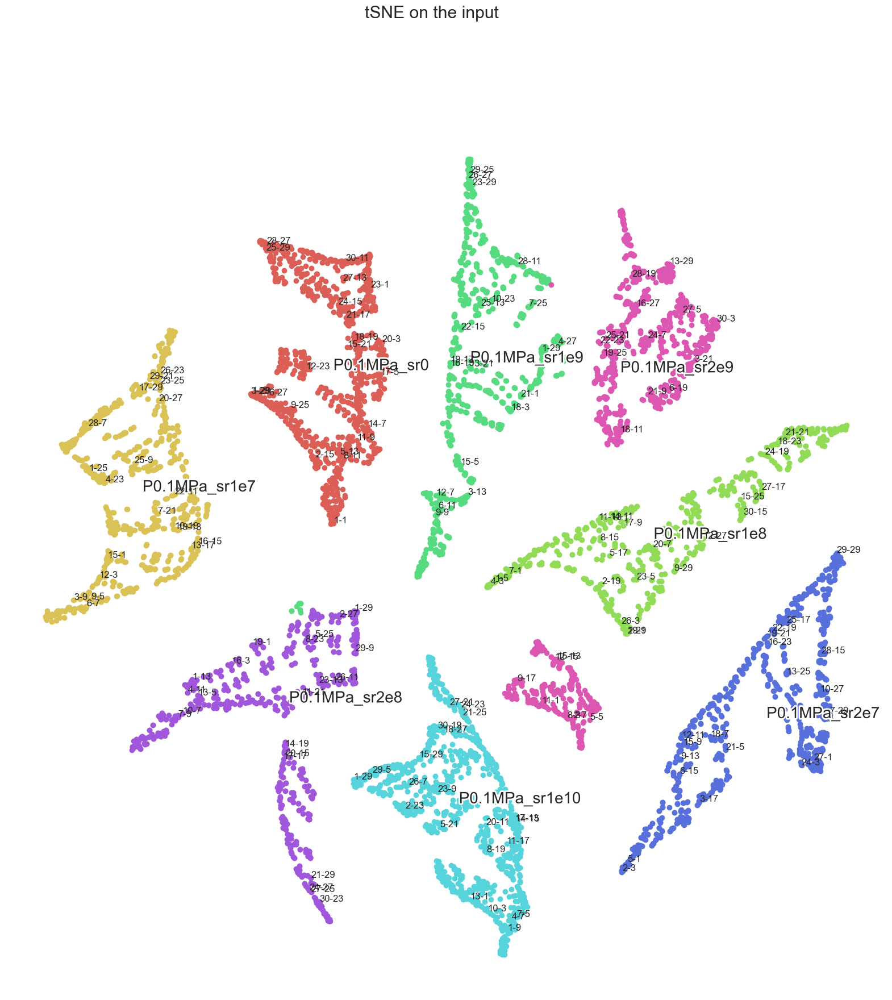

In [96]:
# initializing TSNE for 2 n_components.
tsne = TSNE(n_components=2, random_state=0)
tSNEResult = tsne.fit_transform(arr_transformed)

titleText = "tSNE on the input" 
scatterPlot(tSNEResult, ylabel_selected, ylabel_text_selected, pairlabel_selected, titleText)

(<Figure size 2000x2000 with 1 Axes>,
 <module 'matplotlib.pyplot' from 'C:\\Users\\jc\\anaconda3\\lib\\site-packages\\matplotlib\\pyplot.py'>,
 [Text(-0.0529944890673911, 0.24580029041736695, 'P0.1MPa_sr0'),
  Text(-0.1370912736381627, 0.15940690240944583, 'P0.1MPa_sr1e7'),
  Text(-0.44703625730450514, -0.40493604103766256, 'P0.1MPa_sr1e8'),
  Text(0.09297104391709199, -0.086839097009027, 'P0.1MPa_sr1e9'),
  Text(0.6017138757541431, -0.06888251777445858, 'P0.1MPa_sr1e10'),
  Text(-0.018413126492574594, 0.20975253411578693, 'P0.1MPa_sr2e7'),
  Text(-0.40246216301331, -0.027305269317289528, 'P0.1MPa_sr2e8'),
  Text(0.35465846278980306, -0.06638203419553931, 'P0.1MPa_sr2e9')])

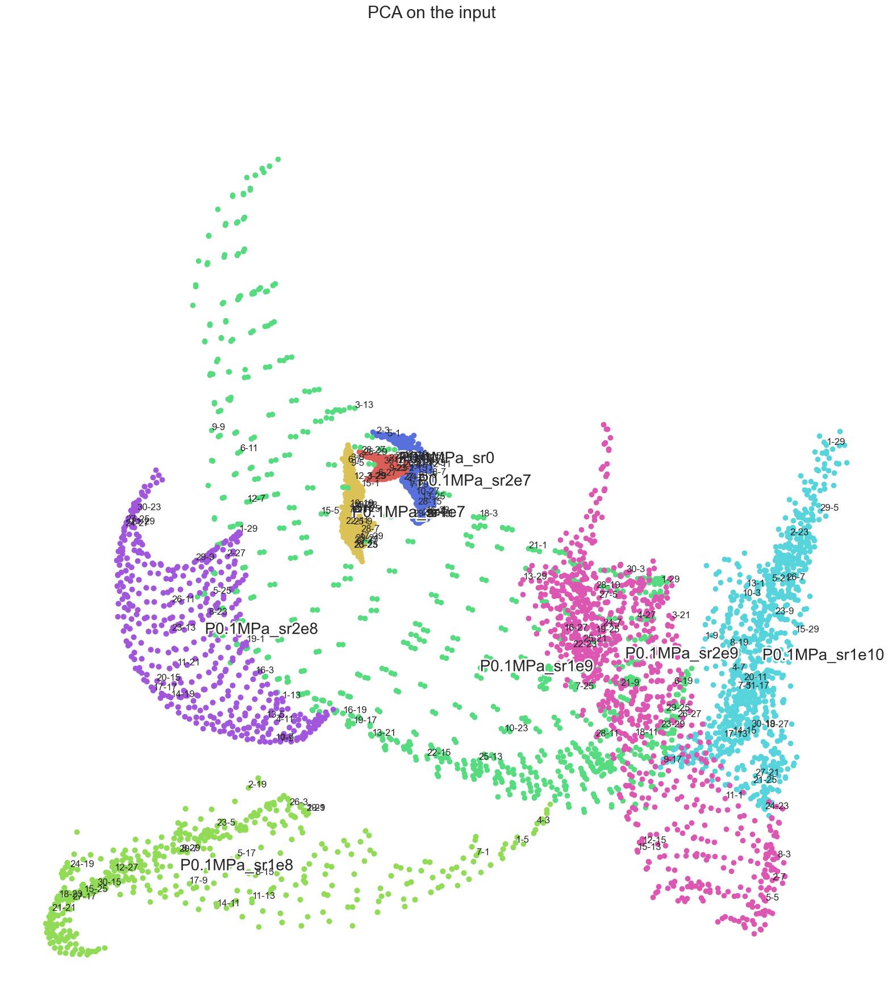

In [97]:
# initializing PCA for 2 n_components.
pca = PCA(n_components=2, random_state=0)
pcaResult = pca.fit_transform(arr_transformed)

# Visualizing the PCA output
titleText = "PCA on the input"
scatterPlot(pcaResult, ylabel_selected, ylabel_text_selected, pairlabel_selected, titleText)

(<Figure size 2000x2000 with 1 Axes>,
 <module 'matplotlib.pyplot' from 'C:\\Users\\jc\\anaconda3\\lib\\site-packages\\matplotlib\\pyplot.py'>,
 [Text(0.0011491755093485322, -0.012361580478762822, 'P0.1MPa_sr0'),
  Text(0.004108465143128265, -0.008208984473127186, 'P0.1MPa_sr1e7'),
  Text(0.01573068558927763, 0.019540100191619822, 'P0.1MPa_sr1e8'),
  Text(-0.00288014035374671, 0.004464076079690522, 'P0.1MPa_sr1e9'),
  Text(-0.019679031219293718, 0.004488932947681351, 'P0.1MPa_sr1e10'),
  Text(0.00014472917125928547, -0.010498476366859123, 'P0.1MPa_sr2e7'),
  Text(0.013400579326468211, 0.0006834240972773232, 'P0.1MPa_sr2e8'),
  Text(-0.01147652708231155, 0.003827440452039471, 'P0.1MPa_sr2e9')])

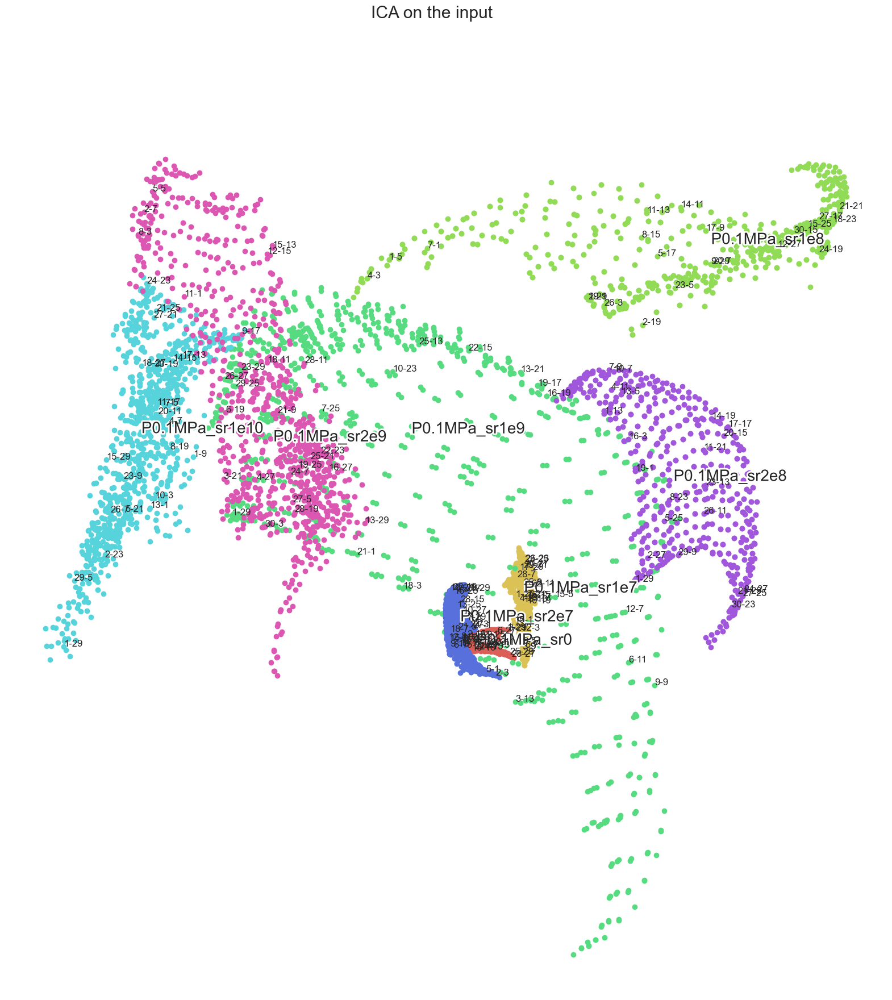

In [98]:
# initializing ICA for 2 n_components.
ICA = FastICA(n_components=2, random_state=0) 
icaResult=ICA.fit_transform(arr_transformed)

# Visualizing the PCA output
titleText = "ICA on the input"
scatterPlot(icaResult, ylabel_selected, ylabel_text_selected, pairlabel_selected, titleText)

### Clustering results on last 10 files

In [99]:
arr_controlled = average_from_time_series(arr_time_series=arr_time_series, data_limit = 100)

print_eignvalues_for_a_pair(arr_controlled, ylabel_text, pair_choise = 28)

Data for:  P0.1MPa_sr0
Distance sqd matrix: 
[[-0.00816468 -0.0025959   0.00677085]
 [-0.0025959  -0.01072797  0.00717165]
 [ 0.00677085  0.00717165  0.01889265]]
Eigen values: 
[-0.01512437 -0.00664336  0.02176773]
Eigen vectors: 
[[ 0.55999956  0.80394923  0.20016525]
 [ 0.78111797 -0.59286437  0.19587383]
 [-0.27614346 -0.04666341  0.95998298]]
Eigen vectors in degress: 
[[55.94423278 36.49110152 78.45337742]
 [38.63695003 53.63946299 78.7042251 ]
 [73.96983145 87.32541203 16.26368787]]
------------------------------------------------
Data for:  P0.1MPa_sr1e7
Distance sqd matrix: 
[[-0.05565119 -0.00232218  0.01127872]
 [-0.00232218 -0.03749442 -0.07868697]
 [ 0.01127872 -0.07868697  0.09314561]]
Eigen values: 
[-0.07483063 -0.0559336   0.13076423]
Eigen vectors: 
[[-0.14345785  0.98783811  0.05996429]
 [ 0.89246457  0.15531709 -0.42353701]
 [ 0.42769948  0.0072437   0.90389196]]
Eigen vectors in degress: 
[[81.75201315  8.944979   86.56223689]
 [26.81540431 81.06481291 64.94190388]

Data for:  P875MPa_sr2e6
Distance sqd matrix: 
[[ 0.16065137  0.08764581 -0.02060993]
 [ 0.08764581 -0.11867246 -0.04588281]
 [-0.02060993 -0.04588281 -0.04197891]]
Eigen values: 
[-0.15705722 -0.03344766  0.19050488]
Eigen vectors: 
[[ 0.23198166  0.22312358  0.94678423]
 [-0.91713106 -0.27415631  0.28932498]
 [-0.3241221   0.93544331 -0.14103433]]
Eigen vectors in degress: 
[[76.58623148 77.10743731 18.77598915]
 [23.48979857 74.08825785 73.18245234]
 [71.08760397 20.70011714 81.89229697]]
------------------------------------------------
Data for:  P875MPa_sr2e7
Distance sqd matrix: 
[[ 0.19756917  0.0320446  -0.04257874]
 [ 0.0320446  -0.27638286 -0.03082802]
 [-0.04257874 -0.03082802  0.07881368]]
Eigen values: 
[-0.28072965  0.06620521  0.21452444]
Eigen vectors: 
[[-0.05970532  0.32002038  0.94552749]
 [ 0.99514391 -0.05517501  0.08151271]
 [ 0.07825522  0.94580266 -0.31517209]]
Eigen vectors in degress: 
[[86.57710169 71.33584241 18.99843157]
 [ 5.64881074 86.83709858 85.3244782

In [126]:
start_=0
end_=8
ylabel_text[start_:end_]

['P0.1MPa_sr0',
 'P0.1MPa_sr1e7',
 'P0.1MPa_sr1e8',
 'P0.1MPa_sr1e9',
 'P0.1MPa_sr1e10',
 'P0.1MPa_sr2e7',
 'P0.1MPa_sr2e8',
 'P0.1MPa_sr2e9']

In [123]:
len(pairlabel[start_*900:end_*900])

8100

In [127]:
# Here 2* SR is ignored as they are very near
arr_selected = arr_controlled[start_*900:end_*900, 1:]
ylabel_selected = ylabel[start_*900:end_*900]
ylabel_text_selected = ylabel_text[start_:end_]
pairlabel_selected = pairlabel[start_*900:end_*900]

sc = preprocessing.MinMaxScaler() # s the probably the most famous scaling algorithm, and follows the following formula for each feature:
#sc = preprocessing.StandardScaler() # assumes your data is normally distributed within each feature
#sc = preprocessing.RobustScaler() # interquartile range, so if there are outliers in the data, you might want to consider the Robust Scaler
#sc = preprocessing.Normalizer() # The normalizer scales each value by dividing each value by its magnitude in n-dimensional space for n number of features.
arr_transformed = sc.fit_transform(arr_selected)
#arr_transformed = arr_selected

(<Figure size 2000x2000 with 1 Axes>,
 <module 'matplotlib.pyplot' from 'C:\\Users\\jc\\anaconda3\\lib\\site-packages\\matplotlib\\pyplot.py'>,
 [Text(-25.389854, 27.168312, 'P0.1MPa_sr0'),
  Text(-73.02645, 8.498509, 'P0.1MPa_sr1e7'),
  Text(20.868874, -3.6321023, 'P0.1MPa_sr1e8'),
  Text(7.367423, 61.642426, 'P0.1MPa_sr1e9'),
  Text(-1.8056424, -43.414726, 'P0.1MPa_sr1e10'),
  Text(58.72513, -34.430946, 'P0.1MPa_sr2e7'),
  Text(-41.89377, -51.08782, 'P0.1MPa_sr2e8'),
  Text(59.200497, 30.921764, 'P0.1MPa_sr2e9')])

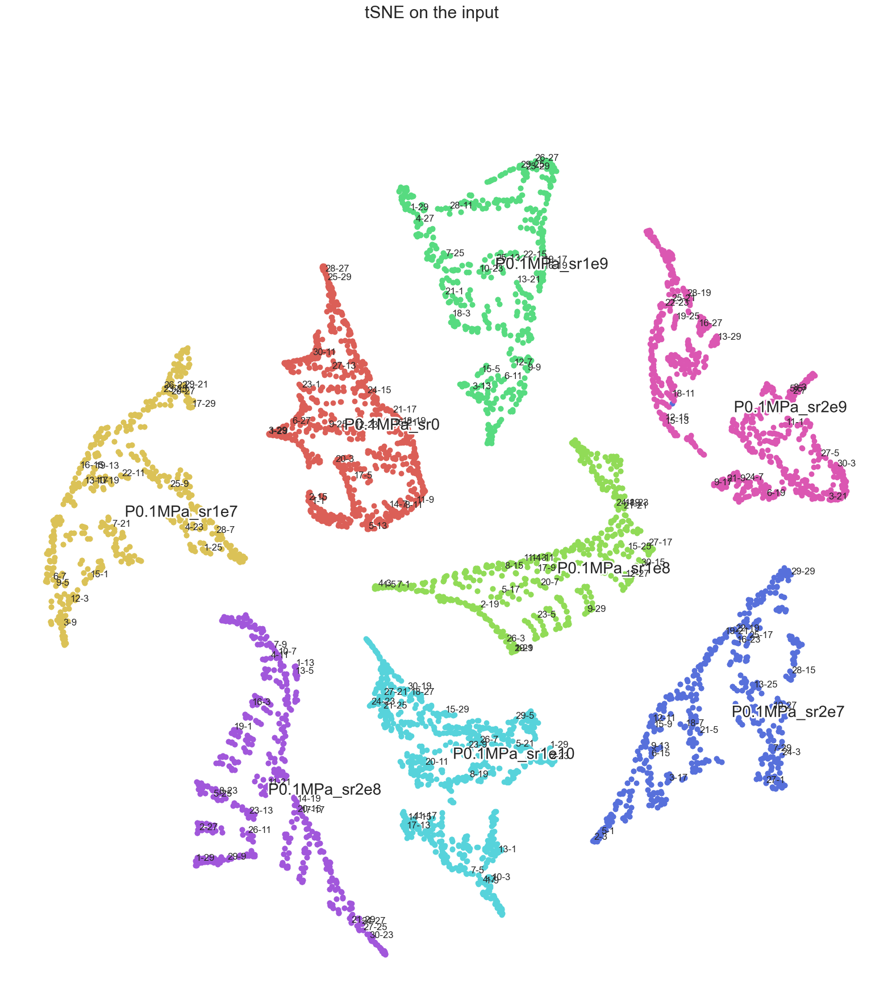

In [102]:
# initializing TSNE for 2 n_components.
tsne = TSNE(n_components=2, random_state=0)
tSNEResult = tsne.fit_transform(arr_transformed)

titleText = "tSNE on the input" 
scatterPlot(tSNEResult, ylabel_selected, ylabel_text_selected, pairlabel_selected, titleText)

(<Figure size 2000x2000 with 1 Axes>,
 <module 'matplotlib.pyplot' from 'C:\\Users\\jc\\anaconda3\\lib\\site-packages\\matplotlib\\pyplot.py'>,
 [Text(-0.009005507194752495, -0.036011072129617946, 'P0.1MPa_sr0'),
  Text(0.22456570087008576, 0.13540745909148522, 'P0.1MPa_sr1e7'),
  Text(-0.49779931289356816, 0.4253502859245945, 'P0.1MPa_sr1e8'),
  Text(-0.16723865937714477, -0.06886208869470173, 'P0.1MPa_sr1e9'),
  Text(-0.01849448582838572, -0.240703574512166, 'P0.1MPa_sr1e10'),
  Text(-0.07459575617085597, -0.24687671087268045, 'P0.1MPa_sr2e7'),
  Text(0.6371429834921593, 0.2000220369667567, 'P0.1MPa_sr2e8'),
  Text(-0.05820687665402584, -0.15647372605733081, 'P0.1MPa_sr2e9')])

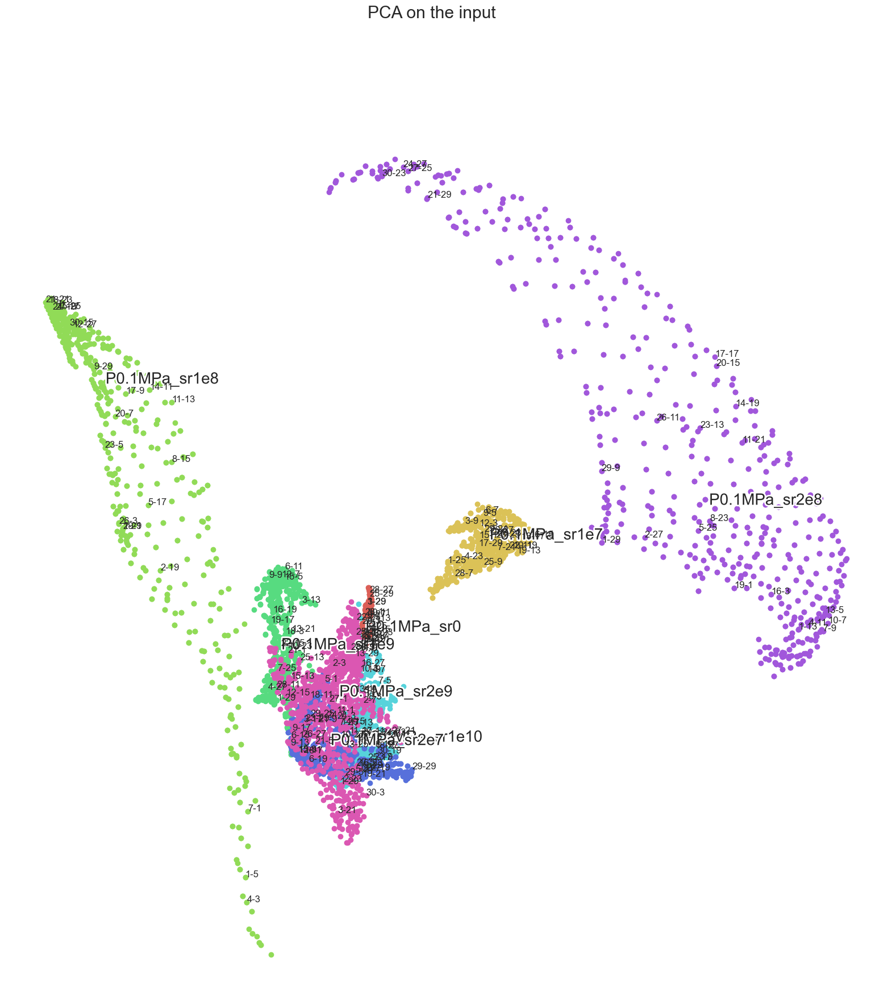

In [128]:
# initializing PCA for 2 n_components.
pca = PCA(n_components=2, random_state=0)
pcaResult = pca.fit_transform(arr_transformed)

# Visualizing the PCA output
titleText = "PCA on the input"
scatterPlot(pcaResult, ylabel_selected, ylabel_text_selected, pairlabel_selected, titleText)

(<Figure size 2000x2000 with 1 Axes>,
 <module 'matplotlib.pyplot' from 'C:\\Users\\jc\\anaconda3\\lib\\site-packages\\matplotlib\\pyplot.py'>,
 [Text(0.0013523405810779746, -0.0009295955798169877, 'P0.1MPa_sr0'),
  Text(-0.010847385716979074, -0.001718831399154855, 'P0.1MPa_sr1e7'),
  Text(0.0010303597578913632, 0.02741103130693586, 'P0.1MPa_sr1e8'),
  Text(0.006782714256485335, 0.0019311927059815913, 'P0.1MPa_sr1e9'),
  Text(0.00763270509867195, -0.007896612478306166, 'P0.1MPa_sr1e10'),
  Text(0.009153090192129495, -0.005886243413840066, 'P0.1MPa_sr2e7'),
  Text(-0.025548704507892997, -0.00933845346332236, 'P0.1MPa_sr2e8'),
  Text(0.007322866713697996, -0.0030308575572086122, 'P0.1MPa_sr2e9')])

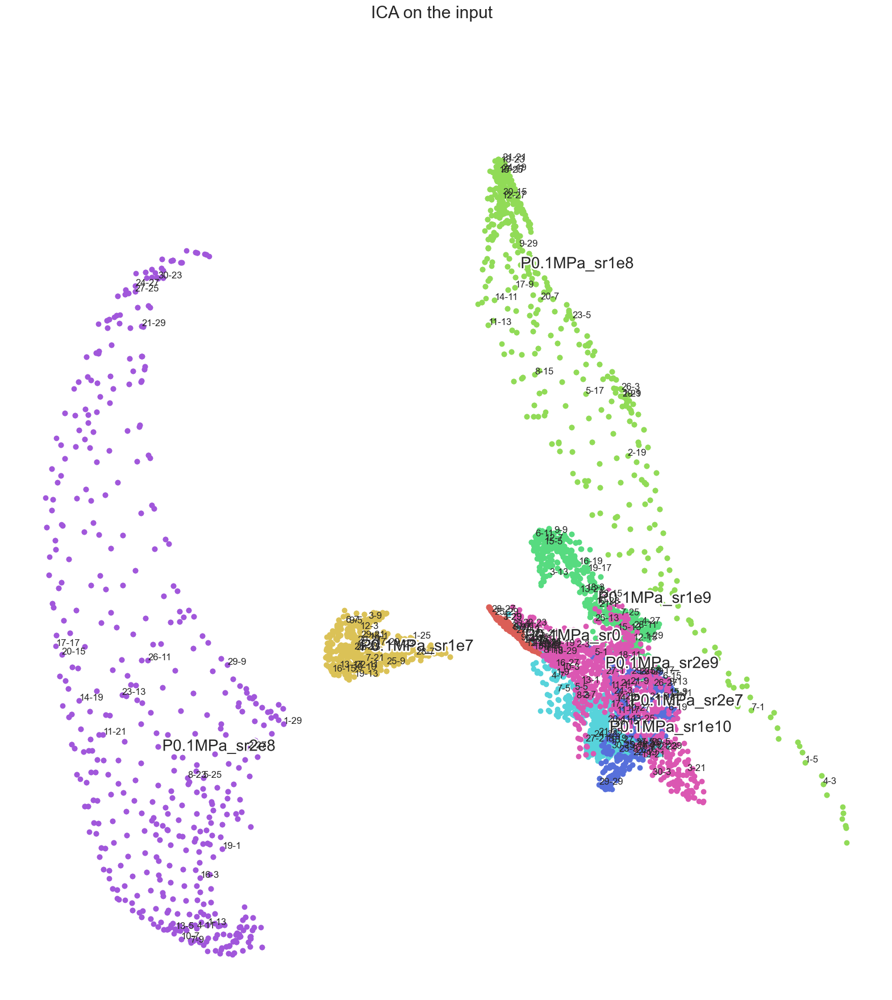

In [104]:
# initializing ICA for 2 n_components.
ICA = FastICA(n_components=2, random_state=0) 
icaResult=ICA.fit_transform(arr_transformed)

# Visualizing the PCA output
titleText = "ICA on the input"
scatterPlot(icaResult, ylabel_selected, ylabel_text_selected, pairlabel_selected, titleText)